# Fairness Data Testing

**What do we want to achieve?**
> We want to figure out if it's possible for a way that we can create a function, a way to predict the level of fairness from a specific configuration of hyperparameters of ML algorithms provided from popular ML libraries like scikit-learn.

**Why is it important?**

> Fairness has been a very important subject regarding Machine Learning. There has always been the major goal to achieve the best accuracy possible, but this can lead to a single metric that can be misleading. Discrimination on certain categories of the data can arise.

> From different features we predict the desired output, there exist cases in which some of this feature may represent something very sensitive like gender or race. This will be our protected attributes. Maybe we have achieved the best accuracy possible with our ML model, but there will be problems if by maintaing the same features and only chaning the race or gender the output is different. This may lead to biases against some gender or race. To measure the group fairness we can calculate the AOD (Average Odd Difference) which is the average of differences between the true positive rates and the false positive rates of two protected groups.

*What if we can provide a way to know the AOD by knowing the hyperparameter configuration of a ML algorithm?*


*   Time on running the experiments will be saved. In knowing AOD for a specific set of hyperparameters you don't need to run an experiment with the hyperparameters that are going to be used.
*   Easier way to calculate AOD leads to easier incorporation and awareness of the importance of group fairness in our results.


**How are we approaching this questions?**
> We have gathered a good amount of data from numerous runs of experimenting with different configurations of hyperparameters to achieve the best combination of good accuracy and the best fairness possible. This runs consists of the use of different ML-algorithms, different set of hyperparameters, different protected attributes on different datasets.
> With this data we will figure out if we can use Machine Learning to predict the AOD from any hyperparameter configuration of certain ML algorithms (currently we will be using 5 different ML algorithms which are provided by the popular ML library scikit-learn).

**Follow-up and Research Questions**

*   What is the best ML algorithm to calculate the AOD from a set of hyperparameters, protected attribute and dataset?
*   Can our ML models achieve the same performance across different protected attributes and datasets? Or is a model dependent to a specific dataset and/or protected attribute?



## Set Up and Data Recollection



### Load Libraries

Let's start by loading the libraries that we will be using. Including ML libraries and plotting tools that will help us in this project.

In [ ]:
# General libraries
import pandas as pd
import numpy as np
from google.colab import files
import io # to read bytes type into pandas dataframe
from sklearn.preprocessing import OneHotEncoder
from matplotlib import pyplot as plt
from sklearn.model_selection import train_test_split
import math
from sklearn.utils import shuffle
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
import time

# Neural Network
import tensorflow as tf

# Other ML algorithms
import sklearn
from sklearn import svm
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import RANSACRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
import xgboost

In [ ]:
print('The tf version is {}.'.format(tf.__version__))
print('The scikit-learn version is {}.'.format(sklearn.__version__))
print('XGBoost version is {}.'.format(xgboost.__version__))

The tf version is 2.15.0.
The scikit-learn version is 1.2.2.
XGBoost version is 2.0.3.


In [ ]:
!df -h

Filesystem      Size  Used Avail Use% Mounted on
overlay         226G   28G  199G  12% /
tmpfs            64M     0   64M   0% /dev
shm             5.8G     0  5.8G   0% /dev/shm
/dev/root       2.0G  1.1G  885M  55% /usr/sbin/docker-init
tmpfs           6.4G  172K  6.4G   1% /var/colab
/dev/sda1       233G   28G  205G  12% /etc/hosts
tmpfs           6.4G     0  6.4G   0% /proc/acpi
tmpfs           6.4G     0  6.4G   0% /proc/scsi
tmpfs           6.4G     0  6.4G   0% /sys/firmware


In [ ]:
!cat /proc/cpuinfo

processor	: 0
vendor_id	: GenuineIntel
cpu family	: 6
model		: 79
model name	: Intel(R) Xeon(R) CPU @ 2.20GHz
stepping	: 0
microcode	: 0xffffffff
cpu MHz		: 2200.164
cache size	: 56320 KB
physical id	: 0
siblings	: 2
core id		: 0
cpu cores	: 1
apicid		: 0
initial apicid	: 0
fpu		: yes
fpu_exception	: yes
cpuid level	: 13
wp		: yes
flags		: fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge mca cmov pat pse36 clflush mmx fxsr sse sse2 ss ht syscall nx pdpe1gb rdtscp lm constant_tsc rep_good nopl xtopology nonstop_tsc cpuid tsc_known_freq pni pclmulqdq ssse3 fma cx16 pcid sse4_1 sse4_2 x2apic movbe popcnt aes xsave avx f16c rdrand hypervisor lahf_lm abm 3dnowprefetch invpcid_single ssbd ibrs ibpb stibp fsgsbase tsc_adjust bmi1 hle avx2 smep bmi2 erms invpcid rtm rdseed adx smap xsaveopt arat md_clear arch_capabilities
bugs		: cpu_meltdown spectre_v1 spectre_v2 spec_store_bypass l1tf mds swapgs taa mmio_stale_data retbleed
bogomips	: 4400.32
clflush size	: 64
cache_alignment	: 64
addres

### Download Datasets

The data in the CSV files that we have are the result of experimenting with different hyperparameters on ML algorithms provided by libraries like Scikit-Learn. Numerous runs with 5 Machine Learning algorithms and different datasets.

This 5 algorithms are:

- Decision Tree Classifier
- Discriminant Analysis
- Logistic Regression
- Support Vector Machine
- Tree Regressor

Datasets:
-

In [ ]:
# Upload csv files that will be used for learning
uploaded = files.upload()

Saving DACENSUS_2014_race.csv to DACENSUS_2014_race.csv
Saving DACENSUS_2014_sex.csv to DACENSUS_2014_sex.csv
Saving DACENSUS_2015_race.csv to DACENSUS_2015_race.csv
Saving DACENSUS_2015_sex.csv to DACENSUS_2015_sex.csv
Saving DACENSUS_2018_race.csv to DACENSUS_2018_race.csv
Saving DACENSUS_2018_sex.csv to DACENSUS_2018_sex.csv
Saving DTCENSUS_2014_race.csv to DTCENSUS_2014_race.csv
Saving DTCENSUS_2014_sex.csv to DTCENSUS_2014_sex.csv
Saving DTCENSUS_2015_race.csv to DTCENSUS_2015_race.csv
Saving DTCENSUS_2015_sex.csv to DTCENSUS_2015_sex.csv
Saving DTCENSUS_2018_race.csv to DTCENSUS_2018_race.csv
Saving DTCENSUS_2018_sex.csv to DTCENSUS_2018_sex.csv
Saving LRCENSUS_2014_race.csv to LRCENSUS_2014_race.csv
Saving LRCENSUS_2014_sex.csv to LRCENSUS_2014_sex.csv
Saving LRCENSUS_2015_race.csv to LRCENSUS_2015_race.csv
Saving LRCENSUS_2015_sex.csv to LRCENSUS_2015_sex.csv
Saving LRCENSUS_2018_race.csv to LRCENSUS_2018_race.csv
Saving LRCENSUS_2018_sex.csv to LRCENSUS_2018_sex.csv
Saving SVM

In [ ]:
# Name of files being used
# Decision Tree Classifier
dtc_bank_age = 'Decision_Tree_Classifier_bank_age_mutation_res.csv'
dtc_census_gender = 'Decision_Tree_Classifier_census_gender_mutation_res.csv'
dtc_census_race = 'Decision_Tree_Classifier_census_race_mutation_res.csv'
dtc_compas_gender = 'Decision_Tree_Classifier_compas_gender_coverage_1628116423_res.csv'
dtc_compas_race = 'Decision_Tree_Classifier_compas_race_coverage_1628116493_res.csv'
dtc_credit_gender = 'Decision_Tree_Classifier_credit_gender_mutation_res.csv'

# Discriminant Analysis
da_bank_age = 'Discriminant_Analysis_bank_age_mutation_res.csv'
da_census_gender = 'Discriminant_Analysis_census_gender_mutation_res.csv'
da_census_race = 'Discriminant_Analysis_census_race_mutation_res.csv'
da_compas_gender = 'Discriminant_Analysis_compas_gender_random_1628114206_res.csv'
da_compas_race = 'Discriminant_Analysis_compas_race_coverage_1628114343_res.csv'
da_credit_gender = 'Discriminant_Analysis_credit_gender_mutation_res.csv'

# Logistic Regression
lr_bank_age = 'LogisticRegression_bank_age_mutation_res.csv'
lr_census_gender = 'LogisticRegression_census_gender_mutation_res.csv'
lr_census_race = 'LogisticRegression_census_race_mutation_res.csv'
lr_compas_gender = 'LogisticRegression_compas_gender_mutation_1628116237_res.csv'
lr_compas_race = 'LogisticRegression_compas_race_mutation_1628116303_res.csv'
lr_credit_gender = 'LogisticRegression_credit_gender_mutation_res.csv'

# Support Vector Machine
svm_bank_age = 'SVM_bank_age_mutation_1628264971_res.csv'
svm_census_gender = 'SVM_census_gender_mutation_1628264300_res.csv'
svm_census_race = 'SVM_census_race_mutation_1628264315_res.csv'
svm_compas_gender = 'SVM_compas_gender_mutation_1628265230_res.csv'
svm_compas_race = 'SVM_compas_race_mutation_1628265601_res.csv'
svm_credit_gender = 'SVM_credit_gender_random_1628264669_res.csv'

# Tree Regressor
tr_bank_age = 'TreeRegressor_bank_age_mutation_res.csv'
tr_census_gender = 'TreeRegressor_census_gender_mutation_res.csv'
tr_census_race = 'TreeRegressor_census_race_mutation_res.csv'
tr_compas_gender = 'TreeRegressor_compas_gender_coverage_1628114251_res.csv'
tr_compas_race = 'TreeRegressor_compas_race_mutation_1628114319_res.csv'
tr_credit_gender = 'TreeRegressor_credit_gender_mutation_res.csv'

In [ ]:
# New census data
# Logistic Regression
lr_census_2014_sex = 'LRCENSUS_2014_sex.csv'
lr_census_2015_sex = 'LRCENSUS_2015_sex.csv'
lr_census_2018_sex = 'LRCENSUS_2018_sex.csv'
lr_census_2014_race = 'LRCENSUS_2014_race.csv'
lr_census_2015_race = 'LRCENSUS_2015_race.csv'
lr_census_2018_race = 'LRCENSUS_2018_race.csv'

# Decision Tree Classifier
dtc_census_2014_sex = 'DTCENSUS_2014_sex.csv'
dtc_census_2015_sex = 'DTCENSUS_2015_sex.csv'
dtc_census_2018_sex = 'DTCENSUS_2018_sex.csv'
dtc_census_2014_race = 'DTCENSUS_2014_race.csv'
dtc_census_2015_race = 'DTCENSUS_2015_race.csv'
dtc_census_2018_race = 'DTCENSUS_2018_race.csv'

# Support Vector Machine
svm_census_2014_sex = 'SVMCENSUS_2014_sex.csv'
svm_census_2015_sex = 'SVMCENSUS_2015_sex.csv'
svm_census_2018_sex = 'SVMCENSUS_2018_sex.csv'
svm_census_2014_race = 'SVMCENSUS_2014_race.csv'
svm_census_2015_race = 'SVMCENSUS_2015_race.csv'
svm_census_2018_race = 'SVMCENSUS_2018_race.csv'

# Tree Regressor
tr_census_2014_sex = 'TRCENSUS_2014_sex.csv'
tr_census_2015_sex = 'TRCENSUS_2015_sex.csv'
tr_census_2018_sex = 'TRCENSUS_2018_sex.csv'
tr_census_2014_race = 'TRCENSUS_2014_race.csv'
tr_census_2015_race = 'TRCENSUS_2015_race.csv'
tr_census_2018_race = 'TRCENSUS_2018_race.csv'

# Discriminant Analysis
da_census_2014_sex = 'DACENSUS_2014_sex.csv'
da_census_2015_sex = 'DACENSUS_2015_sex.csv'
da_census_2018_sex = 'DACENSUS_2018_sex.csv'
da_census_2014_race = 'DACENSUS_2014_race.csv'
da_census_2015_race = 'DACENSUS_2015_race.csv'
da_census_2018_race = 'DACENSUS_2018_race.csv'

In [ ]:
# Census across states 2014
da_census_2014_sex_CA = 'DACENSUS_2014_sex_CA.csv'
da_census_2014_race_CA = 'DACENSUS_2014_race_CA.csv'

### Feature Engineering/ Prepare data for Machine Learning

As previously mentioned the data that we have consists of results coming from 5 different type of ML algorithms.

In [ ]:
"""
  Transforms downloaded data from a bytes format to Numpy arrays.
  Input: Name of files. Must be results from Decision Tree Classifier experiments.
  Output: X and Y numpy arrays
"""
def get_data_dtc(files, split=False, random_state=2001, y_col='AOD'):
  # One hot encoder that will represent categorical features
  ohe = OneHotEncoder()
  # Transforms data into a Pandas format, for easier manipulation
  training_data = pd.read_csv(io.BytesIO(uploaded[files[0]]))
  for i in range(1, len(files)-1):
    training_data = pd.concat([training_data, pd.read_csv(io.BytesIO(uploaded[files[i]]))])
  training_data = pd.concat([training_data, pd.read_csv(io.BytesIO(uploaded[files[len(files)-1]]))])

  # Columns we care about from the original dataset
  x_cols = ['max_depth', 'min_samples_split',
            'min_samples_leaf', 'min_weight_fraction_leaf']
  y_col = [y_col] # Selecting fairness notion. AOD, or EOD

  X_data = training_data[x_cols]
  X_data = X_data.replace({'max_depth': {np.nan:0}}) # Replaces nan values in max_depth column

  # Transforms data into X and Y numpys
  X_data = X_data.to_numpy()
  Y = training_data[y_col].to_numpy()

  # Will add columns that will be transformed into a One-Hot-Encoding
  X = training_data[['criterion', 'splitter', 'max_features']]
  X_ohe = ohe.fit_transform(X).toarray()

  # Append these two datasets of the X data
  X = np.hstack((X_data, X_ohe))

  # Stack numpy arrays vertically
  XY = np.column_stack((X,Y))
  num_feas = XY.shape[1]-1

  XY = np.unique(XY, axis=0)
  X = XY[:,0:num_feas] # Features
  Y = XY[:,num_feas] # Output

  if split == False:
    return X, Y
  else:
    X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=random_state)
    return X_train, X_test, y_train, y_test

In [ ]:
"""
  Transforms downloaded data from a bytes format to Numpy arrays.
  Input: Name of files. Must be results from Discriminant Analysis experiments.
  Output: X and Y numpy arrays
"""
def get_data_da(files,split=False, random_state=2001, y_col='AOD'):
  # One hot encoder that will represent categorical features
  ohe = OneHotEncoder()
  # Transforms data into a Pandas format, for easier manipulation
  #training_data = pd.concat(pd.read_csv(io.BytesIO(uploaded[file])) for file in files)
  training_data = pd.read_csv(io.BytesIO(uploaded[files[0]]))
  for i in range(1, len(files)-1):
    training_data = pd.concat([training_data, pd.read_csv(io.BytesIO(uploaded[files[i]]))])
  num_rows = training_data.shape[0]
  training_data = pd.concat([training_data, pd.read_csv(io.BytesIO(uploaded[files[len(files)-1]]))])

  # Columns we care about from the original dataset
  x_cols = ['tol', 'reg_param']
  y_col = [y_col] # Selecting fairness notion. AOD, or EOD

  X_data = training_data[x_cols]

  # Transforms data into X and Y numpys
  X_data = X_data.to_numpy()
  Y = training_data[y_col].to_numpy()

  # Will add columns that will be transformed into a One-Hot-Encoding
  X = training_data[['linear(0)_quadratic(1)', 'solver_Linear',
                     'Shrinkage_Linear', 'component', 'store_covariance',
                     'type_dataset']]
  X_ohe = ohe.fit_transform(X).toarray()

  # Append these two datasets of the X data
  X = np.hstack((X_data, X_ohe))

  # Stack numpy arrays vertically
  XY = np.column_stack((X,Y))
  num_feas = XY.shape[1]-1

  print('XY shape before: ', XY.shape)
  XY = np.unique(XY, axis=0)
  print('XY shape after: ', XY.shape)
  X = XY[:,0:num_feas] # Features
  Y = XY[:,num_feas] # Output

  if split == False:
    return X, Y
  else:
    X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=random_state)
    return X_train, X_test, y_train, y_test

In [ ]:
"""
  Transforms downloaded data from a bytes format to Numpy arrays.
  Input: Name of files. Must be results from Logistic Regression experiments.
  Output: X and Y numpy arrays
"""
def get_data_lr(files, split=False, random_state=2001, y_col='AOD'):
  # One hot encoder that will represent categorical features
  ohe = OneHotEncoder()
  # Transforms data into a Pandas format, for easier manipulation
  # training_data = pd.concat(pd.read_csv(io.BytesIO(uploaded[file])) for file in files)
  training_data = pd.read_csv(io.BytesIO(uploaded[files[0]]))
  for i in range(1, len(files)-1):
    training_data = pd.concat([training_data, pd.read_csv(io.BytesIO(uploaded[files[i]]))])
  num_rows = training_data.shape[0]
  training_data = pd.concat([training_data, pd.read_csv(io.BytesIO(uploaded[files[len(files)-1]]))])

  # Columns we care about from the original dataset
  x_cols = ['tol', 'C', 'intercept_scaling', 'max_iteration', 'l1_ratio']
  y_col = [y_col] # Selecting fairness notion. AOD, or EOD

  X_data = training_data[x_cols]
  X_data = X_data.replace({'l1_ratio': {np.nan:0}}) # Replaces nan values in l1_ratio column

  # Transforms data into X and Y numpys
  X_data = X_data.to_numpy()
  Y = training_data[y_col].to_numpy()

  # Will add columns that will be transformed into a One-Hot-Encoding
  X = training_data[['solver', 'penalty', 'dual', 'fit_intercept', 'multi_class']]
  X_ohe = ohe.fit_transform(X).toarray()

  # Append these two datasets of the X data
  X = np.hstack((X_data, X_ohe))

  # Stack numpy arrays vertically
  XY = np.column_stack((X,Y))
  num_feas = XY.shape[1]-1

  XY = np.unique(XY, axis=0)
  X = XY[:,0:num_feas] # Features
  Y = XY[:,num_feas] # Output

  if split == False:
    return X, Y
  else:
    X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=random_state)
    return X_train, X_test, y_train, y_test

In [ ]:
"""
  Transforms downloaded data from a bytes format to Numpy arrays.
  Input: Name of files. Must be results from Support Vector Machine experiments.
  Output: X and Y numpy arrays
"""
def get_data_svm(files, split=False, random_state=2001,y_col='AOD'):
  # One hot encoder that will represent categorical features
  ohe = OneHotEncoder()
  # Transforms data into a Pandas format, for easier manipulation
  #training_data = pd.concat(pd.read_csv(io.BytesIO(uploaded[file])) for file in files)
  training_data = pd.read_csv(io.BytesIO(uploaded[files[0]]))
  for i in range(1, len(files)-1):
    training_data = pd.concat([training_data, pd.read_csv(io.BytesIO(uploaded[files[i]]))])
  num_rows = training_data.shape[0]
  training_data = pd.concat([training_data, pd.read_csv(io.BytesIO(uploaded[files[len(files)-1]]))])

  training_data = training_data[training_data['AOD'].notna()]
  # Columns we care about from the original dataset
  x_cols = ['tol', 'C', 'intercept_scaling']
  y_col = [y_col] # Selecting fairness notion. AOD, or EOD
  X_data = training_data[x_cols]

  # Transforms data into X and Y numpys
  X_data = X_data.to_numpy()
  Y = training_data[y_col].to_numpy()

  # Will add columns that will be transformed into a One-Hot-Encoding
  # Not using multi_Class (all are ovr)
  X = training_data[['penalty', 'loss', 'degree', 'fit_intercept',
                     'class_weight']]
  X_ohe = ohe.fit_transform(X).toarray()

  # Append these two datasets of the X data
  X = np.hstack((X_data, X_ohe))

  # Stack numpy arrays vertically
  XY = np.column_stack((X,Y))
  num_feas = XY.shape[1]-1

  XY = np.unique(XY, axis=0)
  X = XY[:,0:num_feas] # Features
  Y = XY[:,num_feas] # Output

  if split == False:
    return X, Y
  else:
    X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=random_state)
    return X_train, X_test, y_train, y_test

In [ ]:
"""
  Transforms downloaded data from a bytes format to Numpy arrays.
  Input: Name of files. Must be results from Tree Regressor experiments.
  Output: X and Y numpy arrays
"""
def get_data_tr(files, split=False, random_state=2001,y_col='AOD'):
  # One hot encoder that will represent categorical features
  ohe = OneHotEncoder()
  # Transforms data into a Pandas format, for easier manipulation
  #training_data = pd.concat(pd.read_csv(io.BytesIO(uploaded[file])) for file in files)

  training_data = pd.read_csv(io.BytesIO(uploaded[files[0]]))
  for i in range(1, len(files)-1):
    training_data = pd.concat([training_data, pd.read_csv(io.BytesIO(uploaded[files[i]]))])
  num_rows = training_data.shape[0]
  training_data = pd.concat([training_data, pd.read_csv(io.BytesIO(uploaded[files[len(files)-1]]))])

  training_data = training_data[training_data['AOD'].notna()]
  # Columns we care about from the original dataset
  x_cols = ['max_depth', 'min_samples_split', 'min_samples_leaf',
            'min_weight_fraction_leaf', 'n_estimators', 'max_samples']
  y_col = [y_col] # Selecting fairness notion. AOD, or EOD
  X_data = training_data[x_cols]

  X_data = X_data.replace({'max_depth': {np.nan:0}}) # Replaces nan values in max_depth column
  #X_data = X_data.replace({'min_samples_split': {np.nan:0}})
  X_data = X_data.replace({'max_samples': {np.nan:0}})

  # Transforms data into X and Y numpys
  X_data = X_data.to_numpy()

  Y = training_data[y_col].to_numpy()

  # Will add columns that will be transformed into a One-Hot-Encoding
  # Not using max_leaf_nodes, min_impurity_decrease, bootstrap, ccp_alpha
  X = training_data[['criterion', 'max_features', 'oob_score', 'warm_start']]
  X_ohe = ohe.fit_transform(X).toarray()

  # Append these two datasets of the X data
  X = np.hstack((X_data, X_ohe))

  # Stack numpy arrays vertically
  XY = np.column_stack((X,Y))
  num_feas = XY.shape[1]-1

  XY = np.unique(XY, axis=0)
  X = XY[:,0:num_feas] # Features
  Y = XY[:,num_feas] # Output

  if split == False:
    return X, Y
  else:
    X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=random_state)
    return X_train, X_test, y_train, y_test

In [ ]:
X, Y = get_data_da([da_census_gender])
print('Dataset: ', da_census_gender)
print(X.shape)
print(Y.shape)

(6154, 16)
(6154,)


In [ ]:
X, Y = get_data_lr([lr_census_gender])
print('Dataset: ', lr_census_gender)
print(X.shape)
print(Y.shape)

(4509, 21)
(4509,)


In [ ]:
X, Y = get_data_svm([svm_census_gender])
print('Dataset: ', svm_census_gender)
print(X.shape)
print(Y.shape)

(1760, 13)
(1760,)


In [ ]:
X, Y = get_data_tr([tr_census_gender])
print('Dataset: ', tr_census_gender)
print(X.shape)
print(Y.shape)

(790, 16)
(790,)


In [ ]:
X, Y = get_data_dtc([dtc_compas_gender],y_col='TPR')
print('Dataset: ', dtc_compas_gender)
print(X.shape)
print(Y.shape)

Dataset:  Decision_Tree_Classifier_compas_gender_coverage_1628116423_res.csv
(25374, 12)
(25374,)


In [ ]:
X_1, Y_1 = get_data_dtc([dtc_compas_gender])

Let's see at how our data looks.

In [ ]:
print('X.shape: ', X.shape)
print('Y.shape: ', Y.shape)
print('Example of data: ')
print(X[0])
print(Y[0])
print('Example of data: ')
print(X[1])
print(Y[1])

X.shape:  (5565, 12)
Y.shape:  (5565,)
Example of data: 
[0. 2. 1. 0. 0. 1. 1. 0. 0. 0. 0. 1.]
0.0695347639421203
Example of data: 
[0.00000000e+00 2.00000000e+00 1.00000000e+00 6.07270445e-04
 0.00000000e+00 1.00000000e+00 0.00000000e+00 1.00000000e+00
 0.00000000e+00 1.00000000e+00 0.00000000e+00 0.00000000e+00]
0.1814590445287508


For these experiments we will use a 80-20 ratio split for training and testing data. 80% of data will be for training and 20% of data will be for testing.

We wil split the data with the train_test_split provided by sklearn.

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=2001)

In [ ]:
X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(X_1, Y_1, test_size=0.2, random_state=2001)

### Data Analysis

Let's see what valuable information we can gather from the data.

In [ ]:
# Shape
print('X_train.shape: ', X_train.shape)
print('X_test.shape: ', X_test.shape)
print('y_train.shape: ', y_train.shape)
print('y_test.shape: ', y_test.shape)

X_train.shape:  (4452, 12)
X_test.shape:  (1113, 12)
y_train.shape:  (4452,)
y_test.shape:  (1113,)


In [ ]:
# Shape of data 2
print('X_train_1.shape: ', X_train_1.shape)
print('X_test_1.shape: ', X_test_1.shape)
print('y_train_1.shape: ', y_train_1.shape)
print('y_test_1.shape: ', y_test_1.shape)

X_train_1.shape:  (20299, 12)
X_test_1.shape:  (5075, 12)
y_train_1.shape:  (20299,)
y_test_1.shape:  (5075,)


In [ ]:
# Basic statistics of our AOD (Y/output)
print('Maximum AOD value: ', max(Y))
print('Minimum AOD value: ', min(Y))
avg_y = sum(Y)/len(Y)
print('Average AOD value: ', avg_y)

Maximum AOD value:  0.3294548469641121
Minimum AOD value:  0.0025788097162898
Average AOD value:  0.10420153044012904


In [ ]:
# Basic statistics of our AOD 2 (Y/output)
print('Maximum AOD value: ', max(Y_1))
print('Minimum AOD value: ', min(Y_1))
avg_y_1 = sum(Y_1)/len(Y_1)
print('Average AOD value: ', avg_y_1)

Maximum AOD value:  0.0624494593012883
Minimum AOD value:  0.0068875787021872
Average AOD value:  0.018905437539275843


### Baseline Model

In order to figure out if our ML models are actually learning something valuable, we can compare them to a basline model. What is a baseline model? It is a first simple attempt to creating a model which will be a reference point for future predictions. The advantages of a baseline model is that we can have a reference point to which we can compare our ML models. If the loss of a ML model is worse than this baseline (or fairly the same loss), then that means that the model is not learning.

To create our baseline model we will compute the average value of the outputs (Y), and that value will be the prediction for all the other values we want to predict. This doesn't require any Machine Learning or any difficult process or algorithm. Is just predicting the same value regardles of the input.

The mean squared error of the predicition against the true values will be our baseline loss. The goal of our ML algorithms is to predict some Y which the loss is less than the baseline loss, if not, then we can say that our ML model is not a very good one.

In [ ]:
"""
  Errors formula: Which outputs the absolute error and the relative error.
"""
def errors(mse_data, avg_data):
  rmse_data = math.sqrt(mse_data)
  rel_rmse_data = rmse_data/avg_data
  return rmse_data, rel_rmse_data

"""
  Creates baseline model and calculates average
"""
def baseline_model(y_vector, y_vector_shape):
  avg_y = sum(y_vector)/len(y_vector)
  baseline = np.full(y_vector_shape, avg_y)
  return baseline, avg_y

In [ ]:
# Baseline model for first dataset
baseline_preds, avg = baseline_model(y_train, y_test.shape)

# Get loss for the baseline model
mse = mean_squared_error(baseline_preds, y_test)
abs_error, rel_error = errors(mse,avg)
print('mse: ', mse)
print('avg: ', avg)
print('Abs error: ', abs_error)
print('Rel error: ', rel_error)

mse:  0.00010291266884394303
avg:  0.03764091411052515
Abs error:  0.010144588155462155
Rel error:  0.269509611952424


In [ ]:
# Baseline model for second dataset
baseline_preds, avg = baseline_model(y_train_1, y_test_1.shape)

# Get loss for the baseline model
mse = mean_squared_error(baseline_preds, y_test_1)
abs_error, rel_error = errors(mse,avg)
print('mse: ', mse)
print('avg: ', avg)
print('Abs error: ', abs_error)
print('Rel error: ', rel_error)

mse:  2.6971187763103327e-05
avg:  0.01889945698163284
Abs error:  0.0051933792238872106
Rel error:  0.2747898645413104


## Neural Network Experimentation

There are different algorithms that can be used to solved a Regression problem like we have at hand in this case.

In this section there will be experimentation with different Machine Learning algorithms to see the different results and what works best within our data.

First let's try a Neural Network and experiment with the size and layers of the neural network.

**Neural Network**



*   First Neural Network created has 4 dense layers with 32 units each.
*   Second Neural Network



In [ ]:
# Neural Network model
def create_NN_model(input_dim):
  # Clear session and remove randomness.
  tf.keras.backend.clear_session()
  tf.random.set_seed(0)

  model = tf.keras.Sequential()
  # Input layer
  model.add(tf.keras.layers.Dense(units=256, input_dim = input_dim, kernel_initializer='normal'))
  # Hidden layers
  model.add(tf.keras.layers.Dense(units=128, activation='ReLU'))
  model.add(tf.keras.layers.Dense(units=64, activation='ReLU'))
  model.add(tf.keras.layers.Dense(units=32, activation='ReLU'))
  model.add(tf.keras.layers.Dense(units=16, activation='ReLU'))
  model.add(tf.keras.layers.Dense(units=8, activation='ReLU'))
  model.add(tf.keras.layers.Dense(units=4, activation='ReLU'))
  # Output layer
  model.add(tf.keras.layers.Dense(units=1, activation="linear"))

  model.compile(loss="mean_squared_error",
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["mean_squared_error"])

  return model

# Neural Network model
def create_NN_model_1(input_dim):
  # Clear session and remove randomness.
  tf.keras.backend.clear_session()
  tf.random.set_seed(0)

  model = tf.keras.Sequential()
  # Input layer
  model.add(tf.keras.layers.Dense(units=32, input_dim = input_dim, kernel_initializer='normal'))
  # Hidden layers
  model.add(tf.keras.layers.Dense(units=32, activation='ReLU'))
  model.add(tf.keras.layers.Dense(units=32, activation='ReLU'))
  model.add(tf.keras.layers.Dense(units=32, activation='ReLU'))
  # Output layer
  model.add(tf.keras.layers.Dense(units=1, activation="linear"))

  model.compile(loss="mean_squared_error",
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["mean_squared_error"])

  return model

In [ ]:
# Neural Network model. Can customize number of layer and number of units in each layer
def create_NN_model_conf(n_layers=4, n_units=32):
  # Clear session and remove randomness.
  tf.keras.backend.clear_session()
  tf.random.set_seed(0)

  model = tf.keras.Sequential()
  # Input layer
  model.add(tf.keras.layers.Dense(units=n_units, input_dim = 12, kernel_initializer='normal', activation='ReLU'))
  for i in range(n_layers):
    model.add(tf.keras.layers.Dense(units=n_units, activation='ReLU'))

  # Output layer
  model.add(tf.keras.layers.Dense(units=1))

  model.compile(loss="mean_squared_error",
                optimizer='adam',
                metrics=["mean_squared_error"])

  return model

In [ ]:
# Plot history function that tracks the loss and validation loss through the different epochs
def plot_history(history):
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.xticks(range(0, len(history['loss'] + 1)))
  plt.plot(history['loss'], label="training", marker='o')
  plt.plot(history['val_loss'], label="validation", marker='o')
  plt.legend()
  plt.show()

In [ ]:
model_1 = create_NN_model()

#callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=20)

history = model_1.fit(
  X_train,
  y_train,
  epochs=10,
  batch_size=32,
  validation_data=(X_test,y_test),
  #callbacks=[callback],
  verbose=1
  )

history = pd.DataFrame(history.history)
plot_history(history)

Epoch 1/10
20/20 [==============================] - 6s 65ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2/10
20/20 [==============================] - 0s 18ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3/10
20/20 [==============================] - 0s 17ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4/10
20/20 [==============================] - 0s 18ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 5/10
 8/20 [===========>..................] - ETA: 0s - loss: nan - mean_squared_error: nan

KeyboardInterrupt: ignored

In [ ]:
print(model_1.summary())

In [ ]:
model_2 = create_NN_model_conf(n_layers=16,n_units=256)

history = model_2.fit(
  X_train,
  y_train,
  epochs=100,
  batch_size=64,
  validation_data=(X_test,y_test),
  verbose=1
  )

history = pd.DataFrame(history.history)
plot_history(history)

In [ ]:
print(model_2.summary())

In [ ]:
model_3 = create_NN_model_conf(n_layers=8,n_units=32)

history = model_3.fit(
  X_train_1,
  y_train_1,
  epochs=100,
  batch_size=32,
  validation_data=(X_test_1,y_test_1),
  verbose=1
  )

history = pd.DataFrame(history.history)
plot_history(history)

In [ ]:
print(model_3.summary())

## ML algorithm experimentation

In this case we require a Regression problem solution. This section will provide some experimentation of different other ML algorithms to see if we can get better results (less loss and validation loss). To more accurately predict the AOD with different ML algorithms.

Some of the algorithms to try are the following:

**Support Vector Machine**

For the first ML algorithm. We can't use a normal SCM classifier, but we can use a SVR, which is a Support Vector Regressor. Note that there are different types of SVR such as:

* SVR: A normal Support Vector Regressor.
* NuSVR
* LinearSVR

In [ ]:
# Data num 1
model_svm = svm.SVR(kernel='poly', degree=4, gamma='scale', max_iter=400)

model_svm.fit(X_train, y_train)

y_pred = model_svm.predict(X_test)

# Computer the Mean square error of the results vs prediction
mse = mean_squared_error(y_pred, y_test)
print('mse: ', mse)

mse:  0.00367662871007421


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=400).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


In [ ]:
# Data num 2
model_svm = svm.SVR(kernel='poly',degree=3, gamma='auto')

model_svm.fit(X_train_1, y_train_1)

y_pred = model_svm.predict(X_test_1)

# Computer the Mean square error of the results vs prediction
mse = mean_squared_error(y_pred, y_test_1)
print('mse: ', mse)

mse:  0.0001234268245380411


In [ ]:
# Data num 1
model_svm = svm.NuSVR(kernel='rbf', gamma='auto', max_iter=50000)

model_svm.fit(X_train, y_train)

y_pred = model_svm.predict(X_test)

# Computer the Mean square error of the results vs prediction
mse = mean_squared_error(y_pred, y_test)
print('mse: ', mse)

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=50000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


mse:  0.001637428158364677


In [ ]:
# Data num 2
model_svm = svm.NuSVR(kernel='rbf', gamma='auto', max_iter=50000)

model_svm.fit(X_train_1, y_train_1)

y_pred = model_svm.predict(X_test_1)

# Computer the Mean square error of the results vs prediction
mse = mean_squared_error(y_pred, y_test_1)
print('mse: ', mse)

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=50000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


mse:  9.95916619118703e-06


In [ ]:
model_svm = svm.LinearSVR(loss='squared_epsilon_insensitive')

model_svm.fit(X_train, y_train)

y_pred = model_svm.predict(X_test)

# Computer the Mean square error of the results vs prediction
mse = mean_squared_error(y_pred, y_test)
print('mse: ', mse)

mse:  0.0020894566212888406


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


In [ ]:
model_svm = svm.LinearSVR(loss='squared_epsilon_insensitive')

model_svm.fit(X_train_1, y_train_1)

y_pred = model_svm.predict(X_test_1)

# Computer the Mean square error of the results vs prediction
mse = mean_squared_error(y_pred, y_test_1)
print('mse: ', mse)

mse:  1.1917895177337152e-05


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


**Linear Regression**

Let's try a simple Linear Regression model.

In [ ]:
reg = LinearRegression().fit(X_train, y_train)

y_pred = reg.predict(X_test)
# Computer the Mean square error of the results vs prediction
mse = mean_squared_error(y_pred, y_test)
print('mse: ', mse)

mse:  0.001925587883680701


In [ ]:
# Data num 2
reg = LinearRegression().fit(X_train_1, y_train_1)

y_pred = reg.predict(X_test_1)
# Computer the Mean square error of the results vs prediction
mse = mean_squared_error(y_pred, y_test_1)
print('mse: ', mse)

**RANSAC Regressor**

Now we will try a RANSAC Regressor algorithm.

In [ ]:
ransac = RANSACRegressor(LinearRegression(),
		max_trials=20, 		# Number of Iterations
		min_samples=5, 		# Minimum size of the sample
		loss='squared_error', 	# Metrics for loss
		residual_threshold=10 	# Threshold
		).fit(X_train, y_train)

# reg = RANSACRegressor().fit(X_train, y_train)

y_pred = ransac.predict(X_test)
# Computer the Mean square error of the results vs prediction
mse = mean_squared_error(y_pred, y_test)
print('mse: ', mse)

mse:  0.001925587883680701


**Decision Tree and Random Forest**

Now we can try a type of Decision Tree which are not for classification problems but for regression type of problems.

I will also experiment on the best hyperparameters to place on the Decision Tree Regressor algorithm to get the best results.

Overall a depth of 15 was better in the first dataset. But the results were around 0.0004 MSE loss for the depths of 20, 25, 30, 35, 40. On the next dataset a depth of 20 was better.

In [ ]:
# Build decision tree
depths = [5,10,15,20,25,30,35,40]
num_runs = 10
runs = np.zeros(shape=(len(depths),num_runs))

for i in range(len(depths)):
  for j in range(num_runs):
    depth = depths[i]
    tree = DecisionTreeRegressor(max_depth=depth)
    tree.fit(X_train,y_train)
    y_pred = tree.predict(X_test)

    # Computer the Mean square error of the results vs prediction
    mse = mean_squared_error(y_pred, y_test)
    runs[i][j] = mse

for i in range(len(depths)):
  avg_mse = sum(runs[i])/num_runs
  print('Depth: ' + str(depths[i]) + ' Average MSE: ' + str(avg_mse))

Depth: 5 Average MSE: 0.00087427609700379
Depth: 10 Average MSE: 0.00046916371417730164
Depth: 15 Average MSE: 0.0003958540906004145
Depth: 20 Average MSE: 0.0004135238725001206
Depth: 25 Average MSE: 0.00040815048971590436
Depth: 30 Average MSE: 0.00040866998081116955
Depth: 35 Average MSE: 0.000401785183187256
Depth: 40 Average MSE: 0.0004151945255315316


In [ ]:
# Build decision tree
depths = [5,10,15,20,25,30,35,40]
num_runs = 10
runs = np.zeros(shape=(len(depths),num_runs))

for i in range(len(depths)):
  for j in range(num_runs):
    depth = depths[i]
    tree = DecisionTreeRegressor(max_depth=depth)
    tree.fit(X_train_1,y_train_1)
    y_pred = tree.predict(X_test_1)

    # Computer the Mean square error of the results vs prediction
    mse = mean_squared_error(y_pred, y_test_1)
    runs[i][j] = mse

for i in range(len(depths)):
  avg_mse = sum(runs[i])/num_runs
  print('Depth: ' + str(depths[i]) + ' Average MSE: ' + str(avg_mse))

Depth: 5 Average MSE: 2.6854633285661216e-06
Depth: 10 Average MSE: 1.48315023957177e-06
Depth: 15 Average MSE: 1.8827767448491439e-06
Depth: 20 Average MSE: 1.8568313934781442e-06
Depth: 25 Average MSE: 1.915435478206611e-06
Depth: 30 Average MSE: 1.899127118094885e-06
Depth: 35 Average MSE: 1.8761462631638845e-06
Depth: 40 Average MSE: 1.9216415395383055e-06


Experimenting now on a Random Forest Regressor, we can notice that the MSE loss is better each time we increase the number of estimators and the max_depth of the trees. But this loss doesn't decrease at good rate even though the number of trees is doubled or tripled.

In [ ]:
# Build forest regressor
forest = RandomForestRegressor(n_estimators=100,
                             max_depth=30)

# train model
forest.fit(X_train,y_train)

y_pred = forest.predict(X_test)

# Computer the Mean square error of the results vs prediction
mse = mean_squared_error(y_pred, y_test)
print('mse: ', mse)

mse:  0.00027719618711340686


**XG boost**

RF is a bagging technique that trains multiple decision trees in parallel and determines the final output via a majority vote. XGBoost is a boosting technique that sequentially creates decision trees, each tree improving upon the mistakes of the previous one. The final result is a sum of outputs from all the trees.

Now let's try something similar to a Random Forest Regressor, which is XGBoost. XGBoost is a boosting technique which, similar to Random Forest, uses Decision Tree Regressors.

Random Forest trains multiple Decision Trees at the same time and the final vote is decided through a majority bote. But in XGBoost the trees


Let's install xgboost.

In [ ]:
!sudo pip install xgboost

In [ ]:
import xgboost
print(xgboost.__version__)

1.7.6


In [ ]:
# create an grading boosting regression model
gb_model = GradientBoostingRegressor()
# train model
gb_model.fit(X_train,y_train)

y_pred = gb_model.predict(X_test)

# Computer the Mean square error of the results vs prediction
mse = mean_squared_error(y_pred, y_test)
print('mse: ', mse)

mse:  0.0007035043541518012


In [ ]:
# create an XG boost regression model
xgb_model = xgboost.XGBRegressor(max_depth=30)
# train model
xgb_model.fit(X_train,y_train)

y_pred = xgb_model.predict(X_test)

# Computer the Mean square error of the results vs prediction
mse = mean_squared_error(y_pred, y_test)
print('mse: ', mse)

mse:  0.0002629788624293766


## Neural Network architecture Experimentation

So far we have tried some

In [ ]:
def nn_exp_result(dataset_name, n_layers, n_units):
  print('Dataset: ', dataset_name)
  X_d, Y_d = get_data_dtc([dataset_name])
  X_train, X_test, y_train, y_test = train_test_split(X_d, Y_d, test_size=0.2,
                                                      random_state=2001)

  # Get loss for the baseline model
  baseline_preds, avg = baseline_model(y_train, y_test.shape)
  mse = mean_squared_error(baseline_preds, y_test)
  abs_error_b, rel_error_b = errors(mse,avg)

  model = create_NN_model_conf(n_layers=n_layers,n_units=n_units)

  #callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=10)
  history = model.fit(
    X_train,
    y_train,
    epochs=100,
    batch_size=32,
    validation_data=(X_test,y_test),
    #callbacks=[callback],
    verbose=1
    )

  history = pd.DataFrame(history.history)
  # Minimum validation loss reached through the epochs
  val_loss = history.loc[:,"val_loss"]
  min_val_loss = min(val_loss)
  abs_error, rel_error = errors(min_val_loss, avg)

  return [min_val_loss, abs_error, rel_error, rel_error_b]

Neural network experimentation. 8 hidden layers and 32 units.

In [ ]:
dataset_names = [dtc_bank_age, dtc_census_gender, dtc_census_race,
                 dtc_compas_gender, dtc_compas_race, dtc_credit_gender]

num_errors = 4
results = np.zeros((len(dataset_names),num_errors))

counter = 0
for dataset in dataset_names:
  result = nn_exp_result(dataset, n_layers=8, n_units=32)
  results[counter] = result
  counter += 1
  print('Val Loss: '+str(result[0])+', Abs. Error: '+str(result[1])+
        ', Rel error: '+str(result[2])+', Baseline Rel error: '+str(result[3]))
  print('**********************************************')

Dataset:  Decision_Tree_Classifier_bank_age_mutation_res.csv
Unique XY.shape:  (2084, 13)
num_feas:  12


<ipython-input-6-c9cebd3b33ab>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_data['max_depth'] = X_data['max_depth'].replace(np.nan, 0)


Epoch 1/100
53/53 [==============================] - 3s 12ms/step - loss: 7.4874e-05 - mean_squared_error: 7.4874e-05 - val_loss: 9.4113e-05 - val_mean_squared_error: 9.4113e-05
Epoch 2/100
53/53 [==============================] - 0s 5ms/step - loss: 6.9729e-05 - mean_squared_error: 6.9729e-05 - val_loss: 9.4731e-05 - val_mean_squared_error: 9.4731e-05
Epoch 3/100
53/53 [==============================] - 0s 5ms/step - loss: 6.9609e-05 - mean_squared_error: 6.9609e-05 - val_loss: 1.0029e-04 - val_mean_squared_error: 1.0029e-04
Epoch 4/100
53/53 [==============================] - 0s 5ms/step - loss: 6.5751e-05 - mean_squared_error: 6.5751e-05 - val_loss: 9.1246e-05 - val_mean_squared_error: 9.1246e-05
Epoch 5/100
53/53 [==============================] - 0s 5ms/step - loss: 6.4735e-05 - mean_squared_error: 6.4735e-05 - val_loss: 1.0743e-04 - val_mean_squared_error: 1.0743e-04
Epoch 6/100
53/53 [==============================] - 0s 6ms/step - loss: 6.9196e-05 - mean_squared_error: 6.9196e-

<ipython-input-6-c9cebd3b33ab>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_data['max_depth'] = X_data['max_depth'].replace(np.nan, 0)


Epoch 1/100
140/140 [==============================] - 2s 4ms/step - loss: 0.0026 - mean_squared_error: 0.0026 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 2/100
140/140 [==============================] - 0s 3ms/step - loss: 0.0022 - mean_squared_error: 0.0022 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 3/100
140/140 [==============================] - 0s 3ms/step - loss: 0.0021 - mean_squared_error: 0.0021 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 4/100
140/140 [==============================] - 0s 3ms/step - loss: 0.0018 - mean_squared_error: 0.0018 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 5/100
140/140 [==============================] - 0s 3ms/step - loss: 0.0017 - mean_squared_error: 0.0017 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 6/100
140/140 [==============================] - 0s 3ms/step - loss: 0.0016 - mean_squared_error: 0.0016 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 7/100
140/140 [=

<ipython-input-6-c9cebd3b33ab>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_data['max_depth'] = X_data['max_depth'].replace(np.nan, 0)


Epoch 1/100
59/59 [==============================] - 2s 8ms/step - loss: 0.0022 - mean_squared_error: 0.0022 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 2/100
59/59 [==============================] - 0s 3ms/step - loss: 0.0018 - mean_squared_error: 0.0018 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 3/100
59/59 [==============================] - 0s 3ms/step - loss: 0.0019 - mean_squared_error: 0.0019 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 4/100
59/59 [==============================] - 0s 3ms/step - loss: 0.0018 - mean_squared_error: 0.0018 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 5/100
59/59 [==============================] - 0s 4ms/step - loss: 0.0018 - mean_squared_error: 0.0018 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 6/100
59/59 [==============================] - 0s 3ms/step - loss: 0.0018 - mean_squared_error: 0.0018 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 7/100
59/59 [===============

<ipython-input-6-c9cebd3b33ab>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_data['max_depth'] = X_data['max_depth'].replace(np.nan, 0)


Unique XY.shape:  (25374, 13)
num_feas:  12
Epoch 1/100
635/635 [==============================] - 4s 3ms/step - loss: 1.4340e-05 - mean_squared_error: 1.4340e-05 - val_loss: 1.2319e-05 - val_mean_squared_error: 1.2319e-05
Epoch 2/100
635/635 [==============================] - 2s 3ms/step - loss: 1.0535e-05 - mean_squared_error: 1.0535e-05 - val_loss: 9.4282e-06 - val_mean_squared_error: 9.4282e-06
Epoch 3/100
635/635 [==============================] - 2s 3ms/step - loss: 8.8121e-06 - mean_squared_error: 8.8121e-06 - val_loss: 7.5424e-06 - val_mean_squared_error: 7.5424e-06
Epoch 4/100
635/635 [==============================] - 2s 3ms/step - loss: 8.1790e-06 - mean_squared_error: 8.1790e-06 - val_loss: 7.4652e-06 - val_mean_squared_error: 7.4652e-06
Epoch 5/100
635/635 [==============================] - 2s 3ms/step - loss: 6.6939e-06 - mean_squared_error: 6.6939e-06 - val_loss: 5.8146e-06 - val_mean_squared_error: 5.8146e-06
Epoch 6/100
635/635 [==============================] - 3s 4ms

<ipython-input-6-c9cebd3b33ab>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_data['max_depth'] = X_data['max_depth'].replace(np.nan, 0)


Unique XY.shape:  (25473, 13)
num_feas:  12
Epoch 1/100
637/637 [==============================] - 4s 3ms/step - loss: 2.3585e-05 - mean_squared_error: 2.3585e-05 - val_loss: 1.7126e-05 - val_mean_squared_error: 1.7126e-05
Epoch 2/100
637/637 [==============================] - 3s 4ms/step - loss: 1.6556e-05 - mean_squared_error: 1.6556e-05 - val_loss: 1.3638e-05 - val_mean_squared_error: 1.3638e-05
Epoch 3/100
637/637 [==============================] - 2s 3ms/step - loss: 1.4490e-05 - mean_squared_error: 1.4490e-05 - val_loss: 1.0052e-05 - val_mean_squared_error: 1.0052e-05
Epoch 4/100
637/637 [==============================] - 2s 3ms/step - loss: 1.2959e-05 - mean_squared_error: 1.2959e-05 - val_loss: 1.5623e-05 - val_mean_squared_error: 1.5623e-05
Epoch 5/100
637/637 [==============================] - 2s 3ms/step - loss: 1.1471e-05 - mean_squared_error: 1.1471e-05 - val_loss: 1.1903e-05 - val_mean_squared_error: 1.1903e-05
Epoch 6/100
637/637 [==============================] - 2s 3ms

<ipython-input-6-c9cebd3b33ab>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_data['max_depth'] = X_data['max_depth'].replace(np.nan, 0)


Unique XY.shape:  (51024, 13)
num_feas:  12
Epoch 1/100
1276/1276 [==============================] - 6s 3ms/step - loss: 0.0014 - mean_squared_error: 0.0014 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 2/100
1276/1276 [==============================] - 4s 3ms/step - loss: 0.0011 - mean_squared_error: 0.0011 - val_loss: 8.7975e-04 - val_mean_squared_error: 8.7975e-04
Epoch 3/100
1276/1276 [==============================] - 4s 3ms/step - loss: 9.5562e-04 - mean_squared_error: 9.5562e-04 - val_loss: 8.4513e-04 - val_mean_squared_error: 8.4513e-04
Epoch 4/100
1276/1276 [==============================] - 4s 3ms/step - loss: 9.0100e-04 - mean_squared_error: 9.0100e-04 - val_loss: 7.7643e-04 - val_mean_squared_error: 7.7643e-04
Epoch 5/100
1276/1276 [==============================] - 4s 3ms/step - loss: 8.8085e-04 - mean_squared_error: 8.8085e-04 - val_loss: 7.8170e-04 - val_mean_squared_error: 7.8170e-04
Epoch 6/100
1276/1276 [==============================] - 4s 3ms/step - loss

In [ ]:
# Errors
for i in range(results.shape[0]):
  print('Dataset: ', dataset_names[i])
  print(results[i])

Dataset:  Decision_Tree_Classifier_bank_age_mutation_res.csv
[4.84368502e-05 6.95965877e-03 3.70380372e+00 5.18615508e+00]
Dataset:  Decision_Tree_Classifier_census_gender_mutation_res.csv
[0.00108811 0.03298653 0.31637055 0.45098998]
Dataset:  Decision_Tree_Classifier_census_race_mutation_res.csv
[0.00158445 0.03980518 0.56433759 0.58486757]
Dataset:  Decision_Tree_Classifier_compas_gender_coverage_1628116423_res.csv
[3.69736813e-06 1.92285416e-03 1.01724008e-01 2.76654044e-01]
Dataset:  Decision_Tree_Classifier_compas_race_coverage_1628116493_res.csv
[4.17411138e-06 2.04306421e-03 1.12241039e-01 3.46449289e-01]
Dataset:  Decision_Tree_Classifier_credit_gender_mutation_res.csv
[6.01730251e-04 2.45301906e-02 1.17907107e+00 2.23025940e+00]


Neural Network experimentation. 16 hidden layers and 64 units.

In [ ]:
dataset_names = [dtc_bank_age, dtc_census_gender, dtc_census_race,
                 dtc_compas_gender, dtc_compas_race, dtc_credit_gender]

num_errors = 4
results_1 = np.zeros((len(dataset_names),num_errors))

counter = 0
for dataset in dataset_names:
  result = nn_exp_result(dataset, n_layers=16, n_units=64)
  results_1[counter] = result
  counter += 1
  print('Val Loss: '+str(result[0])+', Abs. Error: '+str(result[1])+
        ', Rel error: '+str(result[2])+', Baseline Rel error: '+str(result[3]))
  print('**********************************************')

Dataset:  Decision_Tree_Classifier_bank_age_mutation_res.csv
Unique XY.shape:  (2084, 13)


<ipython-input-4-67ee5c07c48c>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_data['max_depth'] = X_data['max_depth'].replace(np.nan, 0)


Epoch 1/100
53/53 [==============================] - 2s 7ms/step - loss: 7.2882e-05 - mean_squared_error: 7.2882e-05 - val_loss: 9.0736e-05 - val_mean_squared_error: 9.0736e-05
Epoch 2/100
53/53 [==============================] - 0s 3ms/step - loss: 7.1594e-05 - mean_squared_error: 7.1594e-05 - val_loss: 8.7755e-05 - val_mean_squared_error: 8.7755e-05
Epoch 3/100
53/53 [==============================] - 0s 3ms/step - loss: 6.9905e-05 - mean_squared_error: 6.9905e-05 - val_loss: 8.5775e-05 - val_mean_squared_error: 8.5775e-05
Epoch 4/100
53/53 [==============================] - 0s 3ms/step - loss: 6.9741e-05 - mean_squared_error: 6.9741e-05 - val_loss: 8.4846e-05 - val_mean_squared_error: 8.4846e-05
Epoch 5/100
53/53 [==============================] - 0s 5ms/step - loss: 7.0562e-05 - mean_squared_error: 7.0562e-05 - val_loss: 8.5110e-05 - val_mean_squared_error: 8.5110e-05
Epoch 6/100
53/53 [==============================] - 0s 5ms/step - loss: 6.9759e-05 - mean_squared_error: 6.9759e-0

<ipython-input-4-67ee5c07c48c>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_data['max_depth'] = X_data['max_depth'].replace(np.nan, 0)


Epoch 1/100
140/140 [==============================] - 3s 4ms/step - loss: 0.0025 - mean_squared_error: 0.0025 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 2/100
140/140 [==============================] - 0s 3ms/step - loss: 0.0022 - mean_squared_error: 0.0022 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 3/100
140/140 [==============================] - 0s 3ms/step - loss: 0.0022 - mean_squared_error: 0.0022 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 4/100
140/140 [==============================] - 0s 3ms/step - loss: 0.0020 - mean_squared_error: 0.0020 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 5/100
140/140 [==============================] - 1s 4ms/step - loss: 0.0018 - mean_squared_error: 0.0018 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 6/100
140/140 [==============================] - 1s 4ms/step - loss: 0.0018 - mean_squared_error: 0.0018 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 7/100
140/140 [=

<ipython-input-4-67ee5c07c48c>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_data['max_depth'] = X_data['max_depth'].replace(np.nan, 0)


Epoch 1/100
59/59 [==============================] - 3s 7ms/step - loss: 0.0022 - mean_squared_error: 0.0022 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 2/100
59/59 [==============================] - 0s 4ms/step - loss: 0.0020 - mean_squared_error: 0.0020 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 3/100
59/59 [==============================] - 0s 3ms/step - loss: 0.0019 - mean_squared_error: 0.0019 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 4/100
59/59 [==============================] - 0s 4ms/step - loss: 0.0019 - mean_squared_error: 0.0019 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 5/100
59/59 [==============================] - 0s 3ms/step - loss: 0.0018 - mean_squared_error: 0.0018 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 6/100
59/59 [==============================] - 0s 3ms/step - loss: 0.0019 - mean_squared_error: 0.0019 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 7/100
59/59 [===============

<ipython-input-4-67ee5c07c48c>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_data['max_depth'] = X_data['max_depth'].replace(np.nan, 0)


Epoch 1/100
635/635 [==============================] - 4s 3ms/step - loss: 1.4790e-05 - mean_squared_error: 1.4790e-05 - val_loss: 1.1032e-05 - val_mean_squared_error: 1.1032e-05
Epoch 2/100
635/635 [==============================] - 2s 3ms/step - loss: 1.1473e-05 - mean_squared_error: 1.1473e-05 - val_loss: 1.2703e-05 - val_mean_squared_error: 1.2703e-05
Epoch 3/100
635/635 [==============================] - 2s 4ms/step - loss: 1.0071e-05 - mean_squared_error: 1.0071e-05 - val_loss: 9.3329e-06 - val_mean_squared_error: 9.3329e-06
Epoch 4/100
635/635 [==============================] - 2s 3ms/step - loss: 8.8585e-06 - mean_squared_error: 8.8585e-06 - val_loss: 6.1055e-06 - val_mean_squared_error: 6.1055e-06
Epoch 5/100
635/635 [==============================] - 2s 3ms/step - loss: 7.3113e-06 - mean_squared_error: 7.3113e-06 - val_loss: 8.1680e-06 - val_mean_squared_error: 8.1680e-06
Epoch 6/100
635/635 [==============================] - 2s 3ms/step - loss: 6.6821e-06 - mean_squared_erro

<ipython-input-4-67ee5c07c48c>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_data['max_depth'] = X_data['max_depth'].replace(np.nan, 0)


Unique XY.shape:  (25473, 13)
Epoch 1/100
637/637 [==============================] - 4s 3ms/step - loss: 2.1497e-05 - mean_squared_error: 2.1497e-05 - val_loss: 1.5485e-05 - val_mean_squared_error: 1.5485e-05
Epoch 2/100
637/637 [==============================] - 2s 3ms/step - loss: 1.7067e-05 - mean_squared_error: 1.7067e-05 - val_loss: 1.4766e-05 - val_mean_squared_error: 1.4766e-05
Epoch 3/100
637/637 [==============================] - 2s 3ms/step - loss: 1.4772e-05 - mean_squared_error: 1.4772e-05 - val_loss: 1.4575e-05 - val_mean_squared_error: 1.4575e-05
Epoch 4/100
637/637 [==============================] - 2s 3ms/step - loss: 1.3124e-05 - mean_squared_error: 1.3124e-05 - val_loss: 9.1666e-06 - val_mean_squared_error: 9.1666e-06
Epoch 5/100
637/637 [==============================] - 2s 4ms/step - loss: 1.1174e-05 - mean_squared_error: 1.1174e-05 - val_loss: 1.3075e-05 - val_mean_squared_error: 1.3075e-05
Epoch 6/100
637/637 [==============================] - 2s 3ms/step - loss: 

<ipython-input-4-67ee5c07c48c>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_data['max_depth'] = X_data['max_depth'].replace(np.nan, 0)


Unique XY.shape:  (51024, 13)
Epoch 1/100
1276/1276 [==============================] - 7s 3ms/step - loss: 0.0016 - mean_squared_error: 0.0016 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 2/100
1276/1276 [==============================] - 4s 3ms/step - loss: 0.0011 - mean_squared_error: 0.0011 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 3/100
1276/1276 [==============================] - 4s 3ms/step - loss: 9.7389e-04 - mean_squared_error: 9.7389e-04 - val_loss: 9.0675e-04 - val_mean_squared_error: 9.0675e-04
Epoch 4/100
1276/1276 [==============================] - 4s 3ms/step - loss: 9.4059e-04 - mean_squared_error: 9.4059e-04 - val_loss: 9.6852e-04 - val_mean_squared_error: 9.6852e-04
Epoch 5/100
1276/1276 [==============================] - 4s 3ms/step - loss: 9.1411e-04 - mean_squared_error: 9.1411e-04 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 6/100
1276/1276 [==============================] - 4s 3ms/step - loss: 9.6220e-04 - mean_squared_er

In [ ]:
# Errors
for i in range(results_1.shape[0]):
  print('Dataset: ', dataset_names[i])
  print(results_1[i])

Dataset:  Decision_Tree_Classifier_bank_age_mutation_res.csv
[8.48461859e-05 9.21119894e-03 4.69127669e+00 4.69865584e+00]
Dataset:  Decision_Tree_Classifier_census_gender_mutation_res.csv
[0.00124793 0.03532612 0.3380037  0.44799622]
Dataset:  Decision_Tree_Classifier_census_race_mutation_res.csv
[0.00167418 0.04091679 0.58233334 0.60175005]
Dataset:  Decision_Tree_Classifier_compas_gender_coverage_1628116423_res.csv
[3.66177278e-06 1.91357591e-03 1.01484737e-01 2.82938541e-01]
Dataset:  Decision_Tree_Classifier_compas_race_coverage_1628116493_res.csv
[4.46142758e-06 2.11220917e-03 1.15937518e-01 3.43172526e-01]
Dataset:  Decision_Tree_Classifier_credit_gender_mutation_res.csv
[6.06403046e-04 2.46252522e-02 1.17889668e+00 2.22689083e+00]


## Random Forest Regressor Experimentation

One of the algorithms with the best performance in our experimentations so far was Random Forest Regressor. Let's try and experiment with different datasets resulting from different ML algorithms.

Let's see if the loss for Decision Tree Classifier - Census - Gender dataset maintains with different type of datasets like Logistic Regression, SVM, etc.

In [ ]:
"""
  Runs single experiment in only one dataset. The dataset is split into
  80-20 to training and testing sets. It builds a model with the specified
  ML model, then it predicts using this model on the testing set and outputs the
  relevant metrics such as MSE, R^2, etc.
"""
def ml_model_result(alg, dataset_name, ml_model):
  if alg == 'svm':
    get_data = get_data_svm
  elif alg == 'dtc':
    get_data = get_data_dtc
  elif alg == 'lr':
    get_data = get_data_lr
  elif alg == 'da':
    get_data = get_data_da
  elif alg == 'tr':
    get_data = get_data_tr

  X_d, Y_d = get_data([dataset_name])
  X_train, X_test, y_train, y_test = train_test_split(X_d, Y_d, test_size=0.2,
                                                      random_state=2001)

  # Get loss for the baseline model
  baseline_preds, avg = baseline_model(y_train, y_test.shape)
  mse = mean_squared_error(baseline_preds, y_test)
  abs_error_b, rel_error_b = errors(mse,avg)

  # Build ML model
  model = ml_model
  # Train model and predict
  model.fit(X_train,y_train)
  y_pred = model.predict(X_test)
  # Compute relevant errors and metrics
  r_2 = r2_score(y_true=y_test,y_pred=y_pred)
  mse = mean_squared_error(y_pred, y_test)
  abs_error, rel_error = errors(mse, avg)

  return [mse, abs_error, rel_error, r_2, rel_error_b]

"""
  Runs Experiment on multiple datasets with a specific ML model.
    Outputs the relevant metrics and errors e.g R^2 and loss error.
"""
def run_exp(alg, datasets, ml_model):
  num_errors = 5
  results = np.zeros((len(datasets),num_errors))
  counter = 0

  for dataset in datasets:
    print('Dataset: ', dataset)
    result = ml_model_result(alg, dataset, ml_model)
    results[counter] = result
    counter += 1
    print('Val Loss: '+str(result[0])+
          ', Abs. Error: '+str(result[1])+
          ', Rel error: '+str(result[2])+
          ', R^2: '+str(result[3])+
          ', Baseline Rel error: '+str(result[4]))
    print('**********************************************')
  return results

Random Forest. 100 trees and 35 as max depth.

In [ ]:
dtc_names = [dtc_bank_age, dtc_census_gender, dtc_census_race,
                 dtc_compas_gender, dtc_compas_race, dtc_credit_gender]

model = RandomForestRegressor(n_estimators=100, max_depth=35)
results = run_exp('dtc', dtc_names, model)

Dataset:  Decision_Tree_Classifier_bank_age_mutation_res.csv
Val Loss: 2.5578189584226625e-05, Abs. Error: 0.005057488466049787, Rel error: 2.6915033064509237, R^2: 0.7281370747059049, Baseline Rel error: 5.1861550829452625
**********************************************
Dataset:  Decision_Tree_Classifier_census_gender_mutation_res.csv
Val Loss: 0.00024480944393824355, Abs. Error: 0.01564638756832527, Rel error: 0.1500629689724722, R^2: 0.8892781428116184, Baseline Rel error: 0.4509899817719283
**********************************************
Dataset:  Decision_Tree_Classifier_census_race_mutation_res.csv
Val Loss: 0.0003511708707739926, Abs. Error: 0.018739553643937003, Rel error: 0.2656798579257498, R^2: 0.7928129179563608, Baseline Rel error: 0.5848675675244646
**********************************************
Dataset:  Decision_Tree_Classifier_compas_gender_coverage_1628116423_res.csv
Val Loss: 1.4722353940339401e-06, Abs. Error: 0.0012133570760637364, Rel error: 0.06418975910932888, R^2

In [ ]:
da_names = [da_bank_age, da_census_gender, da_census_race, da_compas_gender,
            da_compas_race, da_credit_gender]

model = RandomForestRegressor(n_estimators=100, max_depth=35)
results = run_exp('da', da_names, model)

Dataset:  Discriminant_Analysis_bank_age_mutation_res.csv
Val Loss: 4.0855032650411257e-07, Abs. Error: 0.0006391794165209895, Rel error: 0.021904281447570773, R^2: 0.99641251097096, Baseline Rel error: 0.3663352067409933
**********************************************
Dataset:  Discriminant_Analysis_census_gender_mutation_res.csv
Val Loss: 4.298157926137516e-09, Abs. Error: 6.55603380569191e-05, Rel error: 0.0011325016990162572, R^2: 0.9999977684713657, Baseline Rel error: 0.7582523940972602
**********************************************
Dataset:  Discriminant_Analysis_census_race_mutation_res.csv
Val Loss: 4.382872440935589e-08, Abs. Error: 0.00020935310938544928, Rel error: 0.002766798016592672, R^2: 0.9999323733468096, Baseline Rel error: 0.33652977410298335
**********************************************
Dataset:  Discriminant_Analysis_compas_gender_random_1628114206_res.csv
Val Loss: 4.549133190291368e-10, Abs. Error: 2.1328697077626117e-05, Rel error: 0.0012750554624190763, R^2: 0

In [ ]:
lr_names = [lr_bank_age, lr_census_gender, lr_census_race,
                 lr_credit_gender]

model = RandomForestRegressor(n_estimators=100, max_depth=35)
results = run_exp('lr', lr_names, model)

Dataset:  LogisticRegression_bank_age_mutation_res.csv
Val Loss: 3.511680015678956e-05, Abs. Error: 0.005925942976167554, Rel error: 0.19113726069937925, R^2: 0.9177375855941302, Baseline Rel error: 0.6666866037349123
**********************************************
Dataset:  LogisticRegression_census_gender_mutation_res.csv
Val Loss: 1.0111690759299563e-05, Abs. Error: 0.0031798884822112176, Rel error: 0.050362727709577594, R^2: 0.9866650433399717, Baseline Rel error: 0.43612862391780005
**********************************************
Dataset:  LogisticRegression_census_race_mutation_res.csv
Val Loss: 5.354192474303569e-06, Abs. Error: 0.0023139128061151243, Rel error: 0.033767967226178586, R^2: 0.9685578621670794, Baseline Rel error: 0.1911453185008896
**********************************************
Dataset:  LogisticRegression_credit_gender_mutation_res.csv
Val Loss: 6.676909584567207e-05, Abs. Error: 0.008171235882390868, Rel error: 0.11788841970170968, R^2: 0.9129497573283396, Baselin

In [ ]:
svm_names = [svm_bank_age, svm_census_gender, svm_census_race,
              svm_compas_gender, svm_compas_race, svm_credit_gender]

model = RandomForestRegressor(n_estimators=100, max_depth=35)
results = run_exp('svm', svm_names, model)

Dataset:  SVM_bank_age_mutation_1628264971_res.csv
Val Loss: 4.525783317131888e-05, Abs. Error: 0.0067273942333803275, Rel error: 0.6165213136379035, R^2: 0.44216811253342314, Baseline Rel error: 0.8288238111809972
**********************************************
Dataset:  SVM_census_gender_mutation_1628264300_res.csv
Val Loss: 0.0012562989022561835, Abs. Error: 0.03544430705002121, Rel error: 0.23276422494394952, R^2: 0.9230644875215361, Baseline Rel error: 0.8397720788726506
**********************************************
Dataset:  SVM_census_race_mutation_1628264315_res.csv
Val Loss: 0.0015404234568451472, Abs. Error: 0.039248228709651944, Rel error: 0.35483650653286153, R^2: 0.7695470111532771, Baseline Rel error: 0.7391650522892497
**********************************************
Dataset:  SVM_compas_gender_mutation_1628265230_res.csv
Val Loss: 1.5422839998609896e-06, Abs. Error: 0.0012418872734113148, Rel error: 0.06435781189639735, R^2: 0.8711657780674438, Baseline Rel error: 0.17932

In [ ]:
tr_names = [tr_bank_age, tr_census_gender, tr_census_race,
            tr_compas_gender, tr_compas_race, tr_credit_gender]

model = RandomForestRegressor(n_estimators=100, max_depth=35)
results = run_exp('tr', tr_names, model)

Dataset:  TreeRegressor_bank_age_mutation_res.csv
Val Loss: 1.5113176286467844e-05, Abs. Error: 0.0038875668851439515, Rel error: 0.35597936831568866, R^2: 0.7093468097779907, Baseline Rel error: 0.6637571420080361
**********************************************
Dataset:  TreeRegressor_census_gender_mutation_res.csv
Val Loss: 7.134581352214582e-05, Abs. Error: 0.0084466451045457, Rel error: 0.06795685786166036, R^2: 0.8987255012450782, Baseline Rel error: 0.2183922071713824
**********************************************
Dataset:  TreeRegressor_census_race_mutation_res.csv
Val Loss: 5.8749370446515575e-05, Abs. Error: 0.007664813790726789, Rel error: 0.11072263811742471, R^2: 0.5751677048025491, Baseline Rel error: 0.1701674484270067
**********************************************
Dataset:  TreeRegressor_compas_gender_coverage_1628114251_res.csv
Val Loss: 4.459810392346887e-07, Abs. Error: 0.0006678181183785662, Rel error: 0.040930148063882364, R^2: 0.5534142395311357, Baseline Rel error:

Random Forest. 50 trees and 25 as max depth.

In [ ]:
tr_names = [tr_bank_age, tr_census_gender, tr_census_race,
            tr_compas_gender, tr_compas_race, tr_credit_gender]

model = RandomForestRegressor(n_estimators=50, max_depth=25)
results = run_exp('tr', tr_names, model)

XG Boost model with max depth of 30

In [ ]:
def xg_boost_result(dataset_name, max_d):
  print('Dataset: ', dataset_name)
  X_d, Y_d = get_data_dtc([dataset_name])
  X_train, X_test, y_train, y_test = train_test_split(X_d, Y_d, test_size=0.2,
                                                      random_state=2001)

  # Get loss for the baseline model
  baseline_preds, avg = baseline_model(y_train, y_test.shape)
  mse = mean_squared_error(baseline_preds, y_test)
  abs_error_b, rel_error_b = errors(mse,avg)

  # create an XG boost regression model
  xgb_model = xgboost.XGBRegressor(max_depth=max_d)
  # train model
  xgb_model.fit(X_train,y_train)
  y_pred = xgb_model.predict(X_test)

  # Computer the Mean square error of the results vs prediction
  mse = mean_squared_error(y_pred, y_test)
  abs_error, rel_error = errors(mse, avg)

  return [mse, abs_error, rel_error, rel_error_b]

In [ ]:
model = xgboost.XGBRegressor(max_depth=30)
results = run_exp('dtc', dtc_names, model)

Dataset:  Decision_Tree_Classifier_bank_age_mutation_res.csv
Val Loss: 2.063495441483889e-05, Abs. Error: 0.004542571343945948, Rel error: 2.4174737864640687, R^2: 0.7806772425368267, Baseline Rel error: 5.1861550829452625
**********************************************
Dataset:  Decision_Tree_Classifier_census_gender_mutation_res.csv
Val Loss: 0.0002696654659800602, Abs. Error: 0.01642149402399368, Rel error: 0.15749693898627912, R^2: 0.8780363178292475, Baseline Rel error: 0.4509899817719283
**********************************************
Dataset:  Decision_Tree_Classifier_census_race_mutation_res.csv
Val Loss: 0.0003685629305362965, Abs. Error: 0.019197992877806172, Rel error: 0.2721793761552759, R^2: 0.7825517875131145, Baseline Rel error: 0.5848675675244646
**********************************************
Dataset:  Decision_Tree_Classifier_compas_gender_coverage_1628116423_res.csv
Val Loss: 1.3770933656496411e-06, Abs. Error: 0.0011734962145868392, Rel error: 0.06208101540430766, R^2:

## RQ1

Let's test our different ML algorithms on all the different datasets.

In [ ]:
dtc_names = [dtc_census_gender, dtc_census_race, dtc_compas_gender,
             dtc_compas_race, dtc_credit_gender, dtc_bank_age]

da_names = [da_census_gender, da_census_race, da_compas_gender,
            da_compas_race, da_credit_gender, da_bank_age]

lr_names = [lr_census_gender, lr_census_race, lr_compas_gender,
            lr_compas_race, lr_credit_gender, lr_bank_age]

svm_names = [svm_census_gender, svm_census_race, svm_compas_gender,
              svm_compas_race, svm_credit_gender, svm_bank_age]

tr_names = [tr_census_gender, tr_census_race, tr_compas_gender,
            tr_compas_race, tr_credit_gender, tr_bank_age]

all_dataset_names = dtc_names + lr_names +  tr_names + svm_names + da_names
strs = set()
for dataset in all_dataset_names:
  strs.add(dataset[0:3])

for strs_ in strs:
  print(strs_)

Dis
Dec
SVM
Log
Tre


In [ ]:
# Averages from matrix
def get_results(results_multiple_runs, length, num_store_values=6):
  num_store_values = num_store_values # 3 averages and 3 stdvs
  # num datasets x num models x num runs X num values to store
  results = np.zeros((results_multiple_runs.shape[0], num_store_values * length))
  avgs = np.average(results_multiple_runs, axis=2) # Get averages of result matrix
  stds = np.std(results_multiple_runs, axis=2) # Get standard deviations of result matrix
  print('avgs', avgs)
  print('stds', stds)
  print('avgs.shape', avgs.shape)
  print('stds.shape', stds.shape)
  # Traverse datasets
  for idx_d in range(results_multiple_runs.shape[0]):
    str_values = ''
    result_values = []
    # Traverse models
    for idx_m in range(results_multiple_runs.shape[1]):
      # Averages
      rel_rmse_avg = round(avgs[idx_d][idx_m][0], 3)
      rmse_avg = round(avgs[idx_d][idx_m][1], 3)
      r_2_avg = round(avgs[idx_d][idx_m][2], 3)
      # Standard Deviations
      rel_rmse_std = stds[idx_d][idx_m][0]
      rmse_std = stds[idx_d][idx_m][1]
      r_2_std = stds[idx_d][idx_m][2]

      # Print values
      str_values += '& %.3f (%.3f) & %.3f (%.3f) & %.3f (%.3f) ' % (rel_rmse_avg, rel_rmse_std, rmse_avg, rmse_std, r_2_avg, r_2_std)
      # Store values
      result_values.extend([rel_rmse_avg, rel_rmse_std, rmse_avg, rmse_std, r_2_avg, r_2_std])

    results[idx_d] = result_values
    print('Complete: ', str_values)
  return results

In [ ]:
# Get model
def get_model(model_str, random_state):
  model = ''
  if model_str == 'svm':
    model = svm.NuSVR(kernel='rbf', gamma='auto', max_iter=10000)
  elif model_str == 'rf':
    model = RandomForestRegressor(n_estimators=100, max_depth=35)
  elif model_str == 'xgb':
    model = xgboost.XGBRegressor(max_depth=30)
  return model

### RQ1 ML algs

In [ ]:
# RQ1 model experimenation runs
def rq1_model(models, random_states, all_dataset_names, y_col='AOD', num_runs=10):
  num_to_store = 3
  # num datasets x num models x num runs X num values to store
  results = np.zeros((len(all_dataset_names), len(models), num_runs, num_to_store))

  # Traverse through datasets
  for idx_d, dataset in enumerate(all_dataset_names):
    print('Dataset: ', dataset)
    alg = dataset[0:3]
    get_data = get_data_dtc
    if alg == 'SVM' or alg == 'SVM':
      print('SVM')
      get_data = get_data_svm
    elif alg == 'Dec' or alg == 'DTC':
      print('Decision Tree')
      get_data = get_data_dtc
    elif alg == 'Log' or alg == 'LRC':
      print('Logistic Regression')
      get_data = get_data_lr
    elif alg == 'Dis' or alg == 'DAC':
      get_data = get_data_da
      print('Discriminant Analysis')
    elif alg == 'Tre' or alg == 'TRC':
      print('Tree Regressor')
      get_data = get_data_tr
    # Traverse through models
    for idx_m, model_str in enumerate(models):
      # Traverse through number of runs
      for run in range(num_runs):
        # Get data with different splitting seed
        X_train, X_test, y_train, y_test = get_data([dataset], split=True, random_state=random_states[run], y_col=y_col)
        print('X_train.shape: ', X_train.shape)
        print('y_train.shape: ', y_train.shape)
        print('X_test.shape: ', X_test.shape)
        print('y_test.shape: ', y_test.shape)

        # Get loss for the baseline model
        baseline_preds_, avg_ = baseline_model(y_train, y_test.shape)
        mse_b_ = mean_squared_error(baseline_preds_, y_test)
        rmse_b, rel_rmse_b = errors(mse_b_,avg_)
        #r_2_b = r2_score(y_true=y_test,y_pred=baseline_preds_)

        # Fit model
        model = get_model(model_str, random_states[run])
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        # Compute relevant errors and metrics
        r_2 = r2_score(y_true=y_test, y_pred=y_pred)
        mse = mean_squared_error(y_pred, y_test)
        rmse, rel_rmse = errors(mse, avg_)

        result = [rel_rmse, rmse, r_2]
        # Store result. Idx of dataset and Num of run
        results[idx_d][idx_m][run] = result
        print(
              'Rel RMSE: '+str(result[0])+
              ', RMSE: '+str(result[1])+
              ', R^2: '+str(result[2])
              )
        print('**********************************************')
  return results

In [ ]:
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq1_model_1 = rq1_model(models, random_states, dtc_names, num_runs = 10)

Dataset:  Decision_Tree_Classifier_census_gender_mutation_res.csv
Decision Tree
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.38768529010323544, Abs. Error: 0.0404221930635437, R^2: 0.26099914923607737
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.40259853494817577, Abs. Error: 0.04199083846217485, R^2: 0.19870868199817193
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.39078532369810387, Abs. Error: 0.04059519355637585, R^2: 0.2987580783164523
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.40224673237020786, Abs. Error: 0.041905471252339024, R^2: 0.16619762111377412
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4010815463346932, Abs. Error: 0.04169311127368439, R^2: 0.2416990801338853
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3655059826123, Abs. Error: 0.03829636191041266, R^2: 0.2524926823086756
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.37571978716225934, Abs. Error: 0.039185831343223954, R^2: 0.22121096646334637
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3765366313426623, Abs. Error: 0.03934102449614387, R^2: 0.23927702765741599
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.39173096860670115, Abs. Error: 0.0408782980817069, R^2: 0.22836369444319893
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.37953538128151953, Abs. Error: 0.03971652345114772, R^2: 0.2574706570456001
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)
Rel error: 0.15116923624876438, Abs. Error: 0.01576173305747255, R^2: 0.8876396378544008
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)
Rel error: 0.17455786667156137, Abs. Error: 0.018206303663402344, R^2: 0.8493653411917186
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)
Rel error: 0.18272412356726267, Abs. Error: 0.018981575596126097, R^2: 0.84668552643298
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)
Rel error: 0.16142977775359346, Abs. Error: 0.0168175161

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5949891285037553, Abs. Error: 0.04196716596510496, R^2: -0.03911466546650333
**********************************************
X_train.shape:  (1857, 12)
y_train.shape:  (1857,)
X_test.shape:  (465, 12)
y_test.shape:  (465,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6183065870980641, Abs. Error: 0.04323057946635942, R^2: -0.03481437460008707
**********************************************
X_train.shape:  (1857, 12)
y_train.shape:  (1857,)
X_test.shape:  (465, 12)
y_test.shape:  (465,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6460453951212928, Abs. Error: 0.04512756377180563, R^2: -0.07069593115924744
**********************************************
X_train.shape:  (1857, 12)
y_train.shape:  (1857,)
X_test.shape:  (465, 12)
y_test.shape:  (465,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6461043286714722, Abs. Error: 0.04519275526337403, R^2: -0.05768648146610267
**********************************************
X_train.shape:  (1857, 12)
y_train.shape:  (1857,)
X_test.shape:  (465, 12)
y_test.shape:  (465,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6042457132798699, Abs. Error: 0.04244470824520446, R^2: 0.03420980047776834
**********************************************
X_train.shape:  (1857, 12)
y_train.shape:  (1857,)
X_test.shape:  (465, 12)
y_test.shape:  (465,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.664102331000137, Abs. Error: 0.04646819298369076, R^2: -0.1593873867691986
**********************************************
X_train.shape:  (1857, 12)
y_train.shape:  (1857,)
X_test.shape:  (465, 12)
y_test.shape:  (465,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5987776494690287, Abs. Error: 0.04235261107980957, R^2: -0.09129080846740223
**********************************************
X_train.shape:  (1857, 12)
y_train.shape:  (1857,)
X_test.shape:  (465, 12)
y_test.shape:  (465,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5452279981135129, Abs. Error: 0.038603177905516504, R^2: 0.03282797832645701
**********************************************
X_train.shape:  (1857, 12)
y_train.shape:  (1857,)
X_test.shape:  (465, 12)
y_test.shape:  (465,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6691885338672919, Abs. Error: 0.04661945670642454, R^2: -0.018392405484316088
**********************************************
X_train.shape:  (1857, 12)
y_train.shape:  (1857,)
X_test.shape:  (465, 12)
y_test.shape:  (465,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6575041538063067, Abs. Error: 0.04605614306595599, R^2: -0.11010090052774824
**********************************************
X_train.shape:  (1857, 12)
y_train.shape:  (1857,)
X_test.shape:  (465, 12)
y_test.shape:  (465,)
Rel error: 0.27339994133205714, Abs. Error: 0.019284084637959876, R^2: 0.7805971587438154
**********************************************
X_train.shape:  (1857, 12)
y_train.shape:  (1857,)
X_test.shape:  (465, 12)
y_test.shape:  (465,)
Rel error: 0.20733179587974065, Abs. Error: 0.014496163981931808, R^2: 0.8836446048583788
**********************************************
X_train.shape:  (1857, 12)
y_train.shape:  (1857,)
X_test.shape:  (465, 12)
y_test.shape:  (465,)
Rel error: 0.243394250729599, Abs. Error: 0.01700157551533768, R^2: 0.8480290030038438
**********************************************
X_train.shape:  (1857, 12)
y_train.shape:  (1857,)
X_test.shape:  (465, 12)
y_test.shape:  (465,)
Rel error: 0.2074657271411173, Abs. Error: 0.014511507532390923

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.22470704624112495, Abs. Error: 0.004247560489106512, R^2: 0.34027581952584984
**********************************************
X_train.shape:  (20299, 12)
y_train.shape:  (20299,)
X_test.shape:  (5075, 12)
y_test.shape:  (5075,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.19317115759967626, Abs. Error: 0.003652147489868081, R^2: 0.49754484277190625
**********************************************
X_train.shape:  (20299, 12)
y_train.shape:  (20299,)
X_test.shape:  (5075, 12)
y_test.shape:  (5075,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.21953599114245778, Abs. Error: 0.004151880482425022, R^2: 0.3488956825591498
**********************************************
X_train.shape:  (20299, 12)
y_train.shape:  (20299,)
X_test.shape:  (5075, 12)
y_test.shape:  (5075,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.22744108766413884, Abs. Error: 0.004291752525063417, R^2: 0.33509529461665755
**********************************************
X_train.shape:  (20299, 12)
y_train.shape:  (20299,)
X_test.shape:  (5075, 12)
y_test.shape:  (5075,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.21887773023839296, Abs. Error: 0.004135227530349024, R^2: 0.3773537530977158
**********************************************
X_train.shape:  (20299, 12)
y_train.shape:  (20299,)
X_test.shape:  (5075, 12)
y_test.shape:  (5075,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.262680425987782, Abs. Error: 0.004975884884732605, R^2: 0.0409737316921146
**********************************************
X_train.shape:  (20299, 12)
y_train.shape:  (20299,)
X_test.shape:  (5075, 12)
y_test.shape:  (5075,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.31298290511402255, Abs. Error: 0.005912909183627296, R^2: -0.27725438659000234
**********************************************
X_train.shape:  (20299, 12)
y_train.shape:  (20299,)
X_test.shape:  (5075, 12)
y_test.shape:  (5075,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.21657696295226556, Abs. Error: 0.004100085789485432, R^2: 0.3542821676764357
**********************************************
X_train.shape:  (20299, 12)
y_train.shape:  (20299,)
X_test.shape:  (5075, 12)
y_test.shape:  (5075,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.22885567797152875, Abs. Error: 0.0043326438022495105, R^2: 0.27227765135035176
**********************************************
X_train.shape:  (20299, 12)
y_train.shape:  (20299,)
X_test.shape:  (5075, 12)
y_test.shape:  (5075,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.28675349504494196, Abs. Error: 0.005421073051374237, R^2: -0.0984133430986629
**********************************************
X_train.shape:  (20299, 12)
y_train.shape:  (20299,)
X_test.shape:  (5075, 12)
y_test.shape:  (5075,)
Rel error: 0.06396649075441803, Abs. Error: 0.0012091367106650942, R^2: 0.9465393700838404
**********************************************
X_train.shape:  (20299, 12)
y_train.shape:  (20299,)
X_test.shape:  (5075, 12)
y_test.shape:  (5075,)
Rel error: 0.05761549251294593, Abs. Error: 0.0010892944835726415, R^2: 0.9553016696550651
**********************************************
X_train.shape:  (20299, 12)
y_train.shape:  (20299,)
X_test.shape:  (5075, 12)
y_test.shape:  (5075,)
Rel error: 0.05815701726111303, Abs. Error: 0.0010998697007534647, R^2: 0.9543076636422648
**********************************************
X_train.shape:  (20299, 12)
y_train.shape:  (20299,)
X_test.shape:  (5075, 12)
y_test.shape:  (5075,)
Rel error: 0.05488915661996667, Abs. Err

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.25196940911544036, Abs. Error: 0.004586465753673534, R^2: 0.4710435526714958
**********************************************
X_train.shape:  (20378, 12)
y_train.shape:  (20378,)
X_test.shape:  (5095, 12)
y_test.shape:  (5095,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.28826326677503, Abs. Error: 0.0052529513609836055, R^2: 0.2957268825813659
**********************************************
X_train.shape:  (20378, 12)
y_train.shape:  (20378,)
X_test.shape:  (5095, 12)
y_test.shape:  (5095,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2917021311425075, Abs. Error: 0.005296882471963803, R^2: 0.3235727796211286
**********************************************
X_train.shape:  (20378, 12)
y_train.shape:  (20378,)
X_test.shape:  (5095, 12)
y_test.shape:  (5095,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.28259794543780575, Abs. Error: 0.00514368953109088, R^2: 0.3315665112907661
**********************************************
X_train.shape:  (20378, 12)
y_train.shape:  (20378,)
X_test.shape:  (5095, 12)
y_test.shape:  (5095,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2717767100542817, Abs. Error: 0.00494825513740911, R^2: 0.3777246216619833
**********************************************
X_train.shape:  (20378, 12)
y_train.shape:  (20378,)
X_test.shape:  (5095, 12)
y_test.shape:  (5095,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2753404640369337, Abs. Error: 0.005008097579842237, R^2: 0.3815594263869405
**********************************************
X_train.shape:  (20378, 12)
y_train.shape:  (20378,)
X_test.shape:  (5095, 12)
y_test.shape:  (5095,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2699564962997303, Abs. Error: 0.004912642892581681, R^2: 0.3973399048474566
**********************************************
X_train.shape:  (20378, 12)
y_train.shape:  (20378,)
X_test.shape:  (5095, 12)
y_test.shape:  (5095,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.27971496801994283, Abs. Error: 0.0050936442960601, R^2: 0.3445967286882742
**********************************************
X_train.shape:  (20378, 12)
y_train.shape:  (20378,)
X_test.shape:  (5095, 12)
y_test.shape:  (5095,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.26985303494313523, Abs. Error: 0.004915134530535939, R^2: 0.3873721183453227
**********************************************
X_train.shape:  (20378, 12)
y_train.shape:  (20378,)
X_test.shape:  (5095, 12)
y_test.shape:  (5095,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2955132899101404, Abs. Error: 0.005381637029147116, R^2: 0.2663033174291952
**********************************************
X_train.shape:  (20378, 12)
y_train.shape:  (20378,)
X_test.shape:  (5095, 12)
y_test.shape:  (5095,)
Rel error: 0.0636190106854448, Abs. Error: 0.0011580231696209622, R^2: 0.9662791818985105
**********************************************
X_train.shape:  (20378, 12)
y_train.shape:  (20378,)
X_test.shape:  (5095, 12)
y_test.shape:  (5095,)
Rel error: 0.06886628197299069, Abs. Error: 0.0012549334976427106, R^2: 0.9598046535481658
**********************************************
X_train.shape:  (20378, 12)
y_train.shape:  (20378,)
X_test.shape:  (5095, 12)
y_test.shape:  (5095,)
Rel error: 0.07218889098388775, Abs. Error: 0.0013108442842889474, R^2: 0.9585730832419387
**********************************************
X_train.shape:  (20378, 12)
y_train.shape:  (20378,)
X_test.shape:  (5095, 12)
y_test.shape:  (5095,)
Rel error: 0.06513888022001066, Abs. Error:

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 2.177410913373669, Abs. Error: 0.04530032671102857, R^2: 0.046819829126889534
**********************************************
X_train.shape:  (40819, 12)
y_train.shape:  (40819,)
X_test.shape:  (10205, 12)
y_test.shape:  (10205,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 2.166893775872479, Abs. Error: 0.045088674232909576, R^2: 0.039705136777239525
**********************************************
X_train.shape:  (40819, 12)
y_train.shape:  (40819,)
X_test.shape:  (10205, 12)
y_test.shape:  (10205,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 2.3338595000416507, Abs. Error: 0.048540384464185904, R^2: -0.10177768882092142
**********************************************
X_train.shape:  (40819, 12)
y_train.shape:  (40819,)
X_test.shape:  (10205, 12)
y_test.shape:  (10205,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 2.3524787158755096, Abs. Error: 0.0490221401956333, R^2: -0.11038261354440815
**********************************************
X_train.shape:  (40819, 12)
y_train.shape:  (40819,)
X_test.shape:  (10205, 12)
y_test.shape:  (10205,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 2.7443421892435467, Abs. Error: 0.05700118407724812, R^2: -0.45013866132271296
**********************************************
X_train.shape:  (40819, 12)
y_train.shape:  (40819,)
X_test.shape:  (10205, 12)
y_test.shape:  (10205,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 2.100743089638073, Abs. Error: 0.04406346750295409, R^2: 0.04676530301775528
**********************************************
X_train.shape:  (40819, 12)
y_train.shape:  (40819,)
X_test.shape:  (10205, 12)
y_test.shape:  (10205,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 2.1445451766951815, Abs. Error: 0.044786601878176166, R^2: 0.028452177205501306
**********************************************
X_train.shape:  (40819, 12)
y_train.shape:  (40819,)
X_test.shape:  (10205, 12)
y_test.shape:  (10205,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 2.3156553588822075, Abs. Error: 0.04836226509466959, R^2: -0.09931151671136096
**********************************************
X_train.shape:  (40819, 12)
y_train.shape:  (40819,)
X_test.shape:  (10205, 12)
y_test.shape:  (10205,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 2.516349924504682, Abs. Error: 0.052320462590135605, R^2: -0.2988042656790868
**********************************************
X_train.shape:  (40819, 12)
y_train.shape:  (40819,)
X_test.shape:  (10205, 12)
y_test.shape:  (10205,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 2.3224225072070164, Abs. Error: 0.04809311480843732, R^2: -0.04729907332843197
**********************************************
X_train.shape:  (40819, 12)
y_train.shape:  (40819,)
X_test.shape:  (10205, 12)
y_test.shape:  (10205,)
Rel error: 0.7340086445123035, Abs. Error: 0.015270811403075, R^2: 0.8916830162716967
**********************************************
X_train.shape:  (40819, 12)
y_train.shape:  (40819,)
X_test.shape:  (10205, 12)
y_test.shape:  (10205,)
Rel error: 0.6552195486383275, Abs. Error: 0.013633792809106392, R^2: 0.9121982738697586
**********************************************
X_train.shape:  (40819, 12)
y_train.shape:  (40819,)
X_test.shape:  (10205, 12)
y_test.shape:  (10205,)
Rel error: 0.6850416176196121, Abs. Error: 0.014247722921037181, R^2: 0.905075466539914
**********************************************
X_train.shape:  (40819, 12)
y_train.shape:  (40819,)
X_test.shape:  (10205, 12)
y_test.shape:  (10205,)
Rel error: 0.6970968326629671, Abs. Error: 

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 5.109165900034482, Abs. Error: 0.009600414589358938, R^2: 0.02037432244139792
**********************************************
X_train.shape:  (1667, 12)
y_train.shape:  (1667,)
X_test.shape:  (417, 12)
y_test.shape:  (417,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 2.91550890859843, Abs. Error: 0.006367861523450202, R^2: 0.2400177149327155
**********************************************
X_train.shape:  (1667, 12)
y_train.shape:  (1667,)
X_test.shape:  (417, 12)
y_test.shape:  (417,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 3.975598259696189, Abs. Error: 0.008214492052334035, R^2: 0.10747157829177778
**********************************************
X_train.shape:  (1667, 12)
y_train.shape:  (1667,)
X_test.shape:  (417, 12)
y_test.shape:  (417,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 3.531766535011925, Abs. Error: 0.007449026233479178, R^2: 0.0880711431932919
**********************************************
X_train.shape:  (1667, 12)
y_train.shape:  (1667,)
X_test.shape:  (417, 12)
y_test.shape:  (417,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 3.775921527749687, Abs. Error: 0.007965511334814103, R^2: -0.053800948387448644
**********************************************
X_train.shape:  (1667, 12)
y_train.shape:  (1667,)
X_test.shape:  (417, 12)
y_test.shape:  (417,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 3.6084148171226924, Abs. Error: 0.007532587030960432, R^2: 0.0880365149779585
**********************************************
X_train.shape:  (1667, 12)
y_train.shape:  (1667,)
X_test.shape:  (417, 12)
y_test.shape:  (417,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 4.989480611794709, Abs. Error: 0.009606109651559579, R^2: 0.09347912379270751
**********************************************
X_train.shape:  (1667, 12)
y_train.shape:  (1667,)
X_test.shape:  (417, 12)
y_test.shape:  (417,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 3.3262920030260563, Abs. Error: 0.007278608950758528, R^2: 0.02486713303019128
**********************************************
X_train.shape:  (1667, 12)
y_train.shape:  (1667,)
X_test.shape:  (417, 12)
y_test.shape:  (417,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 3.279727169440407, Abs. Error: 0.007111142154258244, R^2: 0.11114796857109033
**********************************************
X_train.shape:  (1667, 12)
y_train.shape:  (1667,)
X_test.shape:  (417, 12)
y_test.shape:  (417,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 3.9686788613568633, Abs. Error: 0.008224488270419208, R^2: 0.04172163056588407
**********************************************
X_train.shape:  (1667, 12)
y_train.shape:  (1667,)
X_test.shape:  (417, 12)
y_test.shape:  (417,)
Rel error: 2.68813850345378, Abs. Error: 0.005051165809002405, R^2: 0.7288163927534658
**********************************************
X_train.shape:  (1667, 12)
y_train.shape:  (1667,)
X_test.shape:  (417, 12)
y_test.shape:  (417,)
Rel error: 1.7736804883475805, Abs. Error: 0.0038739554879537457, R^2: 0.7187286480723227
**********************************************
X_train.shape:  (1667, 12)
y_train.shape:  (1667,)
X_test.shape:  (417, 12)
y_test.shape:  (417,)
Rel error: 2.3114448720956466, Abs. Error: 0.004775971889244398, R^2: 0.69829385828744
**********************************************
X_train.shape:  (1667, 12)
y_train.shape:  (1667,)
X_test.shape:  (417, 12)
y_test.shape:  (417,)
Rel error: 1.7878064089969232, Abs. Error: 0.0037707523158677075, 

In [ ]:
# Print and store results!!
results = get_results(results_rq1_model_1, length=3)
print('Results: ', results)

avgs [[[ 3.87342618e-01  4.04024847e-02  2.36517764e-01]
  [ 1.56875347e-01  1.63624309e-02  8.74543255e-01]
  [ 1.63721031e-01  1.70766107e-02  8.63375688e-01]]

 [[ 6.24449182e-01  4.38062354e-02 -5.14445175e-02]
  [ 2.33272359e-01  1.63695308e-02  8.49275652e-01]
  [ 2.30324062e-01  1.61649567e-02  8.53095287e-01]]

 [[ 2.39158248e-01  4.52211652e-03  2.19103121e-01]
  [ 5.71048163e-02  1.07977298e-03  9.56240226e-01]
  [ 5.82197591e-02  1.10086403e-03  9.54470523e-01]]

 [[ 2.77668772e-01  5.05394006e-03  3.57680584e-01]
  [ 6.75616152e-02  1.22969407e-03  9.61906127e-01]
  [ 6.58750957e-02  1.19900600e-03  9.63763007e-01]]

 [[ 2.31747012e+00  4.82578622e-02 -9.45971373e-02]
  [ 6.93680756e-01  1.44465555e-02  9.02071740e-01]
  [ 7.11807341e-01  1.48237920e-02  8.96835452e-01]]

 [[ 3.84805546e+00  7.93502418e-03  7.61386181e-02]
  [ 2.16788275e+00  4.46421001e-03  7.06263208e-01]
  [ 2.03853576e+00  4.20583114e-03  7.34377788e-01]]]
stds [[[1.21017031e-02 1.19267413e-03 3.4463186

In [ ]:
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq1_model_2 = rq1_model(models, random_states, lr_names, num_runs = 10)

Dataset:  LogisticRegression_census_gender_mutation_res.csv
Logistic Regression
X_train.shape:  (3607, 21)
y_train.shape:  (3607,)
X_test.shape:  (902, 21)
y_test.shape:  (902,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.21857618850223548, Abs. Error: 0.013800839150571023, R^2: 0.7488236081194072
**********************************************
X_train.shape:  (3607, 21)
y_train.shape:  (3607,)
X_test.shape:  (902, 21)
y_test.shape:  (902,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2101593721795353, Abs. Error: 0.013203442494825404, R^2: 0.760998423467997
**********************************************
X_train.shape:  (3607, 21)
y_train.shape:  (3607,)
X_test.shape:  (902, 21)
y_test.shape:  (902,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.22040758269940117, Abs. Error: 0.013904897557114493, R^2: 0.7341521537115551
**********************************************
X_train.shape:  (3607, 21)
y_train.shape:  (3607,)
X_test.shape:  (902, 21)
y_test.shape:  (902,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.21775818061729724, Abs. Error: 0.013741135393896563, R^2: 0.7348794200774136
**********************************************
X_train.shape:  (3607, 21)
y_train.shape:  (3607,)
X_test.shape:  (902, 21)
y_test.shape:  (902,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2355197851888754, Abs. Error: 0.014817066957353006, R^2: 0.7187899692650375
**********************************************
X_train.shape:  (3607, 21)
y_train.shape:  (3607,)
X_test.shape:  (902, 21)
y_test.shape:  (902,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2108673213650253, Abs. Error: 0.013372044494430076, R^2: 0.7560282674008505
**********************************************
X_train.shape:  (3607, 21)
y_train.shape:  (3607,)
X_test.shape:  (902, 21)
y_test.shape:  (902,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2174193863685853, Abs. Error: 0.0136955391032976, R^2: 0.7620093231997449
**********************************************
X_train.shape:  (3607, 21)
y_train.shape:  (3607,)
X_test.shape:  (902, 21)
y_test.shape:  (902,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.20458835926816818, Abs. Error: 0.012946246277527442, R^2: 0.7731439643621678
**********************************************
X_train.shape:  (3607, 21)
y_train.shape:  (3607,)
X_test.shape:  (902, 21)
y_test.shape:  (902,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2163450040635048, Abs. Error: 0.013618231705431841, R^2: 0.73480805665511
**********************************************
X_train.shape:  (3607, 21)
y_train.shape:  (3607,)
X_test.shape:  (902, 21)
y_test.shape:  (902,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.21807862121783303, Abs. Error: 0.013813688816288588, R^2: 0.7441414268282264
**********************************************
X_train.shape:  (3607, 21)
y_train.shape:  (3607,)
X_test.shape:  (902, 21)
y_test.shape:  (902,)
Rel error: 0.05094920964144823, Abs. Error: 0.0032169187866644402, R^2: 0.9863526596304149
**********************************************
X_train.shape:  (3607, 21)
y_train.shape:  (3607,)
X_test.shape:  (902, 21)
y_test.shape:  (902,)
Rel error: 0.05182432771761992, Abs. Error: 0.003255907760649525, R^2: 0.9854664872852192
**********************************************
X_train.shape:  (3607, 21)
y_train.shape:  (3607,)
X_test.shape:  (902, 21)
y_test.shape:  (902,)
Rel error: 0.058398518199363494, Abs. Error: 0.003684199078381535, R^2: 0.9813369019253563
**********************************************
X_train.shape:  (3607, 21)
y_train.shape:  (3607,)
X_test.shape:  (902, 21)
y_test.shape:  (902,)
Rel error: 0.044362835807091404, Abs. Error: 0.00279941599

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.12765831452414259, Abs. Error: 0.008747645566164993, R^2: 0.5506337573602627
**********************************************
X_train.shape:  (1800, 21)
y_train.shape:  (1800,)
X_test.shape:  (450, 21)
y_test.shape:  (450,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.12979852371392603, Abs. Error: 0.008933465188095598, R^2: 0.5231088567171092
**********************************************
X_train.shape:  (1800, 21)
y_train.shape:  (1800,)
X_test.shape:  (450, 21)
y_test.shape:  (450,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.12328353337194879, Abs. Error: 0.0084857604145022, R^2: 0.629180144038259
**********************************************
X_train.shape:  (1800, 21)
y_train.shape:  (1800,)
X_test.shape:  (450, 21)
y_test.shape:  (450,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.13133041371600965, Abs. Error: 0.009062823387409491, R^2: 0.5644156185685327
**********************************************
X_train.shape:  (1800, 21)
y_train.shape:  (1800,)
X_test.shape:  (450, 21)
y_test.shape:  (450,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.15476436134675783, Abs. Error: 0.010644047813062527, R^2: 0.49851244692338004
**********************************************
X_train.shape:  (1800, 21)
y_train.shape:  (1800,)
X_test.shape:  (450, 21)
y_test.shape:  (450,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.12173660957356992, Abs. Error: 0.008379707471920399, R^2: 0.5687405399169871
**********************************************
X_train.shape:  (1800, 21)
y_train.shape:  (1800,)
X_test.shape:  (450, 21)
y_test.shape:  (450,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.10203032526745448, Abs. Error: 0.007003388228864384, R^2: 0.697770769161475
**********************************************
X_train.shape:  (1800, 21)
y_train.shape:  (1800,)
X_test.shape:  (450, 21)
y_test.shape:  (450,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.12800032316141616, Abs. Error: 0.008808736754288166, R^2: 0.5630427021369993
**********************************************
X_train.shape:  (1800, 21)
y_train.shape:  (1800,)
X_test.shape:  (450, 21)
y_test.shape:  (450,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1615082419502259, Abs. Error: 0.011135029566555876, R^2: 0.3662918138628123
**********************************************
X_train.shape:  (1800, 21)
y_train.shape:  (1800,)
X_test.shape:  (450, 21)
y_test.shape:  (450,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.12163967341219395, Abs. Error: 0.008372056267017617, R^2: 0.6431011718017847
**********************************************
X_train.shape:  (1800, 21)
y_train.shape:  (1800,)
X_test.shape:  (450, 21)
y_test.shape:  (450,)
Rel error: 0.03646431884418284, Abs. Error: 0.002498677334488997, R^2: 0.9633361183320124
**********************************************
X_train.shape:  (1800, 21)
y_train.shape:  (1800,)
X_test.shape:  (450, 21)
y_test.shape:  (450,)
Rel error: 0.05432619659099823, Abs. Error: 0.003739034714423724, R^2: 0.9164592533029942
**********************************************
X_train.shape:  (1800, 21)
y_train.shape:  (1800,)
X_test.shape:  (450, 21)
y_test.shape:  (450,)
Rel error: 0.024564495005499228, Abs. Error: 0.0016908050379364895, R^2: 0.9852779422963358
**********************************************
X_train.shape:  (1800, 21)
y_train.shape:  (1800,)
X_test.shape:  (450, 21)
y_test.shape:  (450,)
Rel error: 0.04259999243909718, Abs. Error: 0.002939731908

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2657123327068819, Abs. Error: 0.006516239897662356, R^2: 0.5043392996961328
**********************************************
X_train.shape:  (48037, 21)
y_train.shape:  (48037,)
X_test.shape:  (12010, 21)
y_test.shape:  (12010,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2733062614621921, Abs. Error: 0.006707811867007338, R^2: 0.4751990605818672
**********************************************
X_train.shape:  (48037, 21)
y_train.shape:  (48037,)
X_test.shape:  (12010, 21)
y_test.shape:  (12010,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2668448962467186, Abs. Error: 0.006544339550011516, R^2: 0.5043378150188331
**********************************************
X_train.shape:  (48037, 21)
y_train.shape:  (48037,)
X_test.shape:  (12010, 21)
y_test.shape:  (12010,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.26297250663496036, Abs. Error: 0.00645449391463681, R^2: 0.5104671033662496
**********************************************
X_train.shape:  (48037, 21)
y_train.shape:  (48037,)
X_test.shape:  (12010, 21)
y_test.shape:  (12010,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.26047130724974227, Abs. Error: 0.006394759456652257, R^2: 0.5209054692827524
**********************************************
X_train.shape:  (48037, 21)
y_train.shape:  (48037,)
X_test.shape:  (12010, 21)
y_test.shape:  (12010,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2744296418569526, Abs. Error: 0.006734884651723077, R^2: 0.4667379904414509
**********************************************
X_train.shape:  (48037, 21)
y_train.shape:  (48037,)
X_test.shape:  (12010, 21)
y_test.shape:  (12010,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.265198943767244, Abs. Error: 0.006511150137479653, R^2: 0.49834539804445077
**********************************************
X_train.shape:  (48037, 21)
y_train.shape:  (48037,)
X_test.shape:  (12010, 21)
y_test.shape:  (12010,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.26585537358420813, Abs. Error: 0.006514076367673348, R^2: 0.5100761216352265
**********************************************
X_train.shape:  (48037, 21)
y_train.shape:  (48037,)
X_test.shape:  (12010, 21)
y_test.shape:  (12010,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.27005132412039834, Abs. Error: 0.006623692039779206, R^2: 0.49871888399821784
**********************************************
X_train.shape:  (48037, 21)
y_train.shape:  (48037,)
X_test.shape:  (12010, 21)
y_test.shape:  (12010,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.25825910866475604, Abs. Error: 0.006336721216440356, R^2: 0.5284886854191487
**********************************************
X_train.shape:  (48037, 21)
y_train.shape:  (48037,)
X_test.shape:  (12010, 21)
y_test.shape:  (12010,)
Rel error: 0.009828990140142635, Abs. Error: 0.00024104284905579213, R^2: 0.9993217670877435
**********************************************
X_train.shape:  (48037, 21)
y_train.shape:  (48037,)
X_test.shape:  (12010, 21)
y_test.shape:  (12010,)
Rel error: 0.007400088277997467, Abs. Error: 0.00018162189077735433, R^2: 0.9996152583156546
**********************************************
X_train.shape:  (48037, 21)
y_train.shape:  (48037,)
X_test.shape:  (12010, 21)
y_test.shape:  (12010,)
Rel error: 0.008049947799834648, Abs. Error: 0.00019742401860771544, R^2: 0.9995489194369942
**********************************************
X_train.shape:  (48037, 21)
y_train.shape:  (48037,)
X_test.shape:  (12010, 21)
y_test.shape:  (12010,)
Rel error: 0.00999309187283

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3137085034410527, Abs. Error: 0.005803479225866584, R^2: 0.3099080650641336
**********************************************
X_train.shape:  (44392, 21)
y_train.shape:  (44392,)
X_test.shape:  (11099, 21)
y_test.shape:  (11099,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.33847979362161434, Abs. Error: 0.006268525275167884, R^2: 0.1825921444812164
**********************************************
X_train.shape:  (44392, 21)
y_train.shape:  (44392,)
X_test.shape:  (11099, 21)
y_test.shape:  (11099,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.31430149864477425, Abs. Error: 0.005821335944900418, R^2: 0.28898545927410046
**********************************************
X_train.shape:  (44392, 21)
y_train.shape:  (44392,)
X_test.shape:  (11099, 21)
y_test.shape:  (11099,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3189572798118214, Abs. Error: 0.00591619587531236, R^2: 0.23425683460807956
**********************************************
X_train.shape:  (44392, 21)
y_train.shape:  (44392,)
X_test.shape:  (11099, 21)
y_test.shape:  (11099,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.319285395453215, Abs. Error: 0.005914451878907766, R^2: 0.25902630680761063
**********************************************
X_train.shape:  (44392, 21)
y_train.shape:  (44392,)
X_test.shape:  (11099, 21)
y_test.shape:  (11099,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.30466578202741373, Abs. Error: 0.005639184337694993, R^2: 0.3435662599185523
**********************************************
X_train.shape:  (44392, 21)
y_train.shape:  (44392,)
X_test.shape:  (11099, 21)
y_test.shape:  (11099,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.31219237113773163, Abs. Error: 0.005777010916428816, R^2: 0.31490973937021105
**********************************************
X_train.shape:  (44392, 21)
y_train.shape:  (44392,)
X_test.shape:  (11099, 21)
y_test.shape:  (11099,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3179236732849064, Abs. Error: 0.005894513038732241, R^2: 0.23960819792110688
**********************************************
X_train.shape:  (44392, 21)
y_train.shape:  (44392,)
X_test.shape:  (11099, 21)
y_test.shape:  (11099,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.32283066651960707, Abs. Error: 0.00597786876158706, R^2: 0.2525840512009173
**********************************************
X_train.shape:  (44392, 21)
y_train.shape:  (44392,)
X_test.shape:  (11099, 21)
y_test.shape:  (11099,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3217937567106208, Abs. Error: 0.005961730760384424, R^2: 0.24373789532313206
**********************************************
X_train.shape:  (44392, 21)
y_train.shape:  (44392,)
X_test.shape:  (11099, 21)
y_test.shape:  (11099,)
Rel error: 0.003861467711021605, Abs. Error: 7.14355760091132e-05, R^2: 0.9998954415382375
**********************************************
X_train.shape:  (44392, 21)
y_train.shape:  (44392,)
X_test.shape:  (11099, 21)
y_test.shape:  (11099,)
Rel error: 0.004747968860803599, Abs. Error: 8.793069297049129e-05, R^2: 0.9998391618622402
**********************************************
X_train.shape:  (44392, 21)
y_train.shape:  (44392,)
X_test.shape:  (11099, 21)
y_test.shape:  (11099,)
Rel error: 0.0077825379431649315, Abs. Error: 0.00014414429478206578, R^2: 0.9995640586424707
**********************************************
X_train.shape:  (44392, 21)
y_train.shape:  (44392,)
X_test.shape:  (11099, 21)
y_test.shape:  (11099,)
Rel error: 0.0089362441794485

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2449939090012365, Abs. Error: 0.016981337312549232, R^2: 0.6240429195066144
**********************************************
X_train.shape:  (16335, 17)
y_train.shape:  (16335,)
X_test.shape:  (4084, 17)
y_test.shape:  (4084,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2410495089539907, Abs. Error: 0.01669010656859499, R^2: 0.6366793414911108
**********************************************
X_train.shape:  (16335, 17)
y_train.shape:  (16335,)
X_test.shape:  (4084, 17)
y_test.shape:  (4084,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2413126374816998, Abs. Error: 0.016736223916212038, R^2: 0.6422055420108511
**********************************************
X_train.shape:  (16335, 17)
y_train.shape:  (16335,)
X_test.shape:  (4084, 17)
y_test.shape:  (4084,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.23565101025903776, Abs. Error: 0.016341101708177947, R^2: 0.6567558343113371
**********************************************
X_train.shape:  (16335, 17)
y_train.shape:  (16335,)
X_test.shape:  (4084, 17)
y_test.shape:  (4084,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.23923420587973065, Abs. Error: 0.016566562338077347, R^2: 0.6429991632245893
**********************************************
X_train.shape:  (16335, 17)
y_train.shape:  (16335,)
X_test.shape:  (4084, 17)
y_test.shape:  (4084,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2371399478043232, Abs. Error: 0.016454438519518166, R^2: 0.6459509740050746
**********************************************
X_train.shape:  (16335, 17)
y_train.shape:  (16335,)
X_test.shape:  (4084, 17)
y_test.shape:  (4084,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.233628750716132, Abs. Error: 0.016171804803351064, R^2: 0.6583171672043276
**********************************************
X_train.shape:  (16335, 17)
y_train.shape:  (16335,)
X_test.shape:  (4084, 17)
y_test.shape:  (4084,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.22687043759382408, Abs. Error: 0.015710856410903227, R^2: 0.6785894817990172
**********************************************
X_train.shape:  (16335, 17)
y_train.shape:  (16335,)
X_test.shape:  (4084, 17)
y_test.shape:  (4084,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.247159131798546, Abs. Error: 0.01708029000586487, R^2: 0.6162213082474588
**********************************************
X_train.shape:  (16335, 17)
y_train.shape:  (16335,)
X_test.shape:  (4084, 17)
y_test.shape:  (4084,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2376894517991866, Abs. Error: 0.01645571824904059, R^2: 0.6487401325784846
**********************************************
X_train.shape:  (16335, 17)
y_train.shape:  (16335,)
X_test.shape:  (4084, 17)
y_test.shape:  (4084,)
Rel error: 0.1193412263504266, Abs. Error: 0.008271934711404007, R^2: 0.9107909967747277
**********************************************
X_train.shape:  (16335, 17)
y_train.shape:  (16335,)
X_test.shape:  (4084, 17)
y_test.shape:  (4084,)
Rel error: 0.11683868071485173, Abs. Error: 0.00808983200557827, R^2: 0.9146406932238674
**********************************************
X_train.shape:  (16335, 17)
y_train.shape:  (16335,)
X_test.shape:  (4084, 17)
y_test.shape:  (4084,)
Rel error: 0.1159244616634444, Abs. Error: 0.008039934286130689, R^2: 0.917429740006423
**********************************************
X_train.shape:  (16335, 17)
y_train.shape:  (16335,)
X_test.shape:  (4084, 17)
y_test.shape:  (4084,)
Rel error: 0.10988207508407595, Abs. Error: 0.0076

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.38763813466101193, Abs. Error: 0.012018177266870166, R^2: 0.6616519118310773
**********************************************
X_train.shape:  (1312, 21)
y_train.shape:  (1312,)
X_test.shape:  (328, 21)
y_test.shape:  (328,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.43253595309359955, Abs. Error: 0.013698274133319187, R^2: 0.5541382731589145
**********************************************
X_train.shape:  (1312, 21)
y_train.shape:  (1312,)
X_test.shape:  (328, 21)
y_test.shape:  (328,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.41193010908717564, Abs. Error: 0.01286004343980784, R^2: 0.6353198080957634
**********************************************
X_train.shape:  (1312, 21)
y_train.shape:  (1312,)
X_test.shape:  (328, 21)
y_test.shape:  (328,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.41116462394657144, Abs. Error: 0.012754640522572675, R^2: 0.6260825924320759
**********************************************
X_train.shape:  (1312, 21)
y_train.shape:  (1312,)
X_test.shape:  (328, 21)
y_test.shape:  (328,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.37503501292380487, Abs. Error: 0.011749023850245524, R^2: 0.670305383321094
**********************************************
X_train.shape:  (1312, 21)
y_train.shape:  (1312,)
X_test.shape:  (328, 21)
y_test.shape:  (328,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.40126203087067996, Abs. Error: 0.01239277036135065, R^2: 0.6514766990027363
**********************************************
X_train.shape:  (1312, 21)
y_train.shape:  (1312,)
X_test.shape:  (328, 21)
y_test.shape:  (328,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.41151695549257544, Abs. Error: 0.012708317336443556, R^2: 0.6480130847222203
**********************************************
X_train.shape:  (1312, 21)
y_train.shape:  (1312,)
X_test.shape:  (328, 21)
y_test.shape:  (328,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.42570236905945086, Abs. Error: 0.013137943431377601, R^2: 0.6179072426492689
**********************************************
X_train.shape:  (1312, 21)
y_train.shape:  (1312,)
X_test.shape:  (328, 21)
y_test.shape:  (328,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3605536372461444, Abs. Error: 0.011145094140498071, R^2: 0.7327313846113759
**********************************************
X_train.shape:  (1312, 21)
y_train.shape:  (1312,)
X_test.shape:  (328, 21)
y_test.shape:  (328,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4003407862729413, Abs. Error: 0.012454213682225507, R^2: 0.6650287959699825
**********************************************
X_train.shape:  (1312, 21)
y_train.shape:  (1312,)
X_test.shape:  (328, 21)
y_test.shape:  (328,)
Rel error: 0.19535971021938894, Abs. Error: 0.006056854107695582, R^2: 0.9140628906015899
**********************************************
X_train.shape:  (1312, 21)
y_train.shape:  (1312,)
X_test.shape:  (328, 21)
y_test.shape:  (328,)
Rel error: 0.148229813335085, Abs. Error: 0.004694390381359428, R^2: 0.947636714047401
**********************************************
X_train.shape:  (1312, 21)
y_train.shape:  (1312,)
X_test.shape:  (328, 21)
y_test.shape:  (328,)
Rel error: 0.18695519968096186, Abs. Error: 0.005836553182584458, R^2: 0.9248826604848949
**********************************************
X_train.shape:  (1312, 21)
y_train.shape:  (1312,)
X_test.shape:  (328, 21)
y_test.shape:  (328,)
Rel error: 0.1561229000382485, Abs. Error: 0.004843051545183918,

NameError: ignored

In [ ]:
# Print and store results!!
results_2 = get_results(results_rq1_model_2, length=3)
print('Results: ', results_2)

avgs [[[2.16971980e-01 1.36913132e-02 7.46777461e-01]
  [5.34882333e-02 3.37549499e-03 9.84302497e-01]
  [5.28421760e-02 3.33499448e-03 9.84642284e-01]]

 [[1.30175032e-01 8.95726607e-03 5.60479782e-01]
  [4.43941163e-02 3.05503623e-03 9.40089521e-01]
  [5.14416942e-02 3.53992101e-03 9.20287166e-01]]

 [[2.66310170e-01 6.53381691e-03 5.01761583e-01]
  [8.35320217e-03 2.04946645e-04 9.99500775e-01]
  [1.11697667e-02 2.74052838e-04 9.99113928e-01]]

 [[3.18413872e-01 5.89742960e-03 2.66917495e-01]
  [6.97841933e-03 1.29260398e-04 9.99626104e-01]
  [1.12508506e-02 2.08387364e-04 9.99051861e-01]]

 [[2.38472899e-01 1.65188440e-02 6.45050186e-01]
  [1.13197184e-01 7.84106835e-03 9.19965853e-01]
  [1.16204919e-01 8.04945570e-03 9.15656331e-01]]

 [[4.01767961e-01 1.24918498e-02 6.46265518e-01]
  [1.71908739e-01 5.34413673e-03 9.34805439e-01]
  [1.82464223e-01 5.67325905e-03 9.25888257e-01]]]
stds [[[7.73218281e-03 4.73585007e-04 1.56642230e-02]
  [8.09157521e-03 5.13289072e-04 4.90546682e-03

In [ ]:
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq1_model_3 = rq1_model(models, random_states, tr_names, num_runs = 10)
# Print and store results
results_3 = get_results(results_rq1_model_3, length=3)
print('Results: ', results_3)

Dataset:  TreeRegressor_census_gender_mutation_res.csv
Tree Regressor
X_train.shape:  (623, 16)
y_train.shape:  (623,)
X_test.shape:  (156, 16)
y_test.shape:  (156,)
Rel error: 0.2150513447404061, Abs. Error: 0.026729640619572045, R^2: -0.014186551647123569
**********************************************
X_train.shape:  (623, 16)
y_train.shape:  (623,)
X_test.shape:  (156, 16)
y_test.shape:  (156,)
Rel error: 0.23393741305357063, Abs. Error: 0.028623334333579324, R^2: 0.0602118282029217
**********************************************
X_train.shape:  (623, 16)
y_train.shape:  (623,)
X_test.shape:  (156, 16)
y_test.shape:  (156,)
Rel error: 0.21103374409515227, Abs. Error: 0.026026536411634545, R^2: 0.11377003823579068
**********************************************
X_train.shape:  (623, 16)
y_train.shape:  (623,)
X_test.shape:  (156, 16)
y_test.shape:  (156,)
Rel error: 0.19351107359357822, Abs. Error: 0.023898156042520335, R^2: 0.13997462838546726
*****************************************

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.0496378975184427, Abs. Error: 0.000748706201833265, R^2: -0.28739688496344784
**********************************************
X_train.shape:  (18181, 16)
y_train.shape:  (18181,)
X_test.shape:  (4546, 16)
y_test.shape:  (4546,)
Rel error: 0.03930648183059954, Abs. Error: 0.000592926551678873, R^2: -0.31368323276680554
**********************************************
X_train.shape:  (18181, 16)
y_train.shape:  (18181,)
X_test.shape:  (4546, 16)
y_test.shape:  (4546,)
Rel error: 0.053091466327935884, Abs. Error: 0.00080071160661559, R^2: -0.3161246856543394
**********************************************
X_train.shape:  (18181, 16)
y_train.shape:  (18181,)
X_test.shape:  (4546, 16)
y_test.shape:  (4546,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.04187394616500201, Abs. Error: 0.0006316821166037564, R^2: -0.48591245740972977
**********************************************
X_train.shape:  (18181, 16)
y_train.shape:  (18181,)
X_test.shape:  (4546, 16)
y_test.shape:  (4546,)
Rel error: 0.04578563626303661, Abs. Error: 0.0006906866008753033, R^2: -0.6937056067839296
**********************************************
X_train.shape:  (18181, 16)
y_train.shape:  (18181,)
X_test.shape:  (4546, 16)
y_test.shape:  (4546,)
Rel error: 0.055991413579058395, Abs. Error: 0.0008442713373029553, R^2: -0.08359369971448216
**********************************************
X_train.shape:  (18181, 16)
y_train.shape:  (18181,)
X_test.shape:  (4546, 16)
y_test.shape:  (4546,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.049143045312122505, Abs. Error: 0.0007413687312533178, R^2: -1.3117336824159058
**********************************************
X_train.shape:  (18181, 16)
y_train.shape:  (18181,)
X_test.shape:  (4546, 16)
y_test.shape:  (4546,)
Rel error: 0.019728361911657614, Abs. Error: 0.0002975488639378021, R^2: 0.8138115829882635
**********************************************
X_train.shape:  (18181, 16)
y_train.shape:  (18181,)
X_test.shape:  (4546, 16)
y_test.shape:  (4546,)
Rel error: 0.023275555187145715, Abs. Error: 0.0003510421296939722, R^2: 0.7689634768901812
**********************************************
X_train.shape:  (18181, 16)
y_train.shape:  (18181,)
X_test.shape:  (4546, 16)
y_test.shape:  (4546,)
Rel error: 0.025429437733181702, Abs. Error: 0.00038347625065423657, R^2: 0.7485021100131167
**********************************************
X_train.shape:  (18181, 16)
y_train.shape:  (18181,)
X_test.shape:  (4546, 16)
y_test.shape:  (4546,)
Rel error: 0.018628021997027722, A

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6208245192685445, Abs. Error: 0.030892695676845005, R^2: 0.03584955308370941
**********************************************
X_train.shape:  (15287, 16)
y_train.shape:  (15287,)
X_test.shape:  (3822, 16)
y_test.shape:  (3822,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6072361296075577, Abs. Error: 0.03045236248356149, R^2: 0.039250535480224835
**********************************************
X_train.shape:  (15287, 16)
y_train.shape:  (15287,)
X_test.shape:  (3822, 16)
y_test.shape:  (3822,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6326153144660166, Abs. Error: 0.0315198877367053, R^2: 0.022562810592927418
**********************************************
X_train.shape:  (15287, 16)
y_train.shape:  (15287,)
X_test.shape:  (3822, 16)
y_test.shape:  (3822,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6056268006159548, Abs. Error: 0.030299383211514614, R^2: 0.041138046385451044
**********************************************
X_train.shape:  (15287, 16)
y_train.shape:  (15287,)
X_test.shape:  (3822, 16)
y_test.shape:  (3822,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6099163772487303, Abs. Error: 0.030435992686412415, R^2: 0.043198233209148396
**********************************************
X_train.shape:  (15287, 16)
y_train.shape:  (15287,)
X_test.shape:  (3822, 16)
y_test.shape:  (3822,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6094596355929212, Abs. Error: 0.030456901360786312, R^2: 0.024178412384154635
**********************************************
X_train.shape:  (15287, 16)
y_train.shape:  (15287,)
X_test.shape:  (3822, 16)
y_test.shape:  (3822,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6168241365789024, Abs. Error: 0.030856938371214657, R^2: 0.0012600186869148322
**********************************************
X_train.shape:  (15287, 16)
y_train.shape:  (15287,)
X_test.shape:  (3822, 16)
y_test.shape:  (3822,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6177836161067294, Abs. Error: 0.030768518453135798, R^2: 0.04709614762965164
**********************************************
X_train.shape:  (15287, 16)
y_train.shape:  (15287,)
X_test.shape:  (3822, 16)
y_test.shape:  (3822,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6034535396418632, Abs. Error: 0.03012344273632868, R^2: 0.06975820641461128
**********************************************
X_train.shape:  (15287, 16)
y_train.shape:  (15287,)
X_test.shape:  (3822, 16)
y_test.shape:  (3822,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6181869187400948, Abs. Error: 0.03088452991904862, R^2: 0.018489526879737372
**********************************************
X_train.shape:  (15287, 16)
y_train.shape:  (15287,)
X_test.shape:  (3822, 16)
y_test.shape:  (3822,)
Rel error: 0.3143469018670333, Abs. Error: 0.015642138599452945, R^2: 0.7528130983730247
**********************************************
X_train.shape:  (15287, 16)
y_train.shape:  (15287,)
X_test.shape:  (3822, 16)
y_test.shape:  (3822,)
Rel error: 0.3163524593849724, Abs. Error: 0.015864800027599414, R^2: 0.7392421603710636
**********************************************
X_train.shape:  (15287, 16)
y_train.shape:  (15287,)
X_test.shape:  (3822, 16)
y_test.shape:  (3822,)
Rel error: 0.32137714299269743, Abs. Error: 0.016012529631571334, R^2: 0.7477452064385469
**********************************************
X_train.shape:  (15287, 16)
y_train.shape:  (15287,)
X_test.shape:  (3822, 16)
y_test.shape:  (3822,)
Rel error: 0.3135181254410001, Abs. Error: 0.0

In [ ]:
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq1_model_3 = rq1_model(models, random_states, svm_names, num_runs = 10)
# Print and store results
results_3 = get_results(results_rq1_model_3, length=3)
print('Results: ', results_3)

Dataset:  SVM_census_gender_mutation_1628264300_res.csv
SVM
X_train.shape:  (1408, 13)
y_train.shape:  (1408,)
X_test.shape:  (352, 13)
y_test.shape:  (352,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.28552656966340334, Abs. Error: 0.043478723624843736, R^2: 0.8842322897952267
**********************************************
X_train.shape:  (1408, 13)
y_train.shape:  (1408,)
X_test.shape:  (352, 13)
y_test.shape:  (352,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2944506813096199, Abs. Error: 0.04496455112904028, R^2: 0.8725642903829699
**********************************************
X_train.shape:  (1408, 13)
y_train.shape:  (1408,)
X_test.shape:  (352, 13)
y_test.shape:  (352,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.28912144011387253, Abs. Error: 0.04425448983886575, R^2: 0.8775948147328876
**********************************************
X_train.shape:  (1408, 13)
y_train.shape:  (1408,)
X_test.shape:  (352, 13)
y_test.shape:  (352,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.33500972043043364, Abs. Error: 0.05184485511253199, R^2: 0.8299770454461829
**********************************************
X_train.shape:  (1408, 13)
y_train.shape:  (1408,)
X_test.shape:  (352, 13)
y_test.shape:  (352,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2478049952490215, Abs. Error: 0.03822940310445168, R^2: 0.9105887793786622
**********************************************
X_train.shape:  (1408, 13)
y_train.shape:  (1408,)
X_test.shape:  (352, 13)
y_test.shape:  (352,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.281172612996807, Abs. Error: 0.04281960639942177, R^2: 0.8875988210014298
**********************************************
X_train.shape:  (1408, 13)
y_train.shape:  (1408,)
X_test.shape:  (352, 13)
y_test.shape:  (352,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2951689950305079, Abs. Error: 0.04559292494733426, R^2: 0.86881621543143
**********************************************
X_train.shape:  (1408, 13)
y_train.shape:  (1408,)
X_test.shape:  (352, 13)
y_test.shape:  (352,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2884125754902059, Abs. Error: 0.0438105610871982, R^2: 0.88205224963532
**********************************************
X_train.shape:  (1408, 13)
y_train.shape:  (1408,)
X_test.shape:  (352, 13)
y_test.shape:  (352,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3274295906706098, Abs. Error: 0.050333012347901905, R^2: 0.8418302589505098
**********************************************
X_train.shape:  (1408, 13)
y_train.shape:  (1408,)
X_test.shape:  (352, 13)
y_test.shape:  (352,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2854150150157345, Abs. Error: 0.043904755099023904, R^2: 0.8815626576108485
**********************************************
X_train.shape:  (1408, 13)
y_train.shape:  (1408,)
X_test.shape:  (352, 13)
y_test.shape:  (352,)
Rel error: 0.23497968954566467, Abs. Error: 0.03578166820429891, R^2: 0.9215929635232493
**********************************************
X_train.shape:  (1408, 13)
y_train.shape:  (1408,)
X_test.shape:  (352, 13)
y_test.shape:  (352,)
Rel error: 0.2674394941390907, Abs. Error: 0.04083976560915818, R^2: 0.8948723155338112
**********************************************
X_train.shape:  (1408, 13)
y_train.shape:  (1408,)
X_test.shape:  (352, 13)
y_test.shape:  (352,)
Rel error: 0.22912022495111073, Abs. Error: 0.035070379640416885, R^2: 0.9231283730635221
**********************************************
X_train.shape:  (1408, 13)
y_train.shape:  (1408,)
X_test.shape:  (352, 13)
y_test.shape:  (352,)
Rel error: 0.27167462101437767, Abs. Error: 0.04204335129782377,

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4109192584355874, Abs. Error: 0.04545150439526972, R^2: 0.6909428846093685
**********************************************
X_train.shape:  (3096, 13)
y_train.shape:  (3096,)
X_test.shape:  (774, 13)
y_test.shape:  (774,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4476754076371139, Abs. Error: 0.04969937672086037, R^2: 0.6305582239804055
**********************************************
X_train.shape:  (3096, 13)
y_train.shape:  (3096,)
X_test.shape:  (774, 13)
y_test.shape:  (774,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3632811439699176, Abs. Error: 0.040479028614282195, R^2: 0.7543684163812392
**********************************************
X_train.shape:  (3096, 13)
y_train.shape:  (3096,)
X_test.shape:  (774, 13)
y_test.shape:  (774,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.38049264295577845, Abs. Error: 0.04202530532155796, R^2: 0.7302059215455463
**********************************************
X_train.shape:  (3096, 13)
y_train.shape:  (3096,)
X_test.shape:  (774, 13)
y_test.shape:  (774,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.39262731543095464, Abs. Error: 0.0436306531566499, R^2: 0.7127597681448623
**********************************************
X_train.shape:  (3096, 13)
y_train.shape:  (3096,)
X_test.shape:  (774, 13)
y_test.shape:  (774,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.38447230375117236, Abs. Error: 0.042704350929045606, R^2: 0.7234537714972924
**********************************************
X_train.shape:  (3096, 13)
y_train.shape:  (3096,)
X_test.shape:  (774, 13)
y_test.shape:  (774,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.438201944115438, Abs. Error: 0.04828682370982501, R^2: 0.643823210788136
**********************************************
X_train.shape:  (3096, 13)
y_train.shape:  (3096,)
X_test.shape:  (774, 13)
y_test.shape:  (774,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.398311777408083, Abs. Error: 0.04391693959985399, R^2: 0.7029531748150533
**********************************************
X_train.shape:  (3096, 13)
y_train.shape:  (3096,)
X_test.shape:  (774, 13)
y_test.shape:  (774,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.37701369081829655, Abs. Error: 0.04158649960125584, R^2: 0.7382692022024586
**********************************************
X_train.shape:  (3096, 13)
y_train.shape:  (3096,)
X_test.shape:  (774, 13)
y_test.shape:  (774,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4015536989509641, Abs. Error: 0.04449626260392666, R^2: 0.6925750643415294
**********************************************
X_train.shape:  (3096, 13)
y_train.shape:  (3096,)
X_test.shape:  (774, 13)
y_test.shape:  (774,)
Rel error: 0.36018606706587636, Abs. Error: 0.03983994002297604, R^2: 0.7625459541389723
**********************************************
X_train.shape:  (3096, 13)
y_train.shape:  (3096,)
X_test.shape:  (774, 13)
y_test.shape:  (774,)
Rel error: 0.4037915676994373, Abs. Error: 0.044827544460669645, R^2: 0.6994380368357763
**********************************************
X_train.shape:  (3096, 13)
y_train.shape:  (3096,)
X_test.shape:  (774, 13)
y_test.shape:  (774,)
Rel error: 0.3173074126565208, Abs. Error: 0.035356351546588276, R^2: 0.8126045979178873
**********************************************
X_train.shape:  (3096, 13)
y_train.shape:  (3096,)
X_test.shape:  (774, 13)
y_test.shape:  (774,)
Rel error: 0.3412464822943016, Abs. Error: 0.037690577922665336, 

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.15241956617526634, Abs. Error: 0.002941180159397759, R^2: 0.2773797275012897
**********************************************
X_train.shape:  (22021, 13)
y_train.shape:  (22021,)
X_test.shape:  (5506, 13)
y_test.shape:  (5506,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.18050136038121517, Abs. Error: 0.00348336811835559, R^2: -0.01669236129479934
**********************************************
X_train.shape:  (22021, 13)
y_train.shape:  (22021,)
X_test.shape:  (5506, 13)
y_test.shape:  (5506,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.15009132539918166, Abs. Error: 0.00289724607952897, R^2: 0.29410445779494043
**********************************************
X_train.shape:  (22021, 13)
y_train.shape:  (22021,)
X_test.shape:  (5506, 13)
y_test.shape:  (5506,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.18407077481275877, Abs. Error: 0.003552494864676494, R^2: -0.06863430801764547
**********************************************
X_train.shape:  (22021, 13)
y_train.shape:  (22021,)
X_test.shape:  (5506, 13)
y_test.shape:  (5506,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.22785423235907906, Abs. Error: 0.004399837250346724, R^2: -0.6164649918847978
**********************************************
X_train.shape:  (22021, 13)
y_train.shape:  (22021,)
X_test.shape:  (5506, 13)
y_test.shape:  (5506,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1425954932472825, Abs. Error: 0.0027521521044527493, R^2: 0.3662633832237646
**********************************************
X_train.shape:  (22021, 13)
y_train.shape:  (22021,)
X_test.shape:  (5506, 13)
y_test.shape:  (5506,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.17256452160245045, Abs. Error: 0.0033333246140612007, R^2: 0.046480889764271116
**********************************************
X_train.shape:  (22021, 13)
y_train.shape:  (22021,)
X_test.shape:  (5506, 13)
y_test.shape:  (5506,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.12856557165846058, Abs. Error: 0.0024831454051174374, R^2: 0.4711899506181856
**********************************************
X_train.shape:  (22021, 13)
y_train.shape:  (22021,)
X_test.shape:  (5506, 13)
y_test.shape:  (5506,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.15131232320789098, Abs. Error: 0.0029205993172326627, R^2: 0.26853527224496787
**********************************************
X_train.shape:  (22021, 13)
y_train.shape:  (22021,)
X_test.shape:  (5506, 13)
y_test.shape:  (5506,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.12986656556317472, Abs. Error: 0.002506749572744413, R^2: 0.48568415550396116
**********************************************
X_train.shape:  (22021, 13)
y_train.shape:  (22021,)
X_test.shape:  (5506, 13)
y_test.shape:  (5506,)
Rel error: 0.06415384182989461, Abs. Error: 0.001237951343610681, R^2: 0.8719811160014317
**********************************************
X_train.shape:  (22021, 13)
y_train.shape:  (22021,)
X_test.shape:  (5506, 13)
y_test.shape:  (5506,)
Rel error: 0.0673630815415097, Abs. Error: 0.0012999924770666878, R^2: 0.8583969872481552
**********************************************
X_train.shape:  (22021, 13)
y_train.shape:  (22021,)
X_test.shape:  (5506, 13)
y_test.shape:  (5506,)
Rel error: 0.06280815585402169, Abs. Error: 0.0012123997361375891, R^2: 0.876387799421196
**********************************************
X_train.shape:  (22021, 13)
y_train.shape:  (22021,)
X_test.shape:  (5506, 13)
y_test.shape:  (5506,)
Rel error: 0.06668026660632598, Abs. Error:

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.14092562460927507, Abs. Error: 0.002163206282813863, R^2: -3.2908210846862422
**********************************************
X_train.shape:  (21004, 13)
y_train.shape:  (21004,)
X_test.shape:  (5251, 13)
y_test.shape:  (5251,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.16475895090634188, Abs. Error: 0.0025287661899024193, R^2: -4.525368187589378
**********************************************
X_train.shape:  (21004, 13)
y_train.shape:  (21004,)
X_test.shape:  (5251, 13)
y_test.shape:  (5251,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.10426188983168204, Abs. Error: 0.0016003781445655255, R^2: -1.202832185452972
**********************************************
X_train.shape:  (21004, 13)
y_train.shape:  (21004,)
X_test.shape:  (5251, 13)
y_test.shape:  (5251,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1350876863025966, Abs. Error: 0.0020729182802050297, R^2: -2.250769497629934
**********************************************
X_train.shape:  (21004, 13)
y_train.shape:  (21004,)
X_test.shape:  (5251, 13)
y_test.shape:  (5251,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1350006149387542, Abs. Error: 0.00207214787918516, R^2: -2.729126078088278
**********************************************
X_train.shape:  (21004, 13)
y_train.shape:  (21004,)
X_test.shape:  (5251, 13)
y_test.shape:  (5251,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.09618040467334948, Abs. Error: 0.001476229449472526, R^2: -0.9470129709203281
**********************************************
X_train.shape:  (21004, 13)
y_train.shape:  (21004,)
X_test.shape:  (5251, 13)
y_test.shape:  (5251,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1974484706769494, Abs. Error: 0.0030306657690947936, R^2: -6.7888393221371155
**********************************************
X_train.shape:  (21004, 13)
y_train.shape:  (21004,)
X_test.shape:  (5251, 13)
y_test.shape:  (5251,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.10945114352343116, Abs. Error: 0.001679895011967955, R^2: -1.6100318680875882
**********************************************
X_train.shape:  (21004, 13)
y_train.shape:  (21004,)
X_test.shape:  (5251, 13)
y_test.shape:  (5251,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.11041678084335678, Abs. Error: 0.0016953886947645754, R^2: -2.0202458861585715
**********************************************
X_train.shape:  (21004, 13)
y_train.shape:  (21004,)
X_test.shape:  (5251, 13)
y_test.shape:  (5251,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.09598784300355372, Abs. Error: 0.0014735947483883014, R^2: -1.0635078034155714
**********************************************
X_train.shape:  (21004, 13)
y_train.shape:  (21004,)
X_test.shape:  (5251, 13)
y_test.shape:  (5251,)
Rel error: 0.04622732095845269, Abs. Error: 0.0007095887026382307, R^2: 0.5383020781680339
**********************************************
X_train.shape:  (21004, 13)
y_train.shape:  (21004,)
X_test.shape:  (5251, 13)
y_test.shape:  (5251,)
Rel error: 0.04762034871529493, Abs. Error: 0.0007308903529681658, R^2: 0.5384185685077807
**********************************************
X_train.shape:  (21004, 13)
y_train.shape:  (21004,)
X_test.shape:  (5251, 13)
y_test.shape:  (5251,)
Rel error: 0.049624196052532724, Abs. Error: 0.0007617114837676348, R^2: 0.5009808685248787
**********************************************
X_train.shape:  (21004, 13)
y_train.shape:  (21004,)
X_test.shape:  (5251, 13)
y_test.shape:  (5251,)
Rel error: 0.05308453060194468, Abs. E

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.18612283401975424, Abs. Error: 0.024791113768346886, R^2: 0.8282618622132334
**********************************************
X_train.shape:  (76508, 13)
y_train.shape:  (76508,)
X_test.shape:  (19128, 13)
y_test.shape:  (19128,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.20181280156931458, Abs. Error: 0.02691765417694472, R^2: 0.7993885747818735
**********************************************
X_train.shape:  (76508, 13)
y_train.shape:  (76508,)
X_test.shape:  (19128, 13)
y_test.shape:  (19128,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.19310583137889692, Abs. Error: 0.025705648880694824, R^2: 0.8141040609915744
**********************************************
X_train.shape:  (76508, 13)
y_train.shape:  (76508,)
X_test.shape:  (19128, 13)
y_test.shape:  (19128,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1616947838981069, Abs. Error: 0.021547634690422292, R^2: 0.8708910245025911
**********************************************
X_train.shape:  (76508, 13)
y_train.shape:  (76508,)
X_test.shape:  (19128, 13)
y_test.shape:  (19128,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.17005357851296996, Abs. Error: 0.02266459232508953, R^2: 0.857380420420786
**********************************************
X_train.shape:  (76508, 13)
y_train.shape:  (76508,)
X_test.shape:  (19128, 13)
y_test.shape:  (19128,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.20295213398721532, Abs. Error: 0.027039938121170712, R^2: 0.7951115873973662
**********************************************
X_train.shape:  (76508, 13)
y_train.shape:  (76508,)
X_test.shape:  (19128, 13)
y_test.shape:  (19128,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1734600493758515, Abs. Error: 0.0231153655788039, R^2: 0.8511139466122974
**********************************************
X_train.shape:  (76508, 13)
y_train.shape:  (76508,)
X_test.shape:  (19128, 13)
y_test.shape:  (19128,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1879651583892178, Abs. Error: 0.02501932989657651, R^2: 0.8240839813970344
**********************************************
X_train.shape:  (76508, 13)
y_train.shape:  (76508,)
X_test.shape:  (19128, 13)
y_test.shape:  (19128,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.15304742670972557, Abs. Error: 0.020361867989754787, R^2: 0.8825448325747703
**********************************************
X_train.shape:  (76508, 13)
y_train.shape:  (76508,)
X_test.shape:  (19128, 13)
y_test.shape:  (19128,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.18474951396078682, Abs. Error: 0.024616337561181204, R^2: 0.8306498124716795
**********************************************
X_train.shape:  (76508, 13)
y_train.shape:  (76508,)
X_test.shape:  (19128, 13)
y_test.shape:  (19128,)
Rel error: 0.01909380482198247, Abs. Error: 0.0025432488716679324, R^2: 0.9981926078418941
**********************************************
X_train.shape:  (76508, 13)
y_train.shape:  (76508,)
X_test.shape:  (19128, 13)
y_test.shape:  (19128,)
Rel error: 0.01683607932147754, Abs. Error: 0.0022455848060534984, R^2: 0.998603824003866
**********************************************
X_train.shape:  (76508, 13)
y_train.shape:  (76508,)
X_test.shape:  (19128, 13)
y_test.shape:  (19128,)
Rel error: 0.017864812736404213, Abs. Error: 0.0023781084198348915, R^2: 0.9984089784526498
**********************************************
X_train.shape:  (76508, 13)
y_train.shape:  (76508,)
X_test.shape:  (19128, 13)
y_test.shape:  (19128,)
Rel error: 0.01780563861119824, A

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6923118237599599, Abs. Error: 0.007554409665712218, R^2: 0.2965865895665818
**********************************************
X_train.shape:  (830, 13)
y_train.shape:  (830,)
X_test.shape:  (208, 13)
y_test.shape:  (208,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5825381047290419, Abs. Error: 0.0063803675716257655, R^2: 0.42661138321843817
**********************************************
X_train.shape:  (830, 13)
y_train.shape:  (830,)
X_test.shape:  (208, 13)
y_test.shape:  (208,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6867641655476421, Abs. Error: 0.007577293894157156, R^2: 0.2066199345687597
**********************************************
X_train.shape:  (830, 13)
y_train.shape:  (830,)
X_test.shape:  (208, 13)
y_test.shape:  (208,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.7075143064195936, Abs. Error: 0.007656250664738836, R^2: 0.3771661305713353
**********************************************
X_train.shape:  (830, 13)
y_train.shape:  (830,)
X_test.shape:  (208, 13)
y_test.shape:  (208,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6052673594020419, Abs. Error: 0.006778508130668348, R^2: 0.29525664635732896
**********************************************
X_train.shape:  (830, 13)
y_train.shape:  (830,)
X_test.shape:  (208, 13)
y_test.shape:  (208,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6583476403330918, Abs. Error: 0.007372168742011853, R^2: 0.18652753951965517
**********************************************
X_train.shape:  (830, 13)
y_train.shape:  (830,)
X_test.shape:  (208, 13)
y_test.shape:  (208,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6243003672702548, Abs. Error: 0.006894196880411337, R^2: 0.30669605330064764
**********************************************
X_train.shape:  (830, 13)
y_train.shape:  (830,)
X_test.shape:  (208, 13)
y_test.shape:  (208,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6429266592163492, Abs. Error: 0.007193517284273341, R^2: 0.36623764121942004
**********************************************
X_train.shape:  (830, 13)
y_train.shape:  (830,)
X_test.shape:  (208, 13)
y_test.shape:  (208,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6109061113136799, Abs. Error: 0.006845985291910989, R^2: 0.309113088970425
**********************************************
X_train.shape:  (830, 13)
y_train.shape:  (830,)
X_test.shape:  (208, 13)
y_test.shape:  (208,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6376592080966271, Abs. Error: 0.007141273410902986, R^2: 0.34682239801515924
**********************************************
X_train.shape:  (830, 13)
y_train.shape:  (830,)
X_test.shape:  (208, 13)
y_test.shape:  (208,)
Rel error: 0.6085544018149747, Abs. Error: 0.006640460407298689, R^2: 0.4564919731909076
**********************************************
X_train.shape:  (830, 13)
y_train.shape:  (830,)
X_test.shape:  (208, 13)
y_test.shape:  (208,)
Rel error: 0.4776019949188886, Abs. Error: 0.005231033396419006, R^2: 0.614581413670664
**********************************************
X_train.shape:  (830, 13)
y_train.shape:  (830,)
X_test.shape:  (208, 13)
y_test.shape:  (208,)
Rel error: 0.5824555282396969, Abs. Error: 0.006426422546711296, R^2: 0.4293214158908836
**********************************************
X_train.shape:  (830, 13)
y_train.shape:  (830,)
X_test.shape:  (208, 13)
y_test.shape:  (208,)
Rel error: 0.668353494304813, Abs. Error: 0.00723247832393236, R^2: 0.44

In [ ]:
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq1_model_5 = rq1_model(models, random_states, da_names, num_runs = 10)
# Print and store results
results_5 = get_results(results_rq1_model_5, length=3)
print('Results: ', results_5)

Dataset:  Discriminant_Analysis_census_gender_mutation_res.csv
Discriminant Analysis
X_train.shape:  (4923, 16)
y_train.shape:  (4923,)
X_test.shape:  (1231, 16)
y_test.shape:  (1231,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.14857797540085407, Abs. Error: 0.008601154685731534, R^2: 0.9615909459141279
**********************************************
X_train.shape:  (4923, 16)
y_train.shape:  (4923,)
X_test.shape:  (1231, 16)
y_test.shape:  (1231,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.14870055003881263, Abs. Error: 0.008696896011146935, R^2: 0.9608558081348239
**********************************************
X_train.shape:  (4923, 16)
y_train.shape:  (4923,)
X_test.shape:  (1231, 16)
y_test.shape:  (1231,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.14730632396256702, Abs. Error: 0.008518377968437013, R^2: 0.9627488618261032
**********************************************
X_train.shape:  (4923, 16)
y_train.shape:  (4923,)
X_test.shape:  (1231, 16)
y_test.shape:  (1231,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.14632127472823672, Abs. Error: 0.008551586656587054, R^2: 0.9625645809616584
**********************************************
X_train.shape:  (4923, 16)
y_train.shape:  (4923,)
X_test.shape:  (1231, 16)
y_test.shape:  (1231,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1535500017523141, Abs. Error: 0.008879985553636642, R^2: 0.9602186294915338
**********************************************
X_train.shape:  (4923, 16)
y_train.shape:  (4923,)
X_test.shape:  (1231, 16)
y_test.shape:  (1231,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.14509073689857546, Abs. Error: 0.008438767861133714, R^2: 0.9632766383822368
**********************************************
X_train.shape:  (4923, 16)
y_train.shape:  (4923,)
X_test.shape:  (1231, 16)
y_test.shape:  (1231,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1326100561908444, Abs. Error: 0.0076810381581124375, R^2: 0.9699455301148453
**********************************************
X_train.shape:  (4923, 16)
y_train.shape:  (4923,)
X_test.shape:  (1231, 16)
y_test.shape:  (1231,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1442943602428913, Abs. Error: 0.008436119888016236, R^2: 0.9640508917774149
**********************************************
X_train.shape:  (4923, 16)
y_train.shape:  (4923,)
X_test.shape:  (1231, 16)
y_test.shape:  (1231,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.13876439276201152, Abs. Error: 0.008072228229370008, R^2: 0.966197843044215
**********************************************
X_train.shape:  (4923, 16)
y_train.shape:  (4923,)
X_test.shape:  (1231, 16)
y_test.shape:  (1231,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.13875969497783924, Abs. Error: 0.00806801574174228, R^2: 0.9664230937646833
**********************************************
X_train.shape:  (4923, 16)
y_train.shape:  (4923,)
X_test.shape:  (1231, 16)
y_test.shape:  (1231,)
Rel error: 0.001123906971724287, Abs. Error: 6.506279070025018e-05, R^2: 0.9999978022136593
**********************************************
X_train.shape:  (4923, 16)
y_train.shape:  (4923,)
X_test.shape:  (1231, 16)
y_test.shape:  (1231,)
Rel error: 0.0021306066512709666, Abs. Error: 0.0001246105981580104, R^2: 0.9999919638369753
**********************************************
X_train.shape:  (4923, 16)
y_train.shape:  (4923,)
X_test.shape:  (1231, 16)
y_test.shape:  (1231,)
Rel error: 0.001436396117525777, Abs. Error: 8.306340632456047e-05, R^2: 0.9999964580273097
**********************************************
X_train.shape:  (4923, 16)
y_train.shape:  (4923,)
X_test.shape:  (1231, 16)
y_test.shape:  (1231,)
Rel error: 0.0012633313869554567, Abs. Error: 

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1647799425312929, Abs. Error: 0.012468273118023015, R^2: 0.7601323514606502
**********************************************
X_train.shape:  (2080, 16)
y_train.shape:  (2080,)
X_test.shape:  (520, 16)
y_test.shape:  (520,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1537178473074585, Abs. Error: 0.011639937919262778, R^2: 0.7742233963348382
**********************************************
X_train.shape:  (2080, 16)
y_train.shape:  (2080,)
X_test.shape:  (520, 16)
y_test.shape:  (520,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.12377685688482645, Abs. Error: 0.009403992167153617, R^2: 0.831020258563629
**********************************************
X_train.shape:  (2080, 16)
y_train.shape:  (2080,)
X_test.shape:  (520, 16)
y_test.shape:  (520,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.16766599188007644, Abs. Error: 0.012628468463241845, R^2: 0.7454639868387749
**********************************************
X_train.shape:  (2080, 16)
y_train.shape:  (2080,)
X_test.shape:  (520, 16)
y_test.shape:  (520,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.15386056089336578, Abs. Error: 0.011633252512411407, R^2: 0.7787986187905411
**********************************************
X_train.shape:  (2080, 16)
y_train.shape:  (2080,)
X_test.shape:  (520, 16)
y_test.shape:  (520,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1692626435753803, Abs. Error: 0.012775650173835678, R^2: 0.7471099284956646
**********************************************
X_train.shape:  (2080, 16)
y_train.shape:  (2080,)
X_test.shape:  (520, 16)
y_test.shape:  (520,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.12507462344239728, Abs. Error: 0.009487079079413695, R^2: 0.8283305888654208
**********************************************
X_train.shape:  (2080, 16)
y_train.shape:  (2080,)
X_test.shape:  (520, 16)
y_test.shape:  (520,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1568475388724815, Abs. Error: 0.011844329597543507, R^2: 0.770923570960066
**********************************************
X_train.shape:  (2080, 16)
y_train.shape:  (2080,)
X_test.shape:  (520, 16)
y_test.shape:  (520,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1620564354518179, Abs. Error: 0.012290923747125176, R^2: 0.7593321947582445
**********************************************
X_train.shape:  (2080, 16)
y_train.shape:  (2080,)
X_test.shape:  (520, 16)
y_test.shape:  (520,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.15488801888032439, Abs. Error: 0.011712132496170261, R^2: 0.7749413991765777
**********************************************
X_train.shape:  (2080, 16)
y_train.shape:  (2080,)
X_test.shape:  (520, 16)
y_test.shape:  (520,)
Rel error: 0.002954969604187895, Abs. Error: 0.00022359133954348977, R^2: 0.99992286188544
**********************************************
X_train.shape:  (2080, 16)
y_train.shape:  (2080,)
X_test.shape:  (520, 16)
y_test.shape:  (520,)
Rel error: 0.004658767797440253, Abs. Error: 0.0003527747030831206, R^2: 0.9997926173223513
**********************************************
X_train.shape:  (2080, 16)
y_train.shape:  (2080,)
X_test.shape:  (520, 16)
y_test.shape:  (520,)
Rel error: 0.002516002640557667, Abs. Error: 0.0001911542247866096, R^2: 0.9999301803084567
**********************************************
X_train.shape:  (2080, 16)
y_train.shape:  (2080,)
X_test.shape:  (520, 16)
y_test.shape:  (520,)
Rel error: 0.0038162220155732135, Abs. Error: 0.0002874

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.02035634189026325, Abs. Error: 0.0003405140110237138, R^2: 0.963204606090063
**********************************************
X_train.shape:  (36453, 16)
y_train.shape:  (36453,)
X_test.shape:  (9114, 16)
y_test.shape:  (9114,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.020276574948780875, Abs. Error: 0.00033925326598875833, R^2: 0.9618193621154366
**********************************************
X_train.shape:  (36453, 16)
y_train.shape:  (36453,)
X_test.shape:  (9114, 16)
y_test.shape:  (9114,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.021017110714904984, Abs. Error: 0.0003517040752576787, R^2: 0.9561720011704297
**********************************************
X_train.shape:  (36453, 16)
y_train.shape:  (36453,)
X_test.shape:  (9114, 16)
y_test.shape:  (9114,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.025749854452340497, Abs. Error: 0.00043063094275724834, R^2: 0.9440905515248843
**********************************************
X_train.shape:  (36453, 16)
y_train.shape:  (36453,)
X_test.shape:  (9114, 16)
y_test.shape:  (9114,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.023883093264129254, Abs. Error: 0.00039942796791950425, R^2: 0.950452525957391
**********************************************
X_train.shape:  (36453, 16)
y_train.shape:  (36453,)
X_test.shape:  (9114, 16)
y_test.shape:  (9114,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.025609237718877454, Abs. Error: 0.000428288158747598, R^2: 0.9438616973023205
**********************************************
X_train.shape:  (36453, 16)
y_train.shape:  (36453,)
X_test.shape:  (9114, 16)
y_test.shape:  (9114,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.02514661081800364, Abs. Error: 0.00042056557277816634, R^2: 0.9457116528342636
**********************************************
X_train.shape:  (36453, 16)
y_train.shape:  (36453,)
X_test.shape:  (9114, 16)
y_test.shape:  (9114,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.01914722686238656, Abs. Error: 0.00032027329345264916, R^2: 0.9670315438728488
**********************************************
X_train.shape:  (36453, 16)
y_train.shape:  (36453,)
X_test.shape:  (9114, 16)
y_test.shape:  (9114,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.021099823304034506, Abs. Error: 0.0003528444527321384, R^2: 0.9621097331248568
**********************************************
X_train.shape:  (36453, 16)
y_train.shape:  (36453,)
X_test.shape:  (9114, 16)
y_test.shape:  (9114,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.022619435850058416, Abs. Error: 0.00037839367593514806, R^2: 0.9535835224384905
**********************************************
X_train.shape:  (36453, 16)
y_train.shape:  (36453,)
X_test.shape:  (9114, 16)
y_test.shape:  (9114,)
Rel error: 0.001274083895268007, Abs. Error: 2.131244503050621e-05, R^2: 0.9998558581684387
**********************************************
X_train.shape:  (36453, 16)
y_train.shape:  (36453,)
X_test.shape:  (9114, 16)
y_test.shape:  (9114,)
Rel error: 0.0024566855495234846, Abs. Error: 4.110351961751509e-05, R^2: 0.9994395290236131
**********************************************
X_train.shape:  (36453, 16)
y_train.shape:  (36453,)
X_test.shape:  (9114, 16)
y_test.shape:  (9114,)
Rel error: 0.0007135105235505043, Abs. Error: 1.194001222508604e-05, R^2: 0.9999494866253863
**********************************************
X_train.shape:  (36453, 16)
y_train.shape:  (36453,)
X_test.shape:  (9114, 16)
y_test.shape:  (9114,)
Rel error: 0.000810736593545462, 

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.022646678627897005, Abs. Error: 0.0003539137465061596, R^2: 0.9756359883343741
**********************************************
X_train.shape:  (26753, 16)
y_train.shape:  (26753,)
X_test.shape:  (6689, 16)
y_test.shape:  (6689,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.01935491438801128, Abs. Error: 0.00030258244788118534, R^2: 0.9817900776999517
**********************************************
X_train.shape:  (26753, 16)
y_train.shape:  (26753,)
X_test.shape:  (6689, 16)
y_test.shape:  (6689,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.023013369750352623, Abs. Error: 0.0003600550100859704, R^2: 0.9708911018652462
**********************************************
X_train.shape:  (26753, 16)
y_train.shape:  (26753,)
X_test.shape:  (6689, 16)
y_test.shape:  (6689,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.021890877102907127, Abs. Error: 0.0003422472188261913, R^2: 0.9759472447903196
**********************************************
X_train.shape:  (26753, 16)
y_train.shape:  (26753,)
X_test.shape:  (6689, 16)
y_test.shape:  (6689,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.021534794218520177, Abs. Error: 0.0003369439062089126, R^2: 0.9744677802075544
**********************************************
X_train.shape:  (26753, 16)
y_train.shape:  (26753,)
X_test.shape:  (6689, 16)
y_test.shape:  (6689,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.029041960651746804, Abs. Error: 0.00045411277978065867, R^2: 0.9571573860574126
**********************************************
X_train.shape:  (26753, 16)
y_train.shape:  (26753,)
X_test.shape:  (6689, 16)
y_test.shape:  (6689,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.023195547113153425, Abs. Error: 0.00036293677190040005, R^2: 0.9705438542736218
**********************************************
X_train.shape:  (26753, 16)
y_train.shape:  (26753,)
X_test.shape:  (6689, 16)
y_test.shape:  (6689,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.02422917471707081, Abs. Error: 0.0003789043457529122, R^2: 0.9700714540972601
**********************************************
X_train.shape:  (26753, 16)
y_train.shape:  (26753,)
X_test.shape:  (6689, 16)
y_test.shape:  (6689,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.02338931213196686, Abs. Error: 0.0003659387664865458, R^2: 0.9698376696351135
**********************************************
X_train.shape:  (26753, 16)
y_train.shape:  (26753,)
X_test.shape:  (6689, 16)
y_test.shape:  (6689,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.02149964462893059, Abs. Error: 0.0003362535703137708, R^2: 0.9757888605762063
**********************************************
X_train.shape:  (26753, 16)
y_train.shape:  (26753,)
X_test.shape:  (6689, 16)
y_test.shape:  (6689,)
Rel error: 0.0009085226458619912, Abs. Error: 1.4198049023693176e-05, R^2: 0.999960788696623
**********************************************
X_train.shape:  (26753, 16)
y_train.shape:  (26753,)
X_test.shape:  (6689, 16)
y_test.shape:  (6689,)
Rel error: 0.0006599097633666637, Abs. Error: 1.0316610426541685e-05, R^2: 0.9999788312754926
**********************************************
X_train.shape:  (26753, 16)
y_train.shape:  (26753,)
X_test.shape:  (6689, 16)
y_test.shape:  (6689,)
Rel error: 0.00037568743755546927, Abs. Error: 5.877806926390439e-06, R^2: 0.9999922425554113
**********************************************
X_train.shape:  (26753, 16)
y_train.shape:  (26753,)
X_test.shape:  (6689, 16)
y_test.shape:  (6689,)
Rel error: 0.000642734153500144,

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2788742931782765, Abs. Error: 0.01751738602694197, R^2: 0.9124010024843433
**********************************************
X_train.shape:  (28732, 16)
y_train.shape:  (28732,)
X_test.shape:  (7183, 16)
y_test.shape:  (7183,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2921659385911065, Abs. Error: 0.018289156417310683, R^2: 0.9044518985126023
**********************************************
X_train.shape:  (28732, 16)
y_train.shape:  (28732,)
X_test.shape:  (7183, 16)
y_test.shape:  (7183,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2867221310495546, Abs. Error: 0.0178640937398508, R^2: 0.9096237953970703
**********************************************
X_train.shape:  (28732, 16)
y_train.shape:  (28732,)
X_test.shape:  (7183, 16)
y_test.shape:  (7183,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2895815667005033, Abs. Error: 0.01817327222267209, R^2: 0.9049767729224593
**********************************************
X_train.shape:  (28732, 16)
y_train.shape:  (28732,)
X_test.shape:  (7183, 16)
y_test.shape:  (7183,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2824373643879546, Abs. Error: 0.01764059874339749, R^2: 0.9106140356243977
**********************************************
X_train.shape:  (28732, 16)
y_train.shape:  (28732,)
X_test.shape:  (7183, 16)
y_test.shape:  (7183,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.28720838950152416, Abs. Error: 0.017936144973928623, R^2: 0.9084397489907411
**********************************************
X_train.shape:  (28732, 16)
y_train.shape:  (28732,)
X_test.shape:  (7183, 16)
y_test.shape:  (7183,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3024354177880653, Abs. Error: 0.018948042424165607, R^2: 0.8967534671155343
**********************************************
X_train.shape:  (28732, 16)
y_train.shape:  (28732,)
X_test.shape:  (7183, 16)
y_test.shape:  (7183,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.29376591775892547, Abs. Error: 0.018426389051417785, R^2: 0.9010851545896497
**********************************************
X_train.shape:  (28732, 16)
y_train.shape:  (28732,)
X_test.shape:  (7183, 16)
y_test.shape:  (7183,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.28177162878356277, Abs. Error: 0.017655000716384532, R^2: 0.9104742092080506
**********************************************
X_train.shape:  (28732, 16)
y_train.shape:  (28732,)
X_test.shape:  (7183, 16)
y_test.shape:  (7183,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2841370281078808, Abs. Error: 0.01771616120474093, R^2: 0.9105924498553819
**********************************************
X_train.shape:  (28732, 16)
y_train.shape:  (28732,)
X_test.shape:  (7183, 16)
y_test.shape:  (7183,)
Rel error: 0.004110902008161196, Abs. Error: 0.0002582247957500163, R^2: 0.9999809648448831
**********************************************
X_train.shape:  (28732, 16)
y_train.shape:  (28732,)
X_test.shape:  (7183, 16)
y_test.shape:  (7183,)
Rel error: 0.0033248867108909576, Abs. Error: 0.00020813299941314033, R^2: 0.999987625815145
**********************************************
X_train.shape:  (28732, 16)
y_train.shape:  (28732,)
X_test.shape:  (7183, 16)
y_test.shape:  (7183,)
Rel error: 0.009607015404247122, Abs. Error: 0.0005985607846643682, R^2: 0.9998985367798757
**********************************************
X_train.shape:  (28732, 16)
y_train.shape:  (28732,)
X_test.shape:  (7183, 16)
y_test.shape:  (7183,)
Rel error: 0.004233377981124138, Abs. E

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.24139263963788002, Abs. Error: 0.007043974801251151, R^2: 0.5643069753229357
**********************************************
X_train.shape:  (1578, 16)
y_train.shape:  (1578,)
X_test.shape:  (395, 16)
y_test.shape:  (395,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2824362737394286, Abs. Error: 0.008204199559133383, R^2: 0.4131409247269533
**********************************************
X_train.shape:  (1578, 16)
y_train.shape:  (1578,)
X_test.shape:  (395, 16)
y_test.shape:  (395,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.23461103288309565, Abs. Error: 0.006820179520444965, R^2: 0.5789192787542222
**********************************************
X_train.shape:  (1578, 16)
y_train.shape:  (1578,)
X_test.shape:  (395, 16)
y_test.shape:  (395,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.28430515196966777, Abs. Error: 0.008287809719878856, R^2: 0.3887048468114449
**********************************************
X_train.shape:  (1578, 16)
y_train.shape:  (1578,)
X_test.shape:  (395, 16)
y_test.shape:  (395,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.27133172692555624, Abs. Error: 0.007878880574859106, R^2: 0.42902580448422656
**********************************************
X_train.shape:  (1578, 16)
y_train.shape:  (1578,)
X_test.shape:  (395, 16)
y_test.shape:  (395,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2552413211534575, Abs. Error: 0.007400488386202775, R^2: 0.5005765386970987
**********************************************
X_train.shape:  (1578, 16)
y_train.shape:  (1578,)
X_test.shape:  (395, 16)
y_test.shape:  (395,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.28160383195276134, Abs. Error: 0.008138503530455565, R^2: 0.5043581887420541
**********************************************
X_train.shape:  (1578, 16)
y_train.shape:  (1578,)
X_test.shape:  (395, 16)
y_test.shape:  (395,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.239715517539408, Abs. Error: 0.007004907514933713, R^2: 0.5047771283704023
**********************************************
X_train.shape:  (1578, 16)
y_train.shape:  (1578,)
X_test.shape:  (395, 16)
y_test.shape:  (395,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.24379197334216202, Abs. Error: 0.00706202996336586, R^2: 0.590357340087114
**********************************************
X_train.shape:  (1578, 16)
y_train.shape:  (1578,)
X_test.shape:  (395, 16)
y_test.shape:  (395,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.26931983157393397, Abs. Error: 0.007829132608218995, R^2: 0.5200155775061683
**********************************************
X_train.shape:  (1578, 16)
y_train.shape:  (1578,)
X_test.shape:  (395, 16)
y_test.shape:  (395,)
Rel error: 0.0219778149934084, Abs. Error: 0.000641325167297417, R^2: 0.996388383853668
**********************************************
X_train.shape:  (1578, 16)
y_train.shape:  (1578,)
X_test.shape:  (395, 16)
y_test.shape:  (395,)
Rel error: 0.024976175027514022, Abs. Error: 0.0007255071079808082, R^2: 0.9954107180815558
**********************************************
X_train.shape:  (1578, 16)
y_train.shape:  (1578,)
X_test.shape:  (395, 16)
y_test.shape:  (395,)
Rel error: 0.032405989076716255, Abs. Error: 0.0009420471847584117, R^2: 0.9919662362233141
**********************************************
X_train.shape:  (1578, 16)
y_train.shape:  (1578,)
X_test.shape:  (395, 16)
y_test.shape:  (395,)
Rel error: 0.022878036291024532, Abs. Error: 0.00066692006

In [ ]:
# Changing XGB random
models = ['xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq1_model_xgb = rq1_model(models, random_states, dtc_names + da_names, num_runs = 10)
# Print and store results
results_xgb = get_results(results_rq1_model_xgb, length=1)
print('Results: ', results_xgb)

Dataset:  Decision_Tree_Classifier_census_gender_mutation_res.csv
Decision Tree
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)
Rel error: 0.159963828904222, Abs. Error: 0.016678705486680448, R^2: 0.8741857380580954
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)
Rel error: 0.19357231022457355, Abs. Error: 0.02018950121225943, R^2: 0.814760959243653
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)
Rel error: 0.19840193546088056, Abs. Error: 0.02061020331003059, R^2: 0.8192479672304098
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)
Rel error: 0.15959919875928905, Abs. Error: 0.016626809113139927, R^2: 0.8687378559894549
************************

In [ ]:
# Changing XGB random
models = ['xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq1_model_xgb = rq1_model(models, random_states, lr_names, num_runs = 10)
# Print and store results
results_xgb = get_results(results_rq1_model_xgb, length=1)
print('Results: ', results_xgb)

Dataset:  LogisticRegression_census_gender_mutation_res.csv
Logistic Regression
X_train.shape:  (3607, 21)
y_train.shape:  (3607,)
X_test.shape:  (902, 21)
y_test.shape:  (902,)
Rel error: 0.054398125860220366, Abs. Error: 0.00343468238802115, R^2: 0.9844424575189775
**********************************************
X_train.shape:  (3607, 21)
y_train.shape:  (3607,)
X_test.shape:  (902, 21)
y_test.shape:  (902,)
Rel error: 0.051582261418883196, Abs. Error: 0.0032406997381751565, R^2: 0.9856019393980957
**********************************************
X_train.shape:  (3607, 21)
y_train.shape:  (3607,)
X_test.shape:  (902, 21)
y_test.shape:  (902,)
Rel error: 0.05841328871324534, Abs. Error: 0.0036851309087653976, R^2: 0.9813274599593971
**********************************************
X_train.shape:  (3607, 21)
y_train.shape:  (3607,)
X_test.shape:  (902, 21)
y_test.shape:  (902,)
Rel error: 0.04809611349843227, Abs. Error: 0.003034996001659636, R^2: 0.987066548168943
*************************

### RQ1 NN

In [ ]:
# Averages from matrix
def get_results_baseline(results_multiple_runs, num_store_values = 8):
  num_store_values = num_store_values # 4 averages and 4 stdvs
  # num datasets x num runs X num values to store
  results = np.zeros((results_multiple_runs.shape[0], num_store_values))
  avgs = np.average(results_multiple_runs, axis=1) # Get averages of result matrix
  stds = np.std(results_multiple_runs, axis=1) # Get standard deviations of result matrix
  print('avgs', avgs)
  print('stds', stds)
  print('avgs.shape', avgs.shape)
  print('stds.shape', stds.shape)
  # Traverse datasets
  for idx_d in range(results_multiple_runs.shape[0]):
    str_values = ''
    # Averages
    rel_error_b_avg = round(avgs[idx_d][0], 3)
    rel_error_avg = round(avgs[idx_d][1], 3)
    abs_error_avg = round(avgs[idx_d][2], 3)
    r_2_avg = round(avgs[idx_d][3], 3)
    # Standard Deviations
    rel_error_b_std = stds[idx_d][0]
    rel_error_std = stds[idx_d][1]
    abs_error_std = stds[idx_d][2]
    r_2_std = stds[idx_d][3]

    # Print values
    str_values += '& %.3f (%.3f) & %.3f (%.3f) & %.3f (%.3f) & %.3f (%.3f) ' % (rel_error_b_avg, rel_error_b_std, rel_error_avg, rel_error_std, abs_error_avg, abs_error_std, r_2_avg, r_2_std)
    # Store values
    result_values = [rel_error_b_avg, rel_error_b_std, rel_error_avg, rel_error_std, abs_error_avg, abs_error_std, r_2_avg, r_2_std]
    results[idx_d] = result_values
    print('Complete: ', str_values)

  return results

In [ ]:
# RQ1 model experimenation runs
def rq1_nn(random_states, all_dataset_names, num_runs=10):
  num_to_store = 4
  # num datasets x num models x num runs X num values to store
  results = np.zeros((len(all_dataset_names), num_runs, num_to_store))

  # Traverse through datasets
  for idx_d, dataset in enumerate(all_dataset_names):
    print('Dataset: ', dataset)
    alg = dataset[0:3]
    get_data = get_data_dtc
    if alg == 'SVM':
      print('SVM')
      get_data = get_data_svm
    elif alg == 'Dec' or alg == 'DTC':
      print('Decision Tree')
      get_data = get_data_dtc
    elif alg == 'Log' or alg == 'LRC':
      print('Logistic Regression')
      get_data = get_data_lr
    elif alg == 'Dis' or alg == 'DAC':
      get_data = get_data_da
      print('Discriminant Analysis')
    elif alg == 'Tre' or alg == 'TRC':
      print('Tree Regressor')
      get_data = get_data_tr

    # Traverse through number of runs
    for run in range(num_runs):
      # Get data with different splitting seed
      X_train, X_test, y_train, y_test = get_data([dataset], split=True, random_state=random_states[run])
      print('X_train.shape: ', X_train.shape)
      print('y_train.shape: ', y_train.shape)
      print('X_test.shape: ', X_test.shape)
      print('y_test.shape: ', y_test.shape)

      # Get loss for the baseline model
      baseline_preds, avg = baseline_model(y_train, y_test.shape)
      mse_b = mean_squared_error(baseline_preds, y_test)
      abs_error_b, rel_error_b = errors(mse_b,avg)

      # Neural Network
      input_dim = X_train.shape[1] # Number of features
      model = create_NN_model_1(input_dim)
      print('input_dim: ', input_dim)

      # Store best model
      checkpoint_filepath = '/tmp/checkpoint'
      model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
      filepath=checkpoint_filepath,
      save_weights_only=True,
      monitor='mean_squared_error',
      mode='min',
      save_best_only=True)

      history = model.fit(
        X_train,
        y_train,
        epochs=50,
        batch_size=64,
        callbacks = [model_checkpoint],
        verbose=1
      )
      model.load_weights(checkpoint_filepath) # Load weighst of best model

      y_pred = model.predict(X_test) # Predict on testing data

      # Compute relevant errors and metrics
      r_2 = r2_score(y_true=y_test, y_pred=y_pred)
      mse = mean_squared_error(y_pred, y_test)
      abs_error, rel_error = errors(mse, avg)

      result = [rel_error_b, rel_error, abs_error, r_2]
      # Store result. Idx of dataset and Num of run
      results[idx_d][run] = result
      print(
            'Rel error B.: '+str(result[0])+
            'Rel error: '+str(result[1])+
            ', Abs. Error: '+str(result[2])+
            ', R^2: '+str(result[3])
            )
      print('**********************************************')
  return results

In [ ]:
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq1_nn_1 = rq1_nn(random_states, dtc_names, num_runs = 10)
# Print and store results
results_rq1_nn_1 = get_results_nn(results_rq1_nn_1, length=4)
print('Results: ', results_rq1_nn_1)

Dataset:  Decision_Tree_Classifier_census_gender_mutation_res.csv
Decision Tree
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)
input_dim:  12
Epoch 1/50
70/70 [==============================] - 2s 3ms/step - loss: 0.0033 - mean_squared_error: 0.0033
Epoch 2/50
70/70 [==============================] - 0s 3ms/step - loss: 0.0021 - mean_squared_error: 0.0021
Epoch 3/50
70/70 [==============================] - 0s 2ms/step - loss: 0.0021 - mean_squared_error: 0.0021
Epoch 4/50
70/70 [==============================] - 0s 3ms/step - loss: 0.0018 - mean_squared_error: 0.0018
Epoch 5/50
70/70 [==============================] - 0s 2ms/step - loss: 0.0018 - mean_squared_error: 0.0018
Epoch 6/50
70/70 [==============================] - 0s 3ms/step - loss: 0.0016 - mean_squared_error: 0.0016
Epoch 7/50
70/70 [==============================] - 0s 3ms/step - loss: 0.0017 - mean_squared_error: 0.0017
Epoch 8/50
70/70 [==============================]

In [ ]:
results_rq1_nn_1 = get_results_nn(results_rq1_nn_1)
print('Results: ', results_rq1_nn_1)

avgs [[ 4.43724732e-01  3.66315247e-01  3.82082177e-02  3.16351460e-01]
 [ 6.09757853e-01  6.06777435e-01  4.25714574e-02  3.30735736e-03]
 [ 2.73468756e-01  1.15005923e-01  2.17467247e-03  8.20043559e-01]
 [ 3.46825161e-01  1.41447166e-01  2.57460504e-03  8.32192486e-01]
 [ 2.21903494e+00  1.25983556e+00  2.62373536e-02  6.76028642e-01]
 [ 4.00815336e+00  4.03412260e+00  8.33160927e-03 -2.68781906e-02]]
stds [[1.34356279e-02 1.78508818e-02 1.79876053e-03 5.73373363e-02]
 [2.88037741e-02 3.20305510e-02 2.13562730e-03 9.89086779e-02]
 [3.72517207e-03 1.43089487e-02 2.71275060e-04 4.95627559e-02]
 [3.20444691e-03 1.25840514e-02 2.29888626e-04 3.06014834e-02]
 [3.62584583e-02 7.66135750e-02 1.59270911e-03 4.45120820e-02]
 [6.57965948e-01 6.20728008e-01 8.83220445e-04 1.26655743e-01]]
avgs.shape (6, 4)
stds.shape (6, 4)
Complete:  & 0.444 (0.013) & 0.366 (0.018) & 0.038 (0.002) & 0.316 (0.057) 
Complete:  & 0.610 (0.029) & 0.607 (0.032) & 0.043 (0.002) & 0.003 (0.099) 
Complete:  & 0.273 (

In [ ]:
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq1_nn_2 = rq1_nn(random_states, lr_names, num_runs = 10)
# Print and store results
results_rq1_nn_2 = get_results_nn(results_rq1_nn_2)
print('Results: ', results_rq1_nn_2)

Streaming output truncated to the last 5000 lines.
29/29 [==============================] - 0s 3ms/step - loss: 0.0205 - mean_squared_error: 0.0205
Epoch 3/50
29/29 [==============================] - 0s 3ms/step - loss: 0.0013 - mean_squared_error: 0.0013
Epoch 4/50
29/29 [==============================] - 0s 3ms/step - loss: 5.9969e-04 - mean_squared_error: 5.9969e-04
Epoch 5/50
29/29 [==============================] - 0s 4ms/step - loss: 4.4389e-04 - mean_squared_error: 4.4389e-04
Epoch 6/50
29/29 [==============================] - 0s 3ms/step - loss: 3.7882e-04 - mean_squared_error: 3.7882e-04
Epoch 7/50
29/29 [==============================] - 0s 3ms/step - loss: 3.2319e-04 - mean_squared_error: 3.2319e-04
Epoch 8/50
29/29 [==============================] - 0s 4ms/step - loss: 2.8974e-04 - mean_squared_error: 2.8974e-04
Epoch 9/50
29/29 [==============================] - 0s 4ms/step - loss: 2.8156e-04 - mean_squared_error: 2.8156e-04
Epoch 10/50
29/29 [=============================

In [ ]:
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq1_nn_3 = rq1_nn(random_states, tr_names, num_runs = 10)
# Print and store results
results_rq1_nn_3 = get_results_nn(results_rq1_nn_3)
print('Results: ', results_rq1_nn_3)

Streaming output truncated to the last 5000 lines.
10/10 [==============================] - 0s 4ms/step - loss: 0.0063 - mean_squared_error: 0.0063
Epoch 41/50
10/10 [==============================] - 0s 5ms/step - loss: 0.0062 - mean_squared_error: 0.0062
Epoch 42/50
10/10 [==============================] - 0s 6ms/step - loss: 0.0060 - mean_squared_error: 0.0060
Epoch 43/50
10/10 [==============================] - 0s 5ms/step - loss: 0.0059 - mean_squared_error: 0.0059
Epoch 44/50
10/10 [==============================] - 0s 6ms/step - loss: 0.0059 - mean_squared_error: 0.0059
Epoch 45/50
10/10 [==============================] - 0s 4ms/step - loss: 0.0060 - mean_squared_error: 0.0060
Epoch 46/50
10/10 [==============================] - 0s 3ms/step - loss: 0.0061 - mean_squared_error: 0.0061
Epoch 47/50
10/10 [==============================] - 0s 3ms/step - loss: 0.0064 - mean_squared_error: 0.0064
Epoch 48/50
10/10 [==============================] - 0s 5ms/step - loss: 0.0059 - mean_sq

1/1 [==============================] - 0s 103ms/step
Rel error B.: 0.5687812950535326Rel error: 11.929617459012398, Abs. Error: 0.1346582233332266, R^2: -451.45388164605555
**********************************************
X_train.shape:  (110, 16)
y_train.shape:  (110,)
X_test.shape:  (28, 16)
y_test.shape:  (28,)
input_dim:  16
Epoch 1/50
2/2 [==============================] - 1s 79ms/step - loss: 8647.8389 - mean_squared_error: 8647.8389
Epoch 2/50
2/2 [==============================] - 0s 48ms/step - loss: 824.5744 - mean_squared_error: 824.5744
Epoch 3/50
2/2 [==============================] - 0s 44ms/step - loss: 29.4265 - mean_squared_error: 29.4265
Epoch 4/50
2/2 [==============================] - 0s 8ms/step - loss: 260.0856 - mean_squared_error: 260.0856
Epoch 5/50
2/2 [==============================] - 0s 11ms/step - loss: 496.1942 - mean_squared_error: 496.1942
Epoch 6/50
2/2 [==============================] - 0s 13ms/step - loss: 377.9303 - mean_squared_error: 377.9303
Epoch 

1/1 [==============================] - 0s 112ms/step
Rel error B.: 0.5637123047598903Rel error: 20.421532765307184, Abs. Error: 0.2272888385985019, R^2: -1314.2162089026153
**********************************************
X_train.shape:  (110, 16)
y_train.shape:  (110,)
X_test.shape:  (28, 16)
y_test.shape:  (28,)
input_dim:  16
Epoch 1/50
2/2 [==============================] - 2s 103ms/step - loss: 16274.1396 - mean_squared_error: 16274.1396
Epoch 2/50
2/2 [==============================] - 0s 43ms/step - loss: 6812.4258 - mean_squared_error: 6812.4258
Epoch 3/50
2/2 [==============================] - 0s 39ms/step - loss: 2082.9978 - mean_squared_error: 2082.9978
Epoch 4/50
2/2 [==============================] - 0s 44ms/step - loss: 550.4916 - mean_squared_error: 550.4916
Epoch 5/50
2/2 [==============================] - 0s 36ms/step - loss: 54.3713 - mean_squared_error: 54.3713
Epoch 6/50
2/2 [==============================] - 0s 8ms/step - loss: 133.9045 - mean_squared_error: 133.9045

In [ ]:
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq1_nn_4 = rq1_nn(random_states, svm_names, num_runs = 10)
# Print and store results
results_rq1_nn_4 = get_results_nn(results_rq1_nn_4)
print('Results: ', results_rq1_nn_4)

Streaming output truncated to the last 5000 lines.
49/49 [==============================] - 0s 3ms/step - loss: 0.0022 - mean_squared_error: 0.0022
Epoch 3/50
49/49 [==============================] - 0s 3ms/step - loss: 0.0019 - mean_squared_error: 0.0019
Epoch 4/50
49/49 [==============================] - 0s 3ms/step - loss: 0.0018 - mean_squared_error: 0.0018
Epoch 5/50
49/49 [==============================] - 0s 3ms/step - loss: 0.0018 - mean_squared_error: 0.0018
Epoch 6/50
49/49 [==============================] - 0s 3ms/step - loss: 0.0018 - mean_squared_error: 0.0018
Epoch 7/50
49/49 [==============================] - 0s 2ms/step - loss: 0.0018 - mean_squared_error: 0.0018
Epoch 8/50
49/49 [==============================] - 0s 2ms/step - loss: 0.0018 - mean_squared_error: 0.0018
Epoch 9/50
49/49 [==============================] - 0s 3ms/step - loss: 0.0018 - mean_squared_error: 0.0018
Epoch 10/50
49/49 [==============================] - 0s 3ms/step - loss: 0.0018 - mean_squared_e

In [ ]:
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq1_nn_5 = rq1_nn(random_states, da_names, num_runs = 10)
# Print and store results
results_rq1_nn_5 = get_results_nn(results_rq1_nn_5)
print('Results: ', results_rq1_nn_5)

Streaming output truncated to the last 5000 lines.
33/33 [==============================] - 0s 4ms/step - loss: 4.1806e-04 - mean_squared_error: 4.1806e-04
Epoch 3/50
33/33 [==============================] - 0s 4ms/step - loss: 3.4256e-04 - mean_squared_error: 3.4256e-04
Epoch 4/50
33/33 [==============================] - 0s 4ms/step - loss: 2.8084e-04 - mean_squared_error: 2.8084e-04
Epoch 5/50
33/33 [==============================] - 0s 3ms/step - loss: 2.1513e-04 - mean_squared_error: 2.1513e-04
Epoch 6/50
33/33 [==============================] - 0s 4ms/step - loss: 1.6652e-04 - mean_squared_error: 1.6652e-04
Epoch 7/50
33/33 [==============================] - 0s 3ms/step - loss: 1.2607e-04 - mean_squared_error: 1.2607e-04
Epoch 8/50
33/33 [==============================] - 0s 3ms/step - loss: 9.0867e-05 - mean_squared_error: 9.0867e-05
Epoch 9/50
33/33 [==============================] - 0s 4ms/step - loss: 5.4590e-05 - mean_squared_error: 5.4590e-05
Epoch 10/50
33/33 [=============

## Mean Absolute Error

So far we have tried to run experiments with our main metric being MAE. Let's change this hyperparametr and compare metrics with MSE.

## Cross dataset experimentation

Until this point we have been working on predicting the AOD value within the same dataset. The dataset is split into a training and testing dataset (80-20 split) so we are predicting the values of the testing dataset which is only within one dataset.

A natural question occurs. What if we train our ML models with one dataset and then we predict the values of another dataset? Will the quality of the loss metric maintain or go down?

A similar experiment can be to use two datasets for training data instead of just one, and predict on another different dataset. In the first round of experiments we can observe that using just one dataset produces very bad results, with our baseline model performing better than the ML trained algorithm. Random Forest Regressor have produced great results on a single dataset, so let's find out if this is the best algorithm on cross-dataset experiment.

The following algorithms can be used to experiment cross-dataset experimentation:
* Random Forest Regressor
* XG Boost
* Neural Network

In [ ]:
def cross_ml_model_result(get_data, training_datasets, test_dataset, ml_model):
  # Merge training datasets into a single numpy array
  X_train, y_train = get_data([training_datasets])
  X_test, y_test = get_data([test_dataset])

  # Shuffle training data
  X_train, y_train = shuffle(X_train, y_train, random_state=2001)
  # Get loss for the baseline model
  baseline_preds, avg = baseline_model(y_test, y_test.shape)
  mse = mean_squared_error(baseline_preds, y_test)
  abs_error_b, rel_error_b = errors(mse,avg)

  # Build ML model
  model = ml_model
  # Train model and predict
  model.fit(X_train,y_train)
  y_pred = model.predict(X_test)
  # Compute relevant errors and metrics
  r_2 = r2_score(y_true=y_test,y_pred=y_pred)
  mse = mean_squared_error(y_pred, y_test)
  abs_error, rel_error = errors(mse, avg)

  return [mse, abs_error, rel_error, r_2, rel_error_b]

# Removed alg parameter
def cross_run_exp(list_training_datasets, list_testing_dataset, ml_model):
  num_errors = 5
  results = np.zeros((len(list_training_datasets),num_errors))
  counter = 0

  for i in range(len(list_training_datasets)):
    training_datasets = list_training_datasets[i]
    testing_dataset = list_testing_dataset[i]

    alg = testing_dataset[0:3]
    get_data = get_data_dtc
    if alg == 'SVM':
      print('SVM')
      get_data = get_data_svm
    elif alg == 'Dec':
      print('Decision Tree')
      get_data = get_data_dtc
    elif alg == 'Log':
      print('Logistic Regression')
      get_data = get_data_lr
    elif alg == 'Dis':
      get_data = get_data_da
      print('Discriminant Analysis')
    elif alg == 'Tre':
      print('Tree Regressor')
      get_data = get_data_tr

    print('Training datasets: ', training_datasets)
    print('Testing dataset: ', testing_dataset)
    result = cross_ml_model_result(get_data, training_datasets, testing_dataset, ml_model)
    results[counter] = result
    counter += 1
    print(
          'Baseline Rel error: '+str(result[4])+
          ', Rel error: '+str(result[2])+
          ', Abs. Error: '+str(result[1])+
          ', R^2: '+str(result[3])+
          ', Val Loss: '+str(result[0])
          )

    print('**********************************************')
  return results

In [ ]:
dataset_names = [dtc_bank_age, dtc_census_gender, dtc_census_race,
                 dtc_compas_gender, dtc_compas_race, dtc_credit_gender]


training_datasets_1 = [dtc_census_gender]
testing_dataset_1 = dtc_compas_gender
result = cross_experimentation('dtc', training_datasets_1, testing_dataset_1)
print('Val Loss: '+str(result[0])+
      ', Abs. Error: '+str(result[1])+
      ', Rel error: '+str(result[2])+
      ', R^2: '+str(result[3])+
      ', Baseline Rel error: '+str(result[4]))
print('**********************************************')

training_datasets_2 = [dtc_compas_gender]
testing_dataset_2 = dtc_census_gender
result = cross_experimentation('dtc', training_datasets_2, testing_dataset_2)
print('Val Loss: '+str(result[0])+
      ', Abs. Error: '+str(result[1])+
      ', Rel error: '+str(result[2])+
      ', R^2: '+str(result[3])+
      ', Baseline Rel error: '+str(result[4]))
print('**********************************************')

training_datasets_3 = [dtc_compas_gender, dtc_census_gender]
testing_dataset_3 = dtc_census_race
result = cross_experimentation('dtc', training_datasets_3, testing_dataset_3)
print('Val Loss: '+str(result[0])+
      ', Abs. Error: '+str(result[1])+
      ', Rel error: '+str(result[2])+
      ', R^2: '+str(result[3])+
      ', Baseline Rel error: '+str(result[4]))
print('**********************************************')

training_datasets_4 = [dtc_compas_gender, dtc_census_gender]
testing_dataset_4 = dtc_credit_gender
result = cross_experimentation('dtc', training_datasets_4, testing_dataset_4)
print('Val Loss: '+str(result[0])+
      ', Abs. Error: '+str(result[1])+
      ', Rel error: '+str(result[2])+
      ', R^2: '+str(result[3])+
      ', Baseline Rel error: '+str(result[4]))
print('**********************************************')

training_datasets_5 = [dtc_compas_gender, dtc_census_gender, dtc_census_race]
testing_dataset_5 = dtc_credit_gender
result = cross_experimentation('dtc', training_datasets_5, testing_dataset_5)
print('Val Loss: '+str(result[0])+
      ', Abs. Error: '+str(result[1])+
      ', Rel error: '+str(result[2])+
      ', R^2: '+str(result[3])+
      ', Baseline Rel error: '+str(result[4]))
print('**********************************************')

training_datasets_5 = [dtc_compas_gender, dtc_credit_gender, dtc_compas_race]
testing_dataset_5 = dtc_census_gender
result = cross_experimentation('dtc', training_datasets_5, testing_dataset_5)
print('Val Loss: '+str(result[0])+
      ', Abs. Error: '+str(result[1])+
      ', Rel error: '+str(result[2])+
      ', R^2: '+str(result[3])+
      ', Baseline Rel error: '+str(result[4]))
print('**********************************************')

NameError: ignored

In [ ]:
# Decision Tree Classifier lists for cross experimentation
dtc_list_training_datasets = [
    [dtc_bank_age, dtc_census_gender, dtc_census_race,
            dtc_compas_gender, dtc_compas_race],
    [dtc_bank_age, dtc_census_gender, dtc_census_race,
            dtc_compas_gender, dtc_credit_gender],
    [dtc_bank_age, dtc_census_gender, dtc_census_race,
            dtc_compas_race, dtc_credit_gender],
    [dtc_bank_age, dtc_census_gender, dtc_compas_gender,
            dtc_compas_race, dtc_credit_gender],
    [dtc_bank_age, dtc_census_race, dtc_compas_gender,
            dtc_compas_race, dtc_credit_gender],
    [dtc_census_gender, dtc_census_race, dtc_compas_gender,
            dtc_compas_race, dtc_credit_gender]
]

dtc_list_testing_datasets = [
    dtc_credit_gender,
    dtc_compas_race,
    dtc_compas_gender,
    dtc_census_race,
    dtc_census_gender,
    dtc_bank_age
]

# Discriminant Analysis lists for cross experimentation
da_list_training_datasets = [
    [da_bank_age, da_census_gender, da_census_race, da_compas_gender,
            da_compas_race],
    [da_bank_age, da_census_gender, da_census_race, da_compas_gender,
            da_credit_gender],
    [da_bank_age, da_census_gender, da_census_race, da_compas_race,
            da_credit_gender],
    [da_bank_age, da_census_gender, da_compas_gender, da_compas_race,
            da_credit_gender],
    [da_bank_age, da_census_race, da_compas_gender, da_compas_race,
            da_credit_gender],
    [da_census_gender, da_census_race, da_compas_gender,
            da_compas_race, da_credit_gender]
]

da_list_testing_datasets = [
    da_credit_gender,
    da_compas_race,
    da_compas_gender,
    da_census_race,
    da_census_gender,
    da_bank_age
]

# Logisitic Regression lists for cross experimentation
lr_list_training_datasets = [
    [lr_bank_age, lr_census_gender, lr_census_race],
    [lr_bank_age, lr_census_gender, lr_credit_gender],
    [lr_bank_age, lr_census_race, lr_credit_gender],
    [lr_census_gender, lr_census_race, lr_credit_gender]
]

lr_list_testing_datasets = [
    lr_credit_gender,
    lr_census_race,
    lr_census_gender,
    lr_bank_age
]

# Support Vector Machine lists for cross experimentation
svm_list_training_datasets = [
    [svm_bank_age, svm_census_gender, svm_census_race,
              svm_compas_gender, svm_compas_race],
    [svm_bank_age, svm_census_gender, svm_census_race,
              svm_compas_gender, svm_credit_gender],
    [svm_bank_age, svm_census_gender, svm_census_race,
              svm_compas_race, svm_credit_gender],
    [svm_bank_age, svm_census_gender, svm_compas_gender,
              svm_compas_race, svm_credit_gender],
    [svm_bank_age, svm_census_race, svm_compas_gender,
              svm_compas_race, svm_credit_gender],
    [svm_census_gender, svm_census_race, svm_compas_gender,
              svm_compas_race, svm_credit_gender]
]

svm_list_testing_datasets = [
    svm_credit_gender,
    svm_compas_race,
    svm_compas_gender,
    svm_census_race,
    svm_census_gender,
    svm_bank_age
]

# Tree Regressor lists for cross experimentation
tr_list_training_datasets = [
    [tr_bank_age, tr_census_gender, tr_census_race,
            tr_compas_gender, tr_compas_race],
    [tr_bank_age, tr_census_gender, tr_census_race,
            tr_compas_gender, tr_credit_gender],
    [tr_bank_age, tr_census_gender, tr_census_race,
            tr_compas_race, tr_credit_gender],
    [tr_bank_age, tr_census_gender, tr_compas_gender,
            tr_compas_race, tr_credit_gender],
    [tr_bank_age, tr_census_race, tr_compas_gender,
            tr_compas_race, tr_credit_gender],
    [tr_census_gender, tr_census_race, tr_compas_gender,
            tr_compas_race, tr_credit_gender]
]

tr_list_testing_datasets = [
    tr_credit_gender,
    tr_compas_race,
    tr_compas_gender,
    tr_census_race,
    tr_census_gender,
    tr_bank_age
]

In [ ]:
# 1. DTC Random Forest cross-experimentation
model = RandomForestRegressor(n_estimators=100, max_depth=35)
results = cross_run_exp('dtc', dtc_list_training_datasets, dtc_list_testing_datasets, model)

Training datasets:  ['Decision_Tree_Classifier_bank_age_mutation_res.csv', 'Decision_Tree_Classifier_census_gender_mutation_res.csv', 'Decision_Tree_Classifier_census_race_mutation_res.csv', 'Decision_Tree_Classifier_compas_gender_coverage_1628116423_res.csv', 'Decision_Tree_Classifier_compas_race_coverage_1628116493_res.csv']
Testing dataset:  Decision_Tree_Classifier_credit_gender_mutation_res.csv
Val Loss: 0.001739459724028001, Abs. Error: 0.041706830663909254, Rel error: 1.984385184804345, R^2: 0.19024338822250453, Baseline Rel error: 2.2052037614790145
**********************************************
Training datasets:  ['Decision_Tree_Classifier_bank_age_mutation_res.csv', 'Decision_Tree_Classifier_census_gender_mutation_res.csv', 'Decision_Tree_Classifier_census_race_mutation_res.csv', 'Decision_Tree_Classifier_compas_gender_coverage_1628116423_res.csv', 'Decision_Tree_Classifier_credit_gender_mutation_res.csv']
Testing dataset:  Decision_Tree_Classifier_compas_race_coverage_16281

In [ ]:
# 2. DTC Random Forest cross-experimentation
xgb_model = xgboost.XGBRegressor(max_depth=30)
results = cross_run_exp('dtc', dtc_list_training_datasets, dtc_list_testing_datasets, xgb_model)

Training datasets:  ['Decision_Tree_Classifier_bank_age_mutation_res.csv', 'Decision_Tree_Classifier_census_gender_mutation_res.csv', 'Decision_Tree_Classifier_census_race_mutation_res.csv', 'Decision_Tree_Classifier_compas_gender_coverage_1628116423_res.csv', 'Decision_Tree_Classifier_compas_race_coverage_1628116493_res.csv']
Testing dataset:  Decision_Tree_Classifier_credit_gender_mutation_res.csv
Val Loss: 0.0017108064924300913, Abs. Error: 0.041361896625156, Rel error: 1.9679734367683333, R^2: 0.20358209530189053, Baseline Rel error: 2.2052037614790145
**********************************************
Training datasets:  ['Decision_Tree_Classifier_bank_age_mutation_res.csv', 'Decision_Tree_Classifier_census_gender_mutation_res.csv', 'Decision_Tree_Classifier_census_race_mutation_res.csv', 'Decision_Tree_Classifier_compas_gender_coverage_1628116423_res.csv', 'Decision_Tree_Classifier_credit_gender_mutation_res.csv']
Testing dataset:  Decision_Tree_Classifier_compas_race_coverage_162811

In [ ]:
# 3. DTC Random Forest cross-experimentation
model =
results = cross_run_exp('dtc', dtc_list_training_datasets, dtc_list_testing_datasets, model)

In [ ]:
# DA Random Forest cross-experimentation
model = RandomForestRegressor(n_estimators=100, max_depth=35)
results = cross_run_exp('da', da_list_training_datasets, da_list_testing_datasets, model)

Training datasets:  ['Discriminant_Analysis_bank_age_mutation_res.csv', 'Discriminant_Analysis_census_gender_mutation_res.csv', 'Discriminant_Analysis_census_race_mutation_res.csv', 'Discriminant_Analysis_compas_gender_random_1628114206_res.csv', 'Discriminant_Analysis_compas_race_coverage_1628114343_res.csv']
Testing dataset:  Discriminant_Analysis_credit_gender_mutation_res.csv
what 4
Val Loss: 0.004432040438110773, Abs. Error: 0.06657357161900489, Rel error: 1.0645373963022806, R^2: -0.26436444093635414, Baseline Rel error: 0.9467270496191719
**********************************************
Training datasets:  ['Discriminant_Analysis_bank_age_mutation_res.csv', 'Discriminant_Analysis_census_gender_mutation_res.csv', 'Discriminant_Analysis_census_race_mutation_res.csv', 'Discriminant_Analysis_compas_gender_random_1628114206_res.csv', 'Discriminant_Analysis_credit_gender_mutation_res.csv']
Testing dataset:  Discriminant_Analysis_compas_race_coverage_1628114343_res.csv
what 4
Val Loss: 7

In [ ]:
# LR Random Forest cross-experimentation
model = RandomForestRegressor(n_estimators=100, max_depth=35)
results = cross_run_exp('lr', lr_list_training_datasets, lr_list_testing_datasets, model)

Training datasets:  ['LogisticRegression_bank_age_mutation_res.csv', 'LogisticRegression_census_gender_mutation_res.csv', 'LogisticRegression_census_race_mutation_res.csv']
Testing dataset:  LogisticRegression_credit_gender_mutation_res.csv
Val Loss: 0.0011566536190518654, Abs. Error: 0.034009610686567195, Rel error: 0.4923728679492884, R^2: -0.48561631063095634, Baseline Rel error: 0.40396225123995533
**********************************************
Training datasets:  ['LogisticRegression_bank_age_mutation_res.csv', 'LogisticRegression_census_gender_mutation_res.csv', 'LogisticRegression_credit_gender_mutation_res.csv']
Testing dataset:  LogisticRegression_census_race_mutation_res.csv
Val Loss: 0.0004766554348687214, Abs. Error: 0.021832439965993756, Rel error: 0.3177663808475537, R^2: -1.532138504335765, Baseline Rel error: 0.19969363342123306
**********************************************
Training datasets:  ['LogisticRegression_bank_age_mutation_res.csv', 'LogisticRegression_census_

In [ ]:
# SVM Random Forest cross-experimentation
model = RandomForestRegressor(n_estimators=100, max_depth=35)
results = cross_run_exp('svm', svm_list_training_datasets, svm_list_testing_datasets, model)

Training datasets:  ['SVM_bank_age_mutation_1628264971_res.csv', 'SVM_census_gender_mutation_1628264300_res.csv', 'SVM_census_race_mutation_1628264315_res.csv', 'SVM_compas_gender_mutation_1628265230_res.csv', 'SVM_compas_race_mutation_1628265601_res.csv']
Testing dataset:  SVM_credit_gender_random_1628264669_res.csv
what 4
Val Loss: 0.016093379562301054, Abs. Error: 0.12685968454280916, Rel error: 0.9526384550268261, R^2: -3.5175739445489604, Baseline Rel error: 0.448203737452296
**********************************************
Training datasets:  ['SVM_bank_age_mutation_1628264971_res.csv', 'SVM_census_gender_mutation_1628264300_res.csv', 'SVM_census_race_mutation_1628264315_res.csv', 'SVM_compas_gender_mutation_1628265230_res.csv', 'SVM_credit_gender_random_1628264669_res.csv']
Testing dataset:  SVM_compas_race_mutation_1628265601_res.csv
what 4
Val Loss: 0.013587807735642492, Abs. Error: 0.11656675227371865, Rel error: 7.593672884728321, R^2: -12520.2911689362, Baseline Rel error: 0.

In [ ]:
# SVM Random Forest cross-experimentation
model = RandomForestRegressor(n_estimators=50, max_depth=20)
results = cross_run_exp('svm', svm_list_training_datasets, svm_list_testing_datasets, model)

Training datasets:  ['SVM_bank_age_mutation_1628264971_res.csv', 'SVM_census_gender_mutation_1628264300_res.csv', 'SVM_census_race_mutation_1628264315_res.csv', 'SVM_compas_gender_mutation_1628265230_res.csv', 'SVM_compas_race_mutation_1628265601_res.csv']
Testing dataset:  SVM_credit_gender_random_1628264669_res.csv
what 4
Val Loss: 0.016092039699731386, Abs. Error: 0.12685440354883779, Rel error: 0.9525987979998043, R^2: -3.517197831613167, Baseline Rel error: 0.448203737452296
**********************************************
Training datasets:  ['SVM_bank_age_mutation_1628264971_res.csv', 'SVM_census_gender_mutation_1628264300_res.csv', 'SVM_census_race_mutation_1628264315_res.csv', 'SVM_compas_gender_mutation_1628265230_res.csv', 'SVM_credit_gender_random_1628264669_res.csv']
Testing dataset:  SVM_compas_race_mutation_1628265601_res.csv
what 4
Val Loss: 0.01358732825058415, Abs. Error: 0.11656469555823559, Rel error: 7.593538901201365, R^2: -12519.849318996648, Baseline Rel error: 0.

In [ ]:
# TR Random Forest cross-experimentation
model = RandomForestRegressor(n_estimators=100, max_depth=35)
results = cross_run_exp('tr', tr_list_training_datasets, tr_list_testing_datasets, model)

Training datasets:  ['TreeRegressor_bank_age_mutation_res.csv', 'TreeRegressor_census_gender_mutation_res.csv', 'TreeRegressor_census_race_mutation_res.csv', 'TreeRegressor_compas_gender_coverage_1628114251_res.csv', 'TreeRegressor_compas_race_mutation_1628114319_res.csv']
Testing dataset:  TreeRegressor_credit_gender_mutation_res.csv
what 4
Val Loss: 0.0021420718018316676, Abs. Error: 0.04628252155870148, Rel error: 0.926897663186619, R^2: -1.2052385483101427, Baseline Rel error: 0.6241715931950075
**********************************************
Training datasets:  ['TreeRegressor_bank_age_mutation_res.csv', 'TreeRegressor_census_gender_mutation_res.csv', 'TreeRegressor_census_race_mutation_res.csv', 'TreeRegressor_compas_gender_coverage_1628114251_res.csv', 'TreeRegressor_credit_gender_mutation_res.csv']
Testing dataset:  TreeRegressor_compas_race_mutation_1628114319_res.csv
what 4
Val Loss: 7.540509575273043e-05, Abs. Error: 0.008683610755482447, Rel error: 0.5757383694606305, R^2: -

# RQ2

In [ ]:
"""
  Training datasets. Needs respective Testing dataset.
"""
dtc_rq2_training = [
    dtc_census_gender, dtc_census_race,
    dtc_compas_gender, dtc_compas_race
]
lr_rq2_training = [
    lr_census_gender, lr_census_race,
    lr_compas_gender, lr_compas_race
]
tr_rq2_training =[
    tr_census_gender, tr_census_race,
    tr_compas_gender, tr_compas_race
]
svm_rq2_training =[
    svm_census_gender, svm_census_race,
    svm_compas_gender, svm_compas_race
]
da_rq2_training =[
    da_census_gender, da_census_race,
    da_compas_gender, da_compas_race
]

"""
  Testing datasets. Needs respective Training dataset.
"""
dtc_rq2_testing = [
    dtc_census_race, dtc_census_gender,
    dtc_compas_race, dtc_compas_gender
]
lr_rq2_testing = [
    lr_census_race, lr_census_gender,
    lr_compas_race, lr_compas_gender
]
tr_rq2_testing = [
    tr_census_race, tr_census_gender,
    tr_compas_race, tr_compas_gender
]
svm_rq2_testing = [
    svm_census_race, svm_census_gender,
    svm_compas_race, svm_compas_gender,
    da_census_race, da_census_gender,
    da_compas_race, da_compas_gender
]
da_rq2_testing = [
    da_census_race, da_census_gender,
    da_compas_race, da_compas_gender
]

In [ ]:
# Random Forest single-attribute Experimentation
model = RandomForestRegressor(n_estimators=100, max_depth=35)
results = cross_run_exp(list_rq2_training, list_rq2_testing, model)

Decision Tree
Training datasets:  Decision_Tree_Classifier_census_gender_mutation_res.csv
Testing dataset:  Decision_Tree_Classifier_census_race_mutation_res.csv
Baseline Rel error: 0.6169901161722934, Rel error: 0.8429703037159758, Abs. Error: 0.05901541353627405, R^2: -0.8666725329701137, Val Loss: 0.003482819034857438
**********************************************
Decision Tree
Training datasets:  Decision_Tree_Classifier_census_race_mutation_res.csv
Testing dataset:  Decision_Tree_Classifier_census_gender_mutation_res.csv
Baseline Rel error: 0.4520093218263308, Rel error: 0.5906908687270388, Abs. Error: 0.061550892538366805, R^2: -0.7077556538787333, Val Loss: 0.003788512372269579
**********************************************
Decision Tree
Training datasets:  Decision_Tree_Classifier_compas_gender_coverage_1628116423_res.csv
Testing dataset:  Decision_Tree_Classifier_compas_race_coverage_1628116493_res.csv
Baseline Rel error: 0.3472653753409343, Rel error: 0.1275077607393793, Abs.

In [ ]:
# XG-Boost single-attribute Experimentation
model = svm.NuSVR(kernel='rbf', gamma='auto', max_iter=50000)
results = cross_run_exp(list_rq2_training, list_rq2_testing, model)

In [ ]:
# Random Forest single-attribute Experimentation
model = svm.NuSVR(kernel='rbf', gamma='auto', max_iter=50000)
results = cross_run_exp(list_rq2_training, list_rq2_testing, model)

Decision Tree
Training datasets:  Decision_Tree_Classifier_census_gender_mutation_res.csv
Testing dataset:  Decision_Tree_Classifier_census_race_mutation_res.csv


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=50000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Baseline Rel error: 0.6169901161722934, Rel error: 0.8382345394981575, Abs. Error: 0.05868386794980105, R^2: -0.8457577053077237, Val Loss: 0.003443796357549687
**********************************************
Decision Tree
Training datasets:  Decision_Tree_Classifier_census_race_mutation_res.csv
Testing dataset:  Decision_Tree_Classifier_census_gender_mutation_res.csv
Baseline Rel error: 0.4520093218263308, Rel error: 0.6126867432174287, Abs. Error: 0.06384289632363442, R^2: -0.8373089233651583, Val Loss: 0.004075915410990333
**********************************************
Decision Tree
Training datasets:  Decision_Tree_Classifier_compas_gender_coverage_1628116423_res.csv
Testing dataset:  Decision_Tree_Classifier_compas_race_coverage_1628116493_res.csv


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=50000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Baseline Rel error: 0.3472653753409343, Rel error: 0.21193620422866813, Abs. Error: 0.0038569899263074365, R^2: 0.6275333980274695, Val Loss: 1.4876371291637043e-05
**********************************************
Decision Tree
Training datasets:  Decision_Tree_Classifier_compas_race_coverage_1628116493_res.csv
Testing dataset:  Decision_Tree_Classifier_compas_gender_coverage_1628116423_res.csv


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=50000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Baseline Rel error: 0.27446678333373886, Rel error: 0.18919459743360598, Abs. Error: 0.003576806644549468, R^2: 0.5248421852900864, Val Loss: 1.2793545772493226e-05
**********************************************
Logistic Regression
Training datasets:  LogisticRegression_census_gender_mutation_res.csv
Testing dataset:  LogisticRegression_census_race_mutation_res.csv


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=50000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Baseline Rel error: 0.19779284643702527, Rel error: 0.30267684842537457, Abs. Error: 0.02080884573092782, R^2: -1.341732296849142, Val Loss: 0.00043300806065355295
**********************************************
Logistic Regression
Training datasets:  LogisticRegression_census_race_mutation_res.csv
Testing dataset:  LogisticRegression_census_gender_mutation_res.csv
Baseline Rel error: 0.43184646710880237, Rel error: 0.38334306181130634, Abs. Error: 0.024209035822064632, R^2: 0.21201768141197874, Val Loss: 0.0005860774154340085
**********************************************
Logistic Regression
Training datasets:  LogisticRegression_compas_gender_mutation_1628116237_res.csv
Testing dataset:  LogisticRegression_compas_race_mutation_1628116303_res.csv


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=50000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Baseline Rel error: 0.37450204314123225, Rel error: 0.5001758744419339, Abs. Error: 0.009259973233612877, R^2: -0.7837627786854209, Val Loss: 8.57471042872269e-05
**********************************************
Logistic Regression
Training datasets:  LogisticRegression_compas_race_mutation_1628116303_res.csv
Testing dataset:  LogisticRegression_compas_gender_mutation_1628116237_res.csv


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=50000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Baseline Rel error: 0.37751123694021926, Rel error: 0.3702118395377053, Abs. Error: 0.009080172724131174, R^2: 0.038297288486850545, Val Loss: 8.244953670005576e-05
**********************************************
Tree Regressor
Training datasets:  TreeRegressor_census_gender_mutation_res.csv
Testing dataset:  TreeRegressor_census_race_mutation_res.csv
Baseline Rel error: 0.15596551148560714, Rel error: 0.7841041547363958, Abs. Error: 0.054171498830144736, R^2: -24.274953338103618, Val Loss: 0.0029345512855043724
**********************************************
Tree Regressor
Training datasets:  TreeRegressor_census_race_mutation_res.csv
Testing dataset:  TreeRegressor_census_gender_mutation_res.csv
Baseline Rel error: 0.21971848276388734, Rel error: 0.4914913932637282, Abs. Error: 0.060529598938599986, R^2: -4.003785121194964, Val Loss: 0.0036638323476677645
**********************************************
Tree Regressor
Training datasets:  TreeRegressor_compas_gender_coverage_1628114251_re

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=50000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Baseline Rel error: 0.8256484042716749, Rel error: 0.5362412852088638, Abs. Error: 0.08217330372246469, R^2: 0.578177051763139, Val Loss: 0.006752451844664428
**********************************************
SVM
Training datasets:  SVM_compas_gender_mutation_1628265230_res.csv
Testing dataset:  SVM_compas_race_mutation_1628265601_res.csv


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=50000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Baseline Rel error: 0.0678621051241453, Rel error: 0.35537005746088324, Abs. Error: 0.005455111654447041, R^2: -26.4224977687946, Val Loss: 2.9758243162483935e-05
**********************************************
SVM
Training datasets:  SVM_compas_race_mutation_1628265601_res.csv
Testing dataset:  SVM_compas_gender_mutation_1628265230_res.csv


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=50000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Baseline Rel error: 0.17877291680622054, Rel error: 0.27380166271955175, Abs. Error: 0.005286273243895708, R^2: -1.3456797046903723, Val Loss: 2.7944684809127647e-05
**********************************************
Discriminant Analysis
Training datasets:  Discriminant_Analysis_census_gender_mutation_res.csv
Testing dataset:  Discriminant_Analysis_census_race_mutation_res.csv


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=50000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Baseline Rel error: 0.3193014145055203, Rel error: 0.49081654051863616, Abs. Error: 0.03719318096924024, R^2: -1.3628529530692295, Val Loss: 0.0013833327106106547
**********************************************
Discriminant Analysis
Training datasets:  Discriminant_Analysis_census_race_mutation_res.csv
Testing dataset:  Discriminant_Analysis_census_gender_mutation_res.csv
Baseline Rel error: 0.762800409988117, Rel error: 0.5542717457527266, Abs. Error: 0.0321778361665453, R^2: 0.47201249368720877, Val Loss: 0.0010354131403610305
**********************************************
Discriminant Analysis
Training datasets:  Discriminant_Analysis_compas_gender_random_1628114206_res.csv
Testing dataset:  Discriminant_Analysis_compas_race_coverage_1628114343_res.csv
Baseline Rel error: 0.14039929361574213, Rel error: 0.07906152904731815, Abs. Error: 0.001236209308555239, R^2: 0.6828968376164755, Val Loss: 1.5282134545586218e-06
**********************************************
Discriminant Analysis
T

In [ ]:
model = xgboost.XGBRegressor(max_depth=30)
results = cross_run_exp(list_rq2_training, list_rq2_testing, model)

#### RQ2 ML algs

In [ ]:
"""
  Transforms downloaded data from a bytes format to Numpy arrays.
  Input: Name of files. Must be results from Decision Tree Classifier experiments.
  Output: X and Y numpy arrays
"""
def get_data_dtc_rq2(files, random_state=2001, enc=None, training=True):
  # One hot encoder that will represent categorical features
  ohe = OneHotEncoder()
  # Transforms data into a Pandas format, for easier manipulation
  training_data = pd.read_csv(io.BytesIO(uploaded[files[0]]))
  for i in range(1, len(files)-1):
    training_data = pd.concat([training_data, pd.read_csv(io.BytesIO(uploaded[files[i]]))])
  training_data = pd.concat([training_data, pd.read_csv(io.BytesIO(uploaded[files[len(files)-1]]))])

  # Columns we care about from the original dataset
  x_cols = ['max_depth', 'min_samples_split',
            'min_samples_leaf', 'min_weight_fraction_leaf']
  y_col = ['AOD']

  X_data = training_data[x_cols]
  X_data = X_data.replace({'max_depth': {np.nan:0}}) # Replaces nan values in max_depth column

  # Transforms data into X and Y numpys
  X_data = X_data.to_numpy()
  Y = training_data[y_col].to_numpy()

  # Will add columns that will be transformed into a One-Hot-Encoding
  X = training_data[['criterion', 'splitter', 'max_features']]

  ohe_enc = ohe.fit(X) if training else enc
  X_ohe = ohe_enc.transform(X).toarray()

  # Append these two datasets of the X data
  X = np.hstack((X_data, X_ohe))

  # Stack numpy arrays vertically
  XY = np.column_stack((X,Y))
  num_feas = XY.shape[1]-1

  XY = np.unique(XY, axis=0)
  X = XY[:,0:num_feas] # Features
  Y = XY[:,num_feas] # Output

  X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=random_state)
  if training:
    return X_train, X_test, y_train, y_test, ohe_enc
  return X_train, X_test, y_train, y_test

In [ ]:
"""
  Transforms downloaded data from a bytes format to Numpy arrays.
  Input: Name of files. Must be results from Logistic Regression experiments.
  Output: X and Y numpy arrays
"""
def get_data_lr_rq2(files, random_state=2001, enc=None, training=True):
  # One hot encoder that will represent categorical features
  ohe = OneHotEncoder(handle_unknown='infrequent_if_exist')
  # Transforms data into a Pandas format, for easier manipulation
  # training_data = pd.concat(pd.read_csv(io.BytesIO(uploaded[file])) for file in files)
  training_data = pd.read_csv(io.BytesIO(uploaded[files[0]]))
  for i in range(1, len(files)-1):
    training_data = pd.concat([training_data, pd.read_csv(io.BytesIO(uploaded[files[i]]))])
  num_rows = training_data.shape[0]
  training_data = pd.concat([training_data, pd.read_csv(io.BytesIO(uploaded[files[len(files)-1]]))])

  # Columns we care about from the original dataset
  x_cols = ['tol', 'C', 'intercept_scaling', 'max_iteration', 'l1_ratio']
  y_col = ['AOD']
  X_data = training_data[x_cols]
  X_data = X_data.replace({'l1_ratio': {np.nan:0}}) # Replaces nan values in l1_ratio column

  # Transforms data into X and Y numpys
  X_data = X_data.to_numpy()
  Y = training_data[y_col].to_numpy()

  # Will add columns that will be transformed into a One-Hot-Encoding
  X = training_data[['solver', 'penalty', 'dual', 'fit_intercept', 'multi_class']]

  ohe_enc = ohe.fit(X) if training else enc
  X_ohe = ohe_enc.transform(X).toarray()

  # Append these two datasets of the X data
  X = np.hstack((X_data, X_ohe))

  # Stack numpy arrays vertically
  XY = np.column_stack((X,Y))
  num_feas = XY.shape[1]-1

  XY = np.unique(XY, axis=0)
  X = XY[:,0:num_feas] # Features
  Y = XY[:,num_feas] # Output

  X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=random_state)
  if training:
    return X_train, X_test, y_train, y_test, ohe_enc
  return X_train, X_test, y_train, y_test

In [ ]:
"""
  Transforms downloaded data from a bytes format to Numpy arrays.
  Input: Name of files. Must be results from Tree Regressor experiments.
  Output: X and Y numpy arrays
"""
def get_data_tr_rq2(files, random_state=2001, enc=None, training=True):
  # One hot encoder that will represent categorical features
  ohe = OneHotEncoder(handle_unknown='infrequent_if_exist')
  # Transforms data into a Pandas format, for easier manipulation
  #training_data = pd.concat(pd.read_csv(io.BytesIO(uploaded[file])) for file in files)

  training_data = pd.read_csv(io.BytesIO(uploaded[files[0]]))
  for i in range(1, len(files)-1):
    training_data = pd.concat([training_data, pd.read_csv(io.BytesIO(uploaded[files[i]]))])
  num_rows = training_data.shape[0]
  training_data = pd.concat([training_data, pd.read_csv(io.BytesIO(uploaded[files[len(files)-1]]))])

  training_data = training_data[training_data['AOD'].notna()]
  # Columns we care about from the original dataset
  x_cols = ['max_depth', 'min_samples_split', 'min_samples_leaf',
            'min_weight_fraction_leaf', 'n_estimators', 'max_samples']
  y_col = ['AOD']
  X_data = training_data[x_cols]
  X_data = X_data.replace({'max_depth': {np.nan:0}}) # Replaces nan values in max_depth column
  #X_data = X_data.replace({'min_samples_split': {np.nan:0}})
  X_data = X_data.replace({'max_samples': {np.nan:0}})
  """
  X_data['min_samples_split'] = X_data['min_samples_split'].replace(np.nan, 0)
  X_data['max_samples'] = X_data['max_samples'].replace(np.nan, 0)"""
  # Transforms data into X and Y numpys
  X_data = X_data.to_numpy()

  Y = training_data[y_col].to_numpy()

  # Will add columns that will be transformed into a One-Hot-Encoding
  # Not using max_leaf_nodes, min_impurity_decrease, bootstrap, ccp_alpha
  X = training_data[['criterion', 'max_features', 'oob_score', 'warm_start']]

  ohe_enc = ohe.fit(X) if training else enc
  #if files[0] == 'TreeRegressor_compas_race_mutation_1628114319_res.csv' and not training:
  #  ohe_enc = ohe.fit(X)
  X_ohe = ohe_enc.transform(X).toarray()
  # Append these two datasets of the X data
  X = np.hstack((X_data, X_ohe))

  # Stack numpy arrays vertically
  XY = np.column_stack((X,Y))
  num_feas = XY.shape[1]-1

  XY = np.unique(XY, axis=0)
  X = XY[:,0:num_feas] # Features
  Y = XY[:,num_feas] # Output
  X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=random_state)
  if training:
    return X_train, X_test, y_train, y_test, ohe_enc
  return X_train, X_test, y_train, y_test

In [ ]:
"""
  Transforms downloaded data from a bytes format to Numpy arrays.
  Input: Name of files. Must be results from Support Vector Machine experiments.
  Output: X and Y numpy arrays
"""
def get_data_svm_rq2(files, random_state=2001, enc=None, training=True):
  # One hot encoder that will represent categorical features
  ohe = OneHotEncoder()
  # Transforms data into a Pandas format, for easier manipulation
  #training_data = pd.concat(pd.read_csv(io.BytesIO(uploaded[file])) for file in files)
  training_data = pd.read_csv(io.BytesIO(uploaded[files[0]]))
  for i in range(1, len(files)-1):
    training_data = pd.concat([training_data, pd.read_csv(io.BytesIO(uploaded[files[i]]))])
  num_rows = training_data.shape[0]
  training_data = pd.concat([training_data, pd.read_csv(io.BytesIO(uploaded[files[len(files)-1]]))])

  training_data = training_data[training_data['AOD'].notna()]
  # Columns we care about from the original dataset
  x_cols = ['tol', 'C', 'intercept_scaling']
  y_col = ['AOD']
  X_data = training_data[x_cols]

  # Transforms data into X and Y numpys
  X_data = X_data.to_numpy()
  Y = training_data[y_col].to_numpy()

  # Will add columns that will be transformed into a One-Hot-Encoding
  # Not using multi_Class (all are ovr)
  X = training_data[['penalty', 'loss', 'degree', 'fit_intercept',
                     'class_weight']]

  ohe_enc = ohe.fit(X) if training else enc
  X_ohe = ohe_enc.transform(X).toarray()

  # Append these two datasets of the X data
  X = np.hstack((X_data, X_ohe))

  # Stack numpy arrays vertically
  XY = np.column_stack((X,Y))
  num_feas = XY.shape[1]-1

  XY = np.unique(XY, axis=0)
  X = XY[:,0:num_feas] # Features
  Y = XY[:,num_feas] # Output

  X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=random_state)
  if training:
    return X_train, X_test, y_train, y_test, ohe_enc
  return X_train, X_test, y_train, y_test

In [ ]:
"""
  Transforms downloaded data from a bytes format to Numpy arrays.
  Input: Name of files. Must be results from Discriminant Analysis experiments.
  Output: X and Y numpy arrays
"""
def get_data_da_rq2(files, random_state=2001, enc=None, training=True):
  # One hot encoder that will represent categorical features
  ohe = OneHotEncoder()
  # Transforms data into a Pandas format, for easier manipulation
  #training_data = pd.concat(pd.read_csv(io.BytesIO(uploaded[file])) for file in files)
  training_data = pd.read_csv(io.BytesIO(uploaded[files[0]]))
  for i in range(1, len(files)-1):
    training_data = pd.concat([training_data, pd.read_csv(io.BytesIO(uploaded[files[i]]))])
  num_rows = training_data.shape[0]
  training_data = pd.concat([training_data, pd.read_csv(io.BytesIO(uploaded[files[len(files)-1]]))])

  # Columns we care about from the original dataset
  x_cols = ['tol', 'reg_param']
  y_col = ['AOD']
  X_data = training_data[x_cols]

  # Transforms data into X and Y numpys
  X_data = X_data.to_numpy()
  Y = training_data[y_col].to_numpy()

  # Will add columns that will be transformed into a One-Hot-Encoding
  X = training_data[['linear(0)_quadratic(1)', 'solver_Linear',
                     'Shrinkage_Linear', 'component', 'store_covariance',
                     'type_dataset']]

  ohe_enc = ohe.fit(X) if training else enc
  X_ohe = ohe_enc.transform(X).toarray()

  # Append these two datasets of the X data
  X = np.hstack((X_data, X_ohe))

  # Stack numpy arrays vertically
  XY = np.column_stack((X,Y))
  num_feas = XY.shape[1]-1

  XY = np.unique(XY, axis=0)
  X = XY[:,0:num_feas] # Features
  Y = XY[:,num_feas] # Output

  X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=random_state)
  if training:
    return X_train, X_test, y_train, y_test, ohe_enc
  return X_train, X_test, y_train, y_test

In [ ]:
# Removed alg parameter
def rq2_model(models, random_states, list_training_datasets, list_testing_dataset):
  num_to_store = 3
  num_datasets = len(list_training_datasets)
  num_runs = len(random_states)
  # num datasets x num models x num runs X num values to store
  results = np.zeros((num_datasets, len(models), num_runs, num_to_store))

  for idx_d in range(num_datasets):
    training_datasets = list_training_datasets[idx_d]
    testing_dataset = list_testing_dataset[idx_d]

    alg = testing_dataset[0:3]
    get_data = get_data_dtc_rq2
    if alg == 'SVM':
      print('SVM')
      get_data = get_data_svm_rq2
    elif alg == 'Dec' or alg == 'DTC':
      print('Decision Tree')
      get_data = get_data_dtc_rq2
    elif alg == 'Log' or alg == 'LRC':
      print('Logistic Regression')
      get_data = get_data_lr_rq2
    elif alg == 'Dis' or alg == 'DAC':
      get_data = get_data_da_rq2
      print('Discriminant Analysis')
    elif alg == 'Tre' or alg == 'TRC':
      print('Tree Regressor')
      get_data = get_data_tr_rq2

    print('Training datasets: ', training_datasets)
    print('Testing dataset: ', testing_dataset)
    # Traverse through models
    for idx_m, model_str in enumerate(models):
      # Traverse through number of runs
      for run in range(num_runs):
        # Get data with different splitting seed
        if len(training_datasets) > 1:
          training = training_datasets
        else:
          training = [training_datasets]
        X_train, X_test_n, y_train, y_test_n, enc = get_data(training, random_state=random_states[run], enc=None, training=True)
        X_train_n, X_test, y_train_n, y_test = get_data([testing_dataset], random_state=random_states[run], enc=enc, training=False)

        # Get loss for the baseline model
        baseline_preds, avg = baseline_model(y_train, y_test.shape)
        mse_b = mean_squared_error(baseline_preds, y_test)
        abs_error_b, rel_error_b = errors(mse_b,avg)

        # Fit model
        model = get_model(model_str, random_states[run])
        model.fit(X_train, y_train)
        y_pred_original = model.predict(X_test)
        #y1_mean, y2_mean, y1_std, y2_std = get_means_stds(y_test_n, y_test)
        #y_pred = transformation_output(y_pred_original, y1_mean, y2_mean, y1_std, y2_std)
        y_pred= y_pred_original

        # Compute relevant errors and metrics
        r_2 = r2_score(y_true=y_test, y_pred=y_pred)
        mse = mean_squared_error(y_pred, y_test)
        abs_error, rel_error = errors(mse, avg)

        result = [rel_error, abs_error, r_2]
        # Store result. Idx of dataset and Num of run
        results[idx_d][idx_m][run] = result
        print(
              'Rel error: '+str(result[0])+
              ', Abs. Error: '+str(result[1])+
              ', R^2: '+str(result[2])
              )
        print('**********************************************')
  return results

In [ ]:
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq2_model_1 = rq2_model(models, random_states, dtc_rq2_training, dtc_rq2_testing)
# Print and store results!!
results = get_results(results_rq2_model_1, length=3)
print('Results: ', results)

Decision Tree
Training datasets:  Decision_Tree_Classifier_census_gender_mutation_res.csv
Testing dataset:  Decision_Tree_Classifier_census_race_mutation_res.csv
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5531384058955119, Abs. Error: 0.05767324168532486, R^2: -0.9624243099774508
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5515418771294514, Abs. Error: 0.05752555922899396, R^2: -0.8323230195961957
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5735006249988814, Abs. Error: 0.05957585268611017, R^2: -0.8660484216998081
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5575181883151208, Abs. Error: 0.05808142250262765, R^2: -0.7470036116109688
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5618991942659597, Abs. Error: 0.0584103802461525, R^2: -0.82900863387117
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5492938515275264, Abs. Error: 0.05755297350515852, R^2: -0.7784945383342667
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5734258862419622, Abs. Error: 0.059805660585057846, R^2: -1.176029108078044
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5436414677687452, Abs. Error: 0.0568003496083399, R^2: -1.0939177857369922
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5787958560030461, Abs. Error: 0.06039907851631743, R^2: -0.7093907972382043
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5683756753082403, Abs. Error: 0.05947773765180934, R^2: -0.8513827197334389
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.5851700061581372, Abs. Error: 0.06101303187856462, R^2: -1.1962885767604008
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.556448183149803, Abs. Error: 0.05803728464690465, R^2: -0.8650673074294746
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.5437775413358166, Abs. Error: 0.056488187256467204, R^2: -0.6776356693755579
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.5784819513081503, Abs. Error: 0.06026539640906257, R^2: -0.8808551441968933
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHot

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.9135185893173429, Abs. Error: 0.0644344315105373, R^2: -0.8777648133819811
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.9125470467416255, Abs. Error: 0.06380319803175352, R^2: -0.8499766169944518
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.9310808962559027, Abs. Error: 0.06503786396404787, R^2: -0.7999116042898433
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.9204508824021399, Abs. Error: 0.06438234448280251, R^2: -0.9681366420363544
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.9210285554159783, Abs. Error: 0.06469684014460957, R^2: -0.8259089311366357
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.8562262656901259, Abs. Error: 0.05991138036193016, R^2: -0.8294437590653083
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.8825173303940246, Abs. Error: 0.06242202476748127, R^2: -0.9762296044342313
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.876785723446812, Abs. Error: 0.06207809463993743, R^2: -0.8941394870580865
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.8935243596823276, Abs. Error: 0.062247958675584227, R^2: -0.7892757198475735
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.8765378443110461, Abs. Error: 0.06139877919646837, R^2: -0.7745598076612308
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.8798702906314694, Abs. Error: 0.06206107094352222, R^2: -0.7419822506610754
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.8734026218611196, Abs. Error: 0.061066309559638224, R^2: -0.6946682535284165
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.907903112515419, Abs. Error: 0.06341884938436586, R^2: -0.7114150820237968
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.8593227638059914, Abs. Error: 0.06010664475315262, R^2: -0.7154048882246247
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHot

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.24681806888729993, Abs. Error: 0.004665517592529305, R^2: 0.4526523375673296
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.24934206307801435, Abs. Error: 0.0047141302102463815, R^2: 0.43279833037732285
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.26261749678839497, Abs. Error: 0.004966641021296213, R^2: 0.40528903674987726
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2625061493440484, Abs. Error: 0.004953420865431561, R^2: 0.38010352843173045
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2493468307260405, Abs. Error: 0.0047108761494399675, R^2: 0.4359964697678742
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3072722904708757, Abs. Error: 0.005820576618534617, R^2: 0.16461931317541378
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3377887444687108, Abs. Error: 0.006381543965052449, R^2: -0.016935891577046114
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2556768936558918, Abs. Error: 0.004840298728398684, R^2: 0.40817172634834964
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2747669558424936, Abs. Error: 0.005201825704503811, R^2: 0.3138208263622103
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3160550203097439, Abs. Error: 0.005975018205389827, R^2: 0.09558820973152815
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.11830008996445007, Abs. Error: 0.0022361861650370485, R^2: 0.8742582450642296
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.13051169538050328, Abs. Error: 0.0024674903158686226, R^2: 0.8446020568813172
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.12645836483616663, Abs. Error: 0.0023915897073203017, R^2: 0.8621033379952028
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.11930743502448668, Abs. Error: 0.002251299405854514, R^2: 0.871951286519691
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.24100893499986561, Abs. Error: 0.004386958046164177, R^2: 0.29626326799303293
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2578807392700782, Abs. Error: 0.004699297955911313, R^2: 0.1681085582727342
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2616391283036885, Abs. Error: 0.004750982474017805, R^2: 0.14743451795417162
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.271926804247088, Abs. Error: 0.004949459395615363, R^2: 0.1156878436159412
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.27138140063165106, Abs. Error: 0.004941057714638749, R^2: 0.11103961629215275
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.25911929222235836, Abs. Error: 0.004713054816727394, R^2: 0.13961102681813287
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.25012627824899625, Abs. Error: 0.004551774452293731, R^2: 0.24310357613025102
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.26253584608186437, Abs. Error: 0.004780810352668927, R^2: 0.12206992894156254
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.24062067629866896, Abs. Error: 0.004382692953909965, R^2: 0.25536776714668097
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.27267406177506237, Abs. Error: 0.004965708405814305, R^2: 0.07836765583262684
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.1265740234788276, Abs. Error: 0.0023039599371538896, R^2: 0.8058966174727984
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.11650994737459043, Abs. Error: 0.0021231324180722762, R^2: 0.8301932869059621
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.11759986268835611, Abs. Error: 0.0021354408654456736, R^2: 0.8277592184105841
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.11786224958069001, Abs. Error: 0.00214526265695176, R^2: 0.8338688736141631
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders

In [ ]:
models = ['rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq2_model_1 = rq2_model(models, random_states, dtc_rq2_training, dtc_rq2_testing)
# Print and store results!!
results = get_results(results_rq2_model_1, length=2)
print('Results: ', results)

Decision Tree
Training datasets:  Decision_Tree_Classifier_census_gender_mutation_res.csv
Testing dataset:  Decision_Tree_Classifier_census_race_mutation_res.csv
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.5858059570137492, Abs. Error: 0.061079339600112754, R^2: -1.201064934244878
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.5579862682993127, Abs. Error: 0.058197706206964336, R^2: -0.8753920673119873
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.5451785125501599, Abs. Error: 0.056633721630877626, R^2: -0.6862912196551931
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.5825428910343642, Abs. Error: 0.0606884591197317, R^2: -0.9073550163246666
**********************************************
type(enc) <class 'sklearn.pre

In [ ]:
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq2_model_2 = rq2_model(models, random_states, lr_rq2_training, lr_rq2_testing)
# Print and store results!!
results_2 = get_results(results_rq2_model_2, length=3)
print('Results: ', results_2)

Logistic Regression
Training datasets:  LogisticRegression_census_gender_mutation_res.csv
Testing dataset:  LogisticRegression_census_race_mutation_res.csv
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3334392730100591, Abs. Error: 0.021053262044818295, R^2: -1.6028963835301515
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3217438897387178, Abs. Error: 0.020213835348715778, R^2: -1.4416128717256607
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3173670652028702, Abs. Error: 0.020021799956249763, R^2: -1.0643706934938169
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.31682599194726657, Abs. Error: 0.01999258461524433, R^2: -1.1197427138311733
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3455920785758679, Abs. Error: 0.021741956685647087, R^2: -1.0923954995098835
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.32764928723546605, Abs. Error: 0.02077771377337582, R^2: -1.6514072365864898
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3218586741832066, Abs. Error: 0.02027431008630856, R^2: -1.5328660987990124
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.32634636210100054, Abs. Error: 0.02065103014974939, R^2: -1.4015695903224268
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3214410684905872, Abs. Error: 0.020233695570161934, R^2: -1.0924591638597492
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3231603857414808, Abs. Error: 0.020469851567548155, R^2: -1.1335863884524913
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.34369452806491085, Abs. Error: 0.02170077596858974, R^2: -1.7654678557357641
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.34446322126465456, Abs. Error: 0.02164119680403702, R^2: -1.798606942288004
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.35651914446115224, Abs. Error: 0.022491795065160858, R^2: -1.605131707482081
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.34848606355976575, Abs. Error: 0.021990421524859173, R^2: -1.5645571058365042
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.O

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.357571610047745, Abs. Error: 0.02450220121486163, R^2: 0.20826830126644347
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3434574041352394, Abs. Error: 0.0236386722717914, R^2: 0.2339227448516672
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.35842287679205487, Abs. Error: 0.02467069669683933, R^2: 0.16312539902627654
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.35197057950572647, Abs. Error: 0.02428871659935779, R^2: 0.17166247022153946
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.35703644719804684, Abs. Error: 0.024555478935277483, R^2: 0.22766958286951766
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.35850273058703036, Abs. Error: 0.024677441081423303, R^2: 0.1691088528043091
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.37157803206851897, Abs. Error: 0.025505213367415763, R^2: 0.17460924215797058
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.35847925481321286, Abs. Error: 0.024669854806076294, R^2: 0.1762493001287887
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.34658623451927395, Abs. Error: 0.02389505279812741, R^2: 0.1835400679319027
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3574065363653186, Abs. Error: 0.024599109391807733, R^2: 0.18862914297222444
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.32436138139920867, Abs. Error: 0.022226506831212585, R^2: 0.3485062467769745
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.3139572219556505, Abs. Error: 0.021608303643526637, R^2: 0.35987062492070065
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.31373498199733985, Abs. Error: 0.021594772781580143, R^2: 0.3587980466323112
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.3139302234143597, Abs. Error: 0.021663635179940948, R^2: 0.3410372425010335
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.On

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.40763490470651487, Abs. Error: 0.009996701329849823, R^2: -1.047592439917508
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4100076006938106, Abs. Error: 0.010062900991668665, R^2: -1.1064659525601663
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.41529733706523747, Abs. Error: 0.010185118119919517, R^2: -1.1765332036219842
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4115888637074691, Abs. Error: 0.010102188438351992, R^2: -1.2326927958407454
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.39904343313738927, Abs. Error: 0.009796805623675187, R^2: -1.0330252238350668
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.41102485591386506, Abs. Error: 0.010087120964192037, R^2: -1.1003553162859174
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4134647085824593, Abs. Error: 0.010151363183755572, R^2: -1.1153885467043003
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.401045126447589, Abs. Error: 0.009826540443183237, R^2: -1.1132109502601715
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.41187297990997257, Abs. Error: 0.010102227001906995, R^2: -1.1345378217870445
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3968338259830362, Abs. Error: 0.009736831113175255, R^2: -1.0172647315152483
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.3130387971926873, Abs. Error: 0.007676858198499389, R^2: -0.20752775254034472
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.3064244775992168, Abs. Error: 0.007520639066902205, R^2: -0.1765693676350657
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.30761486977715186, Abs. Error: 0.007544218333458243, R^2: -0.19415761940053544
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.30856691895977406, Abs. Error: 0.007573579938714842, R^2: -0.25487500228157245
**********************************************
type(enc) <class 'sklearn.preprocessing._encod

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.52901311971662, Abs. Error: 0.009786526717670455, R^2: -0.11801473918383376
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5423418325348214, Abs. Error: 0.010043977658606979, R^2: -0.1766419631523788
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5256848986233128, Abs. Error: 0.009736474083777341, R^2: -0.09712866608963044
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5133724539876623, Abs. Error: 0.009522315955831726, R^2: -0.06547353139604262
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5251437495400498, Abs. Error: 0.009727777970411213, R^2: -0.10866435988120493
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5192662952616456, Abs. Error: 0.009611313551020618, R^2: -0.08603997746366154
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5244358143407643, Abs. Error: 0.009704501789623213, R^2: -0.11438657174295708
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5343524688535254, Abs. Error: 0.009907244598653185, R^2: -0.13325772023780935
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5321656137554054, Abs. Error: 0.009854132610001076, R^2: -0.10947593000043421
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5273870183193285, Abs. Error: 0.009770666286012478, R^2: -0.12101462315928191
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.412145060069112, Abs. Error: 0.007624515331647908, R^2: 0.32139845984351434
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.4097423259812726, Abs. Error: 0.007588282004186585, R^2: 0.3283859370726463
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.40846953122891283, Abs. Error: 0.007565469381445564, R^2: 0.3375915039170425
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.4085792767485723, Abs. Error: 0.007578554197803957, R^2: 0.32511432190946254
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.On

In [ ]:
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq2_model_3 = rq2_model(models, random_states, tr_rq2_training, tr_rq2_testing)
#results_rq2_model_3 = rq2_model(models, random_states, [tr_compas_gender], [tr_compas_race])
# Print and store results!!
results_3 = get_results(results_rq2_model_3, length=3)
print('Results: ', results_3)

Tree Regressor
Training datasets:  TreeRegressor_census_gender_mutation_res.csv
Testing dataset:  TreeRegressor_census_race_mutation_res.csv
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.44922811426100046, Abs. Error: 0.05583646112466488, R^2: -21.54499156452971
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.4342521360044412, Abs. Error: 0.0531327756072934, R^2: -21.527875801664564
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.4270903700501841, Abs. Error: 0.052672538767817516, R^2: -21.34965043694695
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.44527333647430223, Abs. Error: 0.05499019502618103, R^2: -29.378844503949104
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.O

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.10848884638648494, Abs. Error: 0.0016363761597500877, R^2: -1.3847689067340911
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.10928783092035746, Abs. Error: 0.0016485743243910892, R^2: -1.4399152537676119
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.08383665356783966, Abs. Error: 0.0012644024777341161, R^2: -26.61224215298356
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1017148891586787, Abs. Error: 0.0015344022323735907, R^2: -2.120515810412831
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.09471785412034818, Abs. Error: 0.0014288400914371675, R^2: -4.020381377090356
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.101179084069954, Abs. Error: 0.0015256375067976048, R^2: -2.2156647470180926
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.08982798048523254, Abs. Error: 0.001355138972369646, R^2: -7.474640748797219
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.088516337709353, Abs. Error: 0.0013350290228500707, R^2: -0.784719177916509
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.08692225364449206, Abs. Error: 0.001310962200120305, R^2: -1.353566076459511
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.0825118594761042, Abs. Error: 0.0012442799104880858, R^2: -6.960520641683995
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.09065933064729578, Abs. Error: 0.0013674471825577126, R^2: -0.6653331793250339
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.

In [ ]:
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq2_model_4 = rq2_model(models, random_states, svm_rq2_training, svm_rq2_testing)
# Print and store results!!
results_4 = get_results(results_rq2_model_4, length=3)
print('Results: ', results_4)

SVM
Training datasets:  SVM_census_gender_mutation_1628264300_res.csv
Testing dataset:  SVM_census_race_mutation_1628264315_res.csv
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5295809943119851, Abs. Error: 0.08064225236833354, R^2: 0.02710153007850835
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5349523927778642, Abs. Error: 0.08169074056707525, R^2: 0.0018638495405137734
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5216268212786712, Abs. Error: 0.07984301978042468, R^2: 0.044352005972527975
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5151758510240947, Abs. Error: 0.0797266936598213, R^2: 0.029002377770505516
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5020083213401471, Abs. Error: 0.0774458903018315, R^2: 0.094979132559045
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5158929254436927, Abs. Error: 0.07856502017142053, R^2: 0.06398686754051952
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.535953918464802, Abs. Error: 0.08278547947513867, R^2: -0.04692766058958564
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5391001310789827, Abs. Error: 0.0818906012839734, R^2: -0.0328301292895421
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5183127186549654, Abs. Error: 0.07967587906365933, R^2: 0.03926453418846387
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5299321059927795, Abs. Error: 0.081518273772108, R^2: -0.031815317056601566
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.5411905863224649, Abs. Error: 0.08241010971000196, R^2: -0.016022221236960954
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.5389369924024063, Abs. Error: 0.0822992150754364, R^2: -0.013060786728240847
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.5251710986237883, Abs. Error: 0.08038552602172533, R^2: 0.031321278135442276
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.5283510027773092, Abs. Error: 0.08176563101618635, R^2: -0.02129744186474891
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.O

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.7504508610092915, Abs. Error: 0.08300686791233575, R^2: 0.5780490930335014
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.7318719043479066, Abs. Error: 0.08124988968588723, R^2: 0.5839014743020324
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.7273340984118228, Abs. Error: 0.08104405711790348, R^2: 0.5894864598124687
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.7667354974785026, Abs. Error: 0.08468571989223886, R^2: 0.5463545117037649
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.7089521853126574, Abs. Error: 0.07878220818150154, R^2: 0.6202889040564611
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.7511203112313908, Abs. Error: 0.0834289103475154, R^2: 0.5733039057628898
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.7251567234030687, Abs. Error: 0.07990725585583888, R^2: 0.5970439508855148
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.7611968104742656, Abs. Error: 0.08392780792657888, R^2: 0.5671436513788913
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.7464016690104666, Abs. Error: 0.08233184488157075, R^2: 0.5767926010158091
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6976851628015158, Abs. Error: 0.07731066181181055, R^2: 0.6327647868740512
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.7443575955448178, Abs. Error: 0.08233289589385591, R^2: 0.5848733135137871
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.7333872020857659, Abs. Error: 0.08141811280431946, R^2: 0.582176675546483
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.725610572232195, Abs. Error: 0.08085201118680942, R^2: 0.591429700299741
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.7578246096188934, Abs. Error: 0.08370151483619061, R^2: 0.5568376420376875
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.31622542847904966, Abs. Error: 0.006102077177349706, R^2: -33.14286234715093
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.335411198502618, Abs. Error: 0.006472863544828161, R^2: -35.20235091723595
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.28727284375249035, Abs. Error: 0.005545291295839133, R^2: -25.447517857314136
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3164532744187589, Abs. Error: 0.006107425980176724, R^2: -27.21878025241775
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.34848280254265784, Abs. Error: 0.006729160129516959, R^2: -38.326681545920856
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2753120448805809, Abs. Error: 0.005313636542392762, R^2: -24.225791681779086
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3247122541801631, Abs. Error: 0.006272270448728579, R^2: -32.36154918642625
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2639102957337582, Abs. Error: 0.005097224939468001, R^2: -23.029743086516568
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2941388950251462, Abs. Error: 0.005677408407785332, R^2: -32.86912749559115
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2846774425968678, Abs. Error: 0.005494986754327667, R^2: -27.693484070789733
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.26659682153408587, Abs. Error: 0.005144413553525773, R^2: -23.26701073723622
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.2679320083307072, Abs. Error: 0.005170630369405787, R^2: -22.101004020087434
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.2664302266803105, Abs. Error: 0.005142961644615827, R^2: -21.749023560673464
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.26658335486947604, Abs. Error: 0.0051449557929301535, R^2: -19.02558022457438
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.377307336296326, Abs. Error: 0.005791662110357305, R^2: -1.8020334767925856
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.36324900447723024, Abs. Error: 0.005575246722467294, R^2: -1.6044678299935198
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.31581346291565715, Abs. Error: 0.00484760984695091, R^2: -0.9761731283576176
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3640552699357376, Abs. Error: 0.005586422010103384, R^2: -1.642589320490575
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.353409087351485, Abs. Error: 0.005424537445050697, R^2: -1.457075501625761
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3270181298187756, Abs. Error: 0.0050192530941146245, R^2: -1.1078617673649775
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3632548888412661, Abs. Error: 0.00557565299590888, R^2: -1.6678761076706157
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3292366285127852, Abs. Error: 0.0050532406715090294, R^2: -1.1899558692000238
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.32643282332669715, Abs. Error: 0.005012195737288255, R^2: -1.1542964987353148
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.32482781821190376, Abs. Error: 0.0049867207353515575, R^2: -1.0353453063120357
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.3313594280789923, Abs. Error: 0.005086362389220932, R^2: -1.1611329469754579
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.3301351530479322, Abs. Error: 0.0050670061233907574, R^2: -1.1512638213968525
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.3301917982181857, Abs. Error: 0.00506831152050152, R^2: -1.1602114958136744
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.33093087810552224, Abs. Error: 0.005078128773133438, R^2: -1.1835825482525175
**********************************************
type(enc) <class 'sklearn.preprocessing._encoder

In [ ]:
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq2_model_5 = rq2_model(models, random_states, da_rq2_training, da_rq2_testing)
# Print and store results!!
results_5 = get_results(results_rq2_model_5, length=3)
print('Results: ', results_5)

Discriminant Analysis
Training datasets:  Discriminant_Analysis_census_gender_mutation_res.csv
Testing dataset:  Discriminant_Analysis_census_race_mutation_res.csv
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6707887842899567, Abs. Error: 0.038831852968556166, R^2: -1.3266726941624314
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6512205402386306, Abs. Error: 0.03808726542907899, R^2: -1.4173369621538026
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6407064734079269, Abs. Error: 0.03705054718967783, R^2: -1.6230065585125768
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6799321114724024, Abs. Error: 0.03973788762195898, R^2: -1.520330086531477
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6493084064971989, Abs. Error: 0.03755030415988295, R^2: -1.3046896034637037
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6833505439905996, Abs. Error: 0.039745036325421895, R^2: -1.4475498899424872
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6197315547438046, Abs. Error: 0.03589608402641006, R^2: -1.4576612521278873
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.644470230578678, Abs. Error: 0.03767872923284985, R^2: -1.3182054925506477
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6739777697720366, Abs. Error: 0.03920676097687705, R^2: -1.4488990281581144
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.659391426868251, Abs. Error: 0.03833952224233835, R^2: -1.4116654099609232
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.5808365609112706, Abs. Error: 0.03362453347508359, R^2: -0.7445025099372415
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.5841790827401563, Abs. Error: 0.03416628071081282, R^2: -0.945239219299072
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.5883389409567973, Abs. Error: 0.03402225605666123, R^2: -1.211751555857775
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.5909312390754561, Abs. Error: 0.034536329104730874, R^2: -0.9037074859202461
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEn

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4187637254901799, Abs. Error: 0.03168626242445026, R^2: 0.4787307279805165
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4309420382127351, Abs. Error: 0.032632115655144345, R^2: 0.4489014859110284
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4195382800132945, Abs. Error: 0.031874574927502244, R^2: 0.478427676684811
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4280357344307025, Abs. Error: 0.0322393093124391, R^2: 0.4679398225938366
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4280571264855522, Abs. Error: 0.03236499732764444, R^2: 0.4715469930517512
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4278409107139575, Abs. Error: 0.03229268839170974, R^2: 0.4622347282654833
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4268617225149524, Abs. Error: 0.0323780380545312, R^2: 0.4659643063686161
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.42600941589959024, Abs. Error: 0.032170067632836856, R^2: 0.4772349034254185
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.42916505910284986, Abs. Error: 0.032549370851316144, R^2: 0.45040503394969156
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4285303265534192, Abs. Error: 0.032404081345366896, R^2: 0.4583651107265653
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.44513291775131125, Abs. Error: 0.03368151916482087, R^2: 0.411016079493144
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.4505831800495071, Abs. Error: 0.03411939690223457, R^2: 0.39752161721886947
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.4403449878521266, Abs. Error: 0.03345537219821253, R^2: 0.42541079031761286
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.451426131754083, Abs. Error: 0.03400105533874289, R^2: 0.4082011852398374
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEnc

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.08210514789155493, Abs. Error: 0.0013734271798422342, R^2: 0.6330852159225124
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.08026544470456914, Abs. Error: 0.0013429444731592793, R^2: 0.6412955692151632
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.06941520321964391, Abs. Error: 0.0011616063781723803, R^2: 0.6970255362410848
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.08682212952627547, Abs. Error: 0.0014519808474759582, R^2: 0.5670808952657309
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.07057854977889637, Abs. Error: 0.0011803766959797937, R^2: 0.686660883136648
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.0809562943645615, Abs. Error: 0.001353910750216052, R^2: 0.6191722512740891
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.060936465371673, Abs. Error: 0.0010191345325854576, R^2: 0.7677386154507881
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.072881517571567, Abs. Error: 0.001219080122267036, R^2: 0.6901932013331536
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.07465499835044291, Abs. Error: 0.0012484276127394838, R^2: 0.6489453059748768
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.07990818767363561, Abs. Error: 0.0013367598145054788, R^2: 0.6173619252108986
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.07144105693124914, Abs. Error: 0.0011950418684542215, R^2: 0.7222077164339051
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.07153581774349099, Abs. Error: 0.001196886548441212, R^2: 0.7150775954330089
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.07151240334795549, Abs. Error: 0.001196701298771291, R^2: 0.6784418108897328
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.07148106608266704, Abs. Error: 0.0011954226356286914, R^2: 0.7065541809330427
**********************************************
type(enc) <class 'sklearn.preprocessing._encoder

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.07457289838865362, Abs. Error: 0.0011653971114351607, R^2: 0.5690058668601607
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.0793833901248357, Abs. Error: 0.001241029540278321, R^2: 0.4890724235974334
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.08487518517832514, Abs. Error: 0.0013279122521795057, R^2: 0.3752078041798025
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.07835885119732931, Abs. Error: 0.0012250810584990156, R^2: 0.5475147850312939
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.0739579693742867, Abs. Error: 0.0011571825039693232, R^2: 0.5841389033538349
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.09281797591857793, Abs. Error: 0.0014513424063696764, R^2: 0.355345656203384
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.07554105151285762, Abs. Error: 0.00118197795672995, R^2: 0.5711968800695181
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.08539592365275413, Abs. Error: 0.0013354514530292772, R^2: 0.4267905144887919
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.07957221312590092, Abs. Error: 0.0012449514271135628, R^2: 0.5282999841175362
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.07402437407432279, Abs. Error: 0.001157738209274358, R^2: 0.5654845989468333
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.07660917382694597, Abs. Error: 0.001197219255473394, R^2: 0.5451472024156319
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.07663729622583054, Abs. Error: 0.0011980988510789281, R^2: 0.5238098490100364
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.07651794908322386, Abs. Error: 0.00119715935683412, R^2: 0.492190561491594
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.0765313730707661, Abs. Error: 0.0011965098275089655, R^2: 0.5683743126231909
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.On

### RQ2 NN

In [ ]:
# Removed alg parameter
def rq2_model(models, random_states, list_training_datasets, list_testing_dataset):
  num_to_store = 3
  num_datasets = len(list_training_datasets)
  num_runs = len(random_states)
  # num datasets x num models x num runs X num values to store
  results = np.zeros((num_datasets, len(models), num_runs, num_to_store))

  for idx_d in range(num_datasets):
    training_datasets = list_training_datasets[idx_d]
    testing_dataset = list_testing_dataset[idx_d]

    alg = testing_dataset[0:3]
    get_data = get_data_dtc_rq2
    if alg == 'SVM':
      print('SVM')
      get_data = get_data_svm_rq2
    elif alg == 'Dec':
      print('Decision Tree')
      get_data = get_data_dtc_rq2
    elif alg == 'Log':
      print('Logistic Regression')
      get_data = get_data_lr_rq2
    elif alg == 'Dis':
      get_data = get_data_da_rq2
      print('Discriminant Analysis')
    elif alg == 'Tre':
      print('Tree Regressor')
      get_data = get_data_tr_rq2

    print('Training datasets: ', training_datasets)
    print('Testing dataset: ', testing_dataset)
    # Traverse through models
    for idx_m, model_str in enumerate(models):
      # Traverse through number of runs
      for run in range(num_runs):
        # Get data with different splitting seed
        X_train, X_test_n, y_train, y_test_n, enc = get_data([training_datasets], random_state=random_states[run], enc=None, training=True)
        X_train_n, X_test, y_train_n, y_test = get_data([testing_dataset], random_state=random_states[run], enc=enc, training=False)

        # Get loss for the baseline model
        baseline_preds, avg = baseline_model(y_train, y_test.shape)
        mse_b = mean_squared_error(baseline_preds, y_test)
        abs_error_b, rel_error_b = errors(mse_b,avg)

        # Fit model
        model = get_model(model_str, random_states[run])
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        # Compute relevant errors and metrics
        r_2 = r2_score(y_true=y_test, y_pred=y_pred)
        mse = mean_squared_error(y_pred, y_test)
        abs_error, rel_error = errors(mse, avg)

        result = [rel_error, abs_error, r_2]
        # Store result. Idx of dataset and Num of run
        results[idx_d][idx_m][run] = result
        print(
              'Rel error: '+str(result[0])+
              ', Abs. Error: '+str(result[1])+
              ', R^2: '+str(result[2])
              )
        print('**********************************************')
  return results

In [ ]:
# RQ1 model experimenation runs
def rq2_nn(random_states, list_training_datasets, list_testing_dataset):
  num_to_store = 4
  num_datasets = len(list_training_datasets)
  num_runs = len(random_states)
  # num datasets x num runs X num values to store
  results = np.zeros((num_datasets, num_runs, num_to_store))

  # Traverse through datasets
  for idx_d in range(num_datasets):
    training_datasets = list_training_datasets[idx_d]
    testing_dataset = list_testing_dataset[idx_d]
    alg = testing_dataset[0:3]
    get_data = get_data_dtc_rq2
    if alg == 'SVM':
      print('SVM')
      get_data = get_data_svm_rq2
    elif alg == 'Dec' or alg == 'DTC':
      print('Decision Tree')
      get_data = get_data_dtc_rq2
    elif alg == 'Log' or alg == 'LRC':
      print('Logistic Regression')
      get_data = get_data_lr_rq2
    elif alg == 'Dis' or alg == 'DAC':
      get_data = get_data_da_rq2
      print('Discriminant Analysis')
    elif alg == 'Tre' or alg == 'TRC':
      print('Tree Regressor')
      get_data = get_data_tr_rq2


    print('Training datasets: ', training_datasets)
    print('Testing dataset: ', testing_dataset)
    # Traverse through number of runs
    for run in range(num_runs):
      # Get data with different splitting seed
      X_train, X_test_n, y_train, y_test_n, enc = get_data([training_datasets], random_state=random_states[run], enc=None, training=True)
      X_train_n, X_test, y_train_n, y_test = get_data([testing_dataset], random_state=random_states[run], enc=enc, training=False)
      print('X_train.shape: ', X_train.shape)
      print('y_train.shape: ', y_train.shape)
      print('X_test.shape: ', X_test.shape)
      print('y_test.shape: ', y_test.shape)

      # Get loss for the baseline model
      baseline_preds, avg = baseline_model(y_train, y_test.shape)
      mse_b = mean_squared_error(baseline_preds, y_test)
      abs_error_b, rel_error_b = errors(mse_b,avg)

      # Neural Network
      input_dim = X_train.shape[1] # Number of features
      model = create_NN_model_1(input_dim)

      # Store best model
      checkpoint_filepath = '/tmp/checkpoint'
      model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
      filepath=checkpoint_filepath,
      save_weights_only=True,
      monitor='mean_squared_error',
      mode='min',
      save_best_only=True)

      history = model.fit(
        X_train,
        y_train,
        epochs=50,
        batch_size=64,
        callbacks = [model_checkpoint],
        verbose=1
      )
      model.load_weights(checkpoint_filepath) # Load weighst of best model

      y_pred = model.predict(X_test) # Predict on testing data

      # Compute relevant errors and metrics
      r_2 = r2_score(y_true=y_test, y_pred=y_pred)
      mse = mean_squared_error(y_pred, y_test)
      abs_error, rel_error = errors(mse, avg)

      result = [rel_error_b, rel_error, abs_error, r_2]
      # Store result. Idx of dataset and Num of run
      results[idx_d][run] = result
      print(
            'Rel error B.: '+str(result[0])+
            ', Rel error: '+str(result[1])+
            ', Abs. Error: '+str(result[2])+
            ', R^2: '+str(result[3])
            )
      print('**********************************************')
  return results

In [ ]:
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq2_nn_1 = rq2_nn(random_states, dtc_rq2_training, dtc_rq2_testing)
# Print and store results
results_rq2_nn_1 = get_results_nn(results_rq2_nn_1, length=4)
print('Results: ', results_rq2_nn_1)

Decision Tree
Training datasets:  Decision_Tree_Classifier_census_gender_mutation_res.csv
Testing dataset:  Decision_Tree_Classifier_census_race_mutation_res.csv
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (465, 12)
y_test.shape:  (465,)
Epoch 1/50
70/70 [==============================] - 2s 4ms/step - loss: 0.0042 - mean_squared_error: 0.0042
Epoch 2/50
70/70 [==============================] - 0s 3ms/step - loss: 0.0022 - mean_squared_error: 0.0022
Epoch 3/50
70/70 [==============================] - 0s 3ms/step - loss: 0.0021 - mean_squared_error: 0.0021
Epoch 4/50
70/70 [==============================] - 0s 3ms/step - loss: 0.0020 - mean_squared_error: 0.0020
Epoch 5/50
70/70 [==============================] - 0s 3ms/step - loss: 0.0018 - mean_squared_error: 0.0018
Epoch 6/50
70/70 [==============================] - 0s 2ms/step - loss: 0.0017 - mean_squared_error: 0.0017
Epoch 7/50
70/70 [==============================] - 0s 3ms/step - loss: 0.0017 - mean_square

NameError: ignored

In [ ]:
results_rq2_nn_1 = get_results_nn(results_rq2_nn_1, num_store_values = 8)
print('Results: ', results_rq2_nn_1)

avgs [[ 0.52966446  0.55965414  0.05838063 -0.8772392 ]
 [ 0.81478494  0.81446954  0.05714667 -0.53299191]
 [ 0.33600863  0.16365671  0.00309443  0.75674026]
 [ 0.28658838  0.13988713  0.00254617  0.75545815]]
stds [[0.00649404 0.02026988 0.00216112 0.1921831 ]
 [0.02578569 0.05581245 0.00383369 0.20161852]
 [0.00231246 0.02005203 0.00037844 0.06023399]
 [0.00414066 0.0136702  0.00024916 0.04560994]]
avgs.shape (4, 4)
stds.shape (4, 4)
Complete:  & 0.530 (0.006) & 0.560 (0.020) & 0.058 (0.002) & -0.877 (0.192) 
Complete:  & 0.815 (0.026) & 0.814 (0.056) & 0.057 (0.004) & -0.533 (0.202) 
Complete:  & 0.336 (0.002) & 0.164 (0.020) & 0.003 (0.000) & 0.757 (0.060) 
Complete:  & 0.287 (0.004) & 0.140 (0.014) & 0.003 (0.000) & 0.755 (0.046) 
Results:  [[ 5.30000000e-01  6.49404139e-03  5.60000000e-01  2.02698752e-02
   5.80000000e-02  2.16112208e-03 -8.77000000e-01  1.92183102e-01]
 [ 8.15000000e-01  2.57856882e-02  8.14000000e-01  5.58124455e-02
   5.70000000e-02  3.83369062e-03 -5.33000000

In [ ]:
datasets_training = lr_rq2_training + tr_rq2_training + svm_rq2_training + da_rq2_training
datasets_testing = lr_rq2_testing + tr_rq2_testing + svm_rq2_testing + da_rq2_testing
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq2_nn_2 = rq2_nn(random_states, datasets_training, datasets_testing)
# Print and store results
results_rq2_nn_2 = get_results_nn(results_rq2_nn_2, num_store_values = 8)
print('Results: ', results_rq2_nn_2)

Logistic Regression
Training datasets:  LogisticRegression_census_gender_mutation_res.csv
Testing dataset:  LogisticRegression_census_race_mutation_res.csv
X_train.shape:  (3607, 21)
y_train.shape:  (3607,)
X_test.shape:  (450, 21)
y_test.shape:  (450,)
Epoch 1/50
57/57 [==============================] - 1s 4ms/step - loss: 0.1003 - mean_squared_error: 0.1003
Epoch 2/50
57/57 [==============================] - 0s 3ms/step - loss: 0.0012 - mean_squared_error: 0.0012
Epoch 3/50
57/57 [==============================] - 0s 3ms/step - loss: 8.4491e-04 - mean_squared_error: 8.4491e-04
Epoch 4/50
57/57 [==============================] - 0s 3ms/step - loss: 6.8890e-04 - mean_squared_error: 6.8890e-04
Epoch 5/50
57/57 [==============================] - 0s 3ms/step - loss: 5.8764e-04 - mean_squared_error: 5.8764e-04
Epoch 6/50
57/57 [==============================] - 0s 3ms/step - loss: 5.0308e-04 - mean_squared_error: 5.0308e-04
Epoch 7/50
57/57 [==============================] - 0s 2ms/step - 

# RQ3

Options for RQ3

In [ ]:
models = ['rf']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq3_model_1 = rq2_model(models, random_states, [dtc_compas_gender], [dtc_census_gender])
# Print and store results!!
results = get_results(results_rq3_model_1, length=1)
print('Results: ', results)

Decision Tree
Training datasets:  Decision_Tree_Classifier_compas_gender_coverage_1628116423_res.csv
Testing dataset:  Decision_Tree_Classifier_census_gender_mutation_res.csv
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 5.1724940326977284, Abs. Error: 0.09777388671581912, R^2: -3.3236542123915136
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 5.150485201013707, Abs. Error: 0.09737650191788483, R^2: -3.3091308542986653
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 5.253491173586424, Abs. Error: 0.09935440359777631, R^2: -3.200421567766316
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 5.156649577658175, Abs. Error: 0.09730459906374749, R^2: -3.495607706643498
**********************************************
type(enc) <class 'skle

In [ ]:
models = ['rf']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq3_model_1 = rq2_model(models, random_states, [dtc_census_gender], [dtc_compas_gender])
# Print and store results!!
results = get_results(results_rq3_model_1, length=1)
print('Results: ', results)

Decision Tree
Training datasets:  Decision_Tree_Classifier_census_gender_mutation_res.csv
Testing dataset:  Decision_Tree_Classifier_compas_gender_coverage_1628116423_res.csv
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.8952866823829311, Abs. Error: 0.09334749614272339, R^2: -317.63142393704265
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.832129805974098, Abs. Error: 0.08679074867154475, R^2: -282.75763882489514
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.8615459820716083, Abs. Error: 0.08949830963184802, R^2: -301.54540005507215
**********************************************
type(enc) <class 'sklearn.preprocessing._encoders.OneHotEncoder'>
Rel error: 0.8978226317071384, Abs. Error: 0.09353383745595202, R^2: -314.8112300050707
**********************************************
type(enc) <class 's

In [ ]:
model = RandomForestRegressor(n_estimators=100, max_depth=35)
X_train, X_test, y_train, y_test, ohe_enc = get_data_dtc_rq2([dtc_census_gender,dtc_compas_gender], training=True)

# Get loss for the baseline model
baseline_preds, avg = baseline_model(y_train, y_test.shape)
mse_b = mean_squared_error(baseline_preds, y_test)
abs_error_b, rel_error_b = errors(mse_b,avg)

# Fit model
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# Compute relevant errors and metrics
r_2 = r2_score(y_true=y_test, y_pred=y_pred)
mse = mean_squared_error(y_pred, y_test)
abs_error, rel_error = errors(mse, avg)

result = [rel_error, abs_error, r_2]
# Store result. Idx of dataset and Num of run
print(
      'Rel error: '+str(result[0])+
      ', Abs. Error: '+str(result[1])+
      ', R^2: '+str(result[2])
      )
print('**********************************************')

Rel error: 0.4811082239649435, Abs. Error: 0.016531944693063877, R^2: 0.8083141227014551
**********************************************


In [ ]:
"""
  RQ3 dataset experiments. With same protected attribute.
"""
dtc_rq3 = [
    [dtc_census_gender, dtc_compas_gender],
    [dtc_census_race, dtc_compas_race],
    [dtc_census_gender, dtc_compas_gender, dtc_credit_gender]
]

lr_rq3 = [
    [lr_census_gender, lr_compas_gender],
    [lr_census_race, lr_compas_race],
    [lr_census_gender, lr_compas_gender, lr_credit_gender]
]

tr_rq3 = [
    [tr_census_gender, tr_compas_gender],
    [tr_census_race, tr_compas_race],
    [tr_census_gender, tr_compas_gender, tr_credit_gender]
]

svm_rq3 = [
    [svm_census_gender, svm_compas_gender],
    [svm_census_race, svm_compas_race],
    [svm_census_gender, svm_compas_gender, svm_credit_gender]
]

da_rq3 = [
    [da_census_gender, da_compas_gender],
    [da_census_race, da_compas_race],
    [da_census_gender, da_compas_gender, da_credit_gender]
]

all_datasets_rq3 = dtc_rq3 + lr_rq3 + tr_rq3 + svm_rq3 + da_rq3

### RQ3 ML algs

In [ ]:
# RQ3 model experimenation runs
def rq3_model(models, random_states, all_dataset_names, num_runs=10):
  num_to_store = 3
  # num exps x num models x num runs X num values to store
  results = np.zeros((len(all_dataset_names), len(models), num_runs, num_to_store))

  # Traverse through datasets
  for idx_d, datasets in enumerate(all_dataset_names):
    print('Dataset: ', datasets)
    alg = datasets[0][0:3] # Select just one dataset
    if alg == 'SVM':
      print('SVM')
      get_data = get_data_svm
    elif alg == 'Dec':
      print('Decision Tree')
      get_data = get_data_dtc
    elif alg == 'Log':
      print('Logistic Regression')
      get_data = get_data_lr
    elif alg == 'Dis':
      get_data = get_data_da
      print('Discriminant Analysis')
    elif alg == 'Tre':
      print('Tree Regressor')
      get_data = get_data_tr
    # Traverse through models
    for idx_m, model_str in enumerate(models):
      # Traverse through number of runs
      for run in range(num_runs):
        # Get data with different splitting seed
        X_train, X_test, y_train, y_test = get_data(datasets, split=True, random_state=random_states[run])
        print('X_train.shape: ', X_train.shape)
        print('y_train.shape: ', y_train.shape)
        print('X_test.shape: ', X_test.shape)
        print('y_test.shape: ', y_test.shape)

        # Get loss for the baseline model
        baseline_preds, avg = baseline_model(y_train, y_test.shape)
        mse_b = mean_squared_error(baseline_preds, y_test)
        abs_error_b, rel_error_b = errors(mse_b,avg)

        # Fit model
        model = get_model(model_str, random_states[run])
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        # Compute relevant errors and metrics
        r_2 = r2_score(y_true=y_test, y_pred=y_pred)
        mse = mean_squared_error(y_pred, y_test)
        abs_error, rel_error = errors(mse, avg)

        result = [rel_error, abs_error, r_2]
        # Store result. Idx of dataset and Num of run
        results[idx_d][idx_m][run] = result
        print(
              'Rel error: '+str(result[0])+
              ', Abs. Error: '+str(result[1])+
              ', R^2: '+str(result[2])
              )
        print('**********************************************')
  return results

In [ ]:
models = ['rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq3 = rq3_model(models, random_states, all_datasets_rq3, num_runs = 10)
# Print and store results
print('Results: ', results_rq3)
results_rq3_ = get_results(results_rq3, length=3)
print('Results: ', results_rq3_)

Dataset:  ['Decision_Tree_Classifier_census_gender_mutation_res.csv', 'Decision_Tree_Classifier_compas_gender_coverage_1628116423_res.csv']
Decision Tree
X_train.shape:  (24751, 12)
y_train.shape:  (24751,)
X_test.shape:  (6188, 12)
y_test.shape:  (6188,)
Rel error: 0.47775601430845493, Abs. Error: 0.016416755340897114, R^2: 0.8109760295264505
**********************************************
X_train.shape:  (24751, 12)
y_train.shape:  (24751,)
X_test.shape:  (6188, 12)
y_test.shape:  (6188,)
Rel error: 0.5318569817829016, Abs. Error: 0.0180838749519627, R^2: 0.7981166714958894
**********************************************
X_train.shape:  (24751, 12)
y_train.shape:  (24751,)
X_test.shape:  (6188, 12)
y_test.shape:  (6188,)
Rel error: 0.5018364750618954, Abs. Error: 0.01711279171794492, R^2: 0.80452582228439
**********************************************
X_train.shape:  (24751, 12)
y_train.shape:  (24751,)
X_test.shape:  (6188, 12)
y_test.shape:  (6188,)
Rel error: 0.4851912510404586, Abs

ValueError: ignored

In [ ]:
results_rq3_ = get_results(results_rq3, length=2)
print('Results: ', results_rq3_)

avgs [[[0.49158153 0.0168343  0.8081698 ]
  [0.67142283 0.02299254 0.64214677]]

 [[0.35834429 0.00806425 0.83959854]
  [0.47259222 0.01063542 0.72144254]]

 [[0.76169469 0.0196803  0.80200213]
  [1.11778929 0.02888103 0.57364576]]

 [[0.31201778 0.00849728 0.6813019 ]
  [0.35363731 0.00963073 0.59037388]]

 [[0.29756009 0.00609096 0.74846262]
  [0.32922826 0.00673927 0.69223077]]

 [[0.47220333 0.01762714 0.54373693]
  [0.50429729 0.01882521 0.47956537]]

 [[0.23166515 0.00545452 0.96099128]
  [0.26826597 0.00631612 0.94755924]]

 [[0.10704889 0.00178596 0.96147825]
  [0.12185924 0.00203303 0.94983175]]

 [[0.35408716 0.01417085 0.81192124]
  [0.38564498 0.01543375 0.77694461]]

 [[1.13872367 0.03109351 0.52096699]
  [1.27101367 0.03470634 0.40249058]]

 [[0.88705585 0.02450973 0.67483447]
  [0.9470272  0.02616715 0.62929353]]

 [[0.43717164 0.04736177 0.56941628]
  [0.47696882 0.05167307 0.48744924]]

 [[0.72732134 0.01574403 0.40307829]
  [0.84389706 0.01826757 0.1963569 ]]

 [[0.40

In [ ]:
models = ['svm']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq3_svm = rq3_model(models, random_states, dtc_rq3+lr_rq3, num_runs = 10)
# Print and store results
print('Results: ', results_rq3_svm)
results_rq3_wvm_ = get_results(results_rq3_svm, length=1)
print('Results: ', results_rq3_)

Dataset:  ['Decision_Tree_Classifier_census_gender_mutation_res.csv', 'Decision_Tree_Classifier_compas_gender_coverage_1628116423_res.csv']
Decision Tree
X_train.shape:  (24751, 12)
y_train.shape:  (24751,)
X_test.shape:  (6188, 12)
y_test.shape:  (6188,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.0492847362975855, Abs. Error: 0.0360557487144759, R^2: 0.08821747135988534
**********************************************
X_train.shape:  (24751, 12)
y_train.shape:  (24751,)
X_test.shape:  (6188, 12)
y_test.shape:  (6188,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.1008241252749107, Abs. Error: 0.03742954686585481, R^2: 0.13513841993543463
**********************************************
X_train.shape:  (24751, 12)
y_train.shape:  (24751,)
X_test.shape:  (6188, 12)
y_test.shape:  (6188,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.0338923332127854, Abs. Error: 0.035256074510861955, R^2: 0.17031053332014767
**********************************************
X_train.shape:  (24751, 12)
y_train.shape:  (24751,)
X_test.shape:  (6188, 12)
y_test.shape:  (6188,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.0237017845131091, Abs. Error: 0.035205191702710165, R^2: 0.13231176741301598
**********************************************
X_train.shape:  (24751, 12)
y_train.shape:  (24751,)
X_test.shape:  (6188, 12)
y_test.shape:  (6188,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.9752352560357943, Abs. Error: 0.03330314733260174, R^2: 0.2742227616183712
**********************************************
X_train.shape:  (24751, 12)
y_train.shape:  (24751,)
X_test.shape:  (6188, 12)
y_test.shape:  (6188,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.9976919075266661, Abs. Error: 0.03413268450450467, R^2: 0.23188268454724859
**********************************************
X_train.shape:  (24751, 12)
y_train.shape:  (24751,)
X_test.shape:  (6188, 12)
y_test.shape:  (6188,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.0080749435724297, Abs. Error: 0.0347605242919809, R^2: 0.10253833425333658
**********************************************
X_train.shape:  (24751, 12)
y_train.shape:  (24751,)
X_test.shape:  (6188, 12)
y_test.shape:  (6188,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.0509597143916476, Abs. Error: 0.03599172539218565, R^2: 0.11686858129310851
**********************************************
X_train.shape:  (24751, 12)
y_train.shape:  (24751,)
X_test.shape:  (6188, 12)
y_test.shape:  (6188,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.0963908851624524, Abs. Error: 0.0375219233128, R^2: 0.06431199820514522
**********************************************
X_train.shape:  (24751, 12)
y_train.shape:  (24751,)
X_test.shape:  (6188, 12)
y_test.shape:  (6188,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.0218715520518307, Abs. Error: 0.035075178985720545, R^2: 0.1555154263923444
**********************************************
Dataset:  ['Decision_Tree_Classifier_census_race_mutation_res.csv', 'Decision_Tree_Classifier_compas_race_coverage_1628116493_res.csv']
Decision Tree
X_train.shape:  (22236, 12)
y_train.shape:  (22236,)
X_test.shape:  (5559, 12)
y_test.shape:  (5559,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.8353961400728411, Abs. Error: 0.018884256731695997, R^2: 0.09108636132666459
**********************************************
X_train.shape:  (22236, 12)
y_train.shape:  (22236,)
X_test.shape:  (5559, 12)
y_test.shape:  (5559,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.9065225130632752, Abs. Error: 0.020342227308755494, R^2: 0.07379580578675482
**********************************************
X_train.shape:  (22236, 12)
y_train.shape:  (22236,)
X_test.shape:  (5559, 12)
y_test.shape:  (5559,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.8776651135713812, Abs. Error: 0.019694384787909396, R^2: 0.10125531690674416
**********************************************
X_train.shape:  (22236, 12)
y_train.shape:  (22236,)
X_test.shape:  (5559, 12)
y_test.shape:  (5559,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.8541846344851217, Abs. Error: 0.0192312784527215, R^2: 0.09110633521810141
**********************************************
X_train.shape:  (22236, 12)
y_train.shape:  (22236,)
X_test.shape:  (5559, 12)
y_test.shape:  (5559,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.8913338287050313, Abs. Error: 0.020058976522883618, R^2: 0.008457343483528335
**********************************************
X_train.shape:  (22236, 12)
y_train.shape:  (22236,)
X_test.shape:  (5559, 12)
y_test.shape:  (5559,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.8000464729339913, Abs. Error: 0.01806574253041413, R^2: 0.0779637644992931
**********************************************
X_train.shape:  (22236, 12)
y_train.shape:  (22236,)
X_test.shape:  (5559, 12)
y_test.shape:  (5559,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.9069432859873217, Abs. Error: 0.020357938285793804, R^2: 0.07176674982483744
**********************************************
X_train.shape:  (22236, 12)
y_train.shape:  (22236,)
X_test.shape:  (5559, 12)
y_test.shape:  (5559,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.841731387352082, Abs. Error: 0.019001686177176687, R^2: 0.012120377001838434
**********************************************
X_train.shape:  (22236, 12)
y_train.shape:  (22236,)
X_test.shape:  (5559, 12)
y_test.shape:  (5559,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.8271094970596777, Abs. Error: 0.018606201830158996, R^2: 0.1150464650137546
**********************************************
X_train.shape:  (22236, 12)
y_train.shape:  (22236,)
X_test.shape:  (5559, 12)
y_test.shape:  (5559,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.9155362150460116, Abs. Error: 0.020554643004652245, R^2: 0.0502871237970266
**********************************************
Dataset:  ['Decision_Tree_Classifier_census_gender_mutation_res.csv', 'Decision_Tree_Classifier_compas_gender_coverage_1628116423_res.csv', 'Decision_Tree_Classifier_credit_gender_mutation_res.csv']
Decision Tree
X_train.shape:  (65570, 12)
y_train.shape:  (65570,)
X_test.shape:  (16393, 12)
y_test.shape:  (16393,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 2.581671523670836, Abs. Error: 0.06699481809632771, R^2: -1.3047523711168862
**********************************************
X_train.shape:  (65570, 12)
y_train.shape:  (65570,)
X_test.shape:  (16393, 12)
y_test.shape:  (16393,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 3.8092388402578408, Abs. Error: 0.09836301002971667, R^2: -3.9640188555346754
**********************************************
X_train.shape:  (65570, 12)
y_train.shape:  (65570,)
X_test.shape:  (16393, 12)
y_test.shape:  (16393,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.9423144772746097, Abs. Error: 0.050163273677354916, R^2: -0.3097406077294813
**********************************************
X_train.shape:  (65570, 12)
y_train.shape:  (65570,)
X_test.shape:  (16393, 12)
y_test.shape:  (16393,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 3.126340671646735, Abs. Error: 0.08068744297814373, R^2: -2.2903430696354583
**********************************************
X_train.shape:  (65570, 12)
y_train.shape:  (65570,)
X_test.shape:  (16393, 12)
y_test.shape:  (16393,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 2.2749291779249337, Abs. Error: 0.0586898708563338, R^2: -0.7733988643820522
**********************************************
X_train.shape:  (65570, 12)
y_train.shape:  (65570,)
X_test.shape:  (16393, 12)
y_test.shape:  (16393,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 2.030766630033135, Abs. Error: 0.05269346408206123, R^2: -0.4535376501680519
**********************************************
X_train.shape:  (65570, 12)
y_train.shape:  (65570,)
X_test.shape:  (16393, 12)
y_test.shape:  (16393,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 2.349701400983189, Abs. Error: 0.06033530341332826, R^2: -0.761012926883724
**********************************************
X_train.shape:  (65570, 12)
y_train.shape:  (65570,)
X_test.shape:  (16393, 12)
y_test.shape:  (16393,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 2.184513660158326, Abs. Error: 0.05649141378878189, R^2: -0.6568009106347161
**********************************************
X_train.shape:  (65570, 12)
y_train.shape:  (65570,)
X_test.shape:  (16393, 12)
y_test.shape:  (16393,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.9026749090507296, Abs. Error: 0.04938750606204432, R^2: -0.2581740070091265
**********************************************
X_train.shape:  (65570, 12)
y_train.shape:  (65570,)
X_test.shape:  (16393, 12)
y_test.shape:  (16393,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.8112754993675868, Abs. Error: 0.046614061047367865, R^2: -0.09254475941365725
**********************************************
Dataset:  ['LogisticRegression_census_gender_mutation_res.csv', 'LogisticRegression_compas_gender_mutation_1628116237_res.csv']
Logistic Regression
X_train.shape:  (51644, 21)
y_train.shape:  (51644,)
X_test.shape:  (12912, 21)
y_test.shape:  (12912,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6190849493592698, Abs. Error: 0.016866606934762333, R^2: -0.3078322209119875
**********************************************
X_train.shape:  (51644, 21)
y_train.shape:  (51644,)
X_test.shape:  (12912, 21)
y_test.shape:  (12912,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6254446487094688, Abs. Error: 0.01703546113170805, R^2: -0.30029109848409274
**********************************************
X_train.shape:  (51644, 21)
y_train.shape:  (51644,)
X_test.shape:  (12912, 21)
y_test.shape:  (12912,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6343389379107354, Abs. Error: 0.017284527935609754, R^2: -0.34255924348102673
**********************************************
X_train.shape:  (51644, 21)
y_train.shape:  (51644,)
X_test.shape:  (12912, 21)
y_test.shape:  (12912,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6270320975986224, Abs. Error: 0.017095655056420793, R^2: -0.3321457508810626
**********************************************
X_train.shape:  (51644, 21)
y_train.shape:  (51644,)
X_test.shape:  (12912, 21)
y_test.shape:  (12912,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6335523476543486, Abs. Error: 0.01725854618508465, R^2: -0.28913552532948494
**********************************************
X_train.shape:  (51644, 21)
y_train.shape:  (51644,)
X_test.shape:  (12912, 21)
y_test.shape:  (12912,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6660224479181374, Abs. Error: 0.018117167019919556, R^2: -0.4124599159213751
**********************************************
X_train.shape:  (51644, 21)
y_train.shape:  (51644,)
X_test.shape:  (12912, 21)
y_test.shape:  (12912,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6618699558345617, Abs. Error: 0.018012149610400516, R^2: -0.36635268323422565
**********************************************
X_train.shape:  (51644, 21)
y_train.shape:  (51644,)
X_test.shape:  (12912, 21)
y_test.shape:  (12912,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6362556920044156, Abs. Error: 0.01733798716144, R^2: -0.36448775358992114
**********************************************
X_train.shape:  (51644, 21)
y_train.shape:  (51644,)
X_test.shape:  (12912, 21)
y_test.shape:  (12912,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6203275974491345, Abs. Error: 0.01689143793579265, R^2: -0.23302019104450733
**********************************************
X_train.shape:  (51644, 21)
y_train.shape:  (51644,)
X_test.shape:  (12912, 21)
y_test.shape:  (12912,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.647707315128501, Abs. Error: 0.01762106106474584, R^2: -0.34247110485684584
**********************************************
Dataset:  ['LogisticRegression_census_race_mutation_res.csv', 'LogisticRegression_compas_race_mutation_1628116303_res.csv']
Logistic Regression
X_train.shape:  (46192, 21)
y_train.shape:  (46192,)
X_test.shape:  (11549, 21)
y_test.shape:  (11549,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6855050271035291, Abs. Error: 0.014043401522414744, R^2: -0.34486962115231834
**********************************************
X_train.shape:  (46192, 21)
y_train.shape:  (46192,)
X_test.shape:  (11549, 21)
y_test.shape:  (11549,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.7099193068522974, Abs. Error: 0.014525214816364264, R^2: -0.40027319624752167
**********************************************
X_train.shape:  (46192, 21)
y_train.shape:  (46192,)
X_test.shape:  (11549, 21)
y_test.shape:  (11549,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6794368641356678, Abs. Error: 0.013909077110441963, R^2: -0.290310140499376
**********************************************
X_train.shape:  (46192, 21)
y_train.shape:  (46192,)
X_test.shape:  (11549, 21)
y_test.shape:  (11549,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6486161825723528, Abs. Error: 0.013279101895284117, R^2: -0.20280384846456445
**********************************************
X_train.shape:  (46192, 21)
y_train.shape:  (46192,)
X_test.shape:  (11549, 21)
y_test.shape:  (11549,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6656383863125158, Abs. Error: 0.013638898995881079, R^2: -0.315758724037873
**********************************************
X_train.shape:  (46192, 21)
y_train.shape:  (46192,)
X_test.shape:  (11549, 21)
y_test.shape:  (11549,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6670027421014983, Abs. Error: 0.013656529520668459, R^2: -0.25051193278298944
**********************************************
X_train.shape:  (46192, 21)
y_train.shape:  (46192,)
X_test.shape:  (11549, 21)
y_test.shape:  (11549,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6675748727349258, Abs. Error: 0.013654978403369973, R^2: -0.25999628282514253
**********************************************
X_train.shape:  (46192, 21)
y_train.shape:  (46192,)
X_test.shape:  (11549, 21)
y_test.shape:  (11549,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.664076932194108, Abs. Error: 0.013577495606769836, R^2: -0.21308806893033005
**********************************************
X_train.shape:  (46192, 21)
y_train.shape:  (46192,)
X_test.shape:  (11549, 21)
y_test.shape:  (11549,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6728347595845308, Abs. Error: 0.013744381963264217, R^2: -0.21759223460508736
**********************************************
X_train.shape:  (46192, 21)
y_train.shape:  (46192,)
X_test.shape:  (11549, 21)
y_test.shape:  (11549,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6489466408153991, Abs. Error: 0.013319886385430257, R^2: -0.2825524145697267
**********************************************
Dataset:  ['LogisticRegression_census_gender_mutation_res.csv', 'LogisticRegression_compas_gender_mutation_1628116237_res.csv', 'LogisticRegression_credit_gender_mutation_res.csv']
Logistic Regression
X_train.shape:  (67980, 21)
y_train.shape:  (67980,)
X_test.shape:  (16995, 21)
y_test.shape:  (16995,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.8554788942647633, Abs. Error: 0.03199780459984296, R^2: -0.5108221944843685
**********************************************
X_train.shape:  (67980, 21)
y_train.shape:  (67980,)
X_test.shape:  (16995, 21)
y_test.shape:  (16995,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.871444823822369, Abs. Error: 0.03252848949207087, R^2: -0.548014288475569
**********************************************
X_train.shape:  (67980, 21)
y_train.shape:  (67980,)
X_test.shape:  (16995, 21)
y_test.shape:  (16995,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.8540230624047191, Abs. Error: 0.031933068428774684, R^2: -0.5175313780178614
**********************************************
X_train.shape:  (67980, 21)
y_train.shape:  (67980,)
X_test.shape:  (16995, 21)
y_test.shape:  (16995,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.8658332707083033, Abs. Error: 0.032353434713979154, R^2: -0.5553280138661301
**********************************************
X_train.shape:  (67980, 21)
y_train.shape:  (67980,)
X_test.shape:  (16995, 21)
y_test.shape:  (16995,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.8973554845179379, Abs. Error: 0.0334593344917395, R^2: -0.6276543781919266
**********************************************
X_train.shape:  (67980, 21)
y_train.shape:  (67980,)
X_test.shape:  (16995, 21)
y_test.shape:  (16995,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.8534808887473573, Abs. Error: 0.03181188554355382, R^2: -0.4872656272219802
**********************************************
X_train.shape:  (67980, 21)
y_train.shape:  (67980,)
X_test.shape:  (16995, 21)
y_test.shape:  (16995,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.8860178454528893, Abs. Error: 0.033090657001472026, R^2: -0.615274010896721
**********************************************
X_train.shape:  (67980, 21)
y_train.shape:  (67980,)
X_test.shape:  (16995, 21)
y_test.shape:  (16995,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.9020465166492945, Abs. Error: 0.03361644301490362, R^2: -0.6421902963468848
**********************************************
X_train.shape:  (67980, 21)
y_train.shape:  (67980,)
X_test.shape:  (16995, 21)
y_test.shape:  (16995,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.9294696800346385, Abs. Error: 0.034713091623695694, R^2: -0.7700645460758608
**********************************************
X_train.shape:  (67980, 21)
y_train.shape:  (67980,)
X_test.shape:  (16995, 21)
y_test.shape:  (16995,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.9018156781166351, Abs. Error: 0.033626351818808194, R^2: -0.6409776184621161
**********************************************
Results:  [[[[ 1.04928474  0.03605575  0.08821747]
   [ 1.10082413  0.03742955  0.13513842]
   [ 1.03389233  0.03525607  0.17031053]
   [ 1.02370178  0.03520519  0.13231177]
   [ 0.97523526  0.03330315  0.27422276]
   [ 0.99769191  0.03413268  0.23188268]
   [ 1.00807494  0.03476052  0.10253833]
   [ 1.05095971  0.03599173  0.11686858]
   [ 1.09639089  0.03752192  0.064312  ]
   [ 1.02187155  0.03507518  0.15551543]]]


 [[[ 0.83539614  0.01888426  0.09108636]
   [ 0.90652251  0.02034223  0.07379581]
   [ 0.87766511  0.01969438  0.10125532]
   [ 0.85418463  0.01923128  0.09110634]
   [ 0.89133383  0.02005898  0.00845734]
   [ 0.80004647  0.01806574  0.07796376]
   [ 0.90694329  0.02035794  0.07176675]
   [ 0.84173139  0.01900169  0.01212038]
   [ 0.8271095   0.0186062   0.11504647]
   [ 0.91553622  0.02055464  0.05028712]]]


 [[[ 2.58167152  0.066994

NameError: ignored

In [ ]:
models = ['svm']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq3_svm = rq3_model(models, random_states, svm_rq3 + tr_rq3, num_runs = 10)
# Print and store results
print('Results: ', results_rq3_svm)
results_rq3_wvm_ = get_results(results_rq3_svm, length=1)
print('Results: ', results_rq3_svm)

Dataset:  ['SVM_census_gender_mutation_1628264300_res.csv', 'SVM_compas_gender_mutation_1628265230_res.csv']
SVM
X_train.shape:  (23429, 13)
y_train.shape:  (23429,)
X_test.shape:  (5858, 13)
y_test.shape:  (5858,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.6690084218506778, Abs. Error: 0.04556704385444779, R^2: -0.03235083933568084
**********************************************
X_train.shape:  (23429, 13)
y_train.shape:  (23429,)
X_test.shape:  (5858, 13)
y_test.shape:  (5858,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.5739337468038985, Abs. Error: 0.04333793084202352, R^2: -0.023243726296765077
**********************************************
X_train.shape:  (23429, 13)
y_train.shape:  (23429,)
X_test.shape:  (5858, 13)
y_test.shape:  (5858,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.6014889258754923, Abs. Error: 0.04395483040286689, R^2: -0.02703433048776982
**********************************************
X_train.shape:  (23429, 13)
y_train.shape:  (23429,)
X_test.shape:  (5858, 13)
y_test.shape:  (5858,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.7531568225408605, Abs. Error: 0.0475665508036644, R^2: -0.028694019299402518
**********************************************
X_train.shape:  (23429, 13)
y_train.shape:  (23429,)
X_test.shape:  (5858, 13)
y_test.shape:  (5858,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.6059158140300707, Abs. Error: 0.04407459608658567, R^2: -0.02675780389681548
**********************************************
X_train.shape:  (23429, 13)
y_train.shape:  (23429,)
X_test.shape:  (5858, 13)
y_test.shape:  (5858,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.6007797990135422, Abs. Error: 0.043933584307290545, R^2: -0.02870691587290386
**********************************************
X_train.shape:  (23429, 13)
y_train.shape:  (23429,)
X_test.shape:  (5858, 13)
y_test.shape:  (5858,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.637788156513367, Abs. Error: 0.04481386967228507, R^2: -0.03571788175691437
**********************************************
X_train.shape:  (23429, 13)
y_train.shape:  (23429,)
X_test.shape:  (5858, 13)
y_test.shape:  (5858,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.7048845948967337, Abs. Error: 0.046510179852675616, R^2: -0.04288890441522941
**********************************************
X_train.shape:  (23429, 13)
y_train.shape:  (23429,)
X_test.shape:  (5858, 13)
y_test.shape:  (5858,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.8111670523661316, Abs. Error: 0.0489075255517314, R^2: -0.02706165656024928
**********************************************
X_train.shape:  (23429, 13)
y_train.shape:  (23429,)
X_test.shape:  (5858, 13)
y_test.shape:  (5858,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.7394757691940304, Abs. Error: 0.04729524061119545, R^2: -0.030662253779097925
**********************************************
Dataset:  ['SVM_census_race_mutation_1628264315_res.csv', 'SVM_compas_race_mutation_1628265601_res.csv']
SVM
X_train.shape:  (24100, 13)
y_train.shape:  (24100,)
X_test.shape:  (6025, 13)
y_test.shape:  (6025,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.1784324298754254, Abs. Error: 0.03259712797726178, R^2: 0.4217857013734859
**********************************************
X_train.shape:  (24100, 13)
y_train.shape:  (24100,)
X_test.shape:  (6025, 13)
y_test.shape:  (6025,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.1694135981035263, Abs. Error: 0.032162060958504414, R^2: 0.467301270732861
**********************************************
X_train.shape:  (24100, 13)
y_train.shape:  (24100,)
X_test.shape:  (6025, 13)
y_test.shape:  (6025,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.2514664534174238, Abs. Error: 0.03450481388215073, R^2: 0.3666553176188396
**********************************************
X_train.shape:  (24100, 13)
y_train.shape:  (24100,)
X_test.shape:  (6025, 13)
y_test.shape:  (6025,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.1756408234457114, Abs. Error: 0.0325971134288169, R^2: 0.41397398297141863
**********************************************
X_train.shape:  (24100, 13)
y_train.shape:  (24100,)
X_test.shape:  (6025, 13)
y_test.shape:  (6025,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.256999759459935, Abs. Error: 0.03463352780122251, R^2: 0.3656696476315715
**********************************************
X_train.shape:  (24100, 13)
y_train.shape:  (24100,)
X_test.shape:  (6025, 13)
y_test.shape:  (6025,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.1675033434003526, Abs. Error: 0.032219283049246386, R^2: 0.43689642670289053
**********************************************
X_train.shape:  (24100, 13)
y_train.shape:  (24100,)
X_test.shape:  (6025, 13)
y_test.shape:  (6025,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.1804099942651447, Abs. Error: 0.032750789317121186, R^2: 0.39858732469682845
**********************************************
X_train.shape:  (24100, 13)
y_train.shape:  (24100,)
X_test.shape:  (6025, 13)
y_test.shape:  (6025,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.1955013789699254, Abs. Error: 0.03306467913995916, R^2: 0.40364825037876084
**********************************************
X_train.shape:  (24100, 13)
y_train.shape:  (24100,)
X_test.shape:  (6025, 13)
y_test.shape:  (6025,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.274022884812313, Abs. Error: 0.035183106206878215, R^2: 0.3322548732535594
**********************************************
X_train.shape:  (24100, 13)
y_train.shape:  (24100,)
X_test.shape:  (6025, 13)
y_test.shape:  (6025,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.220707725924023, Abs. Error: 0.0338108540656208, R^2: 0.3686827641841455
**********************************************
Dataset:  ['SVM_census_gender_mutation_1628264300_res.csv', 'SVM_compas_gender_mutation_1628265230_res.csv', 'SVM_credit_gender_random_1628264669_res.csv']
SVM
X_train.shape:  (99938, 13)
y_train.shape:  (99938,)
X_test.shape:  (24985, 13)
y_test.shape:  (24985,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.2598682212259302, Abs. Error: 0.13650990827891185, R^2: -2.5755020330825453
**********************************************
X_train.shape:  (99938, 13)
y_train.shape:  (99938,)
X_test.shape:  (24985, 13)
y_test.shape:  (24985,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.234444290511923, Abs. Error: 0.13359573422203555, R^2: -2.423352563521748
**********************************************
X_train.shape:  (99938, 13)
y_train.shape:  (99938,)
X_test.shape:  (24985, 13)
y_test.shape:  (24985,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.7482228249273581, Abs. Error: 0.18939548306841267, R^2: -5.908728197622584
**********************************************
X_train.shape:  (99938, 13)
y_train.shape:  (99938,)
X_test.shape:  (24985, 13)
y_test.shape:  (24985,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.011994734584112, Abs. Error: 0.10960418791458527, R^2: -1.2960772935015248
**********************************************
X_train.shape:  (99938, 13)
y_train.shape:  (99938,)
X_test.shape:  (24985, 13)
y_test.shape:  (24985,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.0597189826008786, Abs. Error: 0.11486644766304394, R^2: -1.534798991373203
**********************************************
X_train.shape:  (99938, 13)
y_train.shape:  (99938,)
X_test.shape:  (24985, 13)
y_test.shape:  (24985,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.186588282648311, Abs. Error: 0.12862756909360815, R^2: -2.175911791085825
**********************************************
X_train.shape:  (99938, 13)
y_train.shape:  (99938,)
X_test.shape:  (24985, 13)
y_test.shape:  (24985,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.4796043855750594, Abs. Error: 0.16021108336098241, R^2: -3.941098384188969
**********************************************
X_train.shape:  (99938, 13)
y_train.shape:  (99938,)
X_test.shape:  (24985, 13)
y_test.shape:  (24985,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.3565894806812406, Abs. Error: 0.14704384072111643, R^2: -3.137142965441453
**********************************************
X_train.shape:  (99938, 13)
y_train.shape:  (99938,)
X_test.shape:  (24985, 13)
y_test.shape:  (24985,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.2515349753271274, Abs. Error: 0.13561693199184313, R^2: -2.528295119310302
**********************************************
X_train.shape:  (99938, 13)
y_train.shape:  (99938,)
X_test.shape:  (24985, 13)
y_test.shape:  (24985,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.1807483962556777, Abs. Error: 0.12789973984581227, R^2: -2.1459084108483863
**********************************************
Dataset:  ['TreeRegressor_census_gender_mutation_res.csv', 'TreeRegressor_compas_gender_coverage_1628114251_res.csv']
Tree Regressor
X_train.shape:  (9191, 16)
y_train.shape:  (9191,)
X_test.shape:  (2298, 16)
y_test.shape:  (2298,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4426588558318058, Abs. Error: 0.010444657336717535, R^2: 0.849431760039109
**********************************************
X_train.shape:  (9191, 16)
y_train.shape:  (9191,)
X_test.shape:  (2298, 16)
y_test.shape:  (2298,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5208563337787389, Abs. Error: 0.012220628619020525, R^2: 0.8134000508691396
**********************************************
X_train.shape:  (9191, 16)
y_train.shape:  (9191,)
X_test.shape:  (2298, 16)
y_test.shape:  (2298,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.44227142202074415, Abs. Error: 0.010498727055322975, R^2: 0.8390589029034101
**********************************************
X_train.shape:  (9191, 16)
y_train.shape:  (9191,)
X_test.shape:  (2298, 16)
y_test.shape:  (2298,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5424297952378765, Abs. Error: 0.012793713033728582, R^2: 0.7853423626168048
**********************************************
X_train.shape:  (9191, 16)
y_train.shape:  (9191,)
X_test.shape:  (2298, 16)
y_test.shape:  (2298,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.490459344771547, Abs. Error: 0.01160473994744445, R^2: 0.8154031127441037
**********************************************
X_train.shape:  (9191, 16)
y_train.shape:  (9191,)
X_test.shape:  (2298, 16)
y_test.shape:  (2298,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5038093322916135, Abs. Error: 0.011894009777240032, R^2: 0.803958817753096
**********************************************
X_train.shape:  (9191, 16)
y_train.shape:  (9191,)
X_test.shape:  (2298, 16)
y_test.shape:  (2298,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5512960515571004, Abs. Error: 0.012951014547454032, R^2: 0.7963329987992803
**********************************************
X_train.shape:  (9191, 16)
y_train.shape:  (9191,)
X_test.shape:  (2298, 16)
y_test.shape:  (2298,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5712402058890096, Abs. Error: 0.013381556173747648, R^2: 0.790201927474297
**********************************************
X_train.shape:  (9191, 16)
y_train.shape:  (9191,)
X_test.shape:  (2298, 16)
y_test.shape:  (2298,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5472846934928033, Abs. Error: 0.012920466108385154, R^2: 0.7829528360700195
**********************************************
X_train.shape:  (9191, 16)
y_train.shape:  (9191,)
X_test.shape:  (2298, 16)
y_test.shape:  (2298,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5534268315239905, Abs. Error: 0.01293900130232374, R^2: 0.8076207717751189
**********************************************
Dataset:  ['TreeRegressor_census_race_mutation_res.csv', 'TreeRegressor_compas_race_mutation_1628114319_res.csv']
Tree Regressor
X_train.shape:  (18733, 16)
y_train.shape:  (18733,)
X_test.shape:  (4684, 16)
y_test.shape:  (4684,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.19362574280416794, Abs. Error: 0.003234012036252236, R^2: 0.8718335799899009
**********************************************
X_train.shape:  (18733, 16)
y_train.shape:  (18733,)
X_test.shape:  (4684, 16)
y_test.shape:  (4684,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.18069693895665215, Abs. Error: 0.003014482604360703, R^2: 0.8909652763625437
**********************************************
X_train.shape:  (18733, 16)
y_train.shape:  (18733,)
X_test.shape:  (4684, 16)
y_test.shape:  (4684,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1978602934320183, Abs. Error: 0.0032974627019265105, R^2: 0.8741789828539706
**********************************************
X_train.shape:  (18733, 16)
y_train.shape:  (18733,)
X_test.shape:  (4684, 16)
y_test.shape:  (4684,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1926911576549431, Abs. Error: 0.003214704110885908, R^2: 0.8801919578518893
**********************************************
X_train.shape:  (18733, 16)
y_train.shape:  (18733,)
X_test.shape:  (4684, 16)
y_test.shape:  (4684,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.18817814523098783, Abs. Error: 0.00314093406339564, R^2: 0.8792842027435479
**********************************************
X_train.shape:  (18733, 16)
y_train.shape:  (18733,)
X_test.shape:  (4684, 16)
y_test.shape:  (4684,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.17160670488712917, Abs. Error: 0.0028628580410606586, R^2: 0.9059281760477069
**********************************************
X_train.shape:  (18733, 16)
y_train.shape:  (18733,)
X_test.shape:  (4684, 16)
y_test.shape:  (4684,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.18385260755810873, Abs. Error: 0.0030669532195348047, R^2: 0.8909740754370127
**********************************************
X_train.shape:  (18733, 16)
y_train.shape:  (18733,)
X_test.shape:  (4684, 16)
y_test.shape:  (4684,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.17636308645678223, Abs. Error: 0.0029430963228422435, R^2: 0.8961126222674948
**********************************************
X_train.shape:  (18733, 16)
y_train.shape:  (18733,)
X_test.shape:  (4684, 16)
y_test.shape:  (4684,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.19677915481777333, Abs. Error: 0.0032803944017573135, R^2: 0.8781187140997708
**********************************************
X_train.shape:  (18733, 16)
y_train.shape:  (18733,)
X_test.shape:  (4684, 16)
y_test.shape:  (4684,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.18488079464331264, Abs. Error: 0.0030864585124442843, R^2: 0.8874824017187578
**********************************************
Dataset:  ['TreeRegressor_census_gender_mutation_res.csv', 'TreeRegressor_compas_gender_coverage_1628114251_res.csv', 'TreeRegressor_credit_gender_mutation_res.csv']
Tree Regressor
X_train.shape:  (24478, 16)
y_train.shape:  (24478,)
X_test.shape:  (6120, 16)
y_test.shape:  (6120,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6985926943848516, Abs. Error: 0.027951808406698746, R^2: 0.2681233298220498
**********************************************
X_train.shape:  (24478, 16)
y_train.shape:  (24478,)
X_test.shape:  (6120, 16)
y_test.shape:  (6120,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.7048948024173659, Abs. Error: 0.028129462479720313, R^2: 0.2602179928331565
**********************************************
X_train.shape:  (24478, 16)
y_train.shape:  (24478,)
X_test.shape:  (6120, 16)
y_test.shape:  (6120,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.703654041810803, Abs. Error: 0.0282101527590173, R^2: 0.24686946456489578
**********************************************
X_train.shape:  (24478, 16)
y_train.shape:  (24478,)
X_test.shape:  (6120, 16)
y_test.shape:  (6120,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.7122940140724857, Abs. Error: 0.02849662981006887, R^2: 0.2617997157839925
**********************************************
X_train.shape:  (24478, 16)
y_train.shape:  (24478,)
X_test.shape:  (6120, 16)
y_test.shape:  (6120,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6879529481860452, Abs. Error: 0.027649089173917188, R^2: 0.25981443604563603
**********************************************
X_train.shape:  (24478, 16)
y_train.shape:  (24478,)
X_test.shape:  (6120, 16)
y_test.shape:  (6120,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.7134489253917805, Abs. Error: 0.02853199779185119, R^2: 0.24611224321725533
**********************************************
X_train.shape:  (24478, 16)
y_train.shape:  (24478,)
X_test.shape:  (6120, 16)
y_test.shape:  (6120,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.7056034342012316, Abs. Error: 0.028221735637813022, R^2: 0.26074948338837056
**********************************************
X_train.shape:  (24478, 16)
y_train.shape:  (24478,)
X_test.shape:  (6120, 16)
y_test.shape:  (6120,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.7100616720663204, Abs. Error: 0.028413636035966926, R^2: 0.24530361506492893
**********************************************
X_train.shape:  (24478, 16)
y_train.shape:  (24478,)
X_test.shape:  (6120, 16)
y_test.shape:  (6120,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.703224714985733, Abs. Error: 0.02812476638586247, R^2: 0.26616482631579597
**********************************************
X_train.shape:  (24478, 16)
y_train.shape:  (24478,)
X_test.shape:  (6120, 16)
y_test.shape:  (6120,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6995842553285783, Abs. Error: 0.02798924179621746, R^2: 0.2540542381788764
**********************************************
Results:  [[[[ 1.66900842e+00  4.55670439e-02 -3.23508393e-02]
   [ 1.57393375e+00  4.33379308e-02 -2.32437263e-02]
   [ 1.60148893e+00  4.39548304e-02 -2.70343305e-02]
   [ 1.75315682e+00  4.75665508e-02 -2.86940193e-02]
   [ 1.60591581e+00  4.40745961e-02 -2.67578039e-02]
   [ 1.60077980e+00  4.39335843e-02 -2.87069159e-02]
   [ 1.63778816e+00  4.48138697e-02 -3.57178818e-02]
   [ 1.70488459e+00  4.65101799e-02 -4.28889044e-02]
   [ 1.81116705e+00  4.89075256e-02 -2.70616566e-02]
   [ 1.73947577e+00  4.72952406e-02 -3.06622538e-02]]]


 [[[ 1.17843243e+00  3.25971280e-02  4.21785701e-01]
   [ 1.16941360e+00  3.21620610e-02  4.67301271e-01]
   [ 1.25146645e+00  3.45048139e-02  3.66655318e-01]
   [ 1.17564082e+00  3.25971134e-02  4.13973983e-01]
   [ 1.25699976e+00  3.46335278e-02  3.65669648e-01]
   [ 1.16750334e+00  3.22192830e-02  4.36896427e-01]
   

In [ ]:
models = ['svm']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq3_svm = rq3_model(models, random_states, da_rq3, num_runs = 10)
# Print and store results
print('Results: ', results_rq3_svm)
results_rq3_svm = get_results(results_rq3_svm, length=1)
print('Results: ', results_rq3_svm)

Dataset:  ['Discriminant_Analysis_census_gender_mutation_res.csv', 'Discriminant_Analysis_compas_gender_random_1628114206_res.csv']
Discriminant Analysis
X_train.shape:  (41376, 16)
y_train.shape:  (41376,)
X_test.shape:  (10345, 16)
y_test.shape:  (10345,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.941704768079143, Abs. Error: 0.020382263547334217, R^2: -0.0018525781479488135
**********************************************
X_train.shape:  (41376, 16)
y_train.shape:  (41376,)
X_test.shape:  (10345, 16)
y_test.shape:  (10345,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.9267480165843779, Abs. Error: 0.020109180461908474, R^2: -0.020667706610484782
**********************************************
X_train.shape:  (41376, 16)
y_train.shape:  (41376,)
X_test.shape:  (10345, 16)
y_test.shape:  (10345,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.9761008458729238, Abs. Error: 0.021069770035417303, R^2: -0.023720493166124346
**********************************************
X_train.shape:  (41376, 16)
y_train.shape:  (41376,)
X_test.shape:  (10345, 16)
y_test.shape:  (10345,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.9806579776761087, Abs. Error: 0.021164057567416864, R^2: -0.027030746510852355
**********************************************
X_train.shape:  (41376, 16)
y_train.shape:  (41376,)
X_test.shape:  (10345, 16)
y_test.shape:  (10345,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.9773548661014343, Abs. Error: 0.021102632324338094, R^2: -0.02526201795476246
**********************************************
X_train.shape:  (41376, 16)
y_train.shape:  (41376,)
X_test.shape:  (10345, 16)
y_test.shape:  (10345,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.9409237558922035, Abs. Error: 0.020379604088561747, R^2: -0.006863776143684941
**********************************************
X_train.shape:  (41376, 16)
y_train.shape:  (41376,)
X_test.shape:  (10345, 16)
y_test.shape:  (10345,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.9473534172347992, Abs. Error: 0.02054228197487659, R^2: -0.039472438849966984
**********************************************
X_train.shape:  (41376, 16)
y_train.shape:  (41376,)
X_test.shape:  (10345, 16)
y_test.shape:  (10345,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.9165751629044022, Abs. Error: 0.019890211098854638, R^2: 0.013069739153215632
**********************************************
X_train.shape:  (41376, 16)
y_train.shape:  (41376,)
X_test.shape:  (10345, 16)
y_test.shape:  (10345,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.9407726827443682, Abs. Error: 0.020406733791624224, R^2: -0.03299260177924812
**********************************************
X_train.shape:  (41376, 16)
y_train.shape:  (41376,)
X_test.shape:  (10345, 16)
y_test.shape:  (10345,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.9584589704331037, Abs. Error: 0.020734084773813537, R^2: -0.025082337090375884
**********************************************
Dataset:  ['Discriminant_Analysis_census_race_mutation_res.csv', 'Discriminant_Analysis_compas_race_coverage_1628114343_res.csv']
Discriminant Analysis
X_train.shape:  (28833, 16)
y_train.shape:  (28833,)
X_test.shape:  (7209, 16)
y_test.shape:  (7209,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5980976249259873, Abs. Error: 0.011936720699856575, R^2: 0.4992373785319515
**********************************************
X_train.shape:  (28833, 16)
y_train.shape:  (28833,)
X_test.shape:  (7209, 16)
y_test.shape:  (7209,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5860373625557107, Abs. Error: 0.01170655577221232, R^2: 0.5231903432457305
**********************************************
X_train.shape:  (28833, 16)
y_train.shape:  (28833,)
X_test.shape:  (7209, 16)
y_test.shape:  (7209,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5345708704427721, Abs. Error: 0.010720267770380966, R^2: 0.5562605345657384
**********************************************
X_train.shape:  (28833, 16)
y_train.shape:  (28833,)
X_test.shape:  (7209, 16)
y_test.shape:  (7209,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5993649664662218, Abs. Error: 0.0119706990905155, R^2: 0.5102881517439531
**********************************************
X_train.shape:  (28833, 16)
y_train.shape:  (28833,)
X_test.shape:  (7209, 16)
y_test.shape:  (7209,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5872833685112469, Abs. Error: 0.0117263455986051, R^2: 0.5422140451712258
**********************************************
X_train.shape:  (28833, 16)
y_train.shape:  (28833,)
X_test.shape:  (7209, 16)
y_test.shape:  (7209,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5674350749607077, Abs. Error: 0.011344811682198258, R^2: 0.5449251012249632
**********************************************
X_train.shape:  (28833, 16)
y_train.shape:  (28833,)
X_test.shape:  (7209, 16)
y_test.shape:  (7209,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5789994778761607, Abs. Error: 0.011620838395105516, R^2: 0.4936312167493704
**********************************************
X_train.shape:  (28833, 16)
y_train.shape:  (28833,)
X_test.shape:  (7209, 16)
y_test.shape:  (7209,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5998346611323979, Abs. Error: 0.011980880407100434, R^2: 0.5134420190110256
**********************************************
X_train.shape:  (28833, 16)
y_train.shape:  (28833,)
X_test.shape:  (7209, 16)
y_test.shape:  (7209,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6575712003328688, Abs. Error: 0.013061461951483687, R^2: 0.4587866861189279
**********************************************
X_train.shape:  (28833, 16)
y_train.shape:  (28833,)
X_test.shape:  (7209, 16)
y_test.shape:  (7209,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.584722568879187, Abs. Error: 0.01169165875067102, R^2: 0.5128327392198848
**********************************************
Dataset:  ['Discriminant_Analysis_census_gender_mutation_res.csv', 'Discriminant_Analysis_compas_gender_random_1628114206_res.csv', 'Discriminant_Analysis_credit_gender_mutation_res.csv']
Discriminant Analysis
X_train.shape:  (70108, 16)
y_train.shape:  (70108,)
X_test.shape:  (17528, 16)
y_test.shape:  (17528,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.8437758892949182, Abs. Error: 0.03240205946401754, R^2: 0.49562063324279493
**********************************************
X_train.shape:  (70108, 16)
y_train.shape:  (70108,)
X_test.shape:  (17528, 16)
y_test.shape:  (17528,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.7270266577587612, Abs. Error: 0.027836956769296404, R^2: 0.6350741049356075
**********************************************
X_train.shape:  (70108, 16)
y_train.shape:  (70108,)
X_test.shape:  (17528, 16)
y_test.shape:  (17528,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.9277331571820684, Abs. Error: 0.0354850187613353, R^2: 0.40394788647389845
**********************************************
X_train.shape:  (70108, 16)
y_train.shape:  (70108,)
X_test.shape:  (17528, 16)
y_test.shape:  (17528,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.8089577092511724, Abs. Error: 0.03106794389175032, R^2: 0.5356440277636461
**********************************************
X_train.shape:  (70108, 16)
y_train.shape:  (70108,)
X_test.shape:  (17528, 16)
y_test.shape:  (17528,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.793058899475528, Abs. Error: 0.030401750290671953, R^2: 0.5624395750529867
**********************************************
X_train.shape:  (70108, 16)
y_train.shape:  (70108,)
X_test.shape:  (17528, 16)
y_test.shape:  (17528,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.8189428182465408, Abs. Error: 0.03133718565236649, R^2: 0.5412329459627443
**********************************************
X_train.shape:  (70108, 16)
y_train.shape:  (70108,)
X_test.shape:  (17528, 16)
y_test.shape:  (17528,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.9539933287635481, Abs. Error: 0.03656048508405391, R^2: 0.3640865075179981
**********************************************
X_train.shape:  (70108, 16)
y_train.shape:  (70108,)
X_test.shape:  (17528, 16)
y_test.shape:  (17528,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.7698211539395342, Abs. Error: 0.02949030323163051, R^2: 0.5916358731151098
**********************************************
X_train.shape:  (70108, 16)
y_train.shape:  (70108,)
X_test.shape:  (17528, 16)
y_test.shape:  (17528,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.901546675102968, Abs. Error: 0.03467202331305591, R^2: 0.41956812572468516
**********************************************
X_train.shape:  (70108, 16)
y_train.shape:  (70108,)
X_test.shape:  (17528, 16)
y_test.shape:  (17528,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.7324232377816258, Abs. Error: 0.028135556745137406, R^2: 0.620431595816786
**********************************************
Results:  [[[[ 0.94170477  0.02038226 -0.00185258]
   [ 0.92674802  0.02010918 -0.02066771]
   [ 0.97610085  0.02106977 -0.02372049]
   [ 0.98065798  0.02116406 -0.02703075]
   [ 0.97735487  0.02110263 -0.02526202]
   [ 0.94092376  0.0203796  -0.00686378]
   [ 0.94735342  0.02054228 -0.03947244]
   [ 0.91657516  0.01989021  0.01306974]
   [ 0.94077268  0.02040673 -0.0329926 ]
   [ 0.95845897  0.02073408 -0.02508234]]]


 [[[ 0.59809762  0.01193672  0.49923738]
   [ 0.58603736  0.01170656  0.52319034]
   [ 0.53457087  0.01072027  0.55626053]
   [ 0.59936497  0.0119707   0.51028815]
   [ 0.58728337  0.01172635  0.54221405]
   [ 0.56743507  0.01134481  0.5449251 ]
   [ 0.57899948  0.01162084  0.49363122]
   [ 0.59983466  0.01198088  0.51344202]
   [ 0.6575712   0.01306146  0.45878669]
   [ 0.58472257  0.01169166  0.51283274]]]


 [[[ 0.84377589  0.03240206

### RQ3 NN

In [ ]:
# RQ1 model experimenation runs
def rq3_nn(random_states, all_dataset_names, num_runs=10):
  num_to_store = 4
  # num datasets x num models x num runs X num values to store
  results = np.zeros((len(all_dataset_names), num_runs, num_to_store))

  # Traverse through datasets
  for idx_d, datasets in enumerate(all_dataset_names):
    print('Dataset: ', datasets)
    alg = datasets[0][0:3]
    if alg == 'SVM':
      print('SVM')
      get_data = get_data_svm
    elif alg == 'Dec':
      print('Decision Tree')
      get_data = get_data_dtc
    elif alg == 'Log':
      print('Logistic Regression')
      get_data = get_data_lr
    elif alg == 'Dis':
      get_data = get_data_da
      print('Discriminant Analysis')
    elif alg == 'Tre':
      print('Tree Regressor')
      get_data = get_data_tr

    # Traverse through number of runs
    for run in range(num_runs):
      # Get data with different splitting seed
      X_train, X_test, y_train, y_test = get_data(datasets, split=True, random_state=random_states[run])
      print('X_train.shape: ', X_train.shape)
      print('y_train.shape: ', y_train.shape)
      print('X_test.shape: ', X_test.shape)
      print('y_test.shape: ', y_test.shape)

      # Get loss for the baseline model
      baseline_preds, avg = baseline_model(y_train, y_test.shape)
      mse_b = mean_squared_error(baseline_preds, y_test)
      abs_error_b, rel_error_b = errors(mse_b,avg)

      # Neural Network
      input_dim = X_train.shape[1] # Number of features
      model = create_NN_model_1(input_dim)
      print('input_dim: ', input_dim)

      # Store best model
      checkpoint_filepath = '/tmp/checkpoint'
      model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
      filepath=checkpoint_filepath,
      save_weights_only=True,
      monitor='mean_squared_error',
      mode='min',
      save_best_only=True)

      history = model.fit(
        X_train,
        y_train,
        epochs=50,
        batch_size=64,
        callbacks = [model_checkpoint],
        verbose=1
      )
      model.load_weights(checkpoint_filepath) # Load weighst of best model

      y_pred = model.predict(X_test) # Predict on testing data

      # Compute relevant errors and metrics
      r_2 = r2_score(y_true=y_test, y_pred=y_pred)
      mse = mean_squared_error(y_pred, y_test)
      abs_error, rel_error = errors(mse, avg)

      result = [rel_error_b, rel_error, abs_error, r_2]
      # Store result. Idx of dataset and Num of run
      results[idx_d][run] = result
      print(
            'Rel error B.: '+str(result[0])+
            'Rel error: '+str(result[1])+
            ', Abs. Error: '+str(result[2])+
            ', R^2: '+str(result[3])
            )
      print('**********************************************')
  return results

In [ ]:
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq3_nn = rq3_nn(random_states, dtc_rq3 + lr_rq3, num_runs = 10)
# Print and store results
results_rq3_nn = get_results_nn(results_rq3_nn)
print('Results: ', results_rq3_nn)

Streaming output truncated to the last 5000 lines.
348/348 [==============================] - 1s 2ms/step - loss: 3.4291e-04 - mean_squared_error: 3.4291e-04
Epoch 3/50
348/348 [==============================] - 1s 2ms/step - loss: 3.4252e-04 - mean_squared_error: 3.4252e-04
Epoch 4/50
348/348 [==============================] - 1s 2ms/step - loss: 3.3515e-04 - mean_squared_error: 3.3515e-04
Epoch 5/50
348/348 [==============================] - 1s 2ms/step - loss: 3.4367e-04 - mean_squared_error: 3.4367e-04
Epoch 6/50
348/348 [==============================] - 1s 2ms/step - loss: 3.3317e-04 - mean_squared_error: 3.3317e-04
Epoch 7/50
348/348 [==============================] - 1s 2ms/step - loss: 3.2939e-04 - mean_squared_error: 3.2939e-04
Epoch 8/50
348/348 [==============================] - 1s 2ms/step - loss: 3.2574e-04 - mean_squared_error: 3.2574e-04
Epoch 9/50
348/348 [==============================] - 1s 2ms/step - loss: 3.2452e-04 - mean_squared_error: 3.2452e-04
Epoch 10/50
348/

In [ ]:
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq3_nn = rq3_nn(random_states, tr_rq3 + svm_rq3 + da_rq3, num_runs = 10)
# Print and store results
results_rq3_nn = get_results_nn(results_rq3_nn)
print('Results: ', results_rq3_nn)

Streaming output truncated to the last 5000 lines.
Epoch 10/50
377/377 [==============================] - 1s 2ms/step - loss: 8.4859e-04 - mean_squared_error: 8.4859e-04
Epoch 11/50
377/377 [==============================] - 1s 2ms/step - loss: 8.4593e-04 - mean_squared_error: 8.4593e-04
Epoch 12/50
377/377 [==============================] - 1s 2ms/step - loss: 8.3738e-04 - mean_squared_error: 8.3738e-04
Epoch 13/50
377/377 [==============================] - 1s 2ms/step - loss: 8.3912e-04 - mean_squared_error: 8.3912e-04
Epoch 14/50
377/377 [==============================] - 1s 2ms/step - loss: 8.3304e-04 - mean_squared_error: 8.3304e-04
Epoch 15/50
377/377 [==============================] - 1s 2ms/step - loss: 8.3675e-04 - mean_squared_error: 8.3675e-04
Epoch 16/50
377/377 [==============================] - 1s 2ms/step - loss: 8.4027e-04 - mean_squared_error: 8.4027e-04
Epoch 17/50
377/377 [==============================] - 1s 2ms/step - loss: 8.3779e-04 - mean_squared_error: 8.3779e-

# RQ4

In [ ]:
"""
  Training datasets. Needs respective Testing dataset.
"""
"""
    [dtc_census_gender, dtc_credit_gender],
    [dtc_compas_gender, dtc_credit_gender],
    [dtc_census_gender, dtc_compas_gender]
    , dtc_compas_gender,
    dtc_credit_gender, dtc_credit_gender,
    dtc_census_gender, dtc_compas_gender,
    dtc_census_race, dtc_census_gender
"""

dtc_rq4_training = [
    dtc_credit_gender
]

"""dtc_rq4_testing = [
    dtc_compas_gender, dtc_census_gender, dtc_credit_gender
]"""

da_rq4_training = [
    da_census_gender, da_compas_gender,
    da_credit_gender, da_credit_gender,
    da_census_race, da_census_gender,
    da_census_gender, da_compas_gender
]

lr_rq4_training = [
    lr_census_gender, lr_compas_gender,
    lr_credit_gender, lr_credit_gender,
    lr_census_race, lr_census_gender,
    lr_census_gender, lr_compas_gender
]

svm_rq4_training = [
    svm_census_gender, svm_compas_gender,
    svm_credit_gender, svm_credit_gender,
    svm_census_race, svm_census_gender,
    svm_census_gender, svm_compas_gender
]

tr_rq4_training = [
    tr_census_gender, tr_compas_gender,
    tr_credit_gender, tr_credit_gender,
    tr_census_race, tr_census_gender,
    tr_census_gender, tr_compas_gender
]


"""
  Testing datasets. Needs respective Training dataset.
"""
"""dtc_compas_gender, dtc_census_gender,
    dtc_census_gender, dtc_compas_gender,
    dtc_credit_gender, dtc_credit_gender,
    dtc_compas_race, dtc_census_race
    , dtc_census_gender,
    dtc_census_gender, dtc_compas_gender,
    dtc_credit_gender, dtc_credit_gender,
    dtc_compas_race, dtc_census_race"""
dtc_rq4_testing = [
    dtc_compas_gender
]

da_rq4_testing = [
    da_compas_gender, da_census_gender,
    da_census_gender, da_compas_gender,
    da_compas_race, da_census_race,
    da_credit_gender, da_credit_gender
]

lr_rq4_testing = [
    lr_compas_gender, lr_census_gender,
    lr_census_gender, lr_compas_gender,
    lr_compas_race, lr_census_race,
    lr_credit_gender, lr_credit_gender
]

svm_rq4_testing = [
    svm_compas_gender, svm_census_gender,
    svm_census_gender, svm_compas_gender,
    svm_compas_race, svm_census_race,
    svm_credit_gender, svm_credit_gender
]

tr_rq4_testing = [
    tr_compas_gender, tr_census_gender,
    tr_census_gender, tr_compas_gender,
    tr_compas_race, tr_census_race,
    tr_credit_gender, tr_credit_gender
]

## RQ4 ML algs

In [ ]:
# Transformation of prediction outputs
def transformation_output(original_preds, y1_mean, y2_mean, y1_std, y2_std):
  scaled_preds = (original_preds - y1_mean) * (y2_std/y1_std) + y2_mean
  return scaled_preds

# Get means and stds of prediction outputs
def get_means_stds(y1, y2):
  y1_mean = np.mean(y1)
  y2_mean = np.mean(y2)
  y1_std = np.std(y1)
  y2_std = np.std(y2)
  return y1_mean, y2_mean, y1_std, y2_std

def graph_preds_comp(y_preds, y_expected):
  # Plotting the data
  plt.scatter(y_preds, y_expected, marker='o', linestyle='-')

  # Adding labels and title
  plt.xlabel('X-axis Label')
  plt.ylabel('Y-axis Label')
  plt.title('Plot of Y against X')
  plt.show()
  return


# RQ4 model experimenation runs
def rq4_model(models, random_states, training_datasets, testing_datasets, num_runs=10):
  num_to_store = 3
  # num exps x num models x num runs X num values to store
  results = np.zeros((len(training_datasets), len(models), num_runs, num_to_store))

  # Traverse through datasets
  for idx_d in range(len(training_datasets)):
    training_dataset = training_datasets[idx_d]
    testing_dataset = testing_datasets[idx_d]
    print('Training Dataset: ', training_dataset)
    print('Testing dataset: ', testing_dataset)
    alg = training_dataset[0][0:3] # Select just one dataset
    get_data = get_data_dtc_rq2
    if alg == 'SVM':
      print('SVM')
      get_data = get_data_svm_rq2
    elif alg == 'Dec':
      print('Decision Tree')
      get_data = get_data_dtc_rq2
    elif alg == 'Log':
      print('Logistic Regression')
      get_data = get_data_lr_rq2
    elif alg == 'Dis':
      get_data_testing = get_data_da_rq2
      print('Discriminant Analysis')
    elif alg == 'Tre':
      print('Tree Regressor')
      get_data = get_data_tr_rq2
    # Traverse through models
    for idx_m, model_str in enumerate(models):
      # Traverse through number of runs
      for run in range(num_runs):
        # Get data with different splitting seed
        X_train, X_test_n, y_train, y_test_n, enc = get_data([training_dataset], random_state=random_states[run], enc=None, training=True)
        X_train_n, X_test, y_train_n, y_test = get_data([testing_dataset], random_state=random_states[run], enc=enc, training=False)

        print('X_train.shape: ', X_train.shape)
        print('y_train.shape: ', y_train.shape)
        print('X_test.shape: ', X_test.shape)
        print('y_test.shape: ', y_test.shape)

        # Get loss for the baseline model
        baseline_preds, avg = baseline_model(y_train, y_test.shape)
        mse_b = mean_squared_error(baseline_preds, y_test)
        abs_error_b, rel_error_b = errors(mse_b,avg)

        # Fit model
        model = get_model(model_str, random_states[run])
        model.fit(X_train, y_train)
        y_pred_original = model.predict(X_test)
        #y1_mean, y2_mean, y1_std, y2_std = get_means_stds(y_test_n, y_test)
        #y_pred = transformation_output(y_pred_original, y1_mean, y2_mean, y1_std, y2_std)
        y_pred = y_pred_original

        # Compute relevant errors and metrics
        r_2 = r2_score(y_true=y_test, y_pred=y_pred)
        mse = mean_squared_error(y_pred, y_test)
        abs_error, rel_error = errors(mse, avg)

        result = [rel_error, abs_error, r_2]
        # Store result. Idx of dataset and Num of run
        results[idx_d][idx_m][run] = result
        print(
              'Rel error: '+str(result[0])+
              ', Abs. Error: '+str(result[1])+
              ', R^2: '+str(result[2])
              )
        print('**********************************************')
        graph_preds_comp(y_pred, y_test)

  return results

Training Dataset:  Decision_Tree_Classifier_credit_gender_mutation_res.csv
Testing dataset:  Decision_Tree_Classifier_compas_gender_coverage_1628116423_res.csv
X_train.shape:  (40819, 12)
y_train.shape:  (40819,)
X_test.shape:  (5075, 12)
y_test.shape:  (5075,)
Rel error: 0.33676872406480457, Abs. Error: 0.007006363903336335, R^2: -0.7950172992666571
**********************************************


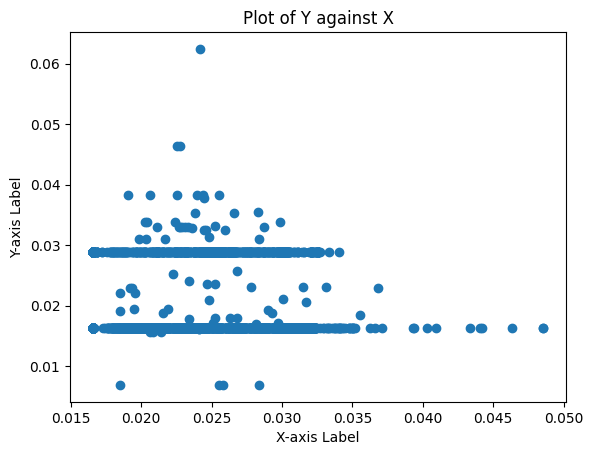

X_train.shape:  (40819, 12)
y_train.shape:  (40819,)
X_test.shape:  (5075, 12)
y_test.shape:  (5075,)
Rel error: 0.33128199267703806, Abs. Error: 0.0068933078369426935, R^2: -0.7900123982140859
**********************************************


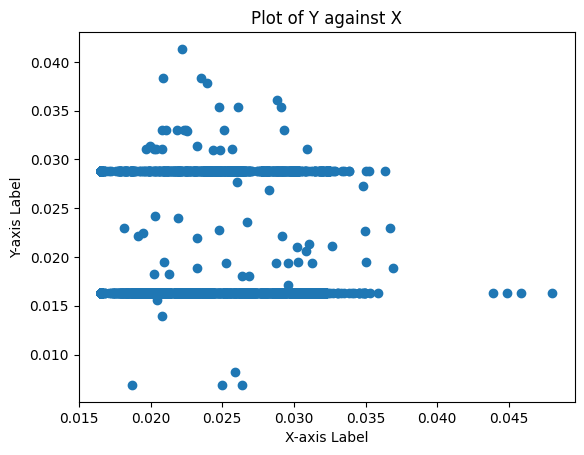

X_train.shape:  (40819, 12)
y_train.shape:  (40819,)
X_test.shape:  (5075, 12)
y_test.shape:  (5075,)


KeyboardInterrupt: 

In [ ]:
"""
  Decision Tree Classifier
"""
models = ['rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq4_1= rq4_model(models, random_states, dtc_rq4_training, dtc_rq4_testing)
# Print and store results!!
results = get_results(results_rq4_1, length=2)
print('Results: ', results)

In [ ]:
"""
  Decision Tree Classifier
"""
models = ['rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq4_1= rq4_model(models, random_states, dtc_rq4_training, dtc_rq4_testing)
# Print and store results!!
results = get_results(results_rq4_1, length=2)
print('Results: ', results)

Training Dataset:  Decision_Tree_Classifier_census_gender_mutation_res.csv
Testing dataset:  Decision_Tree_Classifier_compas_gender_coverage_1628116423_res.csv
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (5075, 12)
y_test.shape:  (5075,)
Rel error: 0.06446544554255289, Abs. Error: 0.006721520656495727, R^2: -0.6520315341515854
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (5075, 12)
y_test.shape:  (5075,)
Rel error: 0.06828902846108051, Abs. Error: 0.007122513655488616, R^2: -0.9110289818021207
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (5075, 12)
y_test.shape:  (5075,)
Rel error: 0.06693575749768371, Abs. Error: 0.006953357423320989, R^2: -0.8262069725646306
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (5075, 12)
y_test.shape:  (5075,)
Rel error: 0.0682424719524

In [ ]:
"""
  Decision Tree Classifier
"""
models = ['rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq4_1= rq2_model(models, random_states, dtc_rq4_training, dtc_rq4_testing)
# Print and store results!!
results = get_results(results_rq4_1, length=2)
print('Results: ', results)

Decision Tree
Training datasets:  Decision_Tree_Classifier_census_gender_mutation_res.csv
Testing dataset:  Decision_Tree_Classifier_compas_gender_coverage_1628116423_res.csv
Rel error: 0.8992430067687497, Abs. Error: 0.09376000420590778, R^2: -320.4537481168736
**********************************************
Rel error: 0.8368947816017376, Abs. Error: 0.0872877333957494, R^2: -286.0166723156838
**********************************************
Rel error: 0.8605066224486958, Abs. Error: 0.0893903398527695, R^2: -300.8158654676107
**********************************************
Rel error: 0.8795313118248089, Abs. Error: 0.09162827473085612, R^2: -302.07428015376547
**********************************************
Rel error: 0.8883129956555136, Abs. Error: 0.0923416519961732, R^2: -309.4830052039876
**********************************************
Rel error: 0.9170988584791232, Abs. Error: 0.09609021866325237, R^2: -356.64175482182367
**********************************************
Rel error: 0.884

In [ ]:
"""
  Decision Tree Classifier
"""

models = ['rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq4_1= rq2_model(models, random_states, dtc_rq4_training, dtc_rq4_testing)
# Print and store results!!
results = get_results(results_rq4_1, length=2)
print('Results: ', results)

Decision Tree
Training datasets:  ['Decision_Tree_Classifier_census_gender_mutation_res.csv', 'Decision_Tree_Classifier_credit_gender_mutation_res.csv']
Testing dataset:  Decision_Tree_Classifier_compas_gender_coverage_1628116423_res.csv


TypeError: unhashable type: 'list'

In [ ]:
"""
  Discriminant Analysis
"""
models = ['rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq4_2 = rq2_model(models, random_states, da_rq4_training, da_rq4_testing)
# Print and store results!!
results = get_results(results_rq4_2, length=2)
print('Results: ', results)

Discriminant Analysis
Training datasets:  Discriminant_Analysis_census_gender_mutation_res.csv
Testing dataset:  Discriminant_Analysis_compas_gender_random_1628114206_res.csv
Rel error: 1.5394608702738566, Abs. Error: 0.08911913789464795, R^2: -2519.3765899098116
**********************************************
Rel error: 1.5263735574524644, Abs. Error: 0.08927143914305384, R^2: -2642.7487382311697
**********************************************
Rel error: 1.5398834853900263, Abs. Error: 0.08904783720785624, R^2: -2808.594161740278
**********************************************
Rel error: 1.5237746582636724, Abs. Error: 0.08905534112831569, R^2: -2390.083188829994
**********************************************
Rel error: 1.542048311737328, Abs. Error: 0.08917855144883369, R^2: -2468.8205765296098
**********************************************
Rel error: 1.5351603049063884, Abs. Error: 0.08928799811519504, R^2: -2438.907237825227
**********************************************
Rel error: 1.

In [ ]:
models = ['rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq4_svm= rq2_model(models, random_states, svm_rq4_training, svm_rq4_testing)
# Print and store results!!
results = get_results(results_rq4_svm, length=2)
print('Results: ', results)

SVM
Training datasets:  SVM_census_gender_mutation_1628264300_res.csv
Testing dataset:  SVM_compas_gender_mutation_1628265230_res.csv
Rel error: 1.1272683588006465, Abs. Error: 0.1716554416673136, R^2: -2460.3990977235794
**********************************************
Rel error: 1.1329437125776234, Abs. Error: 0.17300793893207045, R^2: -2506.973134667917
**********************************************
Rel error: 1.1284849690567613, Abs. Error: 0.17273200692679777, R^2: -2508.0846271523033
**********************************************
Rel error: 1.1215786086347215, Abs. Error: 0.17357132320599958, R^2: -2550.045142738429
**********************************************
Rel error: 1.1404110353964034, Abs. Error: 0.17593363335199502, R^2: -2583.5850175046953
**********************************************
Rel error: 1.1456677679780474, Abs. Error: 0.17447304830460547, R^2: -2545.951257427738
**********************************************
Rel error: 1.1280535430169343, Abs. Error: 0.174243438

In [ ]:
models = ['rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq4_tr = rq2_model(models, random_states, tr_rq4_training, tr_rq4_testing)
# Print and store results!!
results = get_results(results_rq4_tr, length=2)
print('Results: ', results)

Tree Regressor
Training datasets:  TreeRegressor_census_gender_mutation_res.csv
Testing dataset:  TreeRegressor_compas_gender_coverage_1628114251_res.csv
Rel error: 1.0150085922914862, Abs. Error: 0.12615970818726774, R^2: -15936.853397765384
**********************************************
Rel error: 1.0317734089806572, Abs. Error: 0.12624229214241736, R^2: -21824.07772947928
**********************************************
Rel error: 1.0164702456430719, Abs. Error: 0.1253600459632855, R^2: -80801.273338064
**********************************************
Rel error: 1.0143356555366532, Abs. Error: 0.12526803415094864, R^2: -13974.280625673875
**********************************************
Rel error: 1.0106507582091349, Abs. Error: 0.12461760027702098, R^2: -13940.722900429872
**********************************************
Rel error: 1.0193049810396975, Abs. Error: 0.12543125279566414, R^2: -271732.083467231
**********************************************
Rel error: 1.0181581138456606, Abs. E

TypeError: ufunc 'isnan' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''

# Running times

In [ ]:
# Averages from matrix
def get_times(results_multiple_runs, length, num_store_values = 3):
  num_store_values = num_store_values # Len of data, duration avg, duration std
  # num datasets x num models x num runs X num values to store
  results = np.zeros((results_multiple_runs.shape[0], 3 * length))
  avgs = np.average(results_multiple_runs, axis=2) # Get averages of result matrix
  stds = np.std(results_multiple_runs, axis=2) # Get standard deviations of result matrix
  print('avgs', avgs)
  print('stds', stds)
  print('avgs.shape', avgs.shape)
  print('stds.shape', stds.shape)
  # Traverse datasets
  for idx_d in range(results_multiple_runs.shape[0]):
    result_values = []
    # Traverse models (RF and XGBoost)
    for idx_m in range(results_multiple_runs.shape[1]):
      # Averages
      len_avg = int(avgs[idx_d][idx_m][0])
      durations_avg = round(avgs[idx_d][idx_m][1], 3)
      # Standard Deviations
      durations_std = stds[idx_d][idx_m][1]
      # Store values
      result_values.extend([len_avg, durations_avg, durations_std])

    results[idx_d] = result_values # For each dataset
  return results

In [ ]:
# RQ1 model experimenation runs
def rq1_model_time(models, random_states, all_dataset_names, num_runs=10):
  nums_to_store = 2 # len(data) and duration
  # num datasets x num models x num runs x nums_to_store
  times = np.zeros((len(all_dataset_names), len(models), num_runs, nums_to_store))

  # Traverse through datasets
  for idx_d, dataset in enumerate(all_dataset_names):
    print('Dataset: ', dataset)
    alg = dataset[0:3]
    if alg == 'SVM':
      print('SVM')
      get_data = get_data_svm
    elif alg == 'Dec':
      print('Decision Tree')
      get_data = get_data_dtc
    elif alg == 'Log':
      print('Logistic Regression')
      get_data = get_data_lr
    elif alg == 'Dis':
      get_data = get_data_da
      print('Discriminant Analysis')
    elif alg == 'Tre':
      print('Tree Regressor')
      get_data = get_data_tr
    # Traverse through models
    for idx_m, model_str in enumerate(models):
      # Traverse through number of runs
      for run in range(num_runs):
        # Get data with different splitting seed
        X_train, X_test, y_train, y_test = get_data([dataset], split=True, random_state=random_states[run])
        len_data = X_train.shape[0] # Number of data points

        # Fit model
        model = get_model(model_str, random_states[run])
        start_time = time.time() # Start timer
        model.fit(X_train, y_train) # Train ML model
        end_time = time.time() # End timer
        duration = end_time - start_time # Get time duration for ML alg
        y_pred = model.predict(X_test)

        # Store result. Idx of dataset and Num of run
        times[idx_d][idx_m][run] = [len_data, duration]
  return times

In [ ]:
str_ = 'a'
str_2 = 'b'

str_3 = 'a' + str_2
print(str_3)

ab


In [ ]:
def get_names_complexity(dat_names, num_points):
  new_dat_names = []
  idx = 0
  for dat_name in dat_names:
    num_point = str(int(num_points[idx]))
    new_dat_name = ''
    if 'bank' in dat_name:
      new_dat_name = 'Bank (Age) '

    if 'census' in dat_name:
      if 'gender' in dat_name:
        new_dat_name = 'Census (Gender) '
      else:
        new_dat_name = 'Census (Race) '

    if 'compas' in dat_name:
      if 'gender' in dat_name:
        new_dat_name = 'Compas (Gender) '
      else:
        new_dat_name = 'Compas (Race) '

    if 'credit' in dat_name:
      new_dat_name = 'Credit (Gender) '

    new_dat_names.append(new_dat_name + num_point)
    idx += 1

  return new_dat_names
# Graphs complexity of Random Forest vs XGBoost
def graph_complexity(results_times, dat_names=None):
  dat_names_np = np.array(dat_names)
  rf_x = np.squeeze(results_times[:,0])
  print("rf_x", rf_x)
  rf_y = np.squeeze(results_times[:,1])
  print("rf_y", rf_y)
  inds = np.argsort(rf_x)
  rf_x_sorted = rf_x[inds]
  rf_y_sorted = rf_y[inds]

  xgb_x = np.squeeze(results_times[:,3])
  xgb_y = np.squeeze(results_times[:,4])
  inds = np.argsort(xgb_x)
  xgb_x_sorted = xgb_x[inds]
  xgb_y_sorted = xgb_y[inds]

  bins = rf_x_sorted
  dat_names_np = dat_names_np[inds]
  dat_names = dat_names_np.tolist()

  dat_names = get_names_complexity(dat_names, rf_x_sorted)

  print('bins', bins)
  print('rf_x_sorted', rf_x_sorted)
  print('rf_y_sorted', rf_y_sorted)
  print('xgb_x_sorted', xgb_x_sorted)
  print('xgb_y_sorted', xgb_y_sorted)

  index = np.arange(len(dat_names))
  bar_width = 0.25
  fig, ax = plt.subplots()
  ax.set_xlabel('Dataset (Number of data points)')
  ax.set_ylabel('Running time (Seconds)')
  ax.set_title('DA - Number of data points vs Running time')
  rects1 = ax.bar(index, rf_y_sorted, bar_width,
                  alpha=0.4,
                  color='b',
                  label='Random Forest')
  rects2 = ax.bar(index + bar_width, xgb_y_sorted, bar_width,
                  alpha=0.5,
                  color='r',
                  label='XGBoost')
  ax.set_xticks(index + bar_width / 2)
  ax.set_xticklabels(dat_names) # Dataset Names
  for tick in ax.get_xticklabels():
    tick.set_rotation(45)
  ax.legend()

  plt.show()

### DTC Running Times complexity

Dataset:  Decision_Tree_Classifier_census_gender_mutation_res.csv
Decision Tree
Dataset:  Decision_Tree_Classifier_census_race_mutation_res.csv
Decision Tree
avgs [[[4.45200000e+03 6.05356050e-01]
  [4.45200000e+03 8.22347879e-02]]

 [[1.85700000e+03 3.15279078e-01]
  [1.85700000e+03 4.30600405e-02]]]
stds [[[0.         0.00840267]
  [0.         0.00584644]]

 [[0.         0.03874716]
  [0.         0.00177376]]]
avgs.shape (2, 2, 2)
stds.shape (2, 2, 2)
Complexity:  [[4.45200000e+03 6.05000000e-01 8.40266535e-03 4.45200000e+03
  8.20000000e-02 5.84644438e-03]
 [1.85700000e+03 3.15000000e-01 3.87471621e-02 1.85700000e+03
  4.30000000e-02 1.77375560e-03]]
rf_x [4452. 1857.]
rf_y [0.605 0.315]
bins [1857. 4452.]
rf_x_sorted [1857. 4452.]
rf_y_sorted [0.315 0.605]
xgb_x_sorted [1857. 4452.]
xgb_y_sorted [0.043 0.082]


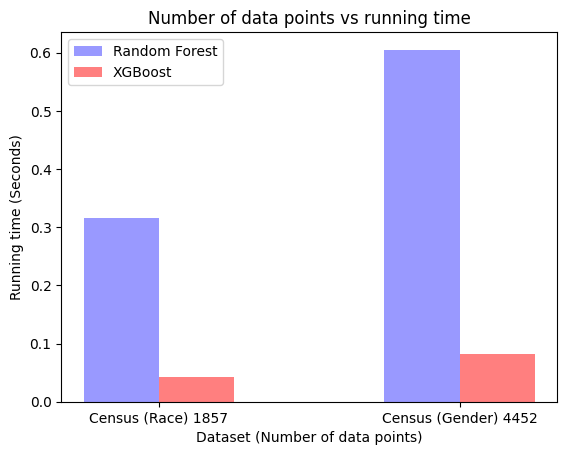

In [ ]:
models = ['rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
rq1_times_dtc = rq1_model_time(models, random_states, [dtc_census_gender,dtc_census_race], num_runs = 10)
# Print and store results!!
complexity_dtc = get_times(rq1_times_dtc, length=2)
print('Complexity: ', complexity_dtc)
graph_complexity(complexity_dtc, [dtc_census_gender, dtc_census_race])

Dataset:  Decision_Tree_Classifier_census_gender_mutation_res.csv
Decision Tree
Dataset:  Decision_Tree_Classifier_census_race_mutation_res.csv
Decision Tree
Dataset:  Decision_Tree_Classifier_compas_gender_coverage_1628116423_res.csv
Decision Tree
Dataset:  Decision_Tree_Classifier_compas_race_coverage_1628116493_res.csv
Decision Tree
Dataset:  Decision_Tree_Classifier_credit_gender_mutation_res.csv
Decision Tree
Dataset:  Decision_Tree_Classifier_bank_age_mutation_res.csv
Decision Tree
avgs [[[4.45200000e+03 6.20938993e-01]
  [4.45200000e+03 8.10913563e-02]]

 [[1.85700000e+03 3.25613260e-01]
  [1.85700000e+03 1.91862631e-01]]

 [[2.02990000e+04 1.27287533e+00]
  [2.02990000e+04 7.28814125e-02]]

 [[2.03780000e+04 1.14901078e+00]
  [2.03780000e+04 1.54865456e-01]]

 [[4.08190000e+04 3.47575560e+00]
  [4.08190000e+04 5.19005418e-01]]

 [[1.66700000e+03 1.46307302e-01]
  [1.66700000e+03 2.01776743e-02]]]
stds [[[0.         0.04333007]
  [0.         0.00413934]]

 [[0.         0.1569882

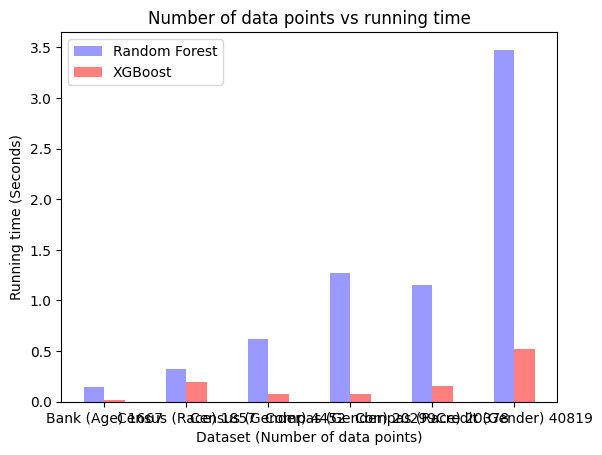

In [ ]:
models = ['rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
rq1_times_dtc = rq1_model_time(models, random_states, dtc_names, num_runs = 10)
# Print and store results!!
complexity_dtc = get_times(rq1_times_dtc, length=2)
print('Complexity: ', complexity_dtc)
graph_complexity(complexity_dtc, dtc_names)

Complexity:  [[4.45200000e+03 6.21000000e-01 4.33300727e-02 4.45200000e+03
  8.10000000e-02 4.13933645e-03]
 [1.85700000e+03 3.26000000e-01 1.56988253e-01 1.85700000e+03
  1.92000000e-01 2.87946678e-01]
 [2.02990000e+04 1.27300000e+00 7.62333993e-02 2.02990000e+04
  7.30000000e-02 9.44027090e-03]
 [2.03780000e+04 1.14900000e+00 9.69097103e-02 2.03780000e+04
  1.55000000e-01 1.84929646e-01]
 [4.08190000e+04 3.47600000e+00 1.43738930e-01 4.08190000e+04
  5.19000000e-01 5.02079537e-01]
 [1.66700000e+03 1.46000000e-01 4.13653322e-03 1.66700000e+03
  2.00000000e-02 6.22644104e-04]]
rf_x [ 4452.  1857. 20299. 20378. 40819.  1667.]
rf_y [0.621 0.326 1.273 1.149 3.476 0.146]
bins [ 1667.  1857.  4452. 20299. 20378. 40819.]
rf_x_sorted [ 1667.  1857.  4452. 20299. 20378. 40819.]
rf_y_sorted [0.146 0.326 0.621 1.273 1.149 3.476]
xgb_x_sorted [ 1667.  1857.  4452. 20299. 20378. 40819.]
xgb_y_sorted [0.02  0.192 0.081 0.073 0.155 0.519]


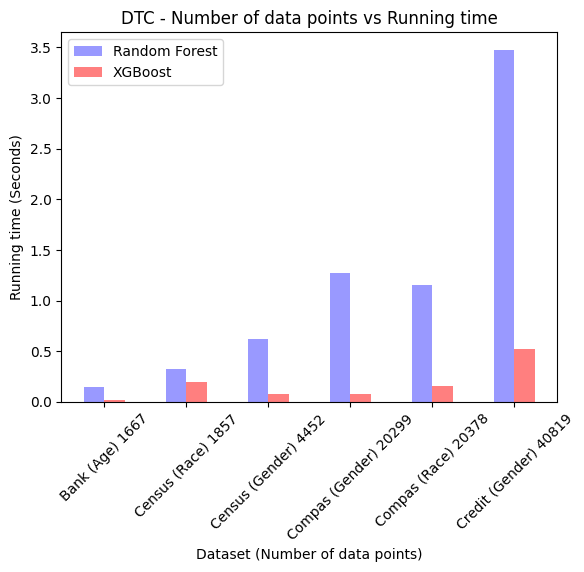

In [ ]:
print('Complexity: ', complexity_dtc)
graph_complexity(complexity_dtc, dtc_names)

### LR Running Times complexity

In [ ]:
models = ['rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
rq1_times_lr = rq1_model_time(models, random_states, lr_names, num_runs = 10)
# Print and store results!!
complexity_lr = get_times(rq1_times_lr, length=2)

Dataset:  LogisticRegression_census_gender_mutation_res.csv
Logistic Regression
Dataset:  LogisticRegression_census_race_mutation_res.csv
Logistic Regression
Dataset:  LogisticRegression_compas_gender_mutation_1628116237_res.csv
Logistic Regression
Dataset:  LogisticRegression_compas_race_mutation_1628116303_res.csv
Logistic Regression
Dataset:  LogisticRegression_credit_gender_mutation_res.csv
Logistic Regression
Dataset:  LogisticRegression_bank_age_mutation_res.csv
Logistic Regression
avgs [[[3.60700000e+03 9.31279707e-01]
  [3.60700000e+03 8.33288193e-02]]

 [[1.80000000e+03 3.88206077e-01]
  [1.80000000e+03 4.33804274e-02]]

 [[4.80370000e+04 8.31004663e+00]
  [4.80370000e+04 2.52522516e-01]]

 [[4.43920000e+04 9.09910421e+00]
  [4.43920000e+04 3.09916544e-01]]

 [[1.63350000e+04 4.09686532e+00]
  [1.63350000e+04 6.56240749e-01]]

 [[1.31200000e+03 3.26137924e-01]
  [1.31200000e+03 5.49700975e-02]]]
stds [[[0.         0.21868987]
  [0.         0.00506941]]

 [[0.         0.0079383

Complexity:  [[3.60700000e+03 9.31000000e-01 2.18689874e-01 3.60700000e+03
  8.30000000e-02 5.06941002e-03]
 [1.80000000e+03 3.88000000e-01 7.93833543e-03 1.80000000e+03
  4.30000000e-02 7.28802809e-03]
 [4.80370000e+04 8.31000000e+00 2.09134760e-01 4.80370000e+04
  2.53000000e-01 9.41593309e-02]
 [4.43920000e+04 9.09900000e+00 1.89985241e-01 4.43920000e+04
  3.10000000e-01 3.22694038e-01]
 [1.63350000e+04 4.09700000e+00 2.04051032e-01 1.63350000e+04
  6.56000000e-01 4.84088744e-01]
 [1.31200000e+03 3.26000000e-01 8.36918876e-03 1.31200000e+03
  5.50000000e-02 1.70680157e-03]]
rf_x [ 3607.  1800. 48037. 44392. 16335.  1312.]
rf_y [0.931 0.388 8.31  9.099 4.097 0.326]
bins [ 1312.  1800.  3607. 16335. 44392. 48037.]
rf_x_sorted [ 1312.  1800.  3607. 16335. 44392. 48037.]
rf_y_sorted [0.326 0.388 0.931 4.097 9.099 8.31 ]
xgb_x_sorted [ 1312.  1800.  3607. 16335. 44392. 48037.]
xgb_y_sorted [0.055 0.043 0.083 0.656 0.31  0.253]


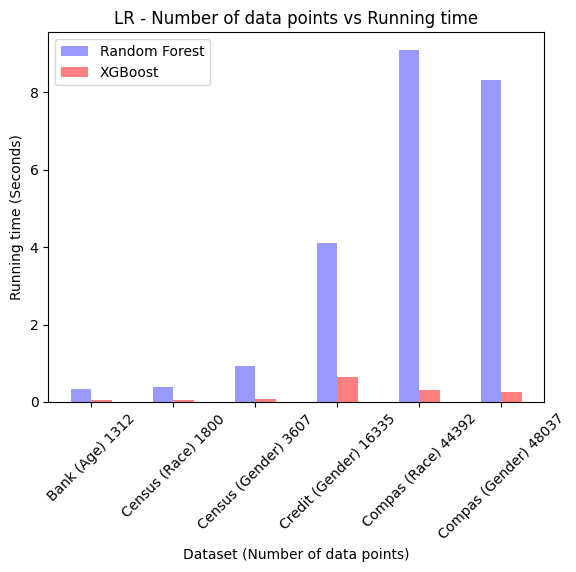

In [ ]:
print('Complexity: ', complexity_lr)
graph_complexity(complexity_lr, lr_names)

###  TR Times complexity

In [ ]:
models = ['rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
rq1_times_tr = rq1_model_time(models, random_states, tr_names, num_runs = 10)
# Print and store results!!
complexity_tr = get_times(rq1_times_tr, length=2)

Dataset:  TreeRegressor_census_gender_mutation_res.csv
Tree Regressor
Dataset:  TreeRegressor_census_race_mutation_res.csv
Tree Regressor
Dataset:  TreeRegressor_compas_gender_coverage_1628114251_res.csv
Tree Regressor
Dataset:  TreeRegressor_compas_race_mutation_1628114319_res.csv
Tree Regressor
Dataset:  TreeRegressor_credit_gender_mutation_res.csv
Tree Regressor
Dataset:  TreeRegressor_bank_age_mutation_res.csv
Tree Regressor
avgs [[[6.23000000e+02 2.39796329e-01]
  [6.23000000e+02 4.01880264e-02]]

 [[5.52000000e+02 2.06727839e-01]
  [5.52000000e+02 3.36955309e-02]]

 [[8.56800000e+03 6.74164057e-01]
  [8.56800000e+03 3.49353790e-02]]

 [[1.81810000e+04 1.45706639e+00]
  [1.81810000e+04 1.69725275e-01]]

 [[1.52870000e+04 6.23782041e+00]
  [1.52870000e+04 1.16486423e+00]]

 [[1.10000000e+02 9.72405434e-02]
  [1.10000000e+02 1.36129856e-02]]]
stds [[[0.00000000e+00 1.56082952e-02]
  [0.00000000e+00 3.21836878e-03]]

 [[0.00000000e+00 6.12028957e-03]
  [0.00000000e+00 7.98764469e-04]

Complexity:  [[6.23000000e+02 2.40000000e-01 1.56082952e-02 6.23000000e+02
  4.00000000e-02 3.21836878e-03]
 [5.52000000e+02 2.07000000e-01 6.12028957e-03 5.52000000e+02
  3.40000000e-02 7.98764469e-04]
 [8.56800000e+03 6.74000000e-01 7.87683307e-02 8.56800000e+03
  3.50000000e-02 5.52801596e-03]
 [1.81810000e+04 1.45700000e+00 1.65408894e-01 1.81810000e+04
  1.70000000e-01 2.85959634e-01]
 [1.52870000e+04 6.23800000e+00 6.41700149e-01 1.52870000e+04
  1.16500000e+00 5.64776393e-01]
 [1.10000000e+02 9.70000000e-02 4.84133546e-03 1.10000000e+02
  1.40000000e-02 4.17249488e-04]]
rf_x [  623.   552.  8568. 18181. 15287.   110.]
rf_y [0.24  0.207 0.674 1.457 6.238 0.097]
bins [  110.   552.   623.  8568. 15287. 18181.]
rf_x_sorted [  110.   552.   623.  8568. 15287. 18181.]
rf_y_sorted [0.097 0.207 0.24  0.674 6.238 1.457]
xgb_x_sorted [  110.   552.   623.  8568. 15287. 18181.]
xgb_y_sorted [0.014 0.034 0.04  0.035 1.165 0.17 ]


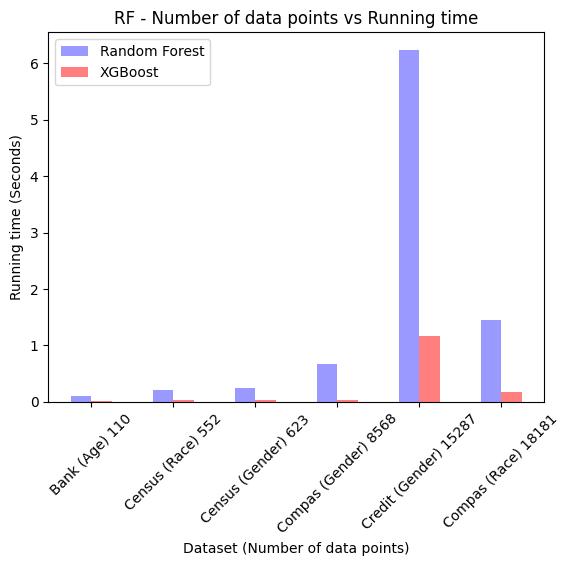

In [ ]:
print('Complexity: ', complexity_tr)
graph_complexity(complexity_tr, tr_names)

###  SVM Times complexity

In [ ]:
models = ['rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
rq1_times_svm = rq1_model_time(models, random_states, svm_names, num_runs = 10)
# Print and store results!!
complexity_svm = get_times(rq1_times_svm, length=2)

Dataset:  SVM_census_gender_mutation_1628264300_res.csv
SVM
Dataset:  SVM_census_race_mutation_1628264315_res.csv
SVM
Dataset:  SVM_compas_gender_mutation_1628265230_res.csv
SVM
Dataset:  SVM_compas_race_mutation_1628265601_res.csv
SVM
Dataset:  SVM_credit_gender_random_1628264669_res.csv
SVM
Dataset:  SVM_bank_age_mutation_1628264971_res.csv
SVM
avgs [[[1.40800000e+03 3.50854969e-01]
  [1.40800000e+03 1.00140572e-01]]

 [[3.09600000e+03 8.47981501e-01]
  [3.09600000e+03 2.10063577e-01]]

 [[2.20210000e+04 4.86904101e+00]
  [2.20210000e+04 3.49520254e-01]]

 [[2.10040000e+04 4.04650261e+00]
  [2.10040000e+04 2.72096634e-01]]

 [[7.65080000e+04 4.06071016e+01]
  [7.65080000e+04 4.89854860e-01]]

 [[8.30000000e+02 2.16806459e-01]
  [8.30000000e+02 4.77788210e-02]]]
stds [[[0.         0.00702873]
  [0.         0.00412499]]

 [[0.         0.09695375]
  [0.         0.00806018]]

 [[0.         0.5164031 ]
  [0.         0.44178098]]

 [[0.         0.22443261]
  [0.         0.45394854]]

 [[0.

Complexity:  [[1.40800000e+03 3.51000000e-01 7.02873062e-03 1.40800000e+03
  1.00000000e-01 4.12499414e-03]
 [3.09600000e+03 8.48000000e-01 9.69537547e-02 3.09600000e+03
  2.10000000e-01 8.06017575e-03]
 [2.20210000e+04 4.86900000e+00 5.16403102e-01 2.20210000e+04
  3.50000000e-01 4.41780984e-01]
 [2.10040000e+04 4.04700000e+00 2.24432612e-01 2.10040000e+04
  2.72000000e-01 4.53948539e-01]
 [7.65080000e+04 4.06070000e+01 8.15490349e-01 7.65080000e+04
  4.90000000e-01 3.64514184e-01]
 [8.30000000e+02 2.17000000e-01 4.04043385e-03 8.30000000e+02
  4.80000000e-02 3.15457876e-03]]
rf_x [ 1408.  3096. 22021. 21004. 76508.   830.]
rf_y [ 0.351  0.848  4.869  4.047 40.607  0.217]
bins [  830.  1408.  3096. 21004. 22021. 76508.]
rf_x_sorted [  830.  1408.  3096. 21004. 22021. 76508.]
rf_y_sorted [ 0.217  0.351  0.848  4.047  4.869 40.607]
xgb_x_sorted [  830.  1408.  3096. 21004. 22021. 76508.]
xgb_y_sorted [0.048 0.1   0.21  0.272 0.35  0.49 ]


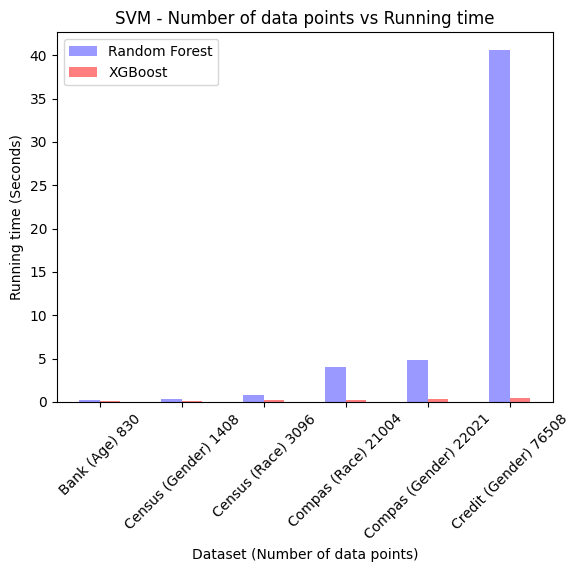

In [ ]:
print('Complexity: ', complexity_svm)
graph_complexity(complexity_svm, svm_names)

###  DA Times complexity

In [ ]:
models = ['rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
rq1_times_da = rq1_model_time(models, random_states, da_names, num_runs = 10)
# Print and store results!!
complexity_da = get_times(rq1_times_da, length=2)

Dataset:  Discriminant_Analysis_census_gender_mutation_res.csv
Discriminant Analysis
Dataset:  Discriminant_Analysis_census_race_mutation_res.csv
Discriminant Analysis
Dataset:  Discriminant_Analysis_compas_gender_random_1628114206_res.csv
Discriminant Analysis
Dataset:  Discriminant_Analysis_compas_race_coverage_1628114343_res.csv
Discriminant Analysis
Dataset:  Discriminant_Analysis_credit_gender_mutation_res.csv
Discriminant Analysis
Dataset:  Discriminant_Analysis_bank_age_mutation_res.csv
Discriminant Analysis
avgs [[[4.92300000e+03 7.56777000e-01]
  [4.92300000e+03 3.63015890e-02]]

 [[2.08000000e+03 3.51869416e-01]
  [2.08000000e+03 2.46226788e-02]]

 [[3.64530000e+04 2.36916933e+00]
  [3.64530000e+04 1.78200912e-01]]

 [[2.67530000e+04 1.48184397e+00]
  [2.67530000e+04 1.91327143e-01]]

 [[2.87320000e+04 3.54154658e+00]
  [2.87320000e+04 1.62913609e-01]]

 [[1.57800000e+03 2.90959597e-01]
  [1.57800000e+03 1.19508648e-01]]]
stds [[[0.         0.07622016]
  [0.         0.0060246

Complexity:  [[4.92300000e+03 7.57000000e-01 7.62201610e-02 4.92300000e+03
  3.60000000e-02 6.02465754e-03]
 [2.08000000e+03 3.52000000e-01 6.62157511e-03 2.08000000e+03
  2.50000000e-02 1.30749980e-03]
 [3.64530000e+04 2.36900000e+00 1.81894482e-01 3.64530000e+04
  1.78000000e-01 2.49090620e-01]
 [2.67530000e+04 1.48200000e+00 1.04607413e-01 2.67530000e+04
  1.91000000e-01 3.40137324e-01]
 [2.87320000e+04 3.54200000e+00 1.76075990e-01 2.87320000e+04
  1.63000000e-01 8.36916747e-03]
 [1.57800000e+03 2.91000000e-01 3.48020344e-02 1.57800000e+03
  1.20000000e-01 1.98722732e-01]]
rf_x [ 4923.  2080. 36453. 26753. 28732.  1578.]
rf_y [0.757 0.352 2.369 1.482 3.542 0.291]
bins [ 1578.  2080.  4923. 26753. 28732. 36453.]
rf_x_sorted [ 1578.  2080.  4923. 26753. 28732. 36453.]
rf_y_sorted [0.291 0.352 0.757 1.482 3.542 2.369]
xgb_x_sorted [ 1578.  2080.  4923. 26753. 28732. 36453.]
xgb_y_sorted [0.12  0.025 0.036 0.191 0.163 0.178]


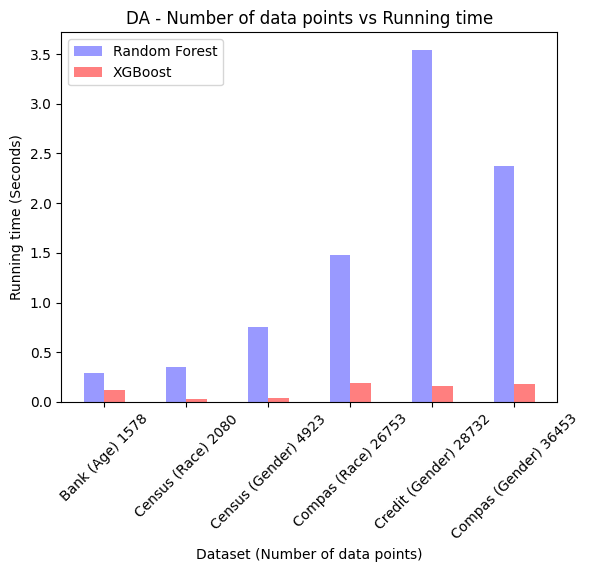

In [ ]:
print('Complexity: ', complexity_da)
graph_complexity(complexity_da, da_names)

### Finish

In [ ]:
models = ['rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq1_times_2 = rq1_model_time(models, random_states, da_names, num_runs = 10)
# Print and store results!!
complexity_2 = get_times(results_rq1_times_2, length=2)
print('Complexity: ', complexity_2)

In [ ]:
a = np.array([[4.45200000e+03, 1.37800000e+00, 3.46782431e-01, 4.45200000e+03,
  1.36000000e-01, 1.77606372e-02],
 [1.85700000e+03, 3.85000000e-01, 5.52980370e-02, 1.85700000e+03,
  6.90000000e-02, 7.12102811e-03],
 [2.02990000e+04, 3.55000000e+00, 9.38177001e-01, 2.02990000e+04,
  1.45000000e-01, 8.48995189e-02],
 [2.03780000e+04, 1.47300000e+00, 2.47514668e-01, 2.03780000e+04,
  1.92000000e-01, 2.38347983e-01],
 [4.08190000e+04, 4.45500000e+00, 4.28674365e-01, 4.08190000e+04,
  8.93000000e-01, 8.58688018e-01],
 [1.66700000e+03, 2.14000000e-01, 5.98919818e-03, 1.66700000e+03,
  2.38000000e-01, 2.85769717e-01]])

In [ ]:
def graph_complexity(results_times):

  rf_x = np.squeeze(results_times[:,0])
  print("rf_x", rf_x)
  rf_y = np.squeeze(results_times[:,1])
  print("rf_y", rf_y)
  inds = np.argsort(rf_x)
  rf_x_sorted = rf_x[inds]
  rf_y_sorted = rf_y[inds]

  xgb_x = np.squeeze(results_times[:,3])
  xgb_y = np.squeeze(results_times[:,4])
  inds = np.argsort(xgb_x)
  xgb_x_sorted = xgb_x[inds]
  xgb_y_sorted = xgb_y[inds]

  plt.xlabel("Number of data points")
  plt.ylabel("Time (s)")
  plt.plot(rf_x_sorted, rf_y_sorted, label = "Random Forest")
  plt.plot(xgb_x_sorted, xgb_y_sorted, label = "XGBoost")
  plt.legend()
  plt.show()

In [ ]:
def graph_complexity(results_times, dat_names=None):
  rf_x = np.squeeze(results_times[:,0])
  print("rf_x", rf_x)
  rf_y = np.squeeze(results_times[:,1])
  print("rf_y", rf_y)
  inds = np.argsort(rf_x)
  rf_x_sorted = rf_x[inds]
  rf_y_sorted = rf_y[inds]

  xgb_x = np.squeeze(results_times[:,3])
  xgb_y = np.squeeze(results_times[:,4])
  inds = np.argsort(xgb_x)
  xgb_x_sorted = xgb_x[inds]
  xgb_y_sorted = xgb_y[inds]

  bins = rf_x_sorted

  print('bins', bins)
  print('rf_x_sorted', rf_x_sorted)
  print('rf_y_sorted', rf_y_sorted)
  print('xgb_x_sorted', xgb_x_sorted)
  print('xgb_y_sorted', xgb_y_sorted)

  index = np.arange(6)
  bar_width = 0.25
  fig, ax = plt.subplots()
  ax.set_xlabel('Number of data')
  ax.set_ylabel('Running time')
  ax.set_title('Number of data points vs running time')
  rects1 = ax.bar(index, rf_y_sorted, bar_width,
                  alpha=0.4,
                  color='b',
                  label='Random Forest')
  rects2 = ax.bar(index + bar_width, xgb_y_sorted, bar_width,
                  alpha=0.5,
                  color='r',
                  label='XGBoost')
  ax.set_xticks(index + bar_width / 2)
  ax.set_xticklabels(["D1", "D2", "D3", "D4", "D5", "D6"])
  ax.legend()

  plt.show()

rf_x [ 4452.  1857. 20299. 20378. 40819.  1667.]
rf_y [1.378 0.385 3.55  1.473 4.455 0.214]
bins [ 1667.  1857.  4452. 20299. 20378. 40819.]
rf_x_sorted [ 1667.  1857.  4452. 20299. 20378. 40819.]
rf_y_sorted [0.214 0.385 1.378 3.55  1.473 4.455]
xgb_x_sorted [ 1667.  1857.  4452. 20299. 20378. 40819.]
xgb_y_sorted [0.238 0.069 0.136 0.145 0.192 0.893]


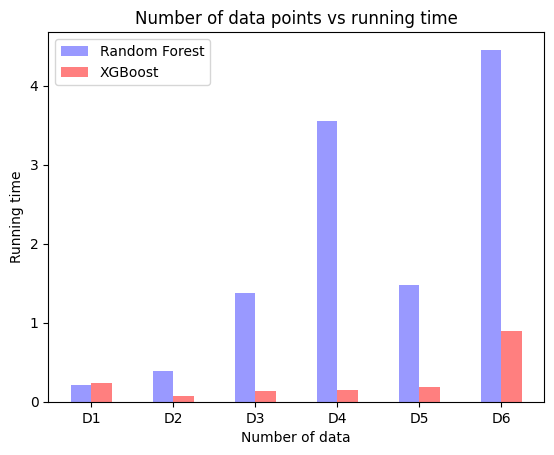

In [ ]:
graph_complexity_3(a)

# AOD and EOD comparison results

## TPR results


In [ ]:
models = ['rf']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq1_model_tpr = rq1_model(models, random_states, dtc_names, y_col = 'TPR', num_runs = 10)
# Print and store results!!
results = get_results(results_rq1_model_tpr, length=1)
print('Results: ', results)

Dataset:  Decision_Tree_Classifier_census_gender_mutation_res.csv
Decision Tree
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)
Rel error: 0.07201211065227985, Abs. Error: 0.02424998271700797, R^2: 0.8921067021357363
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)
Rel error: 0.07207357572538445, Abs. Error: 0.028064473976453706, R^2: 0.8559582822448506
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)
Rel error: 0.07239368786874534, Abs. Error: 0.02868396859538442, R^2: 0.8599577766463279
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)
Rel error: 0.07204268939430292, Abs. Error: 0.02615966539277283, R^2: 0.8698830351907457
**********************

Testing all 30 datasets with a different notion of fairness.

In [ ]:
models = ['rf']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq1_model_tpr = rq1_model(models, random_states, all_dataset_names, y_col='TPR', num_runs=10, baseline=True)
# Print and store results!!
results = get_results_baseline(results_rq1_model_tpr, length=1)
print('Results: ', results)

Dataset:  Decision_Tree_Classifier_census_gender_mutation_res (1).csv
Decision Tree
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)
Rel error: 0.07201211065227985, Abs. Error: 0.07201211065227985, R^2: 0.02366595136721626
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)
Rel error: 0.07207357572538445, Abs. Error: 0.07207357572538445, R^2: 0.02726522843915171
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)
Rel error: 0.07239368786874534, Abs. Error: 0.07239368786874534, R^2: 0.028496880982264626
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)
Rel error: 0.07204268939430292, Abs. Error: 0.07204268939430292, R^2: 0.02583322565900436
**************

TypeError: ignored

In [ ]:
print(results_rq1_model_tpr.shape)
a = results_rq1_model_tpr.squeeze()
print(a.shape)

(30, 1, 10, 4)
(30, 10, 4)


In [ ]:
results = get_results_baseline(a)
print('Results: ', results)

avgs [[7.20255178e-02 7.20255178e-02 2.50105033e-02 8.81940264e-01]
 [9.44712694e-02 9.44712694e-02 2.68318797e-02 8.64731369e-01]
 [5.96325266e+01 5.96325266e+01 1.12343888e-03 6.78766420e-01]
 [9.94347595e+01 9.94347595e+01 8.82837600e-04 5.54733360e-01]
 [3.43707092e-01 3.43707092e-01 2.18859617e-02 8.96612466e-01]
 [2.78975929e+00 2.78975929e+00 8.24072776e-03 6.85680061e-01]
 [9.91617521e-02 9.91617521e-02 6.29208849e-03 9.82870423e-01]
 [1.05824662e-01 1.05824662e-01 4.50805018e-03 9.26320936e-01]
 [7.95031340e-01 7.95031340e-01 4.19727624e-04 9.99230193e-01]
 [1.72583327e+00 1.72583327e+00 2.79190799e-04 9.99294725e-01]
 [8.23589797e-02 8.23589797e-02 1.64813834e-02 9.25058668e-01]
 [1.91262354e-01 1.91262354e-01 9.96582849e-03 9.33714351e-01]
 [5.62604705e-02 5.62604705e-02 1.21886191e-02 9.54796141e-01]
 [9.43685311e-02 9.43685311e-02 1.20742150e-02 7.12112553e-01]
 [1.16348486e+02 1.16348486e+02 8.30203972e-04 5.91925748e-01]
 [1.50395588e+02 1.50395588e+02 5.47522601e-04 8.2

In [ ]:
models = ['rf']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_1 = rq1_model(models, random_states, all_dataset_names, y_col='TPR', num_runs=10)
# Print and store results!!
results = get_results(results_1,length=1)
print('Results: ', results)

Dataset:  Decision_Tree_Classifier_census_gender_mutation_res (1).csv
Decision Tree
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)
Rel RMSE: 0.16992088700334484, RMSE: 0.02393732668083076, R^2: 0.8948709125338177
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)
Rel RMSE: 0.19532040906426068, RMSE: 0.027491977307509297, R^2: 0.8617750528910805
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)
Rel RMSE: 0.20711798788157687, RMSE: 0.029023617231050364, R^2: 0.8566216440695591
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)
Rel RMSE: 0.1858453070031505, RMSE: 0.026169540810083616, R^2: 0.8697847769105264
*********************************************

In [ ]:
# RQ1 Baseline
def rq1_baselines(random_states, all_dataset_names=all_dataset_names,y_col='AOD',num_runs=10):
  num_to_store = 3
  # num datasets x num models x num runs X num values to store
  results = np.zeros((len(all_dataset_names), num_runs, num_to_store))

  # Traverse through datasets
  for idx_d, dataset in enumerate(all_dataset_names):
    print('Dataset: ', dataset)
    alg = dataset[0:3]
    if alg == 'SVM':
      print('SVM')
      get_data = get_data_svm
    elif alg == 'Dec':
      print('Decision Tree')
      get_data = get_data_dtc
    elif alg == 'Log':
      print('Logistic Regression')
      get_data = get_data_lr
    elif alg == 'Dis':
      get_data = get_data_da
      print('Discriminant Analysis')
    elif alg == 'Tre':
      print('Tree Regressor')
      get_data = get_data_tr

    # Traverse through number of runs
    for run in range(num_runs):
      # Get data with different splitting seed
      X_train, X_test, y_train, y_test = get_data([dataset], split=True, random_state=random_states[run],y_col=y_col)
      print('X_train.shape: ', X_train.shape)
      print('y_train.shape: ', y_train.shape)
      print('X_test.shape: ', X_test.shape)
      print('y_test.shape: ', y_test.shape)

      # Get loss for the baseline model
      baseline_preds, avg = baseline_model(y_train, y_test.shape)
      mse_b = mean_squared_error(baseline_preds, y_test)
      rmse_b, rel_rmse_b = errors(mse_b,avg)
      r_2_b = r2_score(y_true=y_test,y_pred=baseline_preds)

      result = [rel_rmse_b, rmse_b, r_2_b]
      # Store result. Idx of dataset and Num of run
      results[idx_d][run] = result
      print(
            'Rel RMSE B.: '+str(result[0])+
            'RMSE B: '+str(result[1])+
            ', R^2 B: '+str(result[2])
            )
      print('**********************************************')
  return results

In [ ]:
# Averages from matrix
def get_baselines(results_multiple_runs):
  num_store_values = 3 # 3 averages and 3 stdvs
  # num datasets X num values to store
  results = np.zeros((results_multiple_runs.shape[0], num_store_values * 2))
  avgs = np.average(results_multiple_runs, axis=1) # Get averages of result matrix
  stds = np.std(results_multiple_runs, axis=1) # Get standard deviations of result matrix
  print('avgs', avgs)
  print('stds', stds)
  print('avgs.shape', avgs.shape)
  print('stds.shape', stds.shape)
  # Traverse datasets
  for idx_d in range(results_multiple_runs.shape[0]):
    str_values = ''
    result_values = []

    # Averages
    rel_rmse_avg = round(avgs[idx_d][0], 3)
    rmse_avg = round(avgs[idx_d][1], 3)
    r_2_avg = round(avgs[idx_d][2], 3)
    # Standard Deviations
    rel_rmse_std = stds[idx_d][0]
    rmse_std = stds[idx_d][1]
    r_2_std = stds[idx_d][2]

    # Print values
    str_values += '& %.3f (%.3f) & %.3f (%.3f) & %.3f (%.3f) ' % (rel_rmse_avg, rel_rmse_std, rmse_avg, rmse_std, r_2_avg, r_2_std)
    # Store values
    result_values.extend([rel_rmse_avg, rel_rmse_std, rmse_avg, rmse_std, r_2_avg, r_2_std])

    results[idx_d] = result_values
    print('Complete: ', str_values)
  return results

In [ ]:
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
baselines = rq1_baselines(random_states,all_dataset_names,y_col='TPR')
print('baselines.shape', baselines.shape)
results_baselines = get_baselines(baselines)

Dataset:  Decision_Tree_Classifier_census_gender_mutation_res (1).csv
Decision Tree
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)
Rel RMSE B.: 0.5241319087228786RMSE B: 0.07383622428183266, R^2 B: -0.00025461028821238685
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)
Rel RMSE B.: 0.5253728733638694RMSE B: 0.07394792577845005, R^2 B: -6.0956360847796986e-05
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)
Rel RMSE B.: 0.5472847299748085RMSE B: 0.07669146790026582, R^2 B: -0.0010934531672306402
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)
Rel RMSE B.: 0.5150538299888288RMSE B: 0.07252656760955513, R^2 B: -0.00014692467442745105
************

## FPR Results

In [ ]:
models = ['rf']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq1_model_fpr = rq1_model(models, random_states, dtc_names, y_col = 'FPR', num_runs = 10)
# Print and store results!!
results = get_results(results_rq1_model_fpr, length=1)
print('Results: ', results)

Dataset:  Decision_Tree_Classifier_census_gender_mutation_res.csv
Decision Tree
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)
Rel error: 0.14994011533546128, Abs. Error: 0.009378549054098307, R^2: 0.8662547969720458
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)
Rel error: 0.1495241035428329, Abs. Error: 0.010480266126073707, R^2: 0.8303990507711086
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)
Rel error: 0.14999846152926863, Abs. Error: 0.0109436382308957, R^2: 0.8221723503500058
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)
Rel error: 0.1501934441680606, Abs. Error: 0.009654014808016533, R^2: 0.8510771003177727
***********************

## Normal AOD results

In [ ]:
models = ['rf']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq1_model_aod = rq1_model(models, random_states, dtc_names, num_runs = 10)
# Print and store results!!
results = get_results(results_rq1_model_aod, length=1)
print('Results: ', results)

Dataset:  Decision_Tree_Classifier_census_gender_mutation_res.csv
Decision Tree
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)
Rel error: 0.09729575027870604, Abs. Error: 0.015600084236753313, R^2: 0.8899325053380684
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)
Rel error: 0.09726398611260656, Abs. Error: 0.01823142342484613, R^2: 0.848949384482773
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)
Rel error: 0.0976558015571671, Abs. Error: 0.01911825325509276, R^2: 0.8444696823680049
**********************************************
X_train.shape:  (4452, 12)
y_train.shape:  (4452,)
X_test.shape:  (1113, 12)
y_test.shape:  (1113,)
Rel error: 0.09737696092722972, Abs. Error: 0.016884949176767503, R^2: 0.8646303869392356
***********************

# NEW CENSUS

## Single datasets

Trains and predicts on a single dataset.

In [ ]:
lr_census_names = [
    lr_census_2014_sex, lr_census_2015_sex,
    lr_census_2014_race, lr_census_2015_race
]

dtc_census_names = [
    dtc_census_2014_sex, dtc_census_2015_sex,
    dtc_census_2014_race, dtc_census_2015_race
]

svm_census_names = [
    svm_census_2014_sex, svm_census_2015_sex,
    svm_census_2014_race, svm_census_2015_race
]

tr_census_names = [
    tr_census_2014_sex, tr_census_2015_sex,
    tr_census_2014_race, tr_census_2015_race
]

da_census_names = [
    da_census_2014_sex, da_census_2015_sex,
    da_census_2014_race, da_census_2015_race
]

In [ ]:
# Decision Tree Classifier Census
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq1_dtc_c = rq1_model(models, random_states, dtc_census_names, num_runs = 10)
# Print and store results
results = get_results(results_rq1_dtc_c, length=3)
print('Results: ', results)

Dataset:  DTCENSUS_2014_sex.csv
Decision Tree
X_train.shape:  (4998, 12)
y_train.shape:  (4998,)
X_test.shape:  (1250, 12)
y_test.shape:  (1250,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.5354274181912906, RMSE: 0.03266523897468403, R^2: 0.27179761708442607
**********************************************
X_train.shape:  (4998, 12)
y_train.shape:  (4998,)
X_test.shape:  (1250, 12)
y_test.shape:  (1250,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.5647536025359006, RMSE: 0.03409219257454665, R^2: 0.3026557513434478
**********************************************
X_train.shape:  (4998, 12)
y_train.shape:  (4998,)
X_test.shape:  (1250, 12)
y_test.shape:  (1250,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.6102606823182324, RMSE: 0.03693545689552583, R^2: 0.24970013587844975
**********************************************
X_train.shape:  (4998, 12)
y_train.shape:  (4998,)
X_test.shape:  (1250, 12)
y_test.shape:  (1250,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.5534766802705043, RMSE: 0.03359668661965944, R^2: 0.29975930892462166
**********************************************
X_train.shape:  (4998, 12)
y_train.shape:  (4998,)
X_test.shape:  (1250, 12)
y_test.shape:  (1250,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.5771792320535217, RMSE: 0.034963133934605935, R^2: 0.29201066841429646
**********************************************
X_train.shape:  (4998, 12)
y_train.shape:  (4998,)
X_test.shape:  (1250, 12)
y_test.shape:  (1250,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.5923925958375074, RMSE: 0.03560980874381972, R^2: 0.29663531103224994
**********************************************
X_train.shape:  (4998, 12)
y_train.shape:  (4998,)
X_test.shape:  (1250, 12)
y_test.shape:  (1250,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.5883650617889766, RMSE: 0.03555031798218488, R^2: 0.24494431277131523
**********************************************
X_train.shape:  (4998, 12)
y_train.shape:  (4998,)
X_test.shape:  (1250, 12)
y_test.shape:  (1250,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.5787350253400259, RMSE: 0.034966642018483936, R^2: 0.301757247363754
**********************************************
X_train.shape:  (4998, 12)
y_train.shape:  (4998,)
X_test.shape:  (1250, 12)
y_test.shape:  (1250,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.5353115619871526, RMSE: 0.03235833509557317, R^2: 0.3616737917928686
**********************************************
X_train.shape:  (4998, 12)
y_train.shape:  (4998,)
X_test.shape:  (1250, 12)
y_test.shape:  (1250,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.5292903033088074, RMSE: 0.032292632049390015, R^2: 0.25034193470240296
**********************************************
X_train.shape:  (4998, 12)
y_train.shape:  (4998,)
X_test.shape:  (1250, 12)
y_test.shape:  (1250,)
Rel RMSE: 0.2114326156336226, RMSE: 0.012899034830986806, R^2: 0.8864479845070942
**********************************************
X_train.shape:  (4998, 12)
y_train.shape:  (4998,)
X_test.shape:  (1250, 12)
y_test.shape:  (1250,)
Rel RMSE: 0.29442464886905584, RMSE: 0.017773382556331818, R^2: 0.8104701865692718
**********************************************
X_train.shape:  (4998, 12)
y_train.shape:  (4998,)
X_test.shape:  (1250, 12)
y_test.shape:  (1250,)
Rel RMSE: 0.3407308361449214, RMSE: 0.020622415102345554, R^2: 0.7661017538863689
**********************************************
X_train.shape:  (4998, 12)
y_train.shape:  (4998,)
X_test.shape:  (1250, 12)
y_test.shape:  (1250,)
Rel RMSE: 0.287929797835329, RMSE: 0.01747767797842478, R^2: 0.8104944585786045
**

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.6238443822097935, RMSE: 0.06366355873294466, R^2: 0.09268163071338631
**********************************************
X_train.shape:  (4086, 12)
y_train.shape:  (4086,)
X_test.shape:  (1022, 12)
y_test.shape:  (1022,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.6344007570188367, RMSE: 0.06486297374710841, R^2: 0.037505487095078394
**********************************************
X_train.shape:  (4086, 12)
y_train.shape:  (4086,)
X_test.shape:  (1022, 12)
y_test.shape:  (1022,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.633845344781281, RMSE: 0.06464131778213834, R^2: 0.05259848727775296
**********************************************
X_train.shape:  (4086, 12)
y_train.shape:  (4086,)
X_test.shape:  (1022, 12)
y_test.shape:  (1022,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.6208085637615659, RMSE: 0.06347175044717575, R^2: 0.07857064223916554
**********************************************
X_train.shape:  (4086, 12)
y_train.shape:  (4086,)
X_test.shape:  (1022, 12)
y_test.shape:  (1022,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.6686197973532101, RMSE: 0.06822201834831099, R^2: 0.06818319437822573
**********************************************
X_train.shape:  (4086, 12)
y_train.shape:  (4086,)
X_test.shape:  (1022, 12)
y_test.shape:  (1022,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.5944496456747145, RMSE: 0.06096733690445948, R^2: 0.08992351660348286
**********************************************
X_train.shape:  (4086, 12)
y_train.shape:  (4086,)
X_test.shape:  (1022, 12)
y_test.shape:  (1022,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.643079155193884, RMSE: 0.06605513489531564, R^2: 0.09896286238289875
**********************************************
X_train.shape:  (4086, 12)
y_train.shape:  (4086,)
X_test.shape:  (1022, 12)
y_test.shape:  (1022,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.61281056403427, RMSE: 0.06256393962342804, R^2: 0.10418926758727975
**********************************************
X_train.shape:  (4086, 12)
y_train.shape:  (4086,)
X_test.shape:  (1022, 12)
y_test.shape:  (1022,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.6244460708147279, RMSE: 0.0639638822659473, R^2: 0.08530096564252887
**********************************************
X_train.shape:  (4086, 12)
y_train.shape:  (4086,)
X_test.shape:  (1022, 12)
y_test.shape:  (1022,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.5848503916118146, RMSE: 0.060048920058831126, R^2: 0.08595888978000465
**********************************************
X_train.shape:  (4086, 12)
y_train.shape:  (4086,)
X_test.shape:  (1022, 12)
y_test.shape:  (1022,)
Rel RMSE: 0.17178391205520108, RMSE: 0.01753061418259832, R^2: 0.9312025812591017
**********************************************
X_train.shape:  (4086, 12)
y_train.shape:  (4086,)
X_test.shape:  (1022, 12)
y_test.shape:  (1022,)
Rel RMSE: 0.18457682887256024, RMSE: 0.0188716704276094, R^2: 0.9185248370293679
**********************************************
X_train.shape:  (4086, 12)
y_train.shape:  (4086,)
X_test.shape:  (1022, 12)
y_test.shape:  (1022,)
Rel RMSE: 0.16255071954394396, RMSE: 0.0165773761758574, R^2: 0.9376917926755755
**********************************************
X_train.shape:  (4086, 12)
y_train.shape:  (4086,)
X_test.shape:  (1022, 12)
y_test.shape:  (1022,)
Rel RMSE: 0.16797707904431405, RMSE: 0.017174053104784644, R^2: 0.9325399440642244
**

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.3382103334011517, RMSE: 0.023047840726048, R^2: 0.17341235090419538
**********************************************
X_train.shape:  (4488, 12)
y_train.shape:  (4488,)
X_test.shape:  (1123, 12)
y_test.shape:  (1123,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.3542346471090736, RMSE: 0.02421422058468972, R^2: 0.03555742800596284
**********************************************
X_train.shape:  (4488, 12)
y_train.shape:  (4488,)
X_test.shape:  (1123, 12)
y_test.shape:  (1123,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.3683217270689381, RMSE: 0.02508512774942189, R^2: 0.06797622163100026
**********************************************
X_train.shape:  (4488, 12)
y_train.shape:  (4488,)
X_test.shape:  (1123, 12)
y_test.shape:  (1123,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.3465222631489584, RMSE: 0.02367312219561508, R^2: 0.15481351067186377
**********************************************
X_train.shape:  (4488, 12)
y_train.shape:  (4488,)
X_test.shape:  (1123, 12)
y_test.shape:  (1123,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.3420466404027802, RMSE: 0.0234054961977894, R^2: 0.1180810750915926
**********************************************
X_train.shape:  (4488, 12)
y_train.shape:  (4488,)
X_test.shape:  (1123, 12)
y_test.shape:  (1123,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.35881339294690434, RMSE: 0.024453958392496485, R^2: 0.12141129356720948
**********************************************
X_train.shape:  (4488, 12)
y_train.shape:  (4488,)
X_test.shape:  (1123, 12)
y_test.shape:  (1123,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.35454246521084926, RMSE: 0.02419817846015153, R^2: 0.08858606262100055
**********************************************
X_train.shape:  (4488, 12)
y_train.shape:  (4488,)
X_test.shape:  (1123, 12)
y_test.shape:  (1123,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.3474321441227798, RMSE: 0.023714558027518245, R^2: 0.1363154806501422
**********************************************
X_train.shape:  (4488, 12)
y_train.shape:  (4488,)
X_test.shape:  (1123, 12)
y_test.shape:  (1123,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.3532166026291391, RMSE: 0.024054534787318612, R^2: 0.12871628332864582
**********************************************
X_train.shape:  (4488, 12)
y_train.shape:  (4488,)
X_test.shape:  (1123, 12)
y_test.shape:  (1123,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.36389743483447895, RMSE: 0.024730972566241415, R^2: 0.052226660074770725
**********************************************
X_train.shape:  (4488, 12)
y_train.shape:  (4488,)
X_test.shape:  (1123, 12)
y_test.shape:  (1123,)
Rel RMSE: 0.11107886200002726, RMSE: 0.007569632464099561, R^2: 0.910838367782262
**********************************************
X_train.shape:  (4488, 12)
y_train.shape:  (4488,)
X_test.shape:  (1123, 12)
y_test.shape:  (1123,)
Rel RMSE: 0.08043786498928894, RMSE: 0.005498446360647487, R^2: 0.9502703538314855
**********************************************
X_train.shape:  (4488, 12)
y_train.shape:  (4488,)
X_test.shape:  (1123, 12)
y_test.shape:  (1123,)
Rel RMSE: 0.10508477340860385, RMSE: 0.00715696298030361, R^2: 0.9241331766433386
**********************************************
X_train.shape:  (4488, 12)
y_train.shape:  (4488,)
X_test.shape:  (1123, 12)
y_test.shape:  (1123,)
Rel RMSE: 0.09504954324106335, RMSE: 0.006493434018742515, R^2: 0.93640977960126

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.2900225664898684, RMSE: 0.021258787893332347, R^2: 0.6385858240835558
**********************************************
X_train.shape:  (3263, 12)
y_train.shape:  (3263,)
X_test.shape:  (816, 12)
y_test.shape:  (816,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.29133912893175534, RMSE: 0.021299702272788795, R^2: 0.6175081089482573
**********************************************
X_train.shape:  (3263, 12)
y_train.shape:  (3263,)
X_test.shape:  (816, 12)
y_test.shape:  (816,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.3043941595822112, RMSE: 0.022355240120234206, R^2: 0.5847551522611856
**********************************************
X_train.shape:  (3263, 12)
y_train.shape:  (3263,)
X_test.shape:  (816, 12)
y_test.shape:  (816,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.29138102099445834, RMSE: 0.021320434513943044, R^2: 0.6159782042797617
**********************************************
X_train.shape:  (3263, 12)
y_train.shape:  (3263,)
X_test.shape:  (816, 12)
y_test.shape:  (816,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.30825335646971636, RMSE: 0.022504904110650228, R^2: 0.5918394711520198
**********************************************
X_train.shape:  (3263, 12)
y_train.shape:  (3263,)
X_test.shape:  (816, 12)
y_test.shape:  (816,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.31804653432925195, RMSE: 0.023288386165586178, R^2: 0.5873531843040359
**********************************************
X_train.shape:  (3263, 12)
y_train.shape:  (3263,)
X_test.shape:  (816, 12)
y_test.shape:  (816,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.29840317542439615, RMSE: 0.021950722254866294, R^2: 0.6227091195307647
**********************************************
X_train.shape:  (3263, 12)
y_train.shape:  (3263,)
X_test.shape:  (816, 12)
y_test.shape:  (816,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.2890400808136535, RMSE: 0.021075620070978577, R^2: 0.6476981197442617
**********************************************
X_train.shape:  (3263, 12)
y_train.shape:  (3263,)
X_test.shape:  (816, 12)
y_test.shape:  (816,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.2977015216842004, RMSE: 0.021793444364558042, R^2: 0.6186113141155931
**********************************************
X_train.shape:  (3263, 12)
y_train.shape:  (3263,)
X_test.shape:  (816, 12)
y_test.shape:  (816,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.31032452022622975, RMSE: 0.022693384022076702, R^2: 0.5866412601953976
**********************************************
X_train.shape:  (3263, 12)
y_train.shape:  (3263,)
X_test.shape:  (816, 12)
y_test.shape:  (816,)
Rel RMSE: 0.10348174426482774, RMSE: 0.007585259584394737, R^2: 0.9539882150616626
**********************************************
X_train.shape:  (3263, 12)
y_train.shape:  (3263,)
X_test.shape:  (816, 12)
y_test.shape:  (816,)
Rel RMSE: 0.12049397596339327, RMSE: 0.008809272627042253, R^2: 0.9345732620391872
**********************************************
X_train.shape:  (3263, 12)
y_train.shape:  (3263,)
X_test.shape:  (816, 12)
y_test.shape:  (816,)
Rel RMSE: 0.1069158289129592, RMSE: 0.007852085701261795, R^2: 0.9487710285345474
**********************************************
X_train.shape:  (3263, 12)
y_train.shape:  (3263,)
X_test.shape:  (816, 12)
y_test.shape:  (816,)
Rel RMSE: 0.10802750100085073, RMSE: 0.007904403838427618, R^2: 0.9472160347868231
******

In [ ]:
# Decision Tree Classifier
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq1_dtc_c_nn = rq1_nn(random_states, dtc_census_names, num_runs = 10)
# Print and store results
results = get_results_baseline(results_rq1_dtc_c_nn)
print('Results: ', results)

Dataset:  DTCENSUS_2014_sex.csv
Decision Tree
X_train.shape:  (4998, 12)
y_train.shape:  (4998,)
X_test.shape:  (1250, 12)
y_test.shape:  (1250,)
input_dim:  12
Epoch 1/50
79/79 [==============================] - 1s 3ms/step - loss: 0.0026 - mean_squared_error: 0.0026
Epoch 2/50
79/79 [==============================] - 0s 3ms/step - loss: 0.0013 - mean_squared_error: 0.0013
Epoch 3/50
79/79 [==============================] - 0s 3ms/step - loss: 0.0013 - mean_squared_error: 0.0013
Epoch 4/50
79/79 [==============================] - 0s 3ms/step - loss: 0.0013 - mean_squared_error: 0.0013
Epoch 5/50
79/79 [==============================] - 0s 3ms/step - loss: 0.0012 - mean_squared_error: 0.0012
Epoch 6/50
79/79 [==============================] - 0s 3ms/step - loss: 0.0012 - mean_squared_error: 0.0012
Epoch 7/50
79/79 [==============================] - 0s 2ms/step - loss: 0.0012 - mean_squared_error: 0.0012
Epoch 8/50
79/79 [==============================] - 0s 2ms/step - loss: 0.0011 - me

In [ ]:
# Logistic Regression Census
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq1_lr_c = rq1_model(models, random_states, lr_census_names, num_runs = 10)
# Print and store results
results = get_results(results_rq1_lr_c, length=3)
print('Results: ', results)

Dataset:  LRCENSUS_2014_sex.csv
Logistic Regression
X_train.shape:  (1622, 18)
y_train.shape:  (1622,)
X_test.shape:  (406, 18)
y_test.shape:  (406,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.1847269872773508, RMSE: 0.027107938595000734, R^2: 0.9310985221657768
**********************************************
X_train.shape:  (1622, 18)
y_train.shape:  (1622,)
X_test.shape:  (406, 18)
y_test.shape:  (406,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.20896424647222897, RMSE: 0.02991620716647739, R^2: 0.9183360488890127
**********************************************
X_train.shape:  (1622, 18)
y_train.shape:  (1622,)
X_test.shape:  (406, 18)
y_test.shape:  (406,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.17134045669126224, RMSE: 0.025260319401149457, R^2: 0.9391968717639039
**********************************************
X_train.shape:  (1622, 18)
y_train.shape:  (1622,)
X_test.shape:  (406, 18)
y_test.shape:  (406,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.18453059501734906, RMSE: 0.027041945019689363, R^2: 0.9275975281262475
**********************************************
X_train.shape:  (1622, 18)
y_train.shape:  (1622,)
X_test.shape:  (406, 18)
y_test.shape:  (406,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.1812247278029043, RMSE: 0.02657087576388507, R^2: 0.9339091754800534
**********************************************
X_train.shape:  (1622, 18)
y_train.shape:  (1622,)
X_test.shape:  (406, 18)
y_test.shape:  (406,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.17044009161340049, RMSE: 0.024921439743946748, R^2: 0.9429429507504458
**********************************************
X_train.shape:  (1622, 18)
y_train.shape:  (1622,)
X_test.shape:  (406, 18)
y_test.shape:  (406,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.1969202393687923, RMSE: 0.028679787898571885, R^2: 0.9235387060665835
**********************************************
X_train.shape:  (1622, 18)
y_train.shape:  (1622,)
X_test.shape:  (406, 18)
y_test.shape:  (406,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.18584800132264104, RMSE: 0.027302389618418344, R^2: 0.9281172483937481
**********************************************
X_train.shape:  (1622, 18)
y_train.shape:  (1622,)
X_test.shape:  (406, 18)
y_test.shape:  (406,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.1789334793175703, RMSE: 0.02603773047673324, R^2: 0.9379880124631118
**********************************************
X_train.shape:  (1622, 18)
y_train.shape:  (1622,)
X_test.shape:  (406, 18)
y_test.shape:  (406,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.19546116860664703, RMSE: 0.02884625184881533, R^2: 0.9206801260138445
**********************************************
X_train.shape:  (1622, 18)
y_train.shape:  (1622,)
X_test.shape:  (406, 18)
y_test.shape:  (406,)
Rel RMSE: 0.05972277627163942, RMSE: 0.00876407597913046, R^2: 0.9927980878660437
**********************************************
X_train.shape:  (1622, 18)
y_train.shape:  (1622,)
X_test.shape:  (406, 18)
y_test.shape:  (406,)
Rel RMSE: 0.1083475782907043, RMSE: 0.015511498511596377, R^2: 0.9780454350596764
**********************************************
X_train.shape:  (1622, 18)
y_train.shape:  (1622,)
X_test.shape:  (406, 18)
y_test.shape:  (406,)
Rel RMSE: 0.04260388815202839, RMSE: 0.006280990743419478, R^2: 0.9962407210304852
**********************************************
X_train.shape:  (1622, 18)
y_train.shape:  (1622,)
X_test.shape:  (406, 18)
y_test.shape:  (406,)
Rel RMSE: 0.09141228930209067, RMSE: 0.01339596884299141, R^2: 0.9822325214349832
*********

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.14482641336455987, RMSE: 0.02327279064220431, R^2: 0.9444693470272171
**********************************************
X_train.shape:  (1504, 18)
y_train.shape:  (1504,)
X_test.shape:  (376, 18)
y_test.shape:  (376,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.14607187148566, RMSE: 0.02374311398296004, R^2: 0.9450738604337281
**********************************************
X_train.shape:  (1504, 18)
y_train.shape:  (1504,)
X_test.shape:  (376, 18)
y_test.shape:  (376,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.16365711022851323, RMSE: 0.02624837162854412, R^2: 0.9301053716874017
**********************************************
X_train.shape:  (1504, 18)
y_train.shape:  (1504,)
X_test.shape:  (376, 18)
y_test.shape:  (376,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.1485675512701522, RMSE: 0.024018885968845365, R^2: 0.9399307367771487
**********************************************
X_train.shape:  (1504, 18)
y_train.shape:  (1504,)
X_test.shape:  (376, 18)
y_test.shape:  (376,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.13804331033292766, RMSE: 0.022258439604391358, R^2: 0.9515860978445078
**********************************************
X_train.shape:  (1504, 18)
y_train.shape:  (1504,)
X_test.shape:  (376, 18)
y_test.shape:  (376,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.18330520823082702, RMSE: 0.02955860859461427, R^2: 0.9131666220544885
**********************************************
X_train.shape:  (1504, 18)
y_train.shape:  (1504,)
X_test.shape:  (376, 18)
y_test.shape:  (376,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.17730868195478164, RMSE: 0.028846881139612618, R^2: 0.9166089743591492
**********************************************
X_train.shape:  (1504, 18)
y_train.shape:  (1504,)
X_test.shape:  (376, 18)
y_test.shape:  (376,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.1473337312090015, RMSE: 0.023899845249302356, R^2: 0.9416670782479891
**********************************************
X_train.shape:  (1504, 18)
y_train.shape:  (1504,)
X_test.shape:  (376, 18)
y_test.shape:  (376,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.17741007168866094, RMSE: 0.02911210192826294, R^2: 0.911245911865435
**********************************************
X_train.shape:  (1504, 18)
y_train.shape:  (1504,)
X_test.shape:  (376, 18)
y_test.shape:  (376,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.16105821497812134, RMSE: 0.02598321319949274, R^2: 0.9319044738009621
**********************************************
X_train.shape:  (1504, 18)
y_train.shape:  (1504,)
X_test.shape:  (376, 18)
y_test.shape:  (376,)
Rel RMSE: 0.04784488837260929, RMSE: 0.0076884046530413435, R^2: 0.9939395018829201
**********************************************
X_train.shape:  (1504, 18)
y_train.shape:  (1504,)
X_test.shape:  (376, 18)
y_test.shape:  (376,)
Rel RMSE: 0.04394219625599034, RMSE: 0.007142542665854751, R^2: 0.9950293932198437
**********************************************
X_train.shape:  (1504, 18)
y_train.shape:  (1504,)
X_test.shape:  (376, 18)
y_test.shape:  (376,)
Rel RMSE: 0.06400841081186165, RMSE: 0.01026607736135834, R^2: 0.9893082663173196
**********************************************
X_train.shape:  (1504, 18)
y_train.shape:  (1504,)
X_test.shape:  (376, 18)
y_test.shape:  (376,)
Rel RMSE: 0.06702366110009808, RMSE: 0.010835701735774752, R^2: 0.9877746678096117
******

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.1099230709741528, RMSE: 0.012549450186904574, R^2: 0.3826129599633563
**********************************************
X_train.shape:  (1095, 18)
y_train.shape:  (1095,)
X_test.shape:  (274, 18)
y_test.shape:  (274,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.10850625507471053, RMSE: 0.012407741658374806, R^2: 0.3979145138422463
**********************************************
X_train.shape:  (1095, 18)
y_train.shape:  (1095,)
X_test.shape:  (274, 18)
y_test.shape:  (274,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.11753906495887123, RMSE: 0.013462309643566098, R^2: 0.4022968874889128
**********************************************
X_train.shape:  (1095, 18)
y_train.shape:  (1095,)
X_test.shape:  (274, 18)
y_test.shape:  (274,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.10073921393575998, RMSE: 0.011524818267649296, R^2: 0.48683617149209646
**********************************************
X_train.shape:  (1095, 18)
y_train.shape:  (1095,)
X_test.shape:  (274, 18)
y_test.shape:  (274,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.11782630954846367, RMSE: 0.013483489581064144, R^2: 0.3332798822287657
**********************************************
X_train.shape:  (1095, 18)
y_train.shape:  (1095,)
X_test.shape:  (274, 18)
y_test.shape:  (274,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.12306805552010534, RMSE: 0.014099564277560593, R^2: 0.24343618168168912
**********************************************
X_train.shape:  (1095, 18)
y_train.shape:  (1095,)
X_test.shape:  (274, 18)
y_test.shape:  (274,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.11449601032029266, RMSE: 0.013119818348355806, R^2: 0.41816710032487436
**********************************************
X_train.shape:  (1095, 18)
y_train.shape:  (1095,)
X_test.shape:  (274, 18)
y_test.shape:  (274,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.11136589320970201, RMSE: 0.012775437238019953, R^2: 0.38866985549255095
**********************************************
X_train.shape:  (1095, 18)
y_train.shape:  (1095,)
X_test.shape:  (274, 18)
y_test.shape:  (274,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.11750443180238021, RMSE: 0.013467812362932423, R^2: 0.32984541606421125
**********************************************
X_train.shape:  (1095, 18)
y_train.shape:  (1095,)
X_test.shape:  (274, 18)
y_test.shape:  (274,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.11737769275299033, RMSE: 0.013454176948753846, R^2: 0.3277766399128642
**********************************************
X_train.shape:  (1095, 18)
y_train.shape:  (1095,)
X_test.shape:  (274, 18)
y_test.shape:  (274,)
Rel RMSE: 0.05804172541407913, RMSE: 0.006626377296329836, R^2: 0.8278684690943423
**********************************************
X_train.shape:  (1095, 18)
y_train.shape:  (1095,)
X_test.shape:  (274, 18)
y_test.shape:  (274,)
Rel RMSE: 0.05693253405289164, RMSE: 0.006510262233255776, R^2: 0.8342438549368819
**********************************************
X_train.shape:  (1095, 18)
y_train.shape:  (1095,)
X_test.shape:  (274, 18)
y_test.shape:  (274,)
Rel RMSE: 0.0650813177530147, RMSE: 0.007454073689534421, R^2: 0.8167543262800995
**********************************************
X_train.shape:  (1095, 18)
y_train.shape:  (1095,)
X_test.shape:  (274, 18)
y_test.shape:  (274,)
Rel RMSE: 0.059339327090280954, RMSE: 0.006788567570878451, R^2: 0.8219491073790395
*****

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.07467960015294302, RMSE: 0.0086332216838461, R^2: 0.6684496302477133
**********************************************
X_train.shape:  (1163, 18)
y_train.shape:  (1163,)
X_test.shape:  (291, 18)
y_test.shape:  (291,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.07605955058384169, RMSE: 0.008807592725143868, R^2: 0.7161867025296578
**********************************************
X_train.shape:  (1163, 18)
y_train.shape:  (1163,)
X_test.shape:  (291, 18)
y_test.shape:  (291,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.0747966711735013, RMSE: 0.008664448235270331, R^2: 0.7190540562131269
**********************************************
X_train.shape:  (1163, 18)
y_train.shape:  (1163,)
X_test.shape:  (291, 18)
y_test.shape:  (291,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.06763280691549924, RMSE: 0.007830075105528423, R^2: 0.721022676888642
**********************************************
X_train.shape:  (1163, 18)
y_train.shape:  (1163,)
X_test.shape:  (291, 18)
y_test.shape:  (291,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.08375896172880508, RMSE: 0.00972984578747675, R^2: 0.6699713109110814
**********************************************
X_train.shape:  (1163, 18)
y_train.shape:  (1163,)
X_test.shape:  (291, 18)
y_test.shape:  (291,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.06946519532737093, RMSE: 0.008044296784433922, R^2: 0.6720160082328674
**********************************************
X_train.shape:  (1163, 18)
y_train.shape:  (1163,)
X_test.shape:  (291, 18)
y_test.shape:  (291,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.06804465634187384, RMSE: 0.007913855271556006, R^2: 0.7194225065752253
**********************************************
X_train.shape:  (1163, 18)
y_train.shape:  (1163,)
X_test.shape:  (291, 18)
y_test.shape:  (291,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.10036684228865056, RMSE: 0.011631039250678502, R^2: 0.4970942870581613
**********************************************
X_train.shape:  (1163, 18)
y_train.shape:  (1163,)
X_test.shape:  (291, 18)
y_test.shape:  (291,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.06859856905815971, RMSE: 0.007930702842983502, R^2: 0.7573399464346544
**********************************************
X_train.shape:  (1163, 18)
y_train.shape:  (1163,)
X_test.shape:  (291, 18)
y_test.shape:  (291,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.07050774143004918, RMSE: 0.008176981062517994, R^2: 0.7431665597595862
**********************************************
X_train.shape:  (1163, 18)
y_train.shape:  (1163,)
X_test.shape:  (291, 18)
y_test.shape:  (291,)
Rel RMSE: 0.051730469179114016, RMSE: 0.005980222273793997, R^2: 0.8409116478991315
**********************************************
X_train.shape:  (1163, 18)
y_train.shape:  (1163,)
X_test.shape:  (291, 18)
y_test.shape:  (291,)
Rel RMSE: 0.04691783506872218, RMSE: 0.005433021621331613, R^2: 0.8920056193469277
**********************************************
X_train.shape:  (1163, 18)
y_train.shape:  (1163,)
X_test.shape:  (291, 18)
y_test.shape:  (291,)
Rel RMSE: 0.03652712097046932, RMSE: 0.004231302594977152, R^2: 0.9329977924099263
**********************************************
X_train.shape:  (1163, 18)
y_train.shape:  (1163,)
X_test.shape:  (291, 18)
y_test.shape:  (291,)
Rel RMSE: 0.04465245803006264, RMSE: 0.005169563647693615, R^2: 0.8783968512355016
****

In [ ]:
# Logistic Regression Census
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq1_lr_c_nn = rq1_nn(random_states, lr_census_names, num_runs = 10)
# Print and store results
results = get_results_baseline(results_rq1_lr_c_nn)
print('Results: ', results)

Dataset:  LRCENSUS_2014_sex.csv
Logistic Regression
X_train.shape:  (1622, 18)
y_train.shape:  (1622,)
X_test.shape:  (406, 18)
y_test.shape:  (406,)
input_dim:  18
Epoch 1/50
26/26 [==============================] - 3s 15ms/step - loss: 0.1122 - mean_squared_error: 0.1122
Epoch 2/50
26/26 [==============================] - 0s 9ms/step - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 3/50
26/26 [==============================] - 0s 9ms/step - loss: 0.0085 - mean_squared_error: 0.0085
Epoch 4/50
26/26 [==============================] - 0s 11ms/step - loss: 0.0064 - mean_squared_error: 0.0064
Epoch 5/50
26/26 [==============================] - 0s 6ms/step - loss: 0.0046 - mean_squared_error: 0.0046
Epoch 6/50
26/26 [==============================] - 0s 7ms/step - loss: 0.0031 - mean_squared_error: 0.0031
Epoch 7/50
26/26 [==============================] - 0s 5ms/step - loss: 0.0024 - mean_squared_error: 0.0024
Epoch 8/50
26/26 [==============================] - 0s 5ms/step - loss: 0.001

In [ ]:
# Support Vector Machine Census
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq1_svm_c = rq1_model(models, random_states, svm_census_names, num_runs = 10)
# Print and store results
results = get_results(results_rq1_svm_c, length=3)
print('Results: ', results)

Dataset:  SVMCENSUS_2014_sex.csv
SVM
X_train.shape:  (673, 13)
y_train.shape:  (673,)
X_test.shape:  (169, 13)
y_test.shape:  (169,)
Rel RMSE: 0.2688225736828051, RMSE: 0.03373643682836903, R^2: 0.8125890256346092
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


X_train.shape:  (673, 13)
y_train.shape:  (673,)
X_test.shape:  (169, 13)
y_test.shape:  (169,)
Rel RMSE: 0.3455718892541618, RMSE: 0.043248694455705894, R^2: 0.7300710889705468
**********************************************
X_train.shape:  (673, 13)
y_train.shape:  (673,)
X_test.shape:  (169, 13)
y_test.shape:  (169,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.31215225460184876, RMSE: 0.039450702588250716, R^2: 0.7521185208554251
**********************************************
X_train.shape:  (673, 13)
y_train.shape:  (673,)
X_test.shape:  (169, 13)
y_test.shape:  (169,)
Rel RMSE: 0.31220663156905376, RMSE: 0.03862027948861129, R^2: 0.7673542163027556
**********************************************
X_train.shape:  (673, 13)
y_train.shape:  (673,)
X_test.shape:  (169, 13)
y_test.shape:  (169,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.3177332775070562, RMSE: 0.03957000268197856, R^2: 0.7492232057762915
**********************************************
X_train.shape:  (673, 13)
y_train.shape:  (673,)
X_test.shape:  (169, 13)
y_test.shape:  (169,)
Rel RMSE: 0.27550358573405015, RMSE: 0.035233455931288155, R^2: 0.8157724453773693
**********************************************
X_train.shape:  (673, 13)
y_train.shape:  (673,)
X_test.shape:  (169, 13)
y_test.shape:  (169,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.33138215187702885, RMSE: 0.041372649687603714, R^2: 0.7246283550405529
**********************************************
X_train.shape:  (673, 13)
y_train.shape:  (673,)
X_test.shape:  (169, 13)
y_test.shape:  (169,)
Rel RMSE: 0.2987924863853577, RMSE: 0.037404438826566994, R^2: 0.7718390906440795
**********************************************
X_train.shape:  (673, 13)
y_train.shape:  (673,)
X_test.shape:  (169, 13)
y_test.shape:  (169,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.264727590128312, RMSE: 0.033543089686976876, R^2: 0.8063590788885927
**********************************************
X_train.shape:  (673, 13)
y_train.shape:  (673,)
X_test.shape:  (169, 13)
y_test.shape:  (169,)
Rel RMSE: 0.2846107839640596, RMSE: 0.036487841030937725, R^2: 0.771637880906501
**********************************************
X_train.shape:  (673, 13)
y_train.shape:  (673,)
X_test.shape:  (169, 13)
y_test.shape:  (169,)
Rel RMSE: 0.13885651793797643, RMSE: 0.017426081751413094, R^2: 0.9499969966825896
**********************************************
X_train.shape:  (673, 13)
y_train.shape:  (673,)
X_test.shape:  (169, 13)
y_test.shape:  (169,)
Rel RMSE: 0.1144667570847076, RMSE: 0.014325638040688538, R^2: 0.9703836627872149
**********************************************
X_train.shape:  (673, 13)
y_train.shape:  (673,)
X_test.shape:  (169, 13)
y_test.shape:  (169,)
Rel RMSE: 0.1306686712529538, RMSE: 0.01651428369075011, R^2: 0.9565635747264805
********************

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


X_train.shape:  (802, 13)
y_train.shape:  (802,)
X_test.shape:  (201, 13)
y_test.shape:  (201,)
Rel RMSE: 0.2743114462356266, RMSE: 0.03952973311207469, R^2: 0.7458556396754954
**********************************************
X_train.shape:  (802, 13)
y_train.shape:  (802,)
X_test.shape:  (201, 13)
y_test.shape:  (201,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.262988118414514, RMSE: 0.03743179003206771, R^2: 0.7412170015174777
**********************************************
X_train.shape:  (802, 13)
y_train.shape:  (802,)
X_test.shape:  (201, 13)
y_test.shape:  (201,)
Rel RMSE: 0.2532428452144922, RMSE: 0.035756893569078636, R^2: 0.7851651875089529
**********************************************
X_train.shape:  (802, 13)
y_train.shape:  (802,)
X_test.shape:  (201, 13)
y_test.shape:  (201,)
Rel RMSE: 0.234871259971725, RMSE: 0.03367341903902149, R^2: 0.8172992763000286
**********************************************
X_train.shape:  (802, 13)
y_train.shape:  (802,)
X_test.shape:  (201, 13)
y_test.shape:  (201,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.24606271508040534, RMSE: 0.03491176227119125, R^2: 0.8046299643809547
**********************************************
X_train.shape:  (802, 13)
y_train.shape:  (802,)
X_test.shape:  (201, 13)
y_test.shape:  (201,)
Rel RMSE: 0.24088410412843475, RMSE: 0.034778748047950864, R^2: 0.8060154070659762
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


X_train.shape:  (802, 13)
y_train.shape:  (802,)
X_test.shape:  (201, 13)
y_test.shape:  (201,)
Rel RMSE: 0.24919103911592197, RMSE: 0.03639773976751743, R^2: 0.7770819787226286
**********************************************
X_train.shape:  (802, 13)
y_train.shape:  (802,)
X_test.shape:  (201, 13)
y_test.shape:  (201,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.24750051764943165, RMSE: 0.03582337041267487, R^2: 0.7849715437315208
**********************************************
X_train.shape:  (802, 13)
y_train.shape:  (802,)
X_test.shape:  (201, 13)
y_test.shape:  (201,)
Rel RMSE: 0.22243669618390108, RMSE: 0.03189676611951287, R^2: 0.8487878229678234
**********************************************
X_train.shape:  (802, 13)
y_train.shape:  (802,)
X_test.shape:  (201, 13)
y_test.shape:  (201,)
Rel RMSE: 0.08635082878523587, RMSE: 0.012379625548522724, R^2: 0.9753094392435059
**********************************************
X_train.shape:  (802, 13)
y_train.shape:  (802,)
X_test.shape:  (201, 13)
y_test.shape:  (201,)
Rel RMSE: 0.11827501257690895, RMSE: 0.017044056109042038, R^2: 0.9527525229343943
**********************************************
X_train.shape:  (802, 13)
y_train.shape:  (802,)
X_test.shape:  (201, 13)
y_test.shape:  (201,)
Rel RMSE: 0.11685176562288727, RMSE: 0.016631818889924835, R^2: 0.9489102187927728
***************

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.12680516395521968, RMSE: 0.01295650250413865, R^2: 0.6153285623435802
**********************************************
X_train.shape:  (1189, 13)
y_train.shape:  (1189,)
X_test.shape:  (298, 13)
y_test.shape:  (298,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.13533243770971984, RMSE: 0.0138289638803188, R^2: 0.5741471426365081
**********************************************
X_train.shape:  (1189, 13)
y_train.shape:  (1189,)
X_test.shape:  (298, 13)
y_test.shape:  (298,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.13825016178458632, RMSE: 0.014095303055433963, R^2: 0.5646948688948463
**********************************************
X_train.shape:  (1189, 13)
y_train.shape:  (1189,)
X_test.shape:  (298, 13)
y_test.shape:  (298,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.14228188142808953, RMSE: 0.01454733137586462, R^2: 0.535977172812061
**********************************************
X_train.shape:  (1189, 13)
y_train.shape:  (1189,)
X_test.shape:  (298, 13)
y_test.shape:  (298,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.14433246455235293, RMSE: 0.014739304362105514, R^2: 0.5097249116832108
**********************************************
X_train.shape:  (1189, 13)
y_train.shape:  (1189,)
X_test.shape:  (298, 13)
y_test.shape:  (298,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.1294648193932626, RMSE: 0.013227074245593402, R^2: 0.583786134664121
**********************************************
X_train.shape:  (1189, 13)
y_train.shape:  (1189,)
X_test.shape:  (298, 13)
y_test.shape:  (298,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.1384351080018187, RMSE: 0.014141337614347266, R^2: 0.562597216204699
**********************************************
X_train.shape:  (1189, 13)
y_train.shape:  (1189,)
X_test.shape:  (298, 13)
y_test.shape:  (298,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.13025495311200255, RMSE: 0.01328239982122114, R^2: 0.5776050914869473
**********************************************
X_train.shape:  (1189, 13)
y_train.shape:  (1189,)
X_test.shape:  (298, 13)
y_test.shape:  (298,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.1377317471921595, RMSE: 0.0141274996793093, R^2: 0.5492745585396294
**********************************************
X_train.shape:  (1189, 13)
y_train.shape:  (1189,)
X_test.shape:  (298, 13)
y_test.shape:  (298,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.15352130518461332, RMSE: 0.015661418367883796, R^2: 0.46888722980029873
**********************************************
X_train.shape:  (1189, 13)
y_train.shape:  (1189,)
X_test.shape:  (298, 13)
y_test.shape:  (298,)
Rel RMSE: 0.09428482666916853, RMSE: 0.009633689628545099, R^2: 0.7873332105326816
**********************************************
X_train.shape:  (1189, 13)
y_train.shape:  (1189,)
X_test.shape:  (298, 13)
y_test.shape:  (298,)
Rel RMSE: 0.10025041191475476, RMSE: 0.01024410221834535, R^2: 0.7663164790294187
**********************************************
X_train.shape:  (1189, 13)
y_train.shape:  (1189,)
X_test.shape:  (298, 13)
y_test.shape:  (298,)
Rel RMSE: 0.11762069893344475, RMSE: 0.011992025004947974, R^2: 0.6849133509443774
**********************************************
X_train.shape:  (1189, 13)
y_train.shape:  (1189,)
X_test.shape:  (298, 13)
y_test.shape:  (298,)
Rel RMSE: 0.09979995856960171, RMSE: 0.010203850652223206, R^2: 0.7717026506507684
*****

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.12227787546089808, RMSE: 0.012659877224934684, R^2: 0.780674623746187
**********************************************
X_train.shape:  (701, 13)
y_train.shape:  (701,)
X_test.shape:  (176, 13)
y_test.shape:  (176,)
Rel RMSE: 0.14804591358717456, RMSE: 0.01526194964284886, R^2: 0.6357496804717602
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


X_train.shape:  (701, 13)
y_train.shape:  (701,)
X_test.shape:  (176, 13)
y_test.shape:  (176,)
Rel RMSE: 0.12376089087269421, RMSE: 0.012711851773552801, R^2: 0.7669282328279835
**********************************************
X_train.shape:  (701, 13)
y_train.shape:  (701,)
X_test.shape:  (176, 13)
y_test.shape:  (176,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.133445503072685, RMSE: 0.013803748516347043, R^2: 0.7186170852244431
**********************************************
X_train.shape:  (701, 13)
y_train.shape:  (701,)
X_test.shape:  (176, 13)
y_test.shape:  (176,)
Rel RMSE: 0.1349091436216806, RMSE: 0.013974246279720682, R^2: 0.7392037712833
**********************************************
X_train.shape:  (701, 13)
y_train.shape:  (701,)
X_test.shape:  (176, 13)
y_test.shape:  (176,)
Rel RMSE: 0.13888513795513965, RMSE: 0.014335932096172318, R^2: 0.7170573763119525
**********************************************
X_train.shape:  (701, 13)
y_train.shape:  (701,)
X_test.shape:  (176, 13)
y_test.shape:  (176,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.1302992489739504, RMSE: 0.01336999145004927, R^2: 0.719430190477204
**********************************************
X_train.shape:  (701, 13)
y_train.shape:  (701,)
X_test.shape:  (176, 13)
y_test.shape:  (176,)
Rel RMSE: 0.1478502673677036, RMSE: 0.015344934998814487, R^2: 0.6513400282710102
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


X_train.shape:  (701, 13)
y_train.shape:  (701,)
X_test.shape:  (176, 13)
y_test.shape:  (176,)
Rel RMSE: 0.1526059247056238, RMSE: 0.01582809821723259, R^2: 0.6547843601541861
**********************************************
X_train.shape:  (701, 13)
y_train.shape:  (701,)
X_test.shape:  (176, 13)
y_test.shape:  (176,)
Rel RMSE: 0.10854591130712937, RMSE: 0.011245046410210567, R^2: 0.8365182790861783
**********************************************
X_train.shape:  (701, 13)
y_train.shape:  (701,)
X_test.shape:  (176, 13)
y_test.shape:  (176,)
Rel RMSE: 0.09300561632413344, RMSE: 0.009629212802846178, R^2: 0.8731146551342215
**********************************************
X_train.shape:  (701, 13)
y_train.shape:  (701,)
X_test.shape:  (176, 13)
y_test.shape:  (176,)
Rel RMSE: 0.08611009593451244, RMSE: 0.008877029537999116, R^2: 0.8767703432247449
**********************************************
X_train.shape:  (701, 13)
y_train.shape:  (701,)
X_test.shape:  (176, 13)
y_test.shape:  (176,)
Re

In [ ]:
# Support Vector Machine
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq1_svm_c_nn = rq1_nn(random_states, svm_census_names, num_runs = 10)
# Print and store results
results = get_results_baseline(results_rq1_svm_c_nn)
print('Results: ', results)

Dataset:  SVMCENSUS_2014_sex.csv
SVM
X_train.shape:  (673, 13)
y_train.shape:  (673,)
X_test.shape:  (169, 13)
y_test.shape:  (169,)
input_dim:  13
Epoch 1/50
11/11 [==============================] - 1s 8ms/step - loss: 0.0218 - mean_squared_error: 0.0218
Epoch 2/50
11/11 [==============================] - 0s 5ms/step - loss: 0.0076 - mean_squared_error: 0.0076
Epoch 3/50
11/11 [==============================] - 0s 5ms/step - loss: 0.0042 - mean_squared_error: 0.0042
Epoch 4/50
11/11 [==============================] - 0s 5ms/step - loss: 0.0029 - mean_squared_error: 0.0029
Epoch 5/50
11/11 [==============================] - 0s 5ms/step - loss: 0.0024 - mean_squared_error: 0.0024
Epoch 6/50
11/11 [==============================] - 0s 5ms/step - loss: 0.0019 - mean_squared_error: 0.0019
Epoch 7/50
11/11 [==============================] - 0s 5ms/step - loss: 0.0018 - mean_squared_error: 0.0018
Epoch 8/50
11/11 [==============================] - 0s 5ms/step - loss: 0.0017 - mean_squared_er

In [ ]:
# Tree Regressor Census
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq1_tr_c = rq1_model(models, random_states, tr_census_names, num_runs = 10)
# Print and store results
results = get_results(results_rq1_tr_c, length=3)
print('Results: ', results)

Dataset:  TRCENSUS_2014_sex.csv
Tree Regressor
X_train.shape:  (444, 15)
y_train.shape:  (444,)
X_test.shape:  (111, 15)
y_test.shape:  (111,)
Rel RMSE: 0.0610335898414329, RMSE: 0.0055469036391334724, R^2: 0.6027855079956148
**********************************************
X_train.shape:  (444, 15)
y_train.shape:  (444,)
X_test.shape:  (111, 15)
y_test.shape:  (111,)
Rel RMSE: 0.07772871275036848, RMSE: 0.007089661522799563, R^2: 0.46544559806037433
**********************************************
X_train.shape:  (444, 15)
y_train.shape:  (444,)
X_test.shape:  (111, 15)
y_test.shape:  (111,)
Rel RMSE: 0.08028479386709585, RMSE: 0.007284199814343212, R^2: 0.24301079551975846
**********************************************
X_train.shape:  (444, 15)
y_train.shape:  (444,)
X_test.shape:  (111, 15)
y_test.shape:  (111,)
Rel RMSE: 0.0796567764120341, RMSE: 0.007251875791078243, R^2: 0.49672706652143594
**********************************************
X_train.shape:  (444, 15)
y_train.shape:  (444,

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.09806736145049585, RMSE: 0.01084539942092145, R^2: 0.723237329579653
**********************************************
X_train.shape:  (644, 16)
y_train.shape:  (644,)
X_test.shape:  (161, 16)
y_test.shape:  (161,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.09921135785984721, RMSE: 0.010990292851696533, R^2: 0.7420560719067653
**********************************************
X_train.shape:  (644, 16)
y_train.shape:  (644,)
X_test.shape:  (161, 16)
y_test.shape:  (161,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.11378764416063093, RMSE: 0.012658645045013565, R^2: 0.6538324699063645
**********************************************
X_train.shape:  (644, 16)
y_train.shape:  (644,)
X_test.shape:  (161, 16)
y_test.shape:  (161,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.10121877584850861, RMSE: 0.011217432735728892, R^2: 0.7091025306351468
**********************************************
X_train.shape:  (644, 16)
y_train.shape:  (644,)
X_test.shape:  (161, 16)
y_test.shape:  (161,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.12380435054513932, RMSE: 0.013722891208494825, R^2: 0.6243479279223816
**********************************************
X_train.shape:  (644, 16)
y_train.shape:  (644,)
X_test.shape:  (161, 16)
y_test.shape:  (161,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.11663589270093234, RMSE: 0.012924268556618022, R^2: 0.6473576593918754
**********************************************
X_train.shape:  (644, 16)
y_train.shape:  (644,)
X_test.shape:  (161, 16)
y_test.shape:  (161,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.10552720801077994, RMSE: 0.011683056777885248, R^2: 0.7274390624829787
**********************************************
X_train.shape:  (644, 16)
y_train.shape:  (644,)
X_test.shape:  (161, 16)
y_test.shape:  (161,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.10428490992876353, RMSE: 0.011570595551192492, R^2: 0.742669796991378
**********************************************
X_train.shape:  (644, 16)
y_train.shape:  (644,)
X_test.shape:  (161, 16)
y_test.shape:  (161,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.10264217534608945, RMSE: 0.011382182375272876, R^2: 0.7478627743453059
**********************************************
X_train.shape:  (644, 16)
y_train.shape:  (644,)
X_test.shape:  (161, 16)
y_test.shape:  (161,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.09344285180087424, RMSE: 0.010340391948960385, R^2: 0.7639833823838716
**********************************************
X_train.shape:  (644, 16)
y_train.shape:  (644,)
X_test.shape:  (161, 16)
y_test.shape:  (161,)
Rel RMSE: 0.027228062566623162, RMSE: 0.003011187510555529, R^2: 0.9786650312522934
**********************************************
X_train.shape:  (644, 16)
y_train.shape:  (644,)
X_test.shape:  (161, 16)
y_test.shape:  (161,)
Rel RMSE: 0.025154031669177568, RMSE: 0.002786477076905277, R^2: 0.9834187323888202
**********************************************
X_train.shape:  (644, 16)
y_train.shape:  (644,)
X_test.shape:  (161, 16)
y_test.shape:  (161,)
Rel RMSE: 0.03488635241131469, RMSE: 0.0038810360768755463, R^2: 0.9674607720259911
**********************************************
X_train.shape:  (644, 16)
y_train.shape:  (644,)
X_test.shape:  (161, 16)
y_test.shape:  (161,)
Rel RMSE: 0.037500382433424996, RMSE: 0.004155928719594887, R^2: 0.9600709318008994
*********

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


X_train.shape:  (532, 16)
y_train.shape:  (532,)
X_test.shape:  (133, 16)
y_test.shape:  (133,)
Rel RMSE: 0.1339894570135422, RMSE: 0.011960644174736045, R^2: 0.6805367320806823
**********************************************
X_train.shape:  (532, 16)
y_train.shape:  (532,)
X_test.shape:  (133, 16)
y_test.shape:  (133,)
Rel RMSE: 0.1670668334166969, RMSE: 0.014856567119256356, R^2: 0.41650488088442306
**********************************************
X_train.shape:  (532, 16)
y_train.shape:  (532,)
X_test.shape:  (133, 16)
y_test.shape:  (133,)
Rel RMSE: 0.14959419450195502, RMSE: 0.013430570454720436, R^2: 0.5989539995388655
**********************************************
X_train.shape:  (532, 16)
y_train.shape:  (532,)
X_test.shape:  (133, 16)
y_test.shape:  (133,)
Rel RMSE: 0.1669602111336441, RMSE: 0.014959704364800859, R^2: 0.5314066762616382
**********************************************
X_train.shape:  (532, 16)
y_train.shape:  (532,)
X_test.shape:  (133, 16)
y_test.shape:  (133,)
Re

In [ ]:
# Tree Regressor
results_rq1_tr_c_nn = rq1_nn(random_states, tr_census_names, num_runs = 10)
# Print and store results
results = get_results_baseline(results_rq1_tr_c_nn)
print('Results: ', results)

Dataset:  TRCENSUS_2014_sex.csv
Tree Regressor
X_train.shape:  (444, 15)
y_train.shape:  (444,)
X_test.shape:  (111, 15)
y_test.shape:  (111,)
input_dim:  15
Epoch 1/50
7/7 [==============================] - 2s 29ms/step - loss: 0.4404 - mean_squared_error: 0.4404
Epoch 2/50
7/7 [==============================] - 0s 11ms/step - loss: 0.0541 - mean_squared_error: 0.0541
Epoch 3/50
7/7 [==============================] - 0s 11ms/step - loss: 0.0425 - mean_squared_error: 0.0425
Epoch 4/50
7/7 [==============================] - 0s 13ms/step - loss: 0.0204 - mean_squared_error: 0.0204
Epoch 5/50
7/7 [==============================] - 0s 11ms/step - loss: 0.0061 - mean_squared_error: 0.0061
Epoch 6/50
7/7 [==============================] - 0s 11ms/step - loss: 0.0037 - mean_squared_error: 0.0037
Epoch 7/50
7/7 [==============================] - 0s 11ms/step - loss: 0.0029 - mean_squared_error: 0.0029
Epoch 8/50
7/7 [==============================] - 0s 10ms/step - loss: 0.0016 - mean_squared_

3/3 [==============================] - 0s 8ms/step
Rel error B.: 0.17427970390598488Rel error: 0.23867651721516095, Abs. Error: 0.023367708064315353, R^2: -0.8818685305732032
**********************************************
X_train.shape:  (335, 16)
y_train.shape:  (335,)
X_test.shape:  (84, 16)
y_test.shape:  (84,)
input_dim:  16
Epoch 1/50
6/6 [==============================] - 1s 15ms/step - loss: 0.3749 - mean_squared_error: 0.3749
Epoch 2/50
6/6 [==============================] - 0s 9ms/step - loss: 0.0900 - mean_squared_error: 0.0900
Epoch 3/50
6/6 [==============================] - 0s 9ms/step - loss: 0.0324 - mean_squared_error: 0.0324
Epoch 4/50
6/6 [==============================] - 0s 10ms/step - loss: 0.0295 - mean_squared_error: 0.0295
Epoch 5/50
6/6 [==============================] - 0s 9ms/step - loss: 0.0124 - mean_squared_error: 0.0124
Epoch 6/50
6/6 [==============================] - 0s 10ms/step - loss: 0.0040 - mean_squared_error: 0.0040
Epoch 7/50
6/6 [==============

3/3 [==============================] - 0s 4ms/step
Rel error B.: 0.14890404216030254Rel error: 0.14181480641283317, Abs. Error: 0.013954270039628182, R^2: 0.08376860638722505
**********************************************
X_train.shape:  (335, 16)
y_train.shape:  (335,)
X_test.shape:  (84, 16)
y_test.shape:  (84,)
input_dim:  16
Epoch 1/50
6/6 [==============================] - 2s 23ms/step - loss: 0.0271 - mean_squared_error: 0.0271
Epoch 2/50
6/6 [==============================] - 0s 12ms/step - loss: 0.0045 - mean_squared_error: 0.0045
Epoch 3/50
6/6 [==============================] - 0s 15ms/step - loss: 0.0033 - mean_squared_error: 0.0033
Epoch 4/50
6/6 [==============================] - 0s 12ms/step - loss: 0.0020 - mean_squared_error: 0.0020
Epoch 5/50
6/6 [==============================] - 0s 14ms/step - loss: 0.0013 - mean_squared_error: 0.0013
Epoch 6/50
6/6 [==============================] - 0s 12ms/step - loss: 9.7753e-04 - mean_squared_error: 9.7753e-04
Epoch 7/50
6/6 [===

In [ ]:
# Discriminant Analysis Census
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq1_da_c = rq1_model(models, random_states, da_census_names, num_runs = 10)
# Print and store results
results = get_results(results_rq1_da_c, length=3)
print('Results: ', results)

Dataset:  DACENSUS_2014_sex.csv
Discriminant Analysis
X_train.shape:  (2002, 16)
y_train.shape:  (2002,)
X_test.shape:  (501, 16)
y_test.shape:  (501,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.12748830200280814, RMSE: 0.01525324509063943, R^2: 0.9695905883113298
**********************************************
X_train.shape:  (2002, 16)
y_train.shape:  (2002,)
X_test.shape:  (501, 16)
y_test.shape:  (501,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.12973574842587204, RMSE: 0.015659950282457653, R^2: 0.9679302742846094
**********************************************
X_train.shape:  (2002, 16)
y_train.shape:  (2002,)
X_test.shape:  (501, 16)
y_test.shape:  (501,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.10784658465516059, RMSE: 0.013149884420100117, R^2: 0.977927232888636
**********************************************
X_train.shape:  (2002, 16)
y_train.shape:  (2002,)
X_test.shape:  (501, 16)
y_test.shape:  (501,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.12305512346493222, RMSE: 0.014959654047049162, R^2: 0.971446277977787
**********************************************
X_train.shape:  (2002, 16)
y_train.shape:  (2002,)
X_test.shape:  (501, 16)
y_test.shape:  (501,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.12236907431413345, RMSE: 0.014851518225565956, R^2: 0.9717348159251814
**********************************************
X_train.shape:  (2002, 16)
y_train.shape:  (2002,)
X_test.shape:  (501, 16)
y_test.shape:  (501,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.11286682344429565, RMSE: 0.013764926296217379, R^2: 0.9757184587075316
**********************************************
X_train.shape:  (2002, 16)
y_train.shape:  (2002,)
X_test.shape:  (501, 16)
y_test.shape:  (501,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.11419111316171655, RMSE: 0.013739800818273635, R^2: 0.9761038062806002
**********************************************
X_train.shape:  (2002, 16)
y_train.shape:  (2002,)
X_test.shape:  (501, 16)
y_test.shape:  (501,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.1137926518647361, RMSE: 0.013843262264802156, R^2: 0.9761952924517112
**********************************************
X_train.shape:  (2002, 16)
y_train.shape:  (2002,)
X_test.shape:  (501, 16)
y_test.shape:  (501,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.13618495637901412, RMSE: 0.016348215248730872, R^2: 0.9649799109892537
**********************************************
X_train.shape:  (2002, 16)
y_train.shape:  (2002,)
X_test.shape:  (501, 16)
y_test.shape:  (501,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.12416075938303718, RMSE: 0.015247723874222883, R^2: 0.9705340761052184
**********************************************
X_train.shape:  (2002, 16)
y_train.shape:  (2002,)
X_test.shape:  (501, 16)
y_test.shape:  (501,)
Rel RMSE: 0.007151159558474163, RMSE: 0.0008555952798341658, R^2: 0.9999043201951248
**********************************************
X_train.shape:  (2002, 16)
y_train.shape:  (2002,)
X_test.shape:  (501, 16)
y_test.shape:  (501,)
Rel RMSE: 0.0021071890505295738, RMSE: 0.00025435145029349275, R^2: 0.9999915397553052
**********************************************
X_train.shape:  (2002, 16)
y_train.shape:  (2002,)
X_test.shape:  (501, 16)
y_test.shape:  (501,)
Rel RMSE: 0.009297369253723627, RMSE: 0.0011336411949287252, R^2: 0.9998359545655033
**********************************************
X_train.shape:  (2002, 16)
y_train.shape:  (2002,)
X_test.shape:  (501, 16)
y_test.shape:  (501,)
Rel RMSE: 0.0022194132373495644, RMSE: 0.0002698112299863124, R^2: 0.99999071162

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.09910733410169474, RMSE: 0.011574053591705486, R^2: 0.9819065844234233
**********************************************
X_train.shape:  (2040, 16)
y_train.shape:  (2040,)
X_test.shape:  (511, 16)
y_test.shape:  (511,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.09061096098694335, RMSE: 0.010400103567892189, R^2: 0.9854931451608525
**********************************************
X_train.shape:  (2040, 16)
y_train.shape:  (2040,)
X_test.shape:  (511, 16)
y_test.shape:  (511,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.08892675397063383, RMSE: 0.010365089840403028, R^2: 0.9856434429547213
**********************************************
X_train.shape:  (2040, 16)
y_train.shape:  (2040,)
X_test.shape:  (511, 16)
y_test.shape:  (511,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.08369122500283278, RMSE: 0.009803748345087801, R^2: 0.9872266048644984
**********************************************
X_train.shape:  (2040, 16)
y_train.shape:  (2040,)
X_test.shape:  (511, 16)
y_test.shape:  (511,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.0962710419095539, RMSE: 0.011328852808223915, R^2: 0.9827236034656637
**********************************************
X_train.shape:  (2040, 16)
y_train.shape:  (2040,)
X_test.shape:  (511, 16)
y_test.shape:  (511,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.1028730819910415, RMSE: 0.012086384862934972, R^2: 0.980027522030607
**********************************************
X_train.shape:  (2040, 16)
y_train.shape:  (2040,)
X_test.shape:  (511, 16)
y_test.shape:  (511,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.09909575986696065, RMSE: 0.011620199367537835, R^2: 0.9817702037001572
**********************************************
X_train.shape:  (2040, 16)
y_train.shape:  (2040,)
X_test.shape:  (511, 16)
y_test.shape:  (511,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.08669498807090634, RMSE: 0.010080462857195927, R^2: 0.9862762190993997
**********************************************
X_train.shape:  (2040, 16)
y_train.shape:  (2040,)
X_test.shape:  (511, 16)
y_test.shape:  (511,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.0912756856393155, RMSE: 0.010539054732445336, R^2: 0.985182897859976
**********************************************
X_train.shape:  (2040, 16)
y_train.shape:  (2040,)
X_test.shape:  (511, 16)
y_test.shape:  (511,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.0944251287812733, RMSE: 0.010903064610037504, R^2: 0.9839753732103851
**********************************************
X_train.shape:  (2040, 16)
y_train.shape:  (2040,)
X_test.shape:  (511, 16)
y_test.shape:  (511,)
Rel RMSE: 0.029206492833389844, RMSE: 0.0034108223810414835, R^2: 0.9984286686020539
**********************************************
X_train.shape:  (2040, 16)
y_train.shape:  (2040,)
X_test.shape:  (511, 16)
y_test.shape:  (511,)
Rel RMSE: 0.006454881870787823, RMSE: 0.0007408754883901562, R^2: 0.9999263812583138
**********************************************
X_train.shape:  (2040, 16)
y_train.shape:  (2040,)
X_test.shape:  (511, 16)
y_test.shape:  (511,)
Rel RMSE: 0.009041097756525224, RMSE: 0.0010538087394171222, R^2: 0.9998516021013288
**********************************************
X_train.shape:  (2040, 16)
y_train.shape:  (2040,)
X_test.shape:  (511, 16)
y_test.shape:  (511,)
Rel RMSE: 0.002951385230076095, RMSE: 0.00034573084650267355, R^2: 0.99998411459482

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.0354243298810664, RMSE: 0.003614260046533651, R^2: 0.8706678902989269
**********************************************
X_train.shape:  (1995, 16)
y_train.shape:  (1995,)
X_test.shape:  (499, 16)
y_test.shape:  (499,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.032902056800574536, RMSE: 0.003358486764511192, R^2: 0.8840864772157193
**********************************************
X_train.shape:  (1995, 16)
y_train.shape:  (1995,)
X_test.shape:  (499, 16)
y_test.shape:  (499,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.03548978904788567, RMSE: 0.0036198257598897077, R^2: 0.871507626718572
**********************************************
X_train.shape:  (1995, 16)
y_train.shape:  (1995,)
X_test.shape:  (499, 16)
y_test.shape:  (499,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.0342275355538351, RMSE: 0.003495538208670881, R^2: 0.8780776626959279
**********************************************
X_train.shape:  (1995, 16)
y_train.shape:  (1995,)
X_test.shape:  (499, 16)
y_test.shape:  (499,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.034940151183550046, RMSE: 0.003562275679574409, R^2: 0.8823550933871669
**********************************************
X_train.shape:  (1995, 16)
y_train.shape:  (1995,)
X_test.shape:  (499, 16)
y_test.shape:  (499,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.03608715720854242, RMSE: 0.003687266362117479, R^2: 0.8867477785627048
**********************************************
X_train.shape:  (1995, 16)
y_train.shape:  (1995,)
X_test.shape:  (499, 16)
y_test.shape:  (499,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.036417584133758965, RMSE: 0.003721434123416599, R^2: 0.877748722174737
**********************************************
X_train.shape:  (1995, 16)
y_train.shape:  (1995,)
X_test.shape:  (499, 16)
y_test.shape:  (499,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.03450366786657647, RMSE: 0.003523654708633521, R^2: 0.8798328539696013
**********************************************
X_train.shape:  (1995, 16)
y_train.shape:  (1995,)
X_test.shape:  (499, 16)
y_test.shape:  (499,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.037769528245727435, RMSE: 0.0038569710261714455, R^2: 0.8668673248131415
**********************************************
X_train.shape:  (1995, 16)
y_train.shape:  (1995,)
X_test.shape:  (499, 16)
y_test.shape:  (499,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.03492263912314318, RMSE: 0.003568517487901802, R^2: 0.891468926806036
**********************************************
X_train.shape:  (1995, 16)
y_train.shape:  (1995,)
X_test.shape:  (499, 16)
y_test.shape:  (499,)
Rel RMSE: 0.005267718968688563, RMSE: 0.0005374528260328345, R^2: 0.997140116975917
**********************************************
X_train.shape:  (1995, 16)
y_train.shape:  (1995,)
X_test.shape:  (499, 16)
y_test.shape:  (499,)
Rel RMSE: 0.0029338420287826055, RMSE: 0.00029947275583880784, R^2: 0.9990783596909579
**********************************************
X_train.shape:  (1995, 16)
y_train.shape:  (1995,)
X_test.shape:  (499, 16)
y_test.shape:  (499,)
Rel RMSE: 0.0049635452696404365, RMSE: 0.0005062630550770648, R^2: 0.9974866412138912
**********************************************
X_train.shape:  (1995, 16)
y_train.shape:  (1995,)
X_test.shape:  (499, 16)
y_test.shape:  (499,)
Rel RMSE: 0.00549448698470618, RMSE: 0.0005611326927665207, R^2: 0.99685814370424

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.0386963380820085, RMSE: 0.0038786007629382233, R^2: 0.9140402404795839
**********************************************
X_train.shape:  (2036, 16)
y_train.shape:  (2036,)
X_test.shape:  (510, 16)
y_test.shape:  (510,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.03818205323007237, RMSE: 0.0038258981858376837, R^2: 0.9161291825313925
**********************************************
X_train.shape:  (2036, 16)
y_train.shape:  (2036,)
X_test.shape:  (510, 16)
y_test.shape:  (510,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.03959655294802132, RMSE: 0.003970674027037926, R^2: 0.9154440158774344
**********************************************
X_train.shape:  (2036, 16)
y_train.shape:  (2036,)
X_test.shape:  (510, 16)
y_test.shape:  (510,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.03539532669304994, RMSE: 0.0035544276690263163, R^2: 0.9273805506185854
**********************************************
X_train.shape:  (2036, 16)
y_train.shape:  (2036,)
X_test.shape:  (510, 16)
y_test.shape:  (510,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.03928800736882397, RMSE: 0.003940738909055128, R^2: 0.9070071854624355
**********************************************
X_train.shape:  (2036, 16)
y_train.shape:  (2036,)
X_test.shape:  (510, 16)
y_test.shape:  (510,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.04193255837716466, RMSE: 0.004222770158188661, R^2: 0.8927028806735281
**********************************************
X_train.shape:  (2036, 16)
y_train.shape:  (2036,)
X_test.shape:  (510, 16)
y_test.shape:  (510,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.035717831790516935, RMSE: 0.003581849145685496, R^2: 0.92392973145536
**********************************************
X_train.shape:  (2036, 16)
y_train.shape:  (2036,)
X_test.shape:  (510, 16)
y_test.shape:  (510,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.04083704393010132, RMSE: 0.004104871687362962, R^2: 0.9038261985853835
**********************************************
X_train.shape:  (2036, 16)
y_train.shape:  (2036,)
X_test.shape:  (510, 16)
y_test.shape:  (510,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.036875717425821554, RMSE: 0.0037119116525914674, R^2: 0.9155669759574027
**********************************************
X_train.shape:  (2036, 16)
y_train.shape:  (2036,)
X_test.shape:  (510, 16)
y_test.shape:  (510,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.03854175040317105, RMSE: 0.003879037904762098, R^2: 0.9124815475146844
**********************************************
X_train.shape:  (2036, 16)
y_train.shape:  (2036,)
X_test.shape:  (510, 16)
y_test.shape:  (510,)
Rel RMSE: 0.004291971722423914, RMSE: 0.00043019173446911944, R^2: 0.9989425273146982
**********************************************
X_train.shape:  (2036, 16)
y_train.shape:  (2036,)
X_test.shape:  (510, 16)
y_test.shape:  (510,)
Rel RMSE: 0.004155348609174754, RMSE: 0.00041637207432426753, R^2: 0.9990066386753235
**********************************************
X_train.shape:  (2036, 16)
y_train.shape:  (2036,)
X_test.shape:  (510, 16)
y_test.shape:  (510,)
Rel RMSE: 0.003457413321242113, RMSE: 0.00034670344394402663, R^2: 0.999355337823978
**********************************************
X_train.shape:  (2036, 16)
y_train.shape:  (2036,)
X_test.shape:  (510, 16)
y_test.shape:  (510,)
Rel RMSE: 0.0032307249882984504, RMSE: 0.00032443204689159026, R^2: 0.9993949920

In [ ]:
# Discriminant Analysis
results_rq1_da_c_nn = rq1_nn(random_states, da_census_names, num_runs = 10)
# Print and store results
results = get_results_baseline(results_rq1_da_c_nn)
print('Results: ', results)

Dataset:  DACENSUS_2014_sex.csv
Discriminant Analysis
X_train.shape:  (2002, 16)
y_train.shape:  (2002,)
X_test.shape:  (501, 16)
y_test.shape:  (501,)
input_dim:  16
Epoch 1/50
32/32 [==============================] - 2s 5ms/step - loss: 0.0061 - mean_squared_error: 0.0061
Epoch 2/50
32/32 [==============================] - 0s 3ms/step - loss: 5.9433e-04 - mean_squared_error: 5.9433e-04
Epoch 3/50
32/32 [==============================] - 0s 3ms/step - loss: 4.5119e-04 - mean_squared_error: 4.5119e-04
Epoch 4/50
32/32 [==============================] - 0s 3ms/step - loss: 4.0449e-04 - mean_squared_error: 4.0449e-04
Epoch 5/50
32/32 [==============================] - 0s 3ms/step - loss: 3.9429e-04 - mean_squared_error: 3.9429e-04
Epoch 6/50
32/32 [==============================] - 0s 3ms/step - loss: 3.6758e-04 - mean_squared_error: 3.6758e-04
Epoch 7/50
32/32 [==============================] - 0s 3ms/step - loss: 3.4306e-04 - mean_squared_error: 3.4306e-04
Epoch 8/50
32/32 [===========

## Single datasets 2018

Trains and predicts on a single dataset.

In [ ]:
lr_census_names_2018_s = [
    lr_census_2018_sex, lr_census_2018_race
]

dtc_census_names_2018_s = [
    dtc_census_2018_sex, dtc_census_2018_race
]

svm_census_names_2018_s = [
    svm_census_2018_sex, svm_census_2018_race
]

tr_census_names_2018_s = [
    tr_census_2018_sex, tr_census_2018_race
]

da_census_names_2018_s = [
    da_census_2018_sex, da_census_2018_race
]

In [ ]:
# Decision Tree Classifier Census
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq1_dtc_c = rq1_model(models, random_states, dtc_census_names_2018_s, num_runs = 10)
# Print and store results
results = get_results(results_rq1_dtc_c, length=3)
print('Results: ', results)

results_rq1_dtc_c_nn = rq1_nn(random_states, dtc_census_names_2018_s, num_runs = 10)
# Print and store results
results = get_results_baseline(results_rq1_dtc_c_nn)
print('Results: ', results)

Dataset:  DTCENSUS_2018_sex.csv
Decision Tree
X_train.shape:  (3282, 12)
y_train.shape:  (3282,)
X_test.shape:  (821, 12)
y_test.shape:  (821,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.7981098450101088, RMSE: 0.04406492921027486, R^2: 0.29627443875842985
**********************************************
X_train.shape:  (3282, 12)
y_train.shape:  (3282,)
X_test.shape:  (821, 12)
y_test.shape:  (821,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.8156878233469599, RMSE: 0.04494020052004394, R^2: 0.2937143133737897
**********************************************
X_train.shape:  (3282, 12)
y_train.shape:  (3282,)
X_test.shape:  (821, 12)
y_test.shape:  (821,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.7787335532273125, RMSE: 0.043262801720982916, R^2: 0.2812945715363525
**********************************************
X_train.shape:  (3282, 12)
y_train.shape:  (3282,)
X_test.shape:  (821, 12)
y_test.shape:  (821,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.9400226929085319, RMSE: 0.050774005143106773, R^2: 0.22357663584830378
**********************************************
X_train.shape:  (3282, 12)
y_train.shape:  (3282,)
X_test.shape:  (821, 12)
y_test.shape:  (821,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.8227998633515744, RMSE: 0.04523451852023935, R^2: 0.27537548356549757
**********************************************
X_train.shape:  (3282, 12)
y_train.shape:  (3282,)
X_test.shape:  (821, 12)
y_test.shape:  (821,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.7752392915178026, RMSE: 0.04315935154417101, R^2: 0.2573775056268579
**********************************************
X_train.shape:  (3282, 12)
y_train.shape:  (3282,)
X_test.shape:  (821, 12)
y_test.shape:  (821,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.8608042008825569, RMSE: 0.046832096269474564, R^2: 0.3086658970651054
**********************************************
X_train.shape:  (3282, 12)
y_train.shape:  (3282,)
X_test.shape:  (821, 12)
y_test.shape:  (821,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.8584706450776995, RMSE: 0.04702900430630348, R^2: 0.26742926539759926
**********************************************
X_train.shape:  (3282, 12)
y_train.shape:  (3282,)
X_test.shape:  (821, 12)
y_test.shape:  (821,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.7890925434668246, RMSE: 0.04341315702253119, R^2: 0.3441521615373935
**********************************************
X_train.shape:  (3282, 12)
y_train.shape:  (3282,)
X_test.shape:  (821, 12)
y_test.shape:  (821,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.8635038233902097, RMSE: 0.04724200221018142, R^2: 0.24273900710989438
**********************************************
X_train.shape:  (3282, 12)
y_train.shape:  (3282,)
X_test.shape:  (821, 12)
y_test.shape:  (821,)
Rel RMSE: 0.28301396530031575, RMSE: 0.015625656574026654, R^2: 0.9115100962844431
**********************************************
X_train.shape:  (3282, 12)
y_train.shape:  (3282,)
X_test.shape:  (821, 12)
y_test.shape:  (821,)
Rel RMSE: 0.21235020486923584, RMSE: 0.01169940326942535, R^2: 0.9521328230068972
**********************************************
X_train.shape:  (3282, 12)
y_train.shape:  (3282,)
X_test.shape:  (821, 12)
y_test.shape:  (821,)
Rel RMSE: 0.2531114376718049, RMSE: 0.014061690158240584, R^2: 0.9240729211796459
**********************************************
X_train.shape:  (3282, 12)
y_train.shape:  (3282,)
X_test.shape:  (821, 12)
y_test.shape:  (821,)
Rel RMSE: 0.2729957240822116, RMSE: 0.014745480511442411, R^2: 0.9345162398169512
*********

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.342701946278787, RMSE: 0.023695569450432264, R^2: 0.18813930097499332
**********************************************
X_train.shape:  (4277, 12)
y_train.shape:  (4277,)
X_test.shape:  (1070, 12)
y_test.shape:  (1070,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.3247839585505943, RMSE: 0.022484230831747196, R^2: 0.16842762187171811
**********************************************
X_train.shape:  (4277, 12)
y_train.shape:  (4277,)
X_test.shape:  (1070, 12)
y_test.shape:  (1070,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.3532626872134126, RMSE: 0.02442529930112569, R^2: 0.1455780408345727
**********************************************
X_train.shape:  (4277, 12)
y_train.shape:  (4277,)
X_test.shape:  (1070, 12)
y_test.shape:  (1070,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.32339729216175095, RMSE: 0.022322530436049252, R^2: 0.163395764305041
**********************************************
X_train.shape:  (4277, 12)
y_train.shape:  (4277,)
X_test.shape:  (1070, 12)
y_test.shape:  (1070,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.3093538945354744, RMSE: 0.021382882901879993, R^2: 0.22080297559327378
**********************************************
X_train.shape:  (4277, 12)
y_train.shape:  (4277,)
X_test.shape:  (1070, 12)
y_test.shape:  (1070,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.3172350675172362, RMSE: 0.02195893080235897, R^2: 0.15964583214257155
**********************************************
X_train.shape:  (4277, 12)
y_train.shape:  (4277,)
X_test.shape:  (1070, 12)
y_test.shape:  (1070,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.3296514838304697, RMSE: 0.02274091718090765, R^2: 0.12407531406408756
**********************************************
X_train.shape:  (4277, 12)
y_train.shape:  (4277,)
X_test.shape:  (1070, 12)
y_test.shape:  (1070,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.3589956852428544, RMSE: 0.024856151484779702, R^2: 0.13766946957421855
**********************************************
X_train.shape:  (4277, 12)
y_train.shape:  (4277,)
X_test.shape:  (1070, 12)
y_test.shape:  (1070,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.34364886559426766, RMSE: 0.0236704353520733, R^2: 0.18165633045915874
**********************************************
X_train.shape:  (4277, 12)
y_train.shape:  (4277,)
X_test.shape:  (1070, 12)
y_test.shape:  (1070,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.3285172444811198, RMSE: 0.022724289038682805, R^2: 0.16788867838606114
**********************************************
X_train.shape:  (4277, 12)
y_train.shape:  (4277,)
X_test.shape:  (1070, 12)
y_test.shape:  (1070,)
Rel RMSE: 0.09221441667969538, RMSE: 0.0063760160643711985, R^2: 0.9412177746516885
**********************************************
X_train.shape:  (4277, 12)
y_train.shape:  (4277,)
X_test.shape:  (1070, 12)
y_test.shape:  (1070,)
Rel RMSE: 0.0801474657968632, RMSE: 0.005548470218782417, R^2: 0.9493603723988171
**********************************************
X_train.shape:  (4277, 12)
y_train.shape:  (4277,)
X_test.shape:  (1070, 12)
y_test.shape:  (1070,)
Rel RMSE: 0.10972023016100846, RMSE: 0.007586279440409801, R^2: 0.9175766456356838
**********************************************
X_train.shape:  (4277, 12)
y_train.shape:  (4277,)
X_test.shape:  (1070, 12)
y_test.shape:  (1070,)
Rel RMSE: 0.10578768988382935, RMSE: 0.0073020058745885035, R^2: 0.9104805165535

In [ ]:
# Logistic Regression Census
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq1_lr_c = rq1_model(models, random_states, lr_census_names_2018_s, num_runs = 10)
# Print and store results
results = get_results(results_rq1_lr_c, length=3)
print('Results: ', results)

results_rq1_lr_c_nn = rq1_nn(random_states, lr_census_names_2018_s, num_runs = 10)
# Print and store results
results = get_results_baseline(results_rq1_lr_c_nn)
print('Results: ', results)

Dataset:  LRCENSUS_2018_sex.csv
Logistic Regression
X_train.shape:  (620, 18)
y_train.shape:  (620,)
X_test.shape:  (156, 18)
y_test.shape:  (156,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.3721528251315799, RMSE: 0.0490330568617356, R^2: 0.7884401149805578
**********************************************
X_train.shape:  (620, 18)
y_train.shape:  (620,)
X_test.shape:  (156, 18)
y_test.shape:  (156,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.33080741042975487, RMSE: 0.0447221616986334, R^2: 0.7906603350075704
**********************************************
X_train.shape:  (620, 18)
y_train.shape:  (620,)
X_test.shape:  (156, 18)
y_test.shape:  (156,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.3279574578622221, RMSE: 0.04324479627518495, R^2: 0.8480671408548862
**********************************************
X_train.shape:  (620, 18)
y_train.shape:  (620,)
X_test.shape:  (156, 18)
y_test.shape:  (156,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.37843617988079714, RMSE: 0.049234571941337416, R^2: 0.7858196656445463
**********************************************
X_train.shape:  (620, 18)
y_train.shape:  (620,)
X_test.shape:  (156, 18)
y_test.shape:  (156,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.4318449150144334, RMSE: 0.056543304256261764, R^2: 0.7429661239287829
**********************************************
X_train.shape:  (620, 18)
y_train.shape:  (620,)
X_test.shape:  (156, 18)
y_test.shape:  (156,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.3428481563171682, RMSE: 0.045874382029293316, R^2: 0.8026393125308754
**********************************************
X_train.shape:  (620, 18)
y_train.shape:  (620,)
X_test.shape:  (156, 18)
y_test.shape:  (156,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.4320714080369441, RMSE: 0.05587078808373873, R^2: 0.7479243562675411
**********************************************
X_train.shape:  (620, 18)
y_train.shape:  (620,)
X_test.shape:  (156, 18)
y_test.shape:  (156,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.32475131274157165, RMSE: 0.0424241995959106, R^2: 0.8439996618937016
**********************************************
X_train.shape:  (620, 18)
y_train.shape:  (620,)
X_test.shape:  (156, 18)
y_test.shape:  (156,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.2914915809870168, RMSE: 0.03844736544076951, R^2: 0.8615475979388669
**********************************************
X_train.shape:  (620, 18)
y_train.shape:  (620,)
X_test.shape:  (156, 18)
y_test.shape:  (156,)
Rel RMSE: 0.37137003439242267, RMSE: 0.04883678101490111, R^2: 0.794132801234256
**********************************************
X_train.shape:  (620, 18)
y_train.shape:  (620,)
X_test.shape:  (156, 18)
y_test.shape:  (156,)
Rel RMSE: 0.10703278028613215, RMSE: 0.01410212162163223, R^2: 0.9825005541780059
**********************************************
X_train.shape:  (620, 18)
y_train.shape:  (620,)
X_test.shape:  (156, 18)
y_test.shape:  (156,)
Rel RMSE: 0.11379717801581936, RMSE: 0.015384346407053412, R^2: 0.9752278300775619
**********************************************
X_train.shape:  (620, 18)
y_train.shape:  (620,)
X_test.shape:  (156, 18)
y_test.shape:  (156,)
Rel RMSE: 0.039130061643160144, RMSE: 0.005159728810633683, R^2: 0.9978370934685606
*****************

In [ ]:
# Tree Regressor Census
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq1_tr_c = rq1_model(models, random_states, tr_census_names_2018_s, num_runs = 10)
# Print and store results
results = get_results(results_rq1_tr_c, length=3)
print('Results: ', results)

results_rq1_tr_c_nn = rq1_nn(random_states, tr_census_names_2018_s, num_runs = 10)
# Print and store results
results = get_results_baseline(results_rq1_tr_c_nn)
print('Results: ', results)

Dataset:  TRCENSUS_2018_sex.csv
Tree Regressor
X_train.shape:  (476, 16)
y_train.shape:  (476,)
X_test.shape:  (120, 16)
y_test.shape:  (120,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.09383635929395436, RMSE: 0.010466861877995877, R^2: 0.7329439541525983
**********************************************
X_train.shape:  (476, 16)
y_train.shape:  (476,)
X_test.shape:  (120, 16)
y_test.shape:  (120,)
Rel RMSE: 0.10063939395240888, RMSE: 0.011169552240596929, R^2: 0.7059874335738716
**********************************************
X_train.shape:  (476, 16)
y_train.shape:  (476,)
X_test.shape:  (120, 16)
y_test.shape:  (120,)
Rel RMSE: 0.12654415396343396, RMSE: 0.014037307551448207, R^2: 0.5500256843710416
**********************************************
X_train.shape:  (476, 16)
y_train.shape:  (476,)
X_test.shape:  (120, 16)
y_test.shape:  (120,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.10577600329022668, RMSE: 0.011850685404044175, R^2: 0.6616330679381723
**********************************************
X_train.shape:  (476, 16)
y_train.shape:  (476,)
X_test.shape:  (120, 16)
y_test.shape:  (120,)
Rel RMSE: 0.11809259497207149, RMSE: 0.013274263638103153, R^2: 0.5574333703989622
**********************************************
X_train.shape:  (476, 16)
y_train.shape:  (476,)
X_test.shape:  (120, 16)
y_test.shape:  (120,)
Rel RMSE: 0.12190062458688852, RMSE: 0.013547762236455624, R^2: 0.6037229509791149
**********************************************
X_train.shape:  (476, 16)
y_train.shape:  (476,)
X_test.shape:  (120, 16)
y_test.shape:  (120,)
Rel RMSE: 0.1174464140011639, RMSE: 0.012963407290368491, R^2: 0.5754964098683698
**********************************************
X_train.shape:  (476, 16)
y_train.shape:  (476,)
X_test.shape:  (120, 16)
y_test.shape:  (120,)
Rel RMSE: 0.12545758766463352, RMSE: 0.014010247467260003, R^2: 0.6053985506368745
**************

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


X_train.shape:  (476, 16)
y_train.shape:  (476,)
X_test.shape:  (120, 16)
y_test.shape:  (120,)
Rel RMSE: 0.04716019620578244, RMSE: 0.005260426379915111, R^2: 0.9325454387313158
**********************************************
X_train.shape:  (476, 16)
y_train.shape:  (476,)
X_test.shape:  (120, 16)
y_test.shape:  (120,)
Rel RMSE: 0.03538501729359249, RMSE: 0.003927237473052636, R^2: 0.9636529898861445
**********************************************
X_train.shape:  (476, 16)
y_train.shape:  (476,)
X_test.shape:  (120, 16)
y_test.shape:  (120,)
Rel RMSE: 0.06611354370718897, RMSE: 0.007333852392755298, R^2: 0.8771756642362107
**********************************************
X_train.shape:  (476, 16)
y_train.shape:  (476,)
X_test.shape:  (120, 16)
y_test.shape:  (120,)
Rel RMSE: 0.03428905092719899, RMSE: 0.003841596796076238, R^2: 0.9644430471143866
**********************************************
X_train.shape:  (476, 16)
y_train.shape:  (476,)
X_test.shape:  (120, 16)
y_test.shape:  (120,)


2/2 [==============================] - 0s 7ms/step
Rel error B.: 0.1303673005534475Rel error: 0.18660836781973153, Abs. Error: 0.020647805848481186, R^2: -1.0503399655402106
**********************************************
X_train.shape:  (182, 16)
y_train.shape:  (182,)
X_test.shape:  (46, 16)
y_test.shape:  (46,)
input_dim:  16
Epoch 1/50
3/3 [==============================] - 1s 41ms/step - loss: 0.1410 - mean_squared_error: 0.1410
Epoch 2/50
3/3 [==============================] - 0s 20ms/step - loss: 0.0504 - mean_squared_error: 0.0504
Epoch 3/50
3/3 [==============================] - 0s 20ms/step - loss: 0.0226 - mean_squared_error: 0.0226
Epoch 4/50
3/3 [==============================] - 0s 18ms/step - loss: 0.0099 - mean_squared_error: 0.0099
Epoch 5/50
3/3 [==============================] - 0s 7ms/step - loss: 0.0149 - mean_squared_error: 0.0149
Epoch 6/50
3/3 [==============================] - 0s 20ms/step - loss: 0.0046 - mean_squared_error: 0.0046
Epoch 7/50
3/3 [=============

2/2 [==============================] - 0s 8ms/step
Rel error B.: 0.12902539088375742Rel error: 0.176024450237761, Abs. Error: 0.019381626158800003, R^2: -0.911214870348543
**********************************************
X_train.shape:  (182, 16)
y_train.shape:  (182,)
X_test.shape:  (46, 16)
y_test.shape:  (46,)
input_dim:  16
Epoch 1/50
3/3 [==============================] - 1s 40ms/step - loss: 2.5116 - mean_squared_error: 2.5116
Epoch 2/50
3/3 [==============================] - 0s 22ms/step - loss: 0.5954 - mean_squared_error: 0.5954
Epoch 3/50
3/3 [==============================] - 0s 7ms/step - loss: 0.7758 - mean_squared_error: 0.7758
Epoch 4/50
3/3 [==============================] - 0s 23ms/step - loss: 0.3149 - mean_squared_error: 0.3149
Epoch 5/50
3/3 [==============================] - 0s 25ms/step - loss: 0.0769 - mean_squared_error: 0.0769
Epoch 6/50
3/3 [==============================] - 0s 7ms/step - loss: 0.1507 - mean_squared_error: 0.1507
Epoch 7/50
3/3 [================

In [ ]:
# Support Vector Machine Census
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq1_svm_c = rq1_model(models, random_states, svm_census_names_2018_s, num_runs = 10)
# Print and store results
results = get_results(results_rq1_svm_c, length=3)
print('Results: ', results)

results_rq1_svm_c_nn = rq1_nn(random_states, svm_census_names_2018_s, num_runs = 10)
# Print and store results
results = get_results_baseline(results_rq1_svm_c_nn)
print('Results: ', results)

Dataset:  SVMCENSUS_2018_sex.csv
SVM
X_train.shape:  (1928, 13)
y_train.shape:  (1928,)
X_test.shape:  (483, 13)
y_test.shape:  (483,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.6071372706386087, RMSE: 0.07428050158498435, R^2: 0.5992535073834817
**********************************************
X_train.shape:  (1928, 13)
y_train.shape:  (1928,)
X_test.shape:  (483, 13)
y_test.shape:  (483,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.6115048552763691, RMSE: 0.07552789525234622, R^2: 0.5823387453531566
**********************************************
X_train.shape:  (1928, 13)
y_train.shape:  (1928,)
X_test.shape:  (483, 13)
y_test.shape:  (483,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.5810519642226466, RMSE: 0.07232971522145626, R^2: 0.6020524984697487
**********************************************
X_train.shape:  (1928, 13)
y_train.shape:  (1928,)
X_test.shape:  (483, 13)
y_test.shape:  (483,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.5771818791766806, RMSE: 0.07321043450613471, R^2: 0.570199309395124
**********************************************
X_train.shape:  (1928, 13)
y_train.shape:  (1928,)
X_test.shape:  (483, 13)
y_test.shape:  (483,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.6573821973567, RMSE: 0.08006728725638945, R^2: 0.5415800184104773
**********************************************
X_train.shape:  (1928, 13)
y_train.shape:  (1928,)
X_test.shape:  (483, 13)
y_test.shape:  (483,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.6311941034450256, RMSE: 0.07869864136330043, R^2: 0.5275721959962133
**********************************************
X_train.shape:  (1928, 13)
y_train.shape:  (1928,)
X_test.shape:  (483, 13)
y_test.shape:  (483,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.6376240839345063, RMSE: 0.07767966040013272, R^2: 0.5640070935670789
**********************************************
X_train.shape:  (1928, 13)
y_train.shape:  (1928,)
X_test.shape:  (483, 13)
y_test.shape:  (483,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.600066290622066, RMSE: 0.07455719236969018, R^2: 0.563559932714957
**********************************************
X_train.shape:  (1928, 13)
y_train.shape:  (1928,)
X_test.shape:  (483, 13)
y_test.shape:  (483,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.584843549468294, RMSE: 0.07201603992229667, R^2: 0.6097943116171989
**********************************************
X_train.shape:  (1928, 13)
y_train.shape:  (1928,)
X_test.shape:  (483, 13)
y_test.shape:  (483,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.6427736326328174, RMSE: 0.07901963650076523, R^2: 0.5351386879750655
**********************************************
X_train.shape:  (1928, 13)
y_train.shape:  (1928,)
X_test.shape:  (483, 13)
y_test.shape:  (483,)
Rel RMSE: 0.41860604604897134, RMSE: 0.05121455817449419, R^2: 0.8094947557273903
**********************************************
X_train.shape:  (1928, 13)
y_train.shape:  (1928,)
X_test.shape:  (483, 13)
y_test.shape:  (483,)
Rel RMSE: 0.41913780905936665, RMSE: 0.05176834863335069, R^2: 0.8037823603010251
**********************************************
X_train.shape:  (1928, 13)
y_train.shape:  (1928,)
X_test.shape:  (483, 13)
y_test.shape:  (483,)
Rel RMSE: 0.37669565593952564, RMSE: 0.04689131299249057, R^2: 0.8327457897458874
**********************************************
X_train.shape:  (1928, 13)
y_train.shape:  (1928,)
X_test.shape:  (483, 13)
y_test.shape:  (483,)
Rel RMSE: 0.39804838377361257, RMSE: 0.05048892936850227, R^2: 0.7955846696465341
***********

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.3963574190549538, RMSE: 0.03857360687255825, R^2: 0.6570893531274618
**********************************************
X_train.shape:  (882, 13)
y_train.shape:  (882,)
X_test.shape:  (221, 13)
y_test.shape:  (221,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.4215276700444428, RMSE: 0.04134009877232593, R^2: 0.6218127602044925
**********************************************
X_train.shape:  (882, 13)
y_train.shape:  (882,)
X_test.shape:  (221, 13)
y_test.shape:  (221,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.371984941627482, RMSE: 0.0368424242434948, R^2: 0.7032169381310046
**********************************************
X_train.shape:  (882, 13)
y_train.shape:  (882,)
X_test.shape:  (221, 13)
y_test.shape:  (221,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.4302741648905627, RMSE: 0.041719890290657445, R^2: 0.6202896498996879
**********************************************
X_train.shape:  (882, 13)
y_train.shape:  (882,)
X_test.shape:  (221, 13)
y_test.shape:  (221,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.389728721950285, RMSE: 0.038091841031713654, R^2: 0.650794769359858
**********************************************
X_train.shape:  (882, 13)
y_train.shape:  (882,)
X_test.shape:  (221, 13)
y_test.shape:  (221,)
Rel RMSE: 0.3672192789844426, RMSE: 0.03576828467702417, R^2: 0.7024552229284942
**********************************************
X_train.shape:  (882, 13)
y_train.shape:  (882,)
X_test.shape:  (221, 13)
y_test.shape:  (221,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.38117240667725943, RMSE: 0.03716775119722704, R^2: 0.7104378366910441
**********************************************
X_train.shape:  (882, 13)
y_train.shape:  (882,)
X_test.shape:  (221, 13)
y_test.shape:  (221,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.34958289482123794, RMSE: 0.033548978929950436, R^2: 0.7518703504238228
**********************************************
X_train.shape:  (882, 13)
y_train.shape:  (882,)
X_test.shape:  (221, 13)
y_test.shape:  (221,)
Rel RMSE: 0.3511092033296139, RMSE: 0.03353115240670294, R^2: 0.7546525798334216
**********************************************
X_train.shape:  (882, 13)
y_train.shape:  (882,)
X_test.shape:  (221, 13)
y_test.shape:  (221,)
Rel RMSE: 0.25336399985124014, RMSE: 0.024398374705841178, R^2: 0.8670749528679178
**********************************************
X_train.shape:  (882, 13)
y_train.shape:  (882,)
X_test.shape:  (221, 13)
y_test.shape:  (221,)
Rel RMSE: 0.2881252967731261, RMSE: 0.028040428647116644, R^2: 0.8187951714442088
**********************************************
X_train.shape:  (882, 13)
y_train.shape:  (882,)
X_test.shape:  (221, 13)
y_test.shape:  (221,)
Rel RMSE: 0.3041589341268361, RMSE: 0.02982950176903707, R^2: 0.803095405136523
*******************

In [ ]:
# Discriminant Analysis Census
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq1_da_c = rq1_model(models, random_states, da_census_names_2018_s, num_runs = 10)
# Print and store results
results = get_results(results_rq1_da_c, length=3)
print('Results: ', results)

results_rq1_da_c_nn = rq1_nn(random_states, da_census_names_2018_s, num_runs = 10)
# Print and store results
results = get_results_baseline(results_rq1_da_c_nn)
print('Results: ', results)

Dataset:  DACENSUS_2018_sex.csv
Discriminant Analysis
XY shape before:  (10406, 17)
XY shape after:  (2554, 17)
X_train.shape:  (2043, 16)
y_train.shape:  (2043,)
X_test.shape:  (511, 16)
y_test.shape:  (511,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.1480728268004161, RMSE: 0.01833895447010576, R^2: 0.9545569023021588
**********************************************
XY shape before:  (10406, 17)
XY shape after:  (2554, 17)
X_train.shape:  (2043, 16)
y_train.shape:  (2043,)
X_test.shape:  (511, 16)
y_test.shape:  (511,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.09849342314543663, RMSE: 0.012094113401944568, R^2: 0.9807526479956377
**********************************************
XY shape before:  (10406, 17)
XY shape after:  (2554, 17)
X_train.shape:  (2043, 16)
y_train.shape:  (2043,)
X_test.shape:  (511, 16)
y_test.shape:  (511,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.11342738479691784, RMSE: 0.013907942372831581, R^2: 0.9740445334748358
**********************************************
XY shape before:  (10406, 17)
XY shape after:  (2554, 17)
X_train.shape:  (2043, 16)
y_train.shape:  (2043,)
X_test.shape:  (511, 16)
y_test.shape:  (511,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.12759008327620625, RMSE: 0.015723725035247556, R^2: 0.9675732102516358
**********************************************
XY shape before:  (10406, 17)
XY shape after:  (2554, 17)
X_train.shape:  (2043, 16)
y_train.shape:  (2043,)
X_test.shape:  (511, 16)
y_test.shape:  (511,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.12468621994716618, RMSE: 0.01517357955485609, R^2: 0.9689941498407943
**********************************************
XY shape before:  (10406, 17)
XY shape after:  (2554, 17)
X_train.shape:  (2043, 16)
y_train.shape:  (2043,)
X_test.shape:  (511, 16)
y_test.shape:  (511,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.1239866405864516, RMSE: 0.015016752298122164, R^2: 0.9696577506513862
**********************************************
XY shape before:  (10406, 17)
XY shape after:  (2554, 17)
X_train.shape:  (2043, 16)
y_train.shape:  (2043,)
X_test.shape:  (511, 16)
y_test.shape:  (511,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.14217333075545982, RMSE: 0.017612114715722074, R^2: 0.9584168386473039
**********************************************
XY shape before:  (10406, 17)
XY shape after:  (2554, 17)
X_train.shape:  (2043, 16)
y_train.shape:  (2043,)
X_test.shape:  (511, 16)
y_test.shape:  (511,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.11120570868820294, RMSE: 0.013577989647347685, R^2: 0.9749384292055648
**********************************************
XY shape before:  (10406, 17)
XY shape after:  (2554, 17)
X_train.shape:  (2043, 16)
y_train.shape:  (2043,)
X_test.shape:  (511, 16)
y_test.shape:  (511,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.10634066231030162, RMSE: 0.012880903004664873, R^2: 0.9775019909643572
**********************************************
XY shape before:  (10406, 17)
XY shape after:  (2554, 17)
X_train.shape:  (2043, 16)
y_train.shape:  (2043,)
X_test.shape:  (511, 16)
y_test.shape:  (511,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.14459905037242182, RMSE: 0.017776015086419752, R^2: 0.9571843220651144
**********************************************
XY shape before:  (10406, 17)
XY shape after:  (2554, 17)
X_train.shape:  (2043, 16)
y_train.shape:  (2043,)
X_test.shape:  (511, 16)
y_test.shape:  (511,)
Rel RMSE: 0.020586797555853804, RMSE: 0.0025496936286018585, R^2: 0.9991215950369953
**********************************************
XY shape before:  (10406, 17)
XY shape after:  (2554, 17)
X_train.shape:  (2043, 16)
y_train.shape:  (2043,)
X_test.shape:  (511, 16)
y_test.shape:  (511,)
Rel RMSE: 0.0016807858091129483, RMSE: 0.000206385497941067, R^2: 0.9999943949270282
**********************************************
XY shape before:  (10406, 17)
XY shape after:  (2554, 17)
X_train.shape:  (2043, 16)
y_train.shape:  (2043,)
X_test.shape:  (511, 16)
y_test.shape:  (511,)
Rel RMSE: 0.014176986735987147, RMSE: 0.00173831667632581, R^2: 0.9995945280017683
**********************************************
XY shape

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.03508582081020895, RMSE: 0.004318756137360066, R^2: 0.8875739770596943
**********************************************
XY shape before:  (10324, 17)
XY shape after:  (2570, 17)
X_train.shape:  (2056, 16)
y_train.shape:  (2056,)
X_test.shape:  (514, 16)
y_test.shape:  (514,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.040322903994886944, RMSE: 0.004961028272287876, R^2: 0.8871344593027319
**********************************************
XY shape before:  (10324, 17)
XY shape after:  (2570, 17)
X_train.shape:  (2056, 16)
y_train.shape:  (2056,)
X_test.shape:  (514, 16)
y_test.shape:  (514,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.03594540197913595, RMSE: 0.004427726510004098, R^2: 0.8916423738662864
**********************************************
XY shape before:  (10324, 17)
XY shape after:  (2570, 17)
X_train.shape:  (2056, 16)
y_train.shape:  (2056,)
X_test.shape:  (514, 16)
y_test.shape:  (514,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.03779249089433205, RMSE: 0.004654900901675426, R^2: 0.8859348785217648
**********************************************
XY shape before:  (10324, 17)
XY shape after:  (2570, 17)
X_train.shape:  (2056, 16)
y_train.shape:  (2056,)
X_test.shape:  (514, 16)
y_test.shape:  (514,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.040898049750421855, RMSE: 0.005031385592416959, R^2: 0.8597006504141816
**********************************************
XY shape before:  (10324, 17)
XY shape after:  (2570, 17)
X_train.shape:  (2056, 16)
y_train.shape:  (2056,)
X_test.shape:  (514, 16)
y_test.shape:  (514,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.034243739249102845, RMSE: 0.004224972357395596, R^2: 0.9006259145297081
**********************************************
XY shape before:  (10324, 17)
XY shape after:  (2570, 17)
X_train.shape:  (2056, 16)
y_train.shape:  (2056,)
X_test.shape:  (514, 16)
y_test.shape:  (514,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.03934365189866738, RMSE: 0.004846809893889181, R^2: 0.8871793597259373
**********************************************
XY shape before:  (10324, 17)
XY shape after:  (2570, 17)
X_train.shape:  (2056, 16)
y_train.shape:  (2056,)
X_test.shape:  (514, 16)
y_test.shape:  (514,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.03858803632866859, RMSE: 0.0047513224920466, R^2: 0.8905337266134069
**********************************************
XY shape before:  (10324, 17)
XY shape after:  (2570, 17)
X_train.shape:  (2056, 16)
y_train.shape:  (2056,)
X_test.shape:  (514, 16)
y_test.shape:  (514,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.035194105110512575, RMSE: 0.004331128566649833, R^2: 0.8948043225392754
**********************************************
XY shape before:  (10324, 17)
XY shape after:  (2570, 17)
X_train.shape:  (2056, 16)
y_train.shape:  (2056,)
X_test.shape:  (514, 16)
y_test.shape:  (514,)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel RMSE: 0.0342695106568703, RMSE: 0.004227428533050222, R^2: 0.9071600971720417
**********************************************
XY shape before:  (10324, 17)
XY shape after:  (2570, 17)
X_train.shape:  (2056, 16)
y_train.shape:  (2056,)
X_test.shape:  (514, 16)
y_test.shape:  (514,)
Rel RMSE: 0.00272192208253342, RMSE: 0.0003350446826638482, R^2: 0.9993233642441754
**********************************************
XY shape before:  (10324, 17)
XY shape after:  (2570, 17)
X_train.shape:  (2056, 16)
y_train.shape:  (2056,)
X_test.shape:  (514, 16)
y_test.shape:  (514,)
Rel RMSE: 0.004434029040912784, RMSE: 0.0005455297424734872, R^2: 0.9986352445750616
**********************************************
XY shape before:  (10324, 17)
XY shape after:  (2570, 17)
X_train.shape:  (2056, 16)
y_train.shape:  (2056,)
X_test.shape:  (514, 16)
y_test.shape:  (514,)
Rel RMSE: 0.002319561073364676, RMSE: 0.00028572171934734933, R^2: 0.9995487840777771
**********************************************
XY shap

## Cross-experiments

Trains an algorithm in one dataset and predicts in a different dataset.

In [ ]:
lr_cross_census_training = [
    lr_census_2014_sex, lr_census_2015_sex,
    lr_census_2014_race, lr_census_2015_race
]

lr_cross_census_testing = [
    lr_census_2015_sex, lr_census_2014_sex,
    lr_census_2015_race, lr_census_2014_race
]

dtc_cross_census_training = [
    dtc_census_2014_sex, dtc_census_2015_sex,
    dtc_census_2014_race, dtc_census_2015_race
]

dtc_cross_census_testing = [
    dtc_census_2015_sex, dtc_census_2014_sex,
    dtc_census_2015_race, dtc_census_2014_race
]

svm_cross_census_training = [
    svm_census_2014_sex, svm_census_2015_sex,
    svm_census_2014_race, svm_census_2015_race
]

svm_cross_census_testing = [
    svm_census_2015_sex, svm_census_2014_sex,
    svm_census_2015_race, svm_census_2014_race
]

tr_cross_census_training = [
    tr_census_2014_sex, tr_census_2015_sex,
    tr_census_2014_race, tr_census_2015_race
]

tr_cross_census_testing = [
    tr_census_2015_sex, tr_census_2014_sex,
    tr_census_2015_race, tr_census_2014_race
]

da_cross_census_training = [
    da_census_2014_sex, da_census_2015_sex,
    da_census_2014_race, da_census_2015_race
]

da_cross_census_testing = [
    da_census_2015_sex, da_census_2014_sex,
    da_census_2015_race, da_census_2014_race
]

In [ ]:
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq2_dtc_c = rq2_model(models, random_states, dtc_cross_census_training, dtc_cross_census_testing)
# Print and store results!!
results = get_results(results_rq2_dtc_c, length=3)
print('Results: ', results)

Decision Tree
Training datasets:  DTCENSUS_2014_sex.csv
Testing dataset:  DTCENSUS_2015_sex.csv


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.2599964624180329, Abs. Error: 0.07686958895600877, R^2: -0.32277810544086694
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.2625229260115263, Abs. Error: 0.07621407730750851, R^2: -0.32884688659944916
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.2549386315164222, Abs. Error: 0.0759539866714434, R^2: -0.3080213088141923
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.263503468709847, Abs. Error: 0.0766961492584489, R^2: -0.3453900550442843
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.3421844403731633, Abs. Error: 0.08130398972733567, R^2: -0.32344265044879816
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.2306395339366394, Abs. Error: 0.0739760063579318, R^2: -0.3398778442057422
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.3138026755644454, Abs. Error: 0.07938286263998617, R^2: -0.3013167980500677
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.246003268048946, Abs. Error: 0.07528238022596026, R^2: -0.2970441776265673
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.2830444553187637, Abs. Error: 0.07755704411390636, R^2: -0.3447795233146731
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.1932196707642113, Abs. Error: 0.07279975382356828, R^2: -0.3434303270744954
**********************************************
Rel error: 1.2603155240181863, Abs. Error: 0.07688905419641776, R^2: -0.3234481091240611
**********************************************
Rel error: 1.3027638248301727, Abs. Error: 0.07864327911470005, R^2: -0.41490661824993835
**********************************************
Rel error: 1.2985873225057445, Abs. Error: 0.07859578286001309, R^2: -0.4005936701908359
**********************************************
Rel error: 1.2539225329254324, Abs. Error: 0.07611457516771263, R^2: -0.3250636779209308
**********************************************
Rel error: 1.3838750846739518, Abs. Error: 0.08382943676277807, R^2: -0.4069365352561014
**********************************************
Rel error: 1.2636703899180515, Abs. Error: 0.07596155187691289, R^2: -0.41276881320708636
**********************************************
Rel error: 1.316727325708829, Abs. Error: 0.07

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4924513869029131, Abs. Error: 0.050254853112824086, R^2: -0.7235997883767737
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.49949401130397747, Abs. Error: 0.05106971671076643, R^2: -0.564819520318393
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5090743299238718, Abs. Error: 0.05191682136072693, R^2: -0.4823955609102708
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4925717459201679, Abs. Error: 0.050360759756500846, R^2: -0.5733994499186363
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5043156992219341, Abs. Error: 0.05145739779446704, R^2: -0.5335630853488125
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5066724215175145, Abs. Error: 0.0519648189676271, R^2: -0.49782169462262305
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4950991653031992, Abs. Error: 0.05085508041510226, R^2: -0.5451145939361248
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5018160759643017, Abs. Error: 0.05123213032101128, R^2: -0.49893711046422196
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4907340164143492, Abs. Error: 0.0502673558484701, R^2: -0.5404316104053968
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.49740120662795045, Abs. Error: 0.05107016379291857, R^2: -0.874954922584303
**********************************************
Rel error: 0.8102031221241993, Abs. Error: 0.08268153969465905, R^2: -3.665492838311059
**********************************************
Rel error: 0.8237555643727886, Abs. Error: 0.08422315855521618, R^2: -3.255988112998443
**********************************************
Rel error: 0.8940321420500608, Abs. Error: 0.09117589373736858, R^2: -3.5720184543779263
**********************************************
Rel error: 0.7793513009730492, Abs. Error: 0.07968123214395904, R^2: -2.9388235832063194
**********************************************
Rel error: 0.8529065208847896, Abs. Error: 0.08702554807311202, R^2: -3.386312201864456
**********************************************
Rel error: 0.7542188231256666, Abs. Error: 0.07735341996376494, R^2: -2.3189470095499853
**********************************************
Rel error: 0.7802042199120481, Abs. Error: 0.080140

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.585208158732819, Abs. Error: 0.039879870902879686, R^2: -0.2718493516918197
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.584153519891472, Abs. Error: 0.03993065698516965, R^2: -0.34427486426255727
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5799106596984777, Abs. Error: 0.03949572320251712, R^2: -0.2961215025249164
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5639116432781979, Abs. Error: 0.038524362381635355, R^2: -0.2538185477114281
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5769371727446446, Abs. Error: 0.039478536573658414, R^2: -0.2560263811357144
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6034646329348246, Abs. Error: 0.04112750336305048, R^2: -0.2869580873483719
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5787428301886476, Abs. Error: 0.03950026770166858, R^2: -0.22173989769512437
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5922266105421156, Abs. Error: 0.040423410898268154, R^2: -0.29604521046010657
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5806454841600661, Abs. Error: 0.03954275335265774, R^2: -0.2555958417477471
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5962627217638933, Abs. Error: 0.040522838587534055, R^2: -0.31803917629465417
**********************************************
Rel error: 0.5614574166599158, Abs. Error: 0.03826134164353726, R^2: -0.17070796904442642
**********************************************
Rel error: 0.5556984602292354, Abs. Error: 0.03798557031159041, R^2: -0.2165009966333331
**********************************************
Rel error: 0.5490532233195494, Abs. Error: 0.037394129197338616, R^2: -0.16185631503857567
**********************************************
Rel error: 0.5527914225299475, Abs. Error: 0.03776466993872186, R^2: -0.20485603654080276
**********************************************
Rel error: 0.5642487305002706, Abs. Error: 0.03861029449311391, R^2: -0.20138691808623355
**********************************************
Rel error: 0.5772316292879214, Abs. Error: 0.03933966379991995, R^2: -0.177500224046794
**********************************************
Rel error: 0.5601564345361102, Abs. Error:

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5133189121021865, Abs. Error: 0.03762651301962639, R^2: -1.2030094943125307
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5185068277013747, Abs. Error: 0.037907853630723555, R^2: -1.3637077214803752
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5248471185097964, Abs. Error: 0.038545691470570506, R^2: -1.2006249882615112
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5316210924317981, Abs. Error: 0.03889887079377959, R^2: -1.2819990267982622
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5108525262966501, Abs. Error: 0.03729622687861633, R^2: -1.2393540008423631
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5301633684699134, Abs. Error: 0.03882026031761017, R^2: -1.2141353472362058
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.52291695965758, Abs. Error: 0.03846609516630578, R^2: -1.3030667131758764
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5150509924273502, Abs. Error: 0.03755541101089581, R^2: -1.166058112197272
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5160227544614054, Abs. Error: 0.037775800159094305, R^2: -1.1487852684195947
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5087775656536416, Abs. Error: 0.037205840746256096, R^2: -1.1450841921164354
**********************************************
Rel error: 0.5591110269640136, Abs. Error: 0.04098309616009281, R^2: -1.6135929726554572
**********************************************
Rel error: 0.5728920129412534, Abs. Error: 0.04188393558685252, R^2: -1.8855615993224601
**********************************************
Rel error: 0.5549185095751327, Abs. Error: 0.040754187089992844, R^2: -1.4600210766350998
**********************************************
Rel error: 0.5705869127213465, Abs. Error: 0.04175001125903725, R^2: -1.6287825319129476
**********************************************
Rel error: 0.5814701726694561, Abs. Error: 0.04245186696098453, R^2: -1.9012593023200588
**********************************************
Rel error: 0.5589072019808209, Abs. Error: 0.040924975893565314, R^2: -1.4607310149326302
**********************************************
Rel error: 0.5698026667691546, Abs. Error: 0.

In [ ]:
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq2_dtc_nn = rq2_nn(random_states, dtc_cross_census_training, dtc_cross_census_testing)
# Print and store results
results_rq2_nn_1 = get_results_baseline(results_rq2_dtc_nn)
print('Results: ', results_rq2_nn_1)

Decision Tree
Training datasets:  DTCENSUS_2014_sex.csv
Testing dataset:  DTCENSUS_2015_sex.csv
X_train.shape:  (4998, 12)
y_train.shape:  (4998,)
X_test.shape:  (1022, 12)
y_test.shape:  (1022,)
Epoch 1/50
79/79 [==============================] - 1s 3ms/step - loss: 0.0022 - mean_squared_error: 0.0022
Epoch 2/50
79/79 [==============================] - 0s 2ms/step - loss: 0.0013 - mean_squared_error: 0.0013
Epoch 3/50
79/79 [==============================] - 0s 2ms/step - loss: 0.0012 - mean_squared_error: 0.0012
Epoch 4/50
79/79 [==============================] - 0s 2ms/step - loss: 0.0012 - mean_squared_error: 0.0012
Epoch 5/50
79/79 [==============================] - 0s 4ms/step - loss: 0.0012 - mean_squared_error: 0.0012
Epoch 6/50
79/79 [==============================] - 0s 4ms/step - loss: 0.0012 - mean_squared_error: 0.0012
Epoch 7/50
79/79 [==============================] - 0s 3ms/step - loss: 0.0012 - mean_squared_error: 0.0012
Epoch 8/50
79/79 [==============================

In [ ]:
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq2_lr_c = rq2_model(models, random_states, lr_cross_census_training, lr_cross_census_testing)
# Print and store results!!
results = get_results(results_rq2_lr_c, length=3)
print('Results: ', results)

Logistic Regression
Training datasets:  LRCENSUS_2014_sex.csv
Testing dataset:  LRCENSUS_2015_sex.csv


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.24889328493960503, Abs. Error: 0.036524083374568604, R^2: 0.8632288477063571
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2856103658338455, Abs. Error: 0.04088919045926, R^2: 0.8371001269479055
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.23844139098838288, Abs. Error: 0.035152851878257355, R^2: 0.874639650094912
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2385427991712087, Abs. Error: 0.03495713683372751, R^2: 0.8727615723911742
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.25472085019985263, Abs. Error: 0.03734675806765371, R^2: 0.863702944449279
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2502535523352677, Abs. Error: 0.03659161859275633, R^2: 0.866929446446552
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2585262960940858, Abs. Error: 0.037652195436833354, R^2: 0.8579300610948745
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.23666831558616747, Abs. Error: 0.034768254253381335, R^2: 0.8765505038647665
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2638410151660299, Abs. Error: 0.03839315743370892, R^2: 0.8456349778489196
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2559153701588461, Abs. Error: 0.037768111549773206, R^2: 0.8561256393357567
**********************************************
Rel error: 0.09887388573635149, Abs. Error: 0.014509343018548542, R^2: 0.9784160288894788
**********************************************
Rel error: 0.09691850134534973, Abs. Error: 0.013875263416879934, R^2: 0.9812420145413662
**********************************************
Rel error: 0.10202089608887745, Abs. Error: 0.015040700080776345, R^2: 0.9770503973872847
**********************************************
Rel error: 0.10560738689718067, Abs. Error: 0.015476182417761811, R^2: 0.9750612739396012
**********************************************
Rel error: 0.09836132449168912, Abs. Error: 0.014421577919997144, R^2: 0.9796761388695865
**********************************************
Rel error: 0.09408761039183419, Abs. Error: 0.013757319013595736, R^2: 0.9811901064094173
**********************************************
Rel error: 0.09803007877588737, Abs. Error

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.27755182617158836, Abs. Error: 0.04460101850753644, R^2: 0.8134801303418581
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.275768355766575, Abs. Error: 0.04482450616443323, R^2: 0.8166637467850437
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2852921449020909, Abs. Error: 0.04575697463824498, R^2: 0.8004908343160908
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.296758357976978, Abs. Error: 0.04797686372032727, R^2: 0.7721016129247312
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2685105811221786, Abs. Error: 0.04329530013902041, R^2: 0.8245267411638302
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.27238984042393777, Abs. Error: 0.04392381840073967, R^2: 0.8227593942129421
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2832954189194194, Abs. Error: 0.04609018118497648, R^2: 0.8025275094476987
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.28842585090819683, Abs. Error: 0.04678720307996315, R^2: 0.7889051970739921
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2901254759956952, Abs. Error: 0.047608133792960486, R^2: 0.7926845292399668
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2940303730791704, Abs. Error: 0.04743535666206345, R^2: 0.7855097405864522
**********************************************
Rel error: 0.11233448052150204, Abs. Error: 0.018051519652681276, R^2: 0.9694463508278238
**********************************************
Rel error: 0.08620372027473176, Abs. Error: 0.014011902054935266, R^2: 0.9820852187259788
**********************************************
Rel error: 0.08134653548206429, Abs. Error: 0.013046876429911234, R^2: 0.983779607964011
**********************************************
Rel error: 0.09915692216030489, Abs. Error: 0.016030679553029153, R^2: 0.9745562330934892
**********************************************
Rel error: 0.11046362912727302, Abs. Error: 0.017811424628121252, R^2: 0.9703020311580725
**********************************************
Rel error: 0.10377241055434487, Abs. Error: 0.01673366565031211, R^2: 0.9742756016836662
**********************************************
Rel error: 0.1273968492870815, Abs. Error: 0.

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.14736377804983322, Abs. Error: 0.01682389670886555, R^2: -0.25909041401639143
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.14545281242103092, Abs. Error: 0.016632597989503662, R^2: -0.012135069194963544
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.13486959571444432, Abs. Error: 0.015447257978832412, R^2: 0.10701586613923464
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.12875756811557368, Abs. Error: 0.014730188127760552, R^2: 0.01268977641260327
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1499369609050476, Abs. Error: 0.017158081738510935, R^2: -0.026306891526254095
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.14163522747154336, Abs. Error: 0.016226753443550564, R^2: -0.3345650644694771
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.12502730754481006, Abs. Error: 0.014326573991383864, R^2: 0.08047970736826726
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.14176994420567474, Abs. Error: 0.016263264921036, R^2: 0.016747635278020923
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.14941446429251812, Abs. Error: 0.017125192118574533, R^2: -0.13147728247338275
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.15007480828664427, Abs. Error: 0.017202016659910724, R^2: -0.13664360563924527
**********************************************
Rel error: 0.0815036441070726, Abs. Error: 0.009304924914383192, R^2: 0.6148503772801456
**********************************************
Rel error: 0.08823746132461657, Abs. Error: 0.010089995493373648, R^2: 0.6275223351670164
**********************************************
Rel error: 0.0872144276975979, Abs. Error: 0.009989084322410673, R^2: 0.6265845336492633
**********************************************
Rel error: 0.08762698174064114, Abs. Error: 0.010024746078994643, R^2: 0.5427183131660245
**********************************************
Rel error: 0.08559404848972221, Abs. Error: 0.009794980980351998, R^2: 0.6655378521496345
**********************************************
Rel error: 0.07600042383466121, Abs. Error: 0.008707156836516308, R^2: 0.6157364314245817
**********************************************
Rel error: 0.07331526044388653, Abs. Erro

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.11642628433034226, Abs. Error: 0.013459283665041573, R^2: 0.28984687374589735
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.11347390040581694, Abs. Error: 0.0131401236535875, R^2: 0.32473913991496817
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.12498100380592354, Abs. Error: 0.014477802566328536, R^2: 0.3087237021739935
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1289304045887221, Abs. Error: 0.014926701956598934, R^2: 0.13917358027529625
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.12472282778761518, Abs. Error: 0.01448840644038423, R^2: 0.23019594694977852
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.12480874043324829, Abs. Error: 0.014453260292508355, R^2: 0.2050023726332848
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.12910476568196405, Abs. Error: 0.015015380860208158, R^2: 0.23789407945768026
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.12606594738904148, Abs. Error: 0.014609187146079205, R^2: 0.20057749391637425
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.12603889359992282, Abs. Error: 0.014571397414309545, R^2: 0.2155174552393303
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1268879021657237, Abs. Error: 0.014715546860923398, R^2: 0.1958220849468354
**********************************************
Rel error: 0.09402090386350251, Abs. Error: 0.010869143706003241, R^2: 0.536874416809197
**********************************************
Rel error: 0.09433271109229324, Abs. Error: 0.010923599910621707, R^2: 0.5333360596059753
**********************************************
Rel error: 0.099211387682312, Abs. Error: 0.011492649598385725, R^2: 0.5644011768602482
**********************************************
Rel error: 0.09874230066955482, Abs. Error: 0.011431724714623677, R^2: 0.495093013209557
**********************************************
Rel error: 0.09355616360873278, Abs. Error: 0.010867936106087888, R^2: 0.5668551999613951
**********************************************
Rel error: 0.10072706486878874, Abs. Error: 0.011664523510095068, R^2: 0.4821926747683124
**********************************************
Rel error: 0.09729500143335641, Abs. Error: 0.

In [ ]:
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq2_lr_nn = rq2_nn(random_states, lr_cross_census_training, lr_cross_census_testing)
# Print and store results
results_rq2_nn_1 = get_results_baseline(results_rq2_lr_nn)
print('Results: ', results_rq2_nn_1)

Logistic Regression
Training datasets:  LRCENSUS_2014_sex.csv
Testing dataset:  LRCENSUS_2015_sex.csv
X_train.shape:  (1622, 18)
y_train.shape:  (1622,)
X_test.shape:  (376, 18)
y_test.shape:  (376,)
Epoch 1/50
26/26 [==============================] - 1s 4ms/step - loss: 0.1143 - mean_squared_error: 0.1143
Epoch 2/50
26/26 [==============================] - 0s 3ms/step - loss: 0.0139 - mean_squared_error: 0.0139
Epoch 3/50
26/26 [==============================] - 0s 3ms/step - loss: 0.0096 - mean_squared_error: 0.0096
Epoch 4/50
26/26 [==============================] - 0s 4ms/step - loss: 0.0082 - mean_squared_error: 0.0082
Epoch 5/50
26/26 [==============================] - 0s 4ms/step - loss: 0.0069 - mean_squared_error: 0.0069
Epoch 6/50
26/26 [==============================] - 0s 4ms/step - loss: 0.0057 - mean_squared_error: 0.0057
Epoch 7/50
26/26 [==============================] - 0s 3ms/step - loss: 0.0046 - mean_squared_error: 0.0046
Epoch 8/50
26/26 [==========================

In [ ]:
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq2_tr_c = rq2_model(models, random_states, tr_cross_census_training, tr_cross_census_testing)
# Print and store results!!
results = get_results(results_rq2_tr_c, length=3)
print('Results: ', results)

Tree Regressor
Training datasets:  TRCENSUS_2014_sex.csv
Testing dataset:  TRCENSUS_2015_sex.csv
Rel error: 0.34965844566385373, Abs. Error: 0.03177793916014967, R^2: -1.293478124073748
**********************************************
Rel error: 0.34001407452245974, Abs. Error: 0.03101279586468848, R^2: -1.1213003429058253
**********************************************
Rel error: 0.3313318676595518, Abs. Error: 0.03006157720087076, R^2: -0.9522499024774234
**********************************************
Rel error: 0.33867508713806055, Abs. Error: 0.03083265198623795, R^2: -0.9461763356357915
**********************************************
Rel error: 0.3545829393231695, Abs. Error: 0.03233561768832759, R^2: -1.377173303741281
**********************************************
Rel error: 0.3445471390695734, Abs. Error: 0.03129359209646087, R^2: -1.0043468658689458
**********************************************
Rel error: 0.35110489484704127, Abs. Error: 0.031904199993060704, R^2: -0.732802670812

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.20058009403598545, Abs. Error: 0.022182418324820215, R^2: -5.352455398010856
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.19836597088516367, Abs. Error: 0.021974299705874566, R^2: -4.135361187406511
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.21356410698211456, Abs. Error: 0.02375857453227109, R^2: -7.053167747795619
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.20030415170885307, Abs. Error: 0.022198434328470507, R^2: -3.7157149898589
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.20811797739072097, Abs. Error: 0.0230684975906687, R^2: -5.461476957886076
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.18150368269167855, Abs. Error: 0.020112182320560095, R^2: -6.50867900641178
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.21829518450434474, Abs. Error: 0.024167748611738774, R^2: -7.082215020660049
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.23020536790471094, Abs. Error: 0.02554169349677129, R^2: -7.422661230597331
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.20492608092128253, Abs. Error: 0.0227246355470469, R^2: -4.939338403948307
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2069933009557136, Abs. Error: 0.022905891905486236, R^2: -6.168643718472311
**********************************************
Rel error: 0.24893631244794726, Abs. Error: 0.027530196580563118, R^2: -8.78458628038706
**********************************************
Rel error: 0.2509073510228274, Abs. Error: 0.027794653010190535, R^2: -7.216056566512647
**********************************************
Rel error: 0.2591272763780149, Abs. Error: 0.028827384883018135, R^2: -10.85595324825063
**********************************************
Rel error: 0.2638553713886703, Abs. Error: 0.029241411543476845, R^2: -7.182754591617508
**********************************************
Rel error: 0.24622822885578846, Abs. Error: 0.027292766224853902, R^2: -8.044577600053076
**********************************************
Rel error: 0.25002142708402875, Abs. Error: 0.027704542690202668, R^2: -13.247777217129077
**********************************************
Rel error: 0.24733806786243612, Abs. Error: 0

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3127393577747285, Abs. Error: 0.027722505477562956, R^2: -1.8458438390221406
**********************************************
Rel error: 0.23808852129865724, Abs. Error: 0.021253105645875476, R^2: -0.749879410212281
**********************************************
Rel error: 0.28410346525724967, Abs. Error: 0.025264153956160475, R^2: -1.5201129446647776
**********************************************
Rel error: 0.31683340610714433, Abs. Error: 0.028445310978130526, R^2: -1.984367633095967
**********************************************
Rel error: 0.24945015333879317, Abs. Error: 0.022350837498136187, R^2: -0.8901027726589266
**********************************************
Rel error: 0.19018030796241797, Abs. Error: 0.01696249649425665, R^2: 0.1277785453569017
**********************************************
Rel error: 0.21027832707473362, Abs. Error: 0.018637778486607217, R^2: -0.1268129728515639
**********************************************
Rel error: 0.21207417859116484, Abs. Er

In [ ]:
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq2_tr_nn = rq2_nn(random_states, tr_cross_census_training, tr_cross_census_testing)
# Print and store results
results_rq2_nn_1 = get_results_baseline(results_rq2_tr_nn)
print('Results: ', results_rq2_nn_1)

Tree Regressor
Training datasets:  TRCENSUS_2014_sex.csv
Testing dataset:  TRCENSUS_2015_sex.csv
X_train.shape:  (444, 15)
y_train.shape:  (444,)
X_test.shape:  (161, 15)
y_test.shape:  (161,)
Epoch 1/50
7/7 [==============================] - 1s 12ms/step - loss: 0.3023 - mean_squared_error: 0.3023
Epoch 2/50
7/7 [==============================] - 0s 6ms/step - loss: 0.0813 - mean_squared_error: 0.0813
Epoch 3/50
7/7 [==============================] - 0s 7ms/step - loss: 0.0482 - mean_squared_error: 0.0482
Epoch 4/50
7/7 [==============================] - 0s 9ms/step - loss: 0.0111 - mean_squared_error: 0.0111
Epoch 5/50
7/7 [==============================] - 0s 7ms/step - loss: 0.0064 - mean_squared_error: 0.0064
Epoch 6/50
7/7 [==============================] - 0s 7ms/step - loss: 0.0052 - mean_squared_error: 0.0052
Epoch 7/50
7/7 [==============================] - 0s 7ms/step - loss: 0.0014 - mean_squared_error: 0.0014
Epoch 8/50
7/7 [==============================] - 0s 7ms/step - 

In [ ]:
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq2_svm_c = rq2_model(models, random_states, svm_cross_census_training, svm_cross_census_testing)
# Print and store results!!
results = get_results(results_rq2_svm_c, length=3)
print('Results: ', results)

SVM
Training datasets:  SVMCENSUS_2014_sex.csv
Testing dataset:  SVMCENSUS_2015_sex.csv


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.47005043839195126, Abs. Error: 0.05898993787504073, R^2: 0.4393758346101402
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4816153240636853, Abs. Error: 0.06027467697263009, R^2: 0.40911563908936155
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.46612542332240053, Abs. Error: 0.058910275909330484, R^2: 0.35903153666513665
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.51319212508798, Abs. Error: 0.06348239050094762, R^2: 0.3228394672574403
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.47824362466805737, Abs. Error: 0.05955970888297626, R^2: 0.42842796694821483
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.48351836523088737, Abs. Error: 0.0618359393324783, R^2: 0.3870905220548898
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4553131123455268, Abs. Error: 0.05684527603114353, R^2: 0.48176336774198314
**********************************************
Rel error: 0.4329548762180988, Abs. Error: 0.05419960313619642, R^2: 0.5057023323222387
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.44643825463250436, Abs. Error: 0.05656727509050814, R^2: 0.4638410410075291
**********************************************
Rel error: 0.48520490186289145, Abs. Error: 0.06220452746035294, R^2: 0.42490783785254593
**********************************************
Rel error: 0.4192032661552667, Abs. Error: 0.05260876835284062, R^2: 0.5541054078994335
**********************************************
Rel error: 0.4270852000256218, Abs. Error: 0.05345017316752045, R^2: 0.535344646120322
**********************************************
Rel error: 0.42436828197671883, Abs. Error: 0.053632887904347996, R^2: 0.4687280171905014
**********************************************
Rel error: 0.4837429976460623, Abs. Error: 0.059839503331041245, R^2: 0.3983262644438992
**********************************************
Rel error: 0.39630832860916737, Abs. Error: 0.049355615971345426, R^2: 0.6075006057963757
**********************************************
Rel error: 0.4182129682721387, Abs. Error: 0.053

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4675620145929213, Abs. Error: 0.06703169781692875, R^2: 0.2601272453773873
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.41912429344018565, Abs. Error: 0.060398031827829865, R^2: 0.4735598891407323
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4459140119843203, Abs. Error: 0.06346811319683111, R^2: 0.3584274560085402
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4412772587638834, Abs. Error: 0.06230661309586326, R^2: 0.3944742032078411
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4449171261218985, Abs. Error: 0.06378762913497146, R^2: 0.34832943046092346
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4481958245923399, Abs. Error: 0.06359072350313322, R^2: 0.39988893795802194
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4308324492148322, Abs. Error: 0.062203412119444614, R^2: 0.3775263621873568
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.44340420750399795, Abs. Error: 0.06476521392506857, R^2: 0.31596462658050173
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.46872595381624876, Abs. Error: 0.0678436700862891, R^2: 0.20784588939575166
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.48044070712187525, Abs. Error: 0.06889378026317293, R^2: 0.18588124227330094
**********************************************
Rel error: 0.3036579149902034, Abs. Error: 0.04353370240108918, R^2: 0.6879330301914499
**********************************************
Rel error: 0.30537479674398427, Abs. Error: 0.04400612654010339, R^2: 0.7205335455488253
**********************************************
Rel error: 0.30378051647587423, Abs. Error: 0.04323787925139379, R^2: 0.7022420515367497
**********************************************
Rel error: 0.32942066588652097, Abs. Error: 0.046512902189132684, R^2: 0.662548597099766
**********************************************
Rel error: 0.31434580572506393, Abs. Error: 0.04506765979206313, R^2: 0.6746991475055983
**********************************************
Rel error: 0.3368614298747765, Abs. Error: 0.0477944257189832, R^2: 0.6610008609536435
**********************************************
Rel error: 0.26388667581304037, Abs. Error: 0.0380

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.21370691283992144, Abs. Error: 0.021835815395814615, R^2: 0.38356750481828805
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.22617460522432933, Abs. Error: 0.023111683342329777, R^2: 0.2690409419407138
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1987480964758981, Abs. Error: 0.020263373404824064, R^2: 0.357898914816558
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2107634628669626, Abs. Error: 0.021549096100476072, R^2: 0.3302231314613321
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.20192577494623096, Abs. Error: 0.02062076238161208, R^2: 0.3720673248099525
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.22580243704182612, Abs. Error: 0.023069630912748124, R^2: 0.2892353600333223
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2317222257398083, Abs. Error: 0.023670745623946558, R^2: 0.22861643329078685
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2130041835201548, Abs. Error: 0.021720530862843302, R^2: 0.2595094011246888
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.22499479060834, Abs. Error: 0.023078294561462816, R^2: 0.21135889592838752
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2529066090006066, Abs. Error: 0.025800172860686987, R^2: 0.08277006200352943
**********************************************
Rel error: 0.19227916232121825, Abs. Error: 0.0196464037457364, R^2: 0.5009858897626982
**********************************************
Rel error: 0.2104658420823031, Abs. Error: 0.021506481206227546, R^2: 0.36705115313096903
**********************************************
Rel error: 0.1935695416780772, Abs. Error: 0.019735393557840656, R^2: 0.3909239932938875
**********************************************
Rel error: 0.18904598094948089, Abs. Error: 0.019328634837721202, R^2: 0.46114192984985747
**********************************************
Rel error: 0.18849950193532902, Abs. Error: 0.0192496645834128, R^2: 0.45279509688099817
**********************************************
Rel error: 0.20469813759175606, Abs. Error: 0.020913461097384064, R^2: 0.41588770642717976
**********************************************
Rel error: 0.21543233768795583, Abs. Error:

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.21367384891485264, Abs. Error: 0.022136000506709302, R^2: -0.12282658318308992
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.21213036057892692, Abs. Error: 0.021962634781540022, R^2: -0.0741109905988886
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.220990853143971, Abs. Error: 0.02278179242162939, R^2: -0.1371577919886091
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.21941384554273125, Abs. Error: 0.022536653234610723, R^2: -0.11365719419171416
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.21392951430433513, Abs. Error: 0.022129102500163353, R^2: -0.105130216135781
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.20292032898740933, Abs. Error: 0.021019024925277907, R^2: -0.051027529271262084
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.21551153709427376, Abs. Error: 0.02224542386042175, R^2: -0.08238541423502221
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.20689205463318486, Abs. Error: 0.021229170722862872, R^2: -0.07902531990858974
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.20516462264661697, Abs. Error: 0.021293419718606075, R^2: -0.023934767955959613
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2244028450518214, Abs. Error: 0.023274786208715013, R^2: -0.17299446392139717
**********************************************
Rel error: 0.21456705809778673, Abs. Error: 0.02222853442710452, R^2: -0.13223358590226475
**********************************************
Rel error: 0.21810316495727614, Abs. Error: 0.022581021139934297, R^2: -0.1354484862737424
**********************************************
Rel error: 0.2064079698253247, Abs. Error: 0.021278453184064638, R^2: 0.007969421685293798
**********************************************
Rel error: 0.2249653371012572, Abs. Error: 0.023106863559669732, R^2: -0.17072443280221683
**********************************************
Rel error: 0.20957139922612972, Abs. Error: 0.021678294318848462, R^2: -0.06056201674746653
**********************************************
Rel error: 0.20247378686055714, Abs. Error: 0.020972770909520447, R^2: -0.04640688161120443
**********************************************
Rel error: 0.20819232864906714, 

In [ ]:
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq2_svm_nn = rq2_nn(random_states, svm_cross_census_training, svm_cross_census_testing)
# Print and store results
results_rq2_nn_1 = get_results_baseline(results_rq2_svm_nn)
print('Results: ', results_rq2_nn_1)

SVM
Training datasets:  SVMCENSUS_2014_sex.csv
Testing dataset:  SVMCENSUS_2015_sex.csv
X_train.shape:  (673, 13)
y_train.shape:  (673,)
X_test.shape:  (201, 13)
y_test.shape:  (201,)
Epoch 1/50
11/11 [==============================] - 2s 13ms/step - loss: 0.1325 - mean_squared_error: 0.1325
Epoch 2/50
11/11 [==============================] - 0s 7ms/step - loss: 0.0182 - mean_squared_error: 0.0182
Epoch 3/50
11/11 [==============================] - 0s 8ms/step - loss: 0.0066 - mean_squared_error: 0.0066
Epoch 4/50
11/11 [==============================] - 0s 8ms/step - loss: 0.0040 - mean_squared_error: 0.0040
Epoch 5/50
11/11 [==============================] - 0s 8ms/step - loss: 0.0030 - mean_squared_error: 0.0030
Epoch 6/50
11/11 [==============================] - 0s 7ms/step - loss: 0.0026 - mean_squared_error: 0.0026
Epoch 7/50
11/11 [==============================] - 0s 7ms/step - loss: 0.0022 - mean_squared_error: 0.0022
Epoch 8/50
11/11 [==============================] - 0s 8ms/

In [ ]:
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq2_da_c = rq2_model(models, random_states, da_cross_census_training, da_cross_census_testing)
# Print and store results!!
results = get_results(results_rq2_da_c, length=3)
print('Results: ', results)

Discriminant Analysis
Training datasets:  DACENSUS_2014_sex.csv
Testing dataset:  DACENSUS_2015_sex.csv


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.12339920720015131, Abs. Error: 0.014764008319547989, R^2: 0.9705586213431766
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.12135087098568775, Abs. Error: 0.01464784093379334, R^2: 0.9712230231564519
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.11350077850030145, Abs. Error: 0.013839308158368549, R^2: 0.9744063091863405
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.11142472391929863, Abs. Error: 0.013545761242486512, R^2: 0.9756146568991547
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1271767028448526, Abs. Error: 0.015435003743830432, R^2: 0.967930309140793
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.12756117049697024, Abs. Error: 0.015557008309147705, R^2: 0.966910418104019
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.12107363177260434, Abs. Error: 0.014567925111166183, R^2: 0.9713483222638476
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.11493956950890544, Abs. Error: 0.013982788688382108, R^2: 0.9735941338513222
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.12104878799062287, Abs. Error: 0.014531205900313681, R^2: 0.9718315293879015
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1237646063213963, Abs. Error: 0.015199073781183476, R^2: 0.9688595417789966
**********************************************
Rel error: 0.07726645353323229, Abs. Error: 0.009244488588458378, R^2: 0.988457088609336
**********************************************
Rel error: 0.07752601443523757, Abs. Error: 0.009357895155216964, R^2: 0.988254965760004
**********************************************
Rel error: 0.07415350527020698, Abs. Error: 0.009041640277867125, R^2: 0.989075574465151
**********************************************
Rel error: 0.07573513522151228, Abs. Error: 0.0092070235697515, R^2: 0.9887342386405149
**********************************************
Rel error: 0.07611138349131366, Abs. Error: 0.009237379668269081, R^2: 0.9885137336350018
**********************************************
Rel error: 0.07691648514285504, Abs. Error: 0.009380522253096232, R^2: 0.9879692376393152
**********************************************
Rel error: 0.07699547522657636, Abs. Error: 0.0

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1562041918959672, Abs. Error: 0.018241996968638638, R^2: 0.9565061072278485
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1651338985736127, Abs. Error: 0.018953663320962322, R^2: 0.9530213198314076
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.14591789888071618, Abs. Error: 0.017007841439044574, R^2: 0.9630757819883825
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.15465520055207663, Abs. Error: 0.01811660262375563, R^2: 0.9581232331902662
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.15114811285680316, Abs. Error: 0.01778660216853442, R^2: 0.9594588470207592
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1454593334323235, Abs. Error: 0.01708977170453729, R^2: 0.9625716232620939
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.14671023672904088, Abs. Error: 0.017203583708716504, R^2: 0.9625367279216489
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1469737994126808, Abs. Error: 0.01708938381476848, R^2: 0.9637223819222764
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.16919413491343333, Abs. Error: 0.01953582967656562, R^2: 0.94999190952812
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.15693636345674186, Abs. Error: 0.018121101157264546, R^2: 0.9583821926900176
**********************************************
Rel error: 0.08875023586886331, Abs. Error: 0.010364520401373215, R^2: 0.9859595204117786
**********************************************
Rel error: 0.08761909363528564, Abs. Error: 0.01005670438108609, R^2: 0.9867740810802713
**********************************************
Rel error: 0.08519769683975909, Abs. Error: 0.009930439856504186, R^2: 0.9874121986474137
**********************************************
Rel error: 0.08430574913732332, Abs. Error: 0.009875734864180146, R^2: 0.987556043899264
**********************************************
Rel error: 0.08513937310896443, Abs. Error: 0.010018915418429636, R^2: 0.9871367256182996
**********************************************
Rel error: 0.08143197413675678, Abs. Error: 0.009567305270888239, R^2: 0.9882697374446227
**********************************************
Rel error: 0.08255193656985162, Abs. Error:

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.07577056362757621, Abs. Error: 0.007730690227364169, R^2: 0.6585071797933322
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.07993276855956916, Abs. Error: 0.008159159984592868, R^2: 0.618552338505626
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.07966067006334146, Abs. Error: 0.008125090435344174, R^2: 0.6459437334719134
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.07794111528990244, Abs. Error: 0.007959852852793235, R^2: 0.6358136462892714
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.07655102125658726, Abs. Error: 0.007804655447435804, R^2: 0.6352447609457657
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.07792136920802326, Abs. Error: 0.007961747773883065, R^2: 0.6185742533653451
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.07942182572848146, Abs. Error: 0.008115944520768784, R^2: 0.6094483233331254
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.07535714138724993, Abs. Error: 0.007695777362138511, R^2: 0.6619642752945292
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.09120693488294827, Abs. Error: 0.009313923725516258, R^2: 0.46840310419177134
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.08304143503102458, Abs. Error: 0.00848546445999529, R^2: 0.5812037149224194
**********************************************
Rel error: 0.08098362412087727, Abs. Error: 0.008262566379273294, R^2: 0.6099008915317378
**********************************************
Rel error: 0.08196993468872968, Abs. Error: 0.008367104294073746, R^2: 0.5988614282571841
**********************************************
Rel error: 0.08190391569896559, Abs. Error: 0.008353893100996428, R^2: 0.6257225123576782
**********************************************
Rel error: 0.08345506756239876, Abs. Error: 0.008522973467158908, R^2: 0.5824621384364371
**********************************************
Rel error: 0.0828567720507581, Abs. Error: 0.008447549709041272, R^2: 0.5726776770924951
**********************************************
Rel error: 0.08431518972461473, Abs. Error: 0.008615047206143792, R^2: 0.5534105104325137
**********************************************
Rel error: 0.08098037412554668, Abs. Error:

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.08584279294066725, Abs. Error: 0.008604171316851861, R^2: 0.2670309003097706
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.0831402490259794, Abs. Error: 0.008330775875302109, R^2: 0.28678950698149264
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.08165102814941992, Abs. Error: 0.008187824257819526, R^2: 0.34258585673141295
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.08313560893814644, Abs. Error: 0.008348545875948141, R^2: 0.30453248608332484
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.08935441494333313, Abs. Error: 0.008962592995807364, R^2: 0.2552930148251057
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.09170261409591719, Abs. Error: 0.009234806489723028, R^2: 0.28961578049979275
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.08936961450073024, Abs. Error: 0.008962147512959377, R^2: 0.2909825694777136
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.08237781340465979, Abs. Error: 0.008280480695185766, R^2: 0.33639422578961853
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.08946683854672705, Abs. Error: 0.009005736666415971, R^2: 0.27417755577450875
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.0824619270010128, Abs. Error: 0.008299387993295083, R^2: 0.41295610624865364
**********************************************
Rel error: 0.08143920504881318, Abs. Error: 0.008162792101050772, R^2: 0.3403021946912842
**********************************************
Rel error: 0.07980930290129844, Abs. Error: 0.007997010148803597, R^2: 0.3427930961510848
**********************************************
Rel error: 0.0807448416979186, Abs. Error: 0.008096953443601094, R^2: 0.3570972219362232
**********************************************
Rel error: 0.08162101562227006, Abs. Error: 0.008196449175839695, R^2: 0.32964219080998414
**********************************************
Rel error: 0.08045257785037144, Abs. Error: 0.008069704347498338, R^2: 0.39628311185952214
**********************************************
Rel error: 0.08382984696634076, Abs. Error: 0.008441988512863112, R^2: 0.40635444509988106
**********************************************
Rel error: 0.08342258169398481, Abs. Er

In [ ]:
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq2_da_nn = rq2_nn(random_states, da_cross_census_training, da_cross_census_testing)
# Print and store results
results_rq2_nn_1 = get_results_baseline(results_rq2_da_nn)
print('Results: ', results_rq2_nn_1)

Discriminant Analysis
Training datasets:  DACENSUS_2014_sex.csv
Testing dataset:  DACENSUS_2015_sex.csv
X_train.shape:  (2002, 16)
y_train.shape:  (2002,)
X_test.shape:  (511, 16)
y_test.shape:  (511,)
Epoch 1/50
32/32 [==============================] - 1s 4ms/step - loss: 0.0028 - mean_squared_error: 0.0028
Epoch 2/50
32/32 [==============================] - 0s 3ms/step - loss: 5.1669e-04 - mean_squared_error: 5.1669e-04
Epoch 3/50
32/32 [==============================] - 0s 3ms/step - loss: 4.3707e-04 - mean_squared_error: 4.3707e-04
Epoch 4/50
32/32 [==============================] - 0s 3ms/step - loss: 4.1639e-04 - mean_squared_error: 4.1639e-04
Epoch 5/50
32/32 [==============================] - 0s 3ms/step - loss: 4.0224e-04 - mean_squared_error: 4.0224e-04
Epoch 6/50
32/32 [==============================] - 0s 3ms/step - loss: 3.7923e-04 - mean_squared_error: 3.7923e-04
Epoch 7/50
32/32 [==============================] - 0s 3ms/step - loss: 3.5005e-04 - mean_squared_error: 3.500

## 2018 Cross-experiment


In [ ]:
lr_cross_census_training_2018 = [
    lr_census_2014_sex, lr_census_2015_sex,
    lr_census_2014_race, lr_census_2015_race
]

lr_cross_census_testing_2018 = [
    lr_census_2018_sex, lr_census_2018_sex,
    lr_census_2018_race, lr_census_2018_race
]

dtc_cross_census_training_2018 = [
    dtc_census_2014_sex, dtc_census_2015_sex,
    dtc_census_2014_race, dtc_census_2015_race
]

dtc_cross_census_testing_2018 = [
    dtc_census_2018_sex, dtc_census_2018_sex,
    dtc_census_2018_race, dtc_census_2018_race
]

svm_cross_census_training_2018 = [
    svm_census_2014_sex, svm_census_2015_sex,
    svm_census_2014_race, svm_census_2015_race
]

svm_cross_census_testing_2018 = [
    svm_census_2018_sex, svm_census_2018_sex,
    svm_census_2018_race, svm_census_2018_race
]

tr_cross_census_training_2018 = [
    tr_census_2014_sex, tr_census_2015_sex,
    tr_census_2014_race, tr_census_2015_race
]

tr_cross_census_testing_2018 = [
    tr_census_2018_sex, tr_census_2018_sex,
    tr_census_2018_race, tr_census_2018_race
]

da_cross_census_training_2018 = [
    da_census_2014_sex, da_census_2015_sex,
    da_census_2014_race, da_census_2015_race
]

da_cross_census_testing_2018 = [
    da_census_2018_sex, da_census_2018_sex,
    da_census_2018_race, da_census_2018_race
]

In [ ]:
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq2_dtc_c = rq2_model(models, random_states, dtc_cross_census_training_2018, dtc_cross_census_testing_2018)
# Print and store results!!
results = get_results(results_rq2_dtc_c, length=3)
print('Results: ', results)

Decision Tree
Training datasets:  DTCENSUS_2014_sex.csv
Testing dataset:  DTCENSUS_2018_sex.csv


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.3149990792843151, Abs. Error: 0.08022517659147088, R^2: -1.3325906798268128
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.3394616533257786, Abs. Error: 0.08085859820345317, R^2: -1.286455794069286
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.301089536417483, Abs. Error: 0.078747227016188, R^2: -1.3811797581349672
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.3346568342431742, Abs. Error: 0.08101524238191879, R^2: -0.9767385036505238
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.312797948871706, Abs. Error: 0.07952387744821206, R^2: -1.2395882188242315
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.3642577867596009, Abs. Error: 0.08200804534886841, R^2: -1.681212278500129
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.3224104586399186, Abs. Error: 0.07990296392629351, R^2: -1.0124567879472566
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.3470665895529537, Abs. Error: 0.08138853387054629, R^2: -1.1940395273419506
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.3112551886280839, Abs. Error: 0.07926231712972952, R^2: -1.1862200948528607
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.2987969226174647, Abs. Error: 0.0792411477534581, R^2: -1.1305440118398198
**********************************************
Rel error: 1.03524135409418, Abs. Error: 0.06315777840103136, R^2: -0.4456756389681764
**********************************************
Rel error: 1.0525024681360042, Abs. Error: 0.0635358794840044, R^2: -0.4117197325709483
**********************************************
Rel error: 1.0629182983358798, Abs. Error: 0.06433213564163058, R^2: -0.5891964300340207
**********************************************
Rel error: 1.0945473237268057, Abs. Error: 0.06644031218743314, R^2: -0.329471645342003
**********************************************
Rel error: 1.0547850078126275, Abs. Error: 0.063894519158561, R^2: -0.44577360560938994
**********************************************
Rel error: 1.0625709652325999, Abs. Error: 0.06387309550210465, R^2: -0.6265005192537496
**********************************************
Rel error: 1.0796954248173707, Abs. Error: 0.065237584

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.7368431008051024, Abs. Error: 0.075195121352067, R^2: -1.0492573509513559
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.7505997595777305, Abs. Error: 0.07674349685341032, R^2: -1.0596506420773202
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6946577105057967, Abs. Error: 0.07084313261007322, R^2: -0.9271572663055156
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.7101133459305031, Abs. Error: 0.07260231207026446, R^2: -0.5875106702257393
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.7066897254549835, Abs. Error: 0.07210644914703897, R^2: -0.8412862006731485
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.7482499934443141, Abs. Error: 0.07674125095541215, R^2: -1.347880705581625
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.7333917538639441, Abs. Error: 0.07533177034480198, R^2: -0.788780832603972
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.7418165954619768, Abs. Error: 0.07573460937847774, R^2: -0.8997951587148298
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.7074423424510131, Abs. Error: 0.07246543907857882, R^2: -0.8273519854339877
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.7260961402080868, Abs. Error: 0.07455118386467786, R^2: -0.885810650356837
**********************************************
Rel error: 0.858755439687768, Abs. Error: 0.08763632234394698, R^2: -1.7834630517427028
**********************************************
Rel error: 0.89806291372451, Abs. Error: 0.09182055751304058, R^2: -1.9484260799618207
**********************************************
Rel error: 0.920935354158848, Abs. Error: 0.0939195584145691, R^2: -2.387144517025259
**********************************************
Rel error: 0.8887314341989911, Abs. Error: 0.09086430680699197, R^2: -1.486579711780461
**********************************************
Rel error: 0.9377096045238437, Abs. Error: 0.09567835427316632, R^2: -2.2419064067053496
**********************************************
Rel error: 0.9384919167687893, Abs. Error: 0.0962526486273058, R^2: -2.693547225577777
**********************************************
Rel error: 0.902329472460488, Abs. Error: 0.09268453897471

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6017290778746317, Abs. Error: 0.0410057132424654, R^2: -1.4312854931287942
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5809964905914226, Abs. Error: 0.039714853690693525, R^2: -1.5944775585334718
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6067297753962394, Abs. Error: 0.041322281056593864, R^2: -1.4454635145563475
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5744630388300231, Abs. Error: 0.039245194786349434, R^2: -1.5858670331380718
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5486764015026974, Abs. Error: 0.03754471441106945, R^2: -1.4022177983929311
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5714479759465191, Abs. Error: 0.038945494515976294, R^2: -1.6433484942967729
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5562309522132352, Abs. Error: 0.03796379042694151, R^2: -1.441124601606854
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5895864007359309, Abs. Error: 0.04024319899297173, R^2: -1.2604295734216486
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5728174869717486, Abs. Error: 0.0390096560144244, R^2: -1.2226315630990108
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5514999834163804, Abs. Error: 0.03748070102873065, R^2: -1.263686246759835
**********************************************
Rel error: 0.48459547645310785, Abs. Error: 0.03302347165308859, R^2: -0.5768583160290861
**********************************************
Rel error: 0.4665772362214249, Abs. Error: 0.03189356041217989, R^2: -0.6732082326480691
**********************************************
Rel error: 0.47909540786292204, Abs. Error: 0.032629542671951485, R^2: -0.5248059812591519
**********************************************
Rel error: 0.4391421579638198, Abs. Error: 0.03000057160037296, R^2: -0.5110967457887483
**********************************************
Rel error: 0.45577574508545177, Abs. Error: 0.0311877276621702, R^2: -0.657609536016748
**********************************************
Rel error: 0.4363231221885546, Abs. Error: 0.02973642479744882, R^2: -0.5410526707757741
**********************************************
Rel error: 0.4435368453361693, Abs. Error: 0.03

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.49344937083746937, Abs. Error: 0.03617006648032169, R^2: -0.891671985028325
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.488166705275315, Abs. Error: 0.03568969784449406, R^2: -1.0952204627910263
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5021840886015511, Abs. Error: 0.03688127886769321, R^2: -0.9480699939755535
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.47941646682132216, Abs. Error: 0.03507904307180097, R^2: -1.0659922440459861
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.46488242548528674, Abs. Error: 0.03394005024986875, R^2: -0.9630878360857091
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4850195157820749, Abs. Error: 0.03551468279696864, R^2: -1.1981425759416209
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4702356410919095, Abs. Error: 0.034590824770102675, R^2: -1.0266215087996486
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4991205392289897, Abs. Error: 0.03639382754391772, R^2: -0.8486787700790834
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.48663424378337466, Abs. Error: 0.035624394050064415, R^2: -0.8536093346860325
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4816043887768684, Abs. Error: 0.0352187230750038, R^2: -0.9987019364542256
**********************************************
Rel error: 0.6324265625005243, Abs. Error: 0.04635715873087969, R^2: -2.1072832061977644
**********************************************
Rel error: 0.6415742311221045, Abs. Error: 0.04690526864311195, R^2: -2.6189888074621153
**********************************************
Rel error: 0.6381203167107411, Abs. Error: 0.04686467350506347, R^2: -2.145457377458309
**********************************************
Rel error: 0.6217264660378533, Abs. Error: 0.04549190732980988, R^2: -2.474573500285006
**********************************************
Rel error: 0.620277222530895, Abs. Error: 0.04528508488909071, R^2: -2.4948226559418485
**********************************************
Rel error: 0.6229377875448033, Abs. Error: 0.045613500502605465, R^2: -2.6259915104483444
**********************************************
Rel error: 0.6116758378391535, Abs. Error: 0.044995

In [ ]:
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq2_dtc_nn = rq2_nn(random_states, dtc_cross_census_training_2018, dtc_cross_census_testing_2018)
# Print and store results
results_rq2_nn_1 = get_results_baseline(results_rq2_dtc_nn)
print('Results: ', results_rq2_nn_1)

Decision Tree
Training datasets:  DTCENSUS_2014_sex.csv
Testing dataset:  DTCENSUS_2018_sex.csv
X_train.shape:  (4998, 12)
y_train.shape:  (4998,)
X_test.shape:  (821, 12)
y_test.shape:  (821,)
Epoch 1/50
79/79 [==============================] - 2s 6ms/step - loss: 0.0063 - mean_squared_error: 0.0063
Epoch 2/50
79/79 [==============================] - 0s 5ms/step - loss: 0.0013 - mean_squared_error: 0.0013
Epoch 3/50
79/79 [==============================] - 0s 5ms/step - loss: 0.0012 - mean_squared_error: 0.0012
Epoch 4/50
79/79 [==============================] - 0s 5ms/step - loss: 0.0012 - mean_squared_error: 0.0012
Epoch 5/50
79/79 [==============================] - 0s 6ms/step - loss: 0.0012 - mean_squared_error: 0.0012
Epoch 6/50
79/79 [==============================] - 0s 6ms/step - loss: 0.0012 - mean_squared_error: 0.0012
Epoch 7/50
79/79 [==============================] - 0s 5ms/step - loss: 0.0012 - mean_squared_error: 0.0012
Epoch 8/50
79/79 [==============================] 

In [ ]:
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq2_lr_c = rq2_model(models, random_states, lr_cross_census_training_2018, lr_cross_census_testing_2018)
# Print and store results!!
results = get_results(results_rq2_lr_c, length=3)
print('Results: ', results)

Logistic Regression
Training datasets:  LRCENSUS_2014_sex.csv
Testing dataset:  LRCENSUS_2018_sex.csv


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.32510184621358756, Abs. Error: 0.04770738165640965, R^2: 0.7997250891422637
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.33837699464833115, Abs. Error: 0.04844348467820218, R^2: 0.7543726622882077
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2882003000018822, Abs. Error: 0.04248869047123238, R^2: 0.8533335798536319
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.30476748545048277, Abs. Error: 0.044662000816537165, R^2: 0.8237554850913225
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3128757025032731, Abs. Error: 0.045873328223696774, R^2: 0.8308202035082639
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.28905852591142145, Abs. Error: 0.04226561114690917, R^2: 0.8324692620143449
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3353084400136898, Abs. Error: 0.048834873302097265, R^2: 0.8074154598551119
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3111886445541252, Abs. Error: 0.04571581915317144, R^2: 0.8188529620800109
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3329165407023845, Abs. Error: 0.048444769481458864, R^2: 0.7801830837421542
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3285694738039622, Abs. Error: 0.04849043858044092, R^2: 0.7970424000830154
**********************************************
Rel error: 0.14242453041802502, Abs. Error: 0.020900224065241443, R^2: 0.9615623110540404
**********************************************
Rel error: 0.17112117452749268, Abs. Error: 0.02449843259868741, R^2: 0.9371822252024128
**********************************************
Rel error: 0.13988707300982564, Abs. Error: 0.02062322123190833, R^2: 0.9654461056606732
**********************************************
Rel error: 0.13429342357934446, Abs. Error: 0.01967996351280967, R^2: 0.9657793828755771
**********************************************
Rel error: 0.1408906105119562, Abs. Error: 0.020657152881932008, R^2: 0.9656940915123838
**********************************************
Rel error: 0.1348421595242005, Abs. Error: 0.019716374954481714, R^2: 0.9635435536522132
**********************************************
Rel error: 0.12489896090115381, Abs. Error: 0.01

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3397692751201283, Abs. Error: 0.05459901286528206, R^2: 0.7376838887070019
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3392395187108643, Abs. Error: 0.055141366221677264, R^2: 0.6817554358186204
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3054226970779514, Abs. Error: 0.04898564104853408, R^2: 0.8050507398811361
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.29942508679939106, Abs. Error: 0.048407993229750916, R^2: 0.7929508662820676
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.31184841990092116, Abs. Error: 0.05028319882614277, R^2: 0.7967297630176707
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3200537869693404, Abs. Error: 0.05160979717683665, R^2: 0.7502045634922148
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.30966261507648707, Abs. Error: 0.05037993939163755, R^2: 0.7950364796631322
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3031496554200728, Abs. Error: 0.04917563542622355, R^2: 0.7903966663326525
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.30699405072200026, Abs. Error: 0.050376182202740254, R^2: 0.7623062153409988
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3238857431321167, Abs. Error: 0.05225186630325644, R^2: 0.7643341207464691
**********************************************
Rel error: 0.12835406201944008, Abs. Error: 0.020625776362600417, R^2: 0.9625651589960849
**********************************************
Rel error: 0.16370989409687994, Abs. Error: 0.02661006966055149, R^2: 0.9258863891690832
**********************************************
Rel error: 0.13715597521958145, Abs. Error: 0.02199795049302862, R^2: 0.9606858907387018
**********************************************
Rel error: 0.12992542136570662, Abs. Error: 0.0210050165972147, R^2: 0.9610160970254523
**********************************************
Rel error: 0.1409170161315842, Abs. Error: 0.02272180292714796, R^2: 0.9584937426117829
**********************************************
Rel error: 0.14511315682536957, Abs. Error: 0.023400006175103457, R^2: 0.9486486176078616
**********************************************
Rel error: 0.13534181091068312, Abs. Error: 0.022

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3271680740381492, Abs. Error: 0.0373513895809251, R^2: -1.8916891721911004
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3324115223255214, Abs. Error: 0.03801141501420638, R^2: -1.7671104181392092
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.32711490570775226, Abs. Error: 0.03746603013393564, R^2: -1.4707727846527
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.32588233733738, Abs. Error: 0.037281755214459665, R^2: -1.754216630880947
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3127735190761939, Abs. Error: 0.03579233281478616, R^2: -1.6410851861890428
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3307673513546346, Abs. Error: 0.03789509399196809, R^2: -1.9253551767043602
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.32641010947202487, Abs. Error: 0.037402537707297755, R^2: -1.4462416660732629
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3186044200018834, Abs. Error: 0.03654898869104757, R^2: -1.544988055635716
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3138103040775403, Abs. Error: 0.03596747993283322, R^2: -1.6651252936123258
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3005410936212461, Abs. Error: 0.03444890557238549, R^2: -1.5192137308852427
**********************************************
Rel error: 0.3130867755686911, Abs. Error: 0.03574378753575523, R^2: -1.6481295147045438
**********************************************
Rel error: 0.31113907217720566, Abs. Error: 0.03557890026471821, R^2: -1.424283778823317
**********************************************
Rel error: 0.2984518502925212, Abs. Error: 0.03418311370555026, R^2: -1.0567461454662546
**********************************************
Rel error: 0.3129488568391401, Abs. Error: 0.035802132667420015, R^2: -1.539938436340361
**********************************************
Rel error: 0.300220826297136, Abs. Error: 0.03435586159753981, R^2: -1.4333472443710504
**********************************************
Rel error: 0.29536852337112657, Abs. Error: 0.0338395488840644, R^2: -1.3327153928340971
**********************************************
Rel error: 0.2942707271671035, Abs. Error: 0.0337

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3202012162962081, Abs. Error: 0.03701637499479005, R^2: -1.8400491375224481
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3207458708330952, Abs. Error: 0.037141936507440465, R^2: -1.641967689716299
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.32443674891218754, Abs. Error: 0.03758276100347285, R^2: -1.4861928734484486
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3263922710377182, Abs. Error: 0.03778751929196724, R^2: -1.8294508804948078
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2995594579326852, Abs. Error: 0.034798274354238906, R^2: -1.4964209286157368
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.326821422645255, Abs. Error: 0.03784698951581925, R^2: -1.9179329303921362
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3184293260484922, Abs. Error: 0.03703455548229593, R^2: -1.3983440976392965
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.30671792255773284, Abs. Error: 0.03554409120390316, R^2: -1.406965406432679
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3041704164901286, Abs. Error: 0.03516524061550816, R^2: -1.547562208913026
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.31851799163671335, Abs. Error: 0.03693942725804958, R^2: -1.8966396522443394
**********************************************
Rel error: 0.31950781330819544, Abs. Error: 0.036936215196136934, R^2: -1.827762074403235
**********************************************
Rel error: 0.31587873231725094, Abs. Error: 0.0365783284732704, R^2: -1.5623952858099366
**********************************************
Rel error: 0.3144375555647067, Abs. Error: 0.036424454199247044, R^2: -1.3353047272391105
**********************************************
Rel error: 0.3273770077521622, Abs. Error: 0.03790152553812085, R^2: -1.8465497369248487
**********************************************
Rel error: 0.29952297741138795, Abs. Error: 0.03479403660058076, R^2: -1.4958129345156097
**********************************************
Rel error: 0.3116072837509547, Abs. Error: 0.03608514247848533, R^2: -1.6525860071778955
**********************************************
Rel error: 0.30953945126180515, Abs. Error: 

In [ ]:
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq2_lr_nn = rq2_nn(random_states, lr_cross_census_training_2018, lr_cross_census_testing_2018)
# Print and store results
results_rq2_nn_1 = get_results_baseline(results_rq2_lr_nn)
print('Results: ', results_rq2_nn_1)

Logistic Regression
Training datasets:  LRCENSUS_2014_sex.csv
Testing dataset:  LRCENSUS_2018_sex.csv
X_train.shape:  (1622, 18)
y_train.shape:  (1622,)
X_test.shape:  (156, 18)
y_test.shape:  (156,)
Epoch 1/50
26/26 [==============================] - 2s 10ms/step - loss: 3.7233 - mean_squared_error: 3.7233
Epoch 2/50
26/26 [==============================] - 0s 5ms/step - loss: 0.0431 - mean_squared_error: 0.0431
Epoch 3/50
26/26 [==============================] - 0s 5ms/step - loss: 0.0136 - mean_squared_error: 0.0136
Epoch 4/50
26/26 [==============================] - 0s 5ms/step - loss: 0.0109 - mean_squared_error: 0.0109
Epoch 5/50
26/26 [==============================] - 0s 5ms/step - loss: 0.0106 - mean_squared_error: 0.0106
Epoch 6/50
26/26 [==============================] - 0s 6ms/step - loss: 0.0103 - mean_squared_error: 0.0103
Epoch 7/50
26/26 [==============================] - 0s 6ms/step - loss: 0.0102 - mean_squared_error: 0.0102
Epoch 8/50
26/26 [=========================

In [ ]:
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq2_tr_c = rq2_model(models, random_states, tr_cross_census_training_2018, tr_cross_census_testing_2018)
# Print and store results!!
results = get_results(results_rq2_tr_c, length=3)
print('Results: ', results)

Tree Regressor
Training datasets:  TRCENSUS_2014_sex.csv
Testing dataset:  TRCENSUS_2018_sex.csv
Rel error: 0.31763704809615484, Abs. Error: 0.028867744836665342, R^2: -1.026155289719973
**********************************************
Rel error: 0.3403123838647086, Abs. Error: 0.03104000475816939, R^2: -1.2412142773998913
**********************************************
Rel error: 0.35075642575580457, Abs. Error: 0.03182395779205283, R^2: -1.3381127110508144
**********************************************
Rel error: 0.3094833324514424, Abs. Error: 0.028175062906610076, R^2: -0.912629121452385
**********************************************
Rel error: 0.306177082708919, Abs. Error: 0.027921323880672505, R^2: -0.9562640938220055
**********************************************
Rel error: 0.3540936630319704, Abs. Error: 0.03216065785595341, R^2: -1.204873315190548
**********************************************
Rel error: 0.35190074721554565, Abs. Error: 0.031976517507007, R^2: -1.545516506925043

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2199092205763132, Abs. Error: 0.024320052035840468, R^2: -0.4417781103620775
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.19836307232593636, Abs. Error: 0.02197397861345689, R^2: -0.1379200787183681
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1949300293504759, Abs. Error: 0.02168557112122277, R^2: -0.07389500782478531
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.20653352448366713, Abs. Error: 0.022888796067204054, R^2: -0.2622543461337765
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1835267350064883, Abs. Error: 0.020342721457321012, R^2: -0.0393836756286885
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.20378462579837592, Abs. Error: 0.02258110407129474, R^2: -0.10091587084794673
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.21990585330618093, Abs. Error: 0.024346067885193806, R^2: -0.49727196392612427
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.22944557255305068, Abs. Error: 0.025457392856134575, R^2: -0.3028514853220241
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.20299103719929237, Abs. Error: 0.022510054937530832, R^2: -0.2754144845689843
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.22021443549476738, Abs. Error: 0.0243689434980798, R^2: -0.31435560431405984
**********************************************
Rel error: 0.11355698142936795, Abs. Error: 0.012558417014791906, R^2: 0.6155505638921299
**********************************************
Rel error: 0.1173029963488175, Abs. Error: 0.012994422312777918, R^2: 0.6020684993089249
**********************************************
Rel error: 0.09992194558239076, Abs. Error: 0.011116114149872494, R^2: 0.7178200901760936
**********************************************
Rel error: 0.09478929740307841, Abs. Error: 0.010504894559063178, R^2: 0.7341207956365803
**********************************************
Rel error: 0.11793745649013189, Abs. Error: 0.01307258491074257, R^2: 0.570779230057487
**********************************************
Rel error: 0.11523308026927584, Abs. Error: 0.012768824771849475, R^2: 0.6479813750350586
**********************************************
Rel error: 0.13654368342821227, Abs. Error: 

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3755618176097216, Abs. Error: 0.0332913472098021, R^2: -2.6581892231003756
**********************************************
Rel error: 0.3777691921193033, Abs. Error: 0.03372177921923976, R^2: -3.2017790233531507
**********************************************
Rel error: 0.36255478025234456, Abs. Error: 0.03224050708970868, R^2: -2.047461555957321
**********************************************
Rel error: 0.3864516709280842, Abs. Error: 0.03469564050278864, R^2: -3.360083768420912
**********************************************
Rel error: 0.3353399154397586, Abs. Error: 0.030046595908294324, R^2: -1.6139124021081508
**********************************************
Rel error: 0.3622477836636278, Abs. Error: 0.03230947949490535, R^2: -2.0488208110025408
**********************************************
Rel error: 0.3651540557026149, Abs. Error: 0.03236501116566718, R^2: -2.5450701415243944
**********************************************
Rel error: 0.35529206317568063, Abs. Error: 0.031

In [ ]:
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq2_tr_nn = rq2_nn(random_states, tr_cross_census_training_2018, tr_cross_census_testing_2018)
# Print and store results
results_rq2_nn_1 = get_results_baseline(results_rq2_tr_nn)
print('Results: ', results_rq2_nn_1)

Tree Regressor
Training datasets:  TRCENSUS_2014_sex.csv
Testing dataset:  TRCENSUS_2018_sex.csv
X_train.shape:  (444, 15)
y_train.shape:  (444,)
X_test.shape:  (120, 15)
y_test.shape:  (120,)
Epoch 1/50
7/7 [==============================] - 1s 12ms/step - loss: 1.7675 - mean_squared_error: 1.7675
Epoch 2/50
7/7 [==============================] - 0s 7ms/step - loss: 0.1193 - mean_squared_error: 0.1193
Epoch 3/50
7/7 [==============================] - 0s 7ms/step - loss: 0.0916 - mean_squared_error: 0.0916
Epoch 4/50
7/7 [==============================] - 0s 6ms/step - loss: 0.0357 - mean_squared_error: 0.0357
Epoch 5/50
7/7 [==============================] - 0s 7ms/step - loss: 0.0063 - mean_squared_error: 0.0063
Epoch 6/50
7/7 [==============================] - 0s 7ms/step - loss: 0.0036 - mean_squared_error: 0.0036
Epoch 7/50
7/7 [==============================] - 0s 6ms/step - loss: 0.0028 - mean_squared_error: 0.0028
Epoch 8/50
7/7 [==============================] - 0s 7ms/step - 

In [ ]:
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq2_svm_c = rq2_model(models, random_states, svm_cross_census_training_2018, svm_cross_census_testing_2018)
# Print and store results!!
results = get_results(results_rq2_svm_c, length=3)
print('Results: ', results)

SVM
Training datasets:  SVMCENSUS_2014_sex.csv
Testing dataset:  SVMCENSUS_2018_sex.csv


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.0593503329800853, Abs. Error: 0.13294532932291586, R^2: -0.2837079860795866
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.0453910650509108, Abs. Error: 0.1308318186895675, R^2: -0.25324557894427935
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.038412837729702, Abs. Error: 0.13123761056074493, R^2: -0.3101134377852597
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.0145893445713103, Abs. Error: 0.12550573912086907, R^2: -0.2631307606057036
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.1022669426664247, Abs. Error: 0.1372745915057578, R^2: -0.34751506870486715
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.0153691033129388, Abs. Error: 0.1298529834384892, R^2: -0.28618915737528683
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.0649384338424766, Abs. Error: 0.1329562395339261, R^2: -0.27726859307584006
**********************************************
Rel error: 1.009792845414021, Abs. Error: 0.12641126010471432, R^2: -0.2546339770747563
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 1.0216974440358964, Abs. Error: 0.12945718646719143, R^2: -0.2609197632618512
**********************************************
Rel error: 1.0315733545641494, Abs. Error: 0.1322503808493812, R^2: -0.30210861198719585
**********************************************
Rel error: 1.107253394604071, Abs. Error: 0.1389570216827619, R^2: -0.40242959825565006
**********************************************
Rel error: 1.0856688596205026, Abs. Error: 0.13587262809813833, R^2: -0.35167840591271715
**********************************************
Rel error: 1.0491542639856444, Abs. Error: 0.13259514300316574, R^2: -0.3373574583430219
**********************************************
Rel error: 1.0601683074282162, Abs. Error: 0.13114390342086538, R^2: -0.3791685726193865
**********************************************
Rel error: 1.114944027822377, Abs. Error: 0.13885337575384327, R^2: -0.3786886351363854
**********************************************
Rel error: 1.0671088706311052, Abs. Error: 0.1364

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.880487671110034, Abs. Error: 0.12623049276739234, R^2: -0.1573071328583311
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.866890904151095, Abs. Error: 0.12492357336391494, R^2: -0.14261052732344304
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.8578233765038439, Abs. Error: 0.12209625555509179, R^2: -0.13395798214863808
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.83789470541134, Abs. Error: 0.11830743639810143, R^2: -0.12239371889316963
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.8276673506925538, Abs. Error: 0.11866240904971642, R^2: -0.006884446691946433
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.8696644773338817, Abs. Error: 0.123389354126484, R^2: -0.16133191605114416
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.8483690646372855, Abs. Error: 0.1224871772151652, R^2: -0.08404182651696424
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.802362582914814, Abs. Error: 0.11719596577684696, R^2: -0.07837757505004572
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.8726891874001358, Abs. Error: 0.12631354597671116, R^2: -0.20042485192079695
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.8230308874164706, Abs. Error: 0.11802020159189133, R^2: -0.0369696670395967
**********************************************
Rel error: 0.7942303860269279, Abs. Error: 0.11386427804562228, R^2: 0.0583379496853168
**********************************************
Rel error: 0.809681591970302, Abs. Error: 0.11667940829874457, R^2: 0.0032233398692258497
**********************************************
Rel error: 0.7873003553717718, Abs. Error: 0.11205852862142851, R^2: 0.04482685553595511
**********************************************
Rel error: 0.7618068511978763, Abs. Error: 0.1075641306880979, R^2: 0.07219633541411774
**********************************************
Rel error: 0.7820634167032774, Abs. Error: 0.11212418730545683, R^2: 0.10101607344124464
**********************************************
Rel error: 0.803441190144328, Abs. Error: 0.11399349072465555, R^2: 0.008800474454627949
**********************************************
Rel error: 0.7668454446844912, Abs. Error: 0.1107

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6675227136646837, Abs. Error: 0.06820510649093241, R^2: -0.03876859693758328
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6643595465903043, Abs. Error: 0.06788767223013256, R^2: -0.062141320969624436
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6548241315219727, Abs. Error: 0.06676263132476573, R^2: 0.013650696815816876
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6631958777523411, Abs. Error: 0.06780715930894374, R^2: -0.00529567432612188
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6842327963958732, Abs. Error: 0.06987419962578986, R^2: -0.0651231216310808
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6223238817634149, Abs. Error: 0.06358116612271697, R^2: 0.027087481241854117
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6561412214252427, Abs. Error: 0.06702573262515635, R^2: -0.04481462720300322
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6765079805576617, Abs. Error: 0.06898508859227222, R^2: 0.002484403545121361
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.668941441777882, Abs. Error: 0.06861504480160768, R^2: -0.0379077408069155
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6769606149487263, Abs. Error: 0.06905988322951344, R^2: -0.0407255479556452
**********************************************
Rel error: 0.6495646844490031, Abs. Error: 0.0663702186737097, R^2: 0.016370542572469282
**********************************************
Rel error: 0.6249472329007446, Abs. Error: 0.063860319500244, R^2: 0.060141131912757606
**********************************************
Rel error: 0.6420882394718798, Abs. Error: 0.06546414273126185, R^2: 0.05164525450804869
**********************************************
Rel error: 0.6551567190591648, Abs. Error: 0.06698521132569399, R^2: 0.018928688262513926
**********************************************
Rel error: 0.678120825294131, Abs. Error: 0.06925004204211405, R^2: -0.04617949254809073
**********************************************
Rel error: 0.6087887341695316, Abs. Error: 0.06219831630306413, R^2: 0.06894771358061647
**********************************************
Rel error: 0.6310216157155818, Abs. Error: 0.064

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6310528982444863, Abs. Error: 0.06537527800543741, R^2: 0.045640223721164164
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6061522750327408, Abs. Error: 0.06275716970551444, R^2: 0.09233170106204736
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6455901998014985, Abs. Error: 0.06655344197315813, R^2: 0.019822128684585327
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6347928172114532, Abs. Error: 0.06520147150207989, R^2: 0.07048263581973124
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6213046327779548, Abs. Error: 0.06426842947444163, R^2: 0.09892385113720781
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6054544231216564, Abs. Error: 0.06271457213881942, R^2: 0.05342780928951063
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.5962035162355972, Abs. Error: 0.06154102051591325, R^2: 0.11918339756121243
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6445154167598925, Abs. Error: 0.06613365525404878, R^2: 0.08324287012097231
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6148228184392192, Abs. Error: 0.06381061294447542, R^2: 0.10235238535743652
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6291015830755166, Abs. Error: 0.0652496399778955, R^2: 0.07094638832257028
**********************************************
Rel error: 0.6365065460651714, Abs. Error: 0.06594026034433939, R^2: 0.029073523259291467
**********************************************
Rel error: 0.6130168128231211, Abs. Error: 0.06346788049685403, R^2: 0.07165701463261787
**********************************************
Rel error: 0.6648070777274381, Abs. Error: 0.06853449647234744, R^2: -0.039399022989387245
**********************************************
Rel error: 0.667153821155675, Abs. Error: 0.06852536714052884, R^2: -0.02670447467695114
**********************************************
Rel error: 0.6588076915821148, Abs. Error: 0.06814778681812393, R^2: -0.01314039655657151
**********************************************
Rel error: 0.5811752967506216, Abs. Error: 0.06019967594826369, R^2: 0.12782201402512927
**********************************************
Rel error: 0.6172267630264497, Abs. Error: 0.

In [ ]:
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq2_svm_nn = rq2_nn(random_states, svm_cross_census_training_2018, svm_cross_census_testing_2018)
# Print and store results
results_rq2_nn_1 = get_results_baseline(results_rq2_svm_nn)
print('Results: ', results_rq2_nn_1)

SVM
Training datasets:  SVMCENSUS_2014_sex.csv
Testing dataset:  SVMCENSUS_2018_sex.csv
X_train.shape:  (673, 13)
y_train.shape:  (673,)
X_test.shape:  (483, 13)
y_test.shape:  (483,)
Epoch 1/50
11/11 [==============================] - 1s 10ms/step - loss: 0.0089 - mean_squared_error: 0.0089
Epoch 2/50
11/11 [==============================] - 0s 5ms/step - loss: 0.0030 - mean_squared_error: 0.0030
Epoch 3/50
11/11 [==============================] - 0s 5ms/step - loss: 0.0020 - mean_squared_error: 0.0020
Epoch 4/50
11/11 [==============================] - 0s 5ms/step - loss: 0.0018 - mean_squared_error: 0.0018
Epoch 5/50
11/11 [==============================] - 0s 5ms/step - loss: 0.0017 - mean_squared_error: 0.0017
Epoch 6/50
11/11 [==============================] - 0s 5ms/step - loss: 0.0016 - mean_squared_error: 0.0016
Epoch 7/50
11/11 [==============================] - 0s 5ms/step - loss: 0.0016 - mean_squared_error: 0.0016
Epoch 8/50
11/11 [==============================] - 0s 5ms/

In [ ]:
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq2_da_c = rq2_model(models, random_states, da_cross_census_training_2018, da_cross_census_testing_2018)
# Print and store results!!
results = get_results(results_rq2_da_c, length=3)
print('Results: ', results)

Discriminant Analysis
Training datasets:  DACENSUS_2014_sex.csv
Testing dataset:  DACENSUS_2018_sex.csv


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.14853872266772816, Abs. Error: 0.017771807347873148, R^2: 0.9573241699574122
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.10316237118591035, Abs. Error: 0.012452370479173417, R^2: 0.979595451830997
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1140477886797758, Abs. Error: 0.013906005872159913, R^2: 0.9740517608960879
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.13127059176048625, Abs. Error: 0.01595839802515758, R^2: 0.9665980624240134
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.13030421168983594, Abs. Error: 0.015814578851938644, R^2: 0.9663191677884392
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.12419000420094449, Abs. Error: 0.015145870171464678, R^2: 0.96913372662304
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.14508398951434265, Abs. Error: 0.017456919918317073, R^2: 0.9591464565160851
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.11209835232317203, Abs. Error: 0.013637144975815115, R^2: 0.9747195816507096
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1059663288683505, Abs. Error: 0.012720644038217366, R^2: 0.9780583306157659
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.14171108622516948, Abs. Error: 0.01740301463533718, R^2: 0.9589623034862836
**********************************************
Rel error: 0.07310893044553712, Abs. Error: 0.008747064765014486, R^2: 0.9896618348000034
**********************************************
Rel error: 0.06630041525637785, Abs. Error: 0.008002892180595945, R^2: 0.9915721490232521
**********************************************
Rel error: 0.07144684236725783, Abs. Error: 0.008711613096647058, R^2: 0.9898164257904131
**********************************************
Rel error: 0.06973732081628943, Abs. Error: 0.008477876940061503, R^2: 0.9905731349264069
**********************************************
Rel error: 0.07222036684340322, Abs. Error: 0.008765140215725081, R^2: 0.9896536947437937
**********************************************
Rel error: 0.06582271684722109, Abs. Error: 0.00802755688845938, R^2: 0.9913291330420824
**********************************************
Rel error: 0.073604668511429, Abs. Error: 0

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.16909262641253678, Abs. Error: 0.01974714724999821, R^2: 0.947310083211811
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.12828228181452467, Abs. Error: 0.014723925254350125, R^2: 0.9714720789366549
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.13612002017878316, Abs. Error: 0.015865824121911377, R^2: 0.9662224344383364
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1525293191163098, Abs. Error: 0.01786757285262913, R^2: 0.958127952538023
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.15098008341097993, Abs. Error: 0.017766829027811928, R^2: 0.9574903628401813
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.14591216320524433, Abs. Error: 0.01714297391066341, R^2: 0.9604571409091656
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.16604112684636124, Abs. Error: 0.019470368860945025, R^2: 0.9491790416218295
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.13617931690208848, Abs. Error: 0.01583425497246816, R^2: 0.9659174084932505
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1234215664166685, Abs. Error: 0.014250746346287991, R^2: 0.9724623619720287
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.16870146019272592, Abs. Error: 0.01947959133367631, R^2: 0.9485845445126397
**********************************************
Rel error: 0.10064113841337978, Abs. Error: 0.01175317588839057, R^2: 0.981334945839417
**********************************************
Rel error: 0.08181136074141467, Abs. Error: 0.009390107062913778, R^2: 0.9883971680036345
**********************************************
Rel error: 0.09155691689475114, Abs. Error: 0.01067165534275315, R^2: 0.9847184764352396
**********************************************
Rel error: 0.09254704693653226, Abs. Error: 0.010841136071506668, R^2: 0.9845850306556638
**********************************************
Rel error: 0.09425729986748044, Abs. Error: 0.011091882409484327, R^2: 0.9834316955852124
**********************************************
Rel error: 0.0870205507467469, Abs. Error: 0.010223897709231043, R^2: 0.9859353564457637
**********************************************
Rel error: 0.09227328348318588, Abs. Error: 0.

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.24169214263766786, Abs. Error: 0.024659273940516348, R^2: -2.665304452860435
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.24808862386232325, Abs. Error: 0.025323716529869308, R^2: -1.9408498354065165
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.23963479527838621, Abs. Error: 0.024441852943791365, R^2: -2.301917060977216
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.24492463557543115, Abs. Error: 0.02501329435629737, R^2: -2.293622158048527
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.24590610258682907, Abs. Error: 0.025071022849964316, R^2: -2.483570141695813
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2364469403521303, Abs. Error: 0.024159366296096843, R^2: -2.249349886241125
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.24242299427347835, Abs. Error: 0.024772681237629077, R^2: -1.947288281851249
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.24610795940554217, Abs. Error: 0.02513354444938817, R^2: -2.063083205500251
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2450695363005297, Abs. Error: 0.025026155867206, R^2: -2.5122387791300698
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.23442403770451495, Abs. Error: 0.0239542686102075, R^2: -1.980903787892622
**********************************************
Rel error: 0.23878587540446125, Abs. Error: 0.024362754413377947, R^2: -2.5776863067684523
**********************************************
Rel error: 0.24316072725697863, Abs. Error: 0.02482070008848864, R^2: -1.8251793052953547
**********************************************
Rel error: 0.23471873661539905, Abs. Error: 0.02394043334500482, R^2: -2.1678303930444875
**********************************************
Rel error: 0.24002163110556166, Abs. Error: 0.024512567699107684, R^2: -2.163075804908984
**********************************************
Rel error: 0.2421651346941289, Abs. Error: 0.02468961754715874, R^2: -2.378385303830322
**********************************************
Rel error: 0.23476244373997432, Abs. Error: 0.023987250003887677, R^2: -2.203216731546035
**********************************************
Rel error: 0.23782831961611473, Abs. Error: 

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2893572664755754, Abs. Error: 0.029002778302572488, R^2: -4.070242014669213
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.29277776352876855, Abs. Error: 0.02933676477764962, R^2: -2.9467752833279124
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.28329077112112117, Abs. Error: 0.028407909861921245, R^2: -3.4604273407554755
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2943247511580024, Abs. Error: 0.02955633234487725, R^2: -3.5986787335226147
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2974894238240603, Abs. Error: 0.029839338414147674, R^2: -3.9346781674538676
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2843908292461731, Abs. Error: 0.02863925201514186, R^2: -3.5661349575766206
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.28741473404510126, Abs. Error: 0.028822472361555704, R^2: -2.9896890738520012
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.294109909457136, Abs. Error: 0.029563438587032087, R^2: -3.238002500510138
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2982710451142023, Abs. Error: 0.030023979064737517, R^2: -4.055128976526334
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.27816303772658746, Abs. Error: 0.02799574372617042, R^2: -3.0716097639329316
**********************************************
Rel error: 0.2876126645957532, Abs. Error: 0.02882791384465501, R^2: -4.009287002806421
**********************************************
Rel error: 0.28896519302934603, Abs. Error: 0.02895473957672013, R^2: -2.84465424104722
**********************************************
Rel error: 0.2836817975078054, Abs. Error: 0.028447121313471886, R^2: -3.472749298870503
**********************************************
Rel error: 0.2865052371670118, Abs. Error: 0.028771090351521873, R^2: -3.357572581705619
**********************************************
Rel error: 0.28973321785756917, Abs. Error: 0.029061360993408048, R^2: -3.6807166587117157
**********************************************
Rel error: 0.27886645215728734, Abs. Error: 0.02808292596167998, R^2: -3.390460873292641
**********************************************
Rel error: 0.28284207610590917, Abs. Error: 0.0

In [ ]:
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq2_da_nn = rq2_nn(random_states, da_cross_census_training_2018, da_cross_census_testing_2018)
# Print and store results
results_rq2_nn_1 = get_results_baseline(results_rq2_da_nn)
print('Results: ', results_rq2_nn_1)

Discriminant Analysis
Training datasets:  DACENSUS_2014_sex.csv
Testing dataset:  DACENSUS_2018_sex.csv
X_train.shape:  (2002, 16)
y_train.shape:  (2002,)
X_test.shape:  (511, 16)
y_test.shape:  (511,)
Epoch 1/50
32/32 [==============================] - 1s 4ms/step - loss: 0.0027 - mean_squared_error: 0.0027
Epoch 2/50
32/32 [==============================] - 0s 3ms/step - loss: 4.9953e-04 - mean_squared_error: 4.9953e-04
Epoch 3/50
32/32 [==============================] - 0s 3ms/step - loss: 4.1218e-04 - mean_squared_error: 4.1218e-04
Epoch 4/50
32/32 [==============================] - 0s 3ms/step - loss: 3.7502e-04 - mean_squared_error: 3.7502e-04
Epoch 5/50
32/32 [==============================] - 0s 3ms/step - loss: 3.5506e-04 - mean_squared_error: 3.5506e-04
Epoch 6/50
32/32 [==============================] - 0s 3ms/step - loss: 3.4497e-04 - mean_squared_error: 3.4497e-04
Epoch 7/50
32/32 [==============================] - 0s 3ms/step - loss: 3.2726e-04 - mean_squared_error: 3.272

In [ ]:
# Good
dtc_cross_census_training_2 =[
    [dtc_census_2014_sex, dtc_census_2015_sex],
    [dtc_census_2014_race, dtc_census_2015_race]
]

dtc_cross_census_testing_2 = [
    dtc_census_2018_sex,
    dtc_census_2018_race
]

lr_cross_census_training_2 =[
    [lr_census_2014_sex, lr_census_2015_sex],
    [lr_census_2014_race, lr_census_2015_race]
]

lr_cross_census_testing_2 = [
    lr_census_2018_sex,
    lr_census_2018_race
]

tr_cross_census_training_2 =[
    [tr_census_2014_sex, tr_census_2015_sex],
    [tr_census_2014_race, tr_census_2015_race]
]

tr_cross_census_testing_2 = [
    tr_census_2018_sex,
    tr_census_2018_race
]

svm_cross_census_training_2 =[
    [svm_census_2014_sex, svm_census_2015_sex],
    [svm_census_2014_race, svm_census_2015_race]
]

svm_cross_census_testing_2 = [
    svm_census_2018_sex,
    svm_census_2018_race
]

da_cross_census_training_2 =[
    [da_census_2014_sex, da_census_2015_sex],
    [da_census_2014_race, da_census_2015_race]
]

da_cross_census_testing_2 = [
    da_census_2018_sex,
    da_census_2018_race
]

In [ ]:
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq2_dtc_c = rq2_model(models, random_states, dtc_cross_census_training_2, dtc_cross_census_testing_2)
# Print and store results!!
results = get_results(results_rq2_dtc_c, length=3)
print('Results: ', results)

Decision Tree
Training datasets:  ['DTCENSUS_2014_sex.csv', 'DTCENSUS_2015_sex.csv']
Testing dataset:  DTCENSUS_2018_sex.csv


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.8440871506497165, Abs. Error: 0.06719762595143358, R^2: -0.6365340001181148
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.908255754771899, Abs. Error: 0.07228966827232372, R^2: -0.8275230233789168
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.8098065116258086, Abs. Error: 0.06426793012643693, R^2: -0.5860258759293369
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.8506313782539573, Abs. Error: 0.0677513081790923, R^2: -0.3824553731869538
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.8516397024320683, Abs. Error: 0.0673350310249052, R^2: -0.6056659903060273
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.8593646351279313, Abs. Error: 0.06774254165182328, R^2: -0.8295372331358499
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.8734603111626614, Abs. Error: 0.06930585051876223, R^2: -0.5140512642692214
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.850770585825392, Abs. Error: 0.06787770661084211, R^2: -0.5260624903232314
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.8466925495502681, Abs. Error: 0.06733642723104594, R^2: -0.577831029938513
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.8139218053778655, Abs. Error: 0.06442036189133246, R^2: -0.40810589212642157
**********************************************
Rel error: 0.9244660333980923, Abs. Error: 0.07359657432206332, R^2: -0.9630545686125538
**********************************************
Rel error: 0.9319840902189438, Abs. Error: 0.0741782481014183, R^2: -0.9242590496892846
**********************************************
Rel error: 0.9327989646583308, Abs. Error: 0.07402886717015593, R^2: -1.104378471175747
**********************************************
Rel error: 0.9106592197776425, Abs. Error: 0.07253242123742427, R^2: -0.5844556975844561
**********************************************
Rel error: 0.8998843823094168, Abs. Error: 0.07114950445428012, R^2: -0.7927380604512841
**********************************************
Rel error: 0.9332301488779101, Abs. Error: 0.07356525931706251, R^2: -1.1575646534129587
**********************************************
Rel error: 0.9087143300418417, Abs. Error: 0.0721

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.46829133482646984, Abs. Error: 0.03301535102739812, R^2: -0.5760828977525396
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.44796162989776495, Abs. Error: 0.03158172960760082, R^2: -0.640649484844205
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.43838548274560085, Abs. Error: 0.03086832696870867, R^2: -0.3646421986276307
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4594909037839458, Abs. Error: 0.03224834269981502, R^2: -0.7460151682027796
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.43557465383555893, Abs. Error: 0.03062677092533753, R^2: -0.598516746867813
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.42233199271007, Abs. Error: 0.02964828660160887, R^2: -0.5319309077680463
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4128591021055982, Abs. Error: 0.028934238208072546, R^2: -0.41799571394286317
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4447400267474302, Abs. Error: 0.031215496186403076, R^2: -0.360023690838279
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4636936928134995, Abs. Error: 0.03269373580359657, R^2: -0.5611776796129677
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.4337651076779077, Abs. Error: 0.0305199456987807, R^2: -0.5009572917327232
**********************************************
Rel error: 0.4511279950519887, Abs. Error: 0.03180530581554943, R^2: -0.4626700532266119
**********************************************
Rel error: 0.45915319298596385, Abs. Error: 0.03237074566555777, R^2: -0.7236512226129534
**********************************************
Rel error: 0.4365255006062397, Abs. Error: 0.030737358816035884, R^2: -0.3530869548698057
**********************************************
Rel error: 0.41990978222561776, Abs. Error: 0.029470430097096385, R^2: -0.4581632872866668
**********************************************
Rel error: 0.4269900143803435, Abs. Error: 0.03002315502676241, R^2: -0.5361280786355294
**********************************************
Rel error: 0.41680999133494356, Abs. Error: 0.02926063451223325, R^2: -0.492132731053724
**********************************************
Rel error: 0.4148505917953781, Abs. Error: 0.

In [ ]:
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq2_lr_c = rq2_model(models, random_states,lr_cross_census_training_2, lr_cross_census_testing_2)
# Print and store results!!
results = get_results(results_rq2_lr_c, length=3)
print('Results: ', results)

Logistic Regression
Training datasets:  ['LRCENSUS_2014_sex.csv', 'LRCENSUS_2015_sex.csv']
Testing dataset:  LRCENSUS_2018_sex.csv


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.23165707774123037, Abs. Error: 0.035960957561955276, R^2: 0.886206389052014
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.24309335101305285, Abs. Error: 0.03741304256253837, R^2: 0.8534951487539111
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.24404110933687173, Abs. Error: 0.037341549865748, R^2: 0.8867159730778474
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2147914388334236, Abs. Error: 0.03314171694845712, R^2: 0.9029514017101092
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2124798776117338, Abs. Error: 0.03271541378892201, R^2: 0.9139535747062814
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.24409606979789433, Abs. Error: 0.03787834299240965, R^2: 0.8654442875823267
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.21769202614544847, Abs. Error: 0.03345091610086214, R^2: 0.9096397711116441
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.22635105122853566, Abs. Error: 0.0348834305345757, R^2: 0.8945281409211826
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.21720426268677903, Abs. Error: 0.03354466583820366, R^2: 0.8946063941349809
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2294209704521059, Abs. Error: 0.03539180434919125, R^2: 0.891881875617878
**********************************************
Rel error: 0.12522950290074833, Abs. Error: 0.019439824084930404, R^2: 0.9667462946008119
**********************************************
Rel error: 0.16071009822102572, Abs. Error: 0.024733929249468073, R^2: 0.9359687208015453
**********************************************
Rel error: 0.13180715457934075, Abs. Error: 0.020168255458110924, R^2: 0.9669538654396742
**********************************************
Rel error: 0.12658492889145856, Abs. Error: 0.019531699708547564, R^2: 0.9662930593340954
**********************************************
Rel error: 0.1344357141901863, Abs. Error: 0.020698995439831343, R^2: 0.9655549725571977
**********************************************
Rel error: 0.13322224016234474, Abs. Error: 0.0206731624612581, R^2: 0.959919416953466
**********************************************
Rel error: 0.12360593702839247, Abs. Error: 0.01

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.33162066963617565, Abs. Error: 0.038260901616727294, R^2: -2.0342298864335215
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3215890850605124, Abs. Error: 0.03706100683659266, R^2: -1.6304669090235655
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3202355598734053, Abs. Error: 0.036944674069953665, R^2: -1.4024874728728132
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.32824800493250444, Abs. Error: 0.03777339675154816, R^2: -1.827336342778878
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.31465604074143644, Abs. Error: 0.036230122522513696, R^2: -1.7060885557088423
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3131118324348645, Abs. Error: 0.036164158674780934, R^2: -1.6642155434027548
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.32011011712331955, Abs. Error: 0.03685895793886043, R^2: -1.3756547519147246
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.31202283627433464, Abs. Error: 0.03595833595922925, R^2: -1.4633957666005282
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3136245330281803, Abs. Error: 0.03611501025656105, R^2: -1.6870335940519072
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3150758881791337, Abs. Error: 0.03631737413520588, R^2: -1.7999033275103202
**********************************************
Rel error: 0.3055678301397999, Abs. Error: 0.035255042151149274, R^2: -1.5762058279126916
**********************************************
Rel error: 0.30776515719517805, Abs. Error: 0.035467890935195326, R^2: -1.4091794176066883
**********************************************
Rel error: 0.30053468949574896, Abs. Error: 0.034671840174540405, R^2: -1.1159784329871374
**********************************************
Rel error: 0.31577258012112236, Abs. Error: 0.0363377774516187, R^2: -1.6165082997499578
**********************************************
Rel error: 0.2874219919758907, Abs. Error: 0.03309433996694969, R^2: -1.2579267411535588
**********************************************
Rel error: 0.2996898987783029, Abs. Error: 0.0346139363957195, R^2: -1.4407011632489133
**********************************************
Rel error: 0.2977592403402415, Abs. Error: 0

In [ ]:
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq2_tr_c = rq2_model(models, random_states, tr_cross_census_training_2, tr_cross_census_testing_2)
# Print and store results!!
results = get_results(results_rq2_tr_c, length=3)
print('Results: ', results)

Tree Regressor
Training datasets:  ['TRCENSUS_2014_sex.csv', 'TRCENSUS_2015_sex.csv']
Testing dataset:  TRCENSUS_2018_sex.csv


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.27225731951255944, Abs. Error: 0.028007242992565577, R^2: -0.9120979976524588
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.24571002381901424, Abs. Error: 0.02520366278892485, R^2: -0.4969996072212055
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2476378430505497, Abs. Error: 0.02554872618474859, R^2: -0.4905913557682873
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.2481803880825857, Abs. Error: 0.02554926259786979, R^2: -0.5727428351579575
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.22979738032981292, Abs. Error: 0.023752359920133137, R^2: -0.4170047872902256
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.25031041136122345, Abs. Error: 0.025872158686804526, R^2: -0.4452038856135072
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.26665988883143227, Abs. Error: 0.027386352453821466, R^2: -0.8945733389982984
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.24735072794214472, Abs. Error: 0.02556323021916253, R^2: -0.3137070353202922
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.22763970128267016, Abs. Error: 0.0233836976136614, R^2: -0.3763364373326985
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.24215239411868358, Abs. Error: 0.02492916676599721, R^2: -0.37548229631737984
**********************************************
Rel error: 0.17080814784318785, Abs. Error: 0.01757111731768719, R^2: 0.2473931188361782
**********************************************
Rel error: 0.17791082105481826, Abs. Error: 0.018249171404049965, R^2: 0.2151608364772527
**********************************************
Rel error: 0.14872127908722063, Abs. Error: 0.015343532274545638, R^2: 0.46238571851640675
**********************************************
Rel error: 0.15477906631212948, Abs. Error: 0.015933938376088697, R^2: 0.3882876598085806
**********************************************
Rel error: 0.1475099900183176, Abs. Error: 0.015246955251194261, R^2: 0.41611941051054047
**********************************************
Rel error: 0.1650139330225175, Abs. Error: 0.017055889275541636, R^2: 0.37192352942268614
**********************************************
Rel error: 0.18048059086019513, Abs. Err

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.30726255636599803, Abs. Error: 0.02814429820531118, R^2: -1.313411150482238
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.24224449428358136, Abs. Error: 0.022390151465150287, R^2: -0.6966309027497779
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.31541368710706374, Abs. Error: 0.02921280849214834, R^2: -3.104163792496627
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3386292479845571, Abs. Error: 0.031246234852681413, R^2: -3.9673467374937763
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.28578489367444926, Abs. Error: 0.02640643365377932, R^2: -2.5022310331063613
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3030754035238767, Abs. Error: 0.028212057095508898, R^2: -1.627077795668817
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.24990998873324177, Abs. Error: 0.023020782314210578, R^2: -0.9581790665784478
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.30808101356986844, Abs. Error: 0.028419024133726576, R^2: -1.3678425987409923
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.3074437280129264, Abs. Error: 0.028400538358239445, R^2: -1.9214479958990371
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.29963567766722354, Abs. Error: 0.027829818947515305, R^2: -1.2424421017917613
**********************************************
Rel error: 0.3297123983102004, Abs. Error: 0.030200634173521763, R^2: -1.66381525917186
**********************************************
Rel error: 0.3283800618556619, Abs. Error: 0.03035148165009098, R^2: -2.11769124415386
**********************************************
Rel error: 0.31941209927498626, Abs. Error: 0.029583131194392227, R^2: -3.208878029815587
**********************************************
Rel error: 0.3171685706121946, Abs. Error: 0.029266000217706686, R^2: -3.357685002937627
**********************************************
Rel error: 0.3268654124751177, Abs. Error: 0.03020226057879663, R^2: -3.581463070742095
**********************************************
Rel error: 0.3232943383642492, Abs. Error: 0.030094155535351524, R^2: -1.9892879258100713
**********************************************
Rel error: 0.34296354464365486, Abs. Error: 0.03

In [ ]:
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq2_svm_c = rq2_model(models, random_states, svm_cross_census_training_2, svm_cross_census_testing_2)
# Print and store results!!
results = get_results(results_rq2_svm_c, length=3)
print('Results: ', results)

SVM
Training datasets:  ['SVMCENSUS_2014_sex.csv', 'SVMCENSUS_2015_sex.csv']
Testing dataset:  SVMCENSUS_2018_sex.csv


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.9537675751978939, Abs. Error: 0.12897546839378468, R^2: -0.20818739986837986
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.929859802652588, Abs. Error: 0.12568432743066263, R^2: -0.15656933955823082
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.9371875368278858, Abs. Error: 0.1258200526178744, R^2: -0.2041816279627655
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.9033055962034423, Abs. Error: 0.12186200374609282, R^2: -0.19085194366587532
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.9659172456023305, Abs. Error: 0.13212699859194663, R^2: -0.24835024150038598
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.9145393081769976, Abs. Error: 0.12530746041541846, R^2: -0.19771871671278896
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.9567139197021357, Abs. Error: 0.12843055198957243, R^2: -0.1917947971594809
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.9236243762636898, Abs. Error: 0.1254914365764599, R^2: -0.23644187623996937
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.9325039970005594, Abs. Error: 0.12587524889164597, R^2: -0.19210856447103253
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.9337125416981208, Abs. Error: 0.12600770401384462, R^2: -0.18208183950315004
**********************************************
Rel error: 0.9593671781805343, Abs. Error: 0.12973268790542034, R^2: -0.2224156663900696
**********************************************
Rel error: 0.9217383223935431, Abs. Error: 0.124586589060655, R^2: -0.13645440366510275
**********************************************
Rel error: 0.9241789935323603, Abs. Error: 0.12407361923329825, R^2: -0.1709845731778188
**********************************************
Rel error: 0.8900433694430714, Abs. Error: 0.12007284010762262, R^2: -0.15614074396547517
**********************************************
Rel error: 0.9286201696339578, Abs. Error: 0.12702516328836022, R^2: -0.15380610902308045
**********************************************
Rel error: 0.9173325272674037, Abs. Error: 0.1256901790011295, R^2: -0.2050461212630017
**********************************************
Rel error: 0.9356842739619892, Abs. Error: 0.12

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6730623480793589, Abs. Error: 0.06887660675989188, R^2: -0.0593232780686046
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6459809732263587, Abs. Error: 0.06640287939472275, R^2: -0.016188540906645343
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6514702922901663, Abs. Error: 0.06671791355092971, R^2: 0.014971572658615484
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6691718491715946, Abs. Error: 0.06865952342751913, R^2: -0.03072849368749364
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6806397781231365, Abs. Error: 0.07011976724901825, R^2: -0.07262286748508151
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6329191100493494, Abs. Error: 0.06514949943200511, R^2: -0.02150143303223362
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6404463326700893, Abs. Error: 0.06586833465400477, R^2: -0.009042528972140973
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6875011387397004, Abs. Error: 0.07047867492344223, R^2: -0.041177327812205844
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6728883375747953, Abs. Error: 0.06864728616025649, R^2: -0.03888336992345787
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.6701973685917805, Abs. Error: 0.06861266888773883, R^2: -0.027290240099536733
**********************************************
Rel error: 0.6582124393859516, Abs. Error: 0.0673569684612784, R^2: -0.013094819388930201
**********************************************
Rel error: 0.6514705135301984, Abs. Error: 0.06696717044637358, R^2: -0.0335330473650266
**********************************************
Rel error: 0.6290246935137588, Abs. Error: 0.06441923080747129, R^2: 0.08167814253898054
**********************************************
Rel error: 0.6802783281154947, Abs. Error: 0.06979908952282034, R^2: -0.06522715228464304
**********************************************
Rel error: 0.6799313048960213, Abs. Error: 0.070046780069332, R^2: -0.07039105821180325
**********************************************
Rel error: 0.5898183259411776, Abs. Error: 0.060712922205643005, R^2: 0.11288670688102476
**********************************************
Rel error: 0.6423445149338994, Abs. Error: 0

In [ ]:
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq2_da_c = rq2_model(models, random_states, da_cross_census_training_2, da_cross_census_testing_2)
# Print and store results!!
results = get_results(results_rq2_da_c, length=3)
print('Results: ', results)

Discriminant Analysis
Training datasets:  ['DACENSUS_2014_sex.csv', 'DACENSUS_2015_sex.csv']
Testing dataset:  DACENSUS_2018_sex.csv


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1483195516424392, Abs. Error: 0.01768922591788043, R^2: 0.9577198576737682
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.10938720893832772, Abs. Error: 0.013007339620837433, R^2: 0.9777361700847601
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.11390139911699777, Abs. Error: 0.013456472369535654, R^2: 0.9757022800465072
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.12905063489344543, Abs. Error: 0.015258606549828177, R^2: 0.9694632492803119
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1541197154014267, Abs. Error: 0.018309674394920407, R^2: 0.9548530106675626
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.18639546174286026, Abs. Error: 0.022315575551282392, R^2: 0.9329942729979002
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.14000759028521267, Abs. Error: 0.01662322086618154, R^2: 0.9629554057133582
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1304771127256699, Abs. Error: 0.0155288326736282, R^2: 0.9672195461392226
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1388154934336051, Abs. Error: 0.016489209864135372, R^2: 0.963131865946652
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.14374067246090966, Abs. Error: 0.016979865531733127, R^2: 0.9609336804775206
**********************************************
Rel error: 0.07363502418258386, Abs. Error: 0.008782028827692412, R^2: 0.9895790214919228
**********************************************
Rel error: 0.07832002760492807, Abs. Error: 0.009313110811201182, R^2: 0.9885866678370633
**********************************************
Rel error: 0.07420681197575663, Abs. Error: 0.008766897709108814, R^2: 0.9896867640725423
**********************************************
Rel error: 0.07047087481108648, Abs. Error: 0.00833229028940779, R^2: 0.9908941213494404
**********************************************
Rel error: 0.10917207586644197, Abs. Error: 0.012969821264759464, R^2: 0.9773464883400689
**********************************************
Rel error: 0.14589865931788495, Abs. Error: 0.017467230824163474, R^2: 0.958947098475431
**********************************************
Rel error: 0.07061477819424647, Abs. Error:

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.14133031602056853, Abs. Error: 0.014309781642693736, R^2: -0.2342851320049002
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.15288574576082892, Abs. Error: 0.015482191118562649, R^2: -0.09921541697182223
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.13515583654267474, Abs. Error: 0.013682931514998328, R^2: -0.034799507079690484
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1465400508693872, Abs. Error: 0.014843670206608203, R^2: -0.15988406346349815
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.13826880029054964, Abs. Error: 0.014009915036526233, R^2: -0.0878060179202671
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.13378010531525455, Abs. Error: 0.01354093836430363, R^2: -0.020758308952182558
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.15206778360984516, Abs. Error: 0.015413357999485407, R^2: -0.1409618413037561
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.1334220078676365, Abs. Error: 0.013500542071372338, R^2: 0.11620054591032125
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.13018921459323757, Abs. Error: 0.013172355703644565, R^2: 0.026978037345894545
**********************************************


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Rel error: 0.13932637383605695, Abs. Error: 0.014091168422806983, R^2: -0.03151640690295543
**********************************************
Rel error: 0.13579514053936956, Abs. Error: 0.01374934171218072, R^2: -0.13949728630369584
**********************************************
Rel error: 0.14882653226257456, Abs. Error: 0.015071129126757753, R^2: -0.04162056096456035
**********************************************
Rel error: 0.1400057917701645, Abs. Error: 0.01417393217709402, R^2: -0.11039783737145004
**********************************************
Rel error: 0.13857880416465818, Abs. Error: 0.014037241385153963, R^2: -0.03727885335457515
**********************************************
Rel error: 0.14180595968995893, Abs. Error: 0.014368313334278451, R^2: -0.14417389407579906
**********************************************
Rel error: 0.13545734730077977, Abs. Error: 0.013710705238791426, R^2: -0.046513872379315924
**********************************************
Rel error: 0.1557766200461034

## State comparison

In [ ]:
state_cross_census_training = [
    lr_census_2014_sex, lr_census_2015_sex,
    lr_census_2014_race, lr_census_2015_race
]

state_cross_census_testing = [
    lr_census_2015_sex, lr_census_2014_sex,
    lr_census_2015_race, lr_census_2014_race
]

In [ ]:
models = ['svm', 'rf', 'xgb']
random_states = [2001, 1500, 150, 768, 345, 876, 302, 450, 112, 2000]
results_rq2_dtc_c = rq2_model(models, random_states, dtc_cross_census_training, dtc_cross_census_testing)
# Print and store results!!
results = get_results(results_rq2_dtc_c, length=3)
print('Results: ', results)